In [1]:
%config Completer.use_jedi = False

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# from arch.bootstrap import StationaryBootstrap
# from arch.bootstrap import IndependentSamplesBootstrap
# from arch.bootstrap import bootstrapped_difference
# from bootstrapped import bootstrap as bs
# from bootstrapped import compare_functions as cf
import hdbscan
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import ArrowStyle
import math
import numpy as np
import networkx as nx
import os
import pandas as pd
import pickle
import random
from scipy.optimize import nnls
from scipy.optimize import curve_fit
from scipy.optimize import minimize
import scipy
import scipy.cluster.hierarchy as sch
from scipy.stats import mannwhitneyu, normaltest
from scipy.spatial.distance import jensenshannon
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import affinity_propagation
from sklearn.metrics import pairwise_distances
from sklearn.decomposition import PCA
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.datasets import make_regression
from joblib import Parallel, delayed
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statannotations.Annotator import Annotator
import umap
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from itertools import product
import string

In [100]:
from utils import create_abundance_header_new, compute_cons_abun_prod, hierarchical_cluster_metabs, \
    get_metabs_clusters, avg_consumption_df, fit_ss_Ri, match_lhs_rhs_fit, \
    blindly_pred_abun_growth, fit_dynamic_Ri, compute_growth_ratio_iterate_blind_seq, \
    blindly_pred_abun_growth_seq, blindly_pred_abun_loggrowth, remove_passages, fit_dynamic_Ri_with_sim_inoc, \
    fit_dynamic_Ri_with_sim_inoc_bal, compute_Ri_dynamic_goodness_of_fit, \
    plot_panel_pred_vs_obs_abundance_blind, compute_growth_ratio_iterate_blind, \
    blindly_pred_abun_growth_without_inoc, load_data, metabs_to_remove_knockdown_species, \
    get_RMSE_Balone_func, get_B_alone_func, iterate_growth_ratio, geometric_avg, \
    get_RMSE_against_uniform_sd, random_competition_index, random_crossfeeding_index, get_competition, \
    get_competition_weighted, \
    get_crossfeeding, random_competition_subset

In [5]:
# analyze abundance data from Jin-Pollard 2023

In [6]:
filepath_ = os.path.abspath(os.path.join('..', 'data', 'jin_pollard', \
                                    'manuscript', 'supplementaryData', \
                                    'SupplementaryDataS2.csv'))
df_abun_all = pd.read_csv(filepath_, index_col=0)

In [7]:
df_abun_nocarrier = df_abun_all.copy()
df_abun_nocarrier = df_abun_nocarrier.loc['no carriers', :]
np.unique(df_abun_nocarrier.iloc[:, 2].values)
df_abun_nocarrier

,passage,replicate,Strain_Name,Read_Fraction,Percent_Coverage
sampleType,,,,,
no carriers,P1,R1a,Acidaminococcus-fermentans-DSM-20731,2.204179,99.833127
no carriers,P1,R1a,Acidaminococcus-intestini-D21,19.634440,99.999740
no carriers,P1,R1a,Adlercreutzia-equolifaciens-DSM-19450,0.006446,2.967903
no carriers,P1,R1a,Akkermansia-muciniphila-ATCC-BAA-835,0.014898,7.164569
no carriers,P1,R1a,Alistipes-finegoldii-DSM-17242,0.100376,30.020869
...,...,...,...,...,...
no carriers,P6,R3c,Slackia-exigua-ATCC-700122,0.101943,44.296786
no carriers,P6,R3c,Subdoligranulum-sp-4-3-54A2FAA,0.000751,0.795556
no carriers,P6,R3c,Veillonella-dispar-ATCC-17748,0.000746,1.169353


In [8]:
filepath_ = os.path.abspath(os.path.join('..', 'data', 'jin_pollard', \
                                    'convert_usedNames_to_jinPollardNames.csv'))
df_names_convert = pd.read_csv(filepath_, index_col=None)

In [17]:
passages_ = np.arange(1, 7)
tech_reps = ['a', 'b', 'c']
breps_ = np.arange(1, 4)
abun_rels = 1e-8 * np.ones((df_names_convert.shape[0], \
                          len(passages_), len(tech_reps), len(breps_)))
perc_coverage = 0 * np.ones((df_names_convert.shape[0], \
                          len(passages_), len(tech_reps), len(breps_)))
abun_rels_avg = -1 * np.ones((df_names_convert.shape[0], \
                          len(passages_), len(breps_)))
perc_coverage_avg = -1 * np.ones((df_names_convert.shape[0], \
                          len(passages_), len(breps_)))
for pass_ in range(len(passages_)):
    for tr_ in range(len(tech_reps)):
        for br_ in range(len(breps_)):
            df_tmp = df_abun_nocarrier.copy()
            df_tmp = df_tmp[(df_tmp.iloc[:, 0] == f'P{passages_[pass_]}') & 
                            (df_tmp.iloc[:, 1] == f'R{breps_[br_]}{tech_reps[tr_]}')].copy()
            id_keep = []
            id_sp_keep = []
            for sp_ in range(df_names_convert.shape[0]):
                id_ = np.where(df_tmp.iloc[:, 2] == df_names_convert.iloc[sp_, 1])[0]
                if len(id_) > 0:
                    id_keep.append(id_[0])
                    id_sp_keep.append(sp_)
                    
            vals_tmp = df_tmp.iloc[:, 3].values
            abun_rels[id_sp_keep, pass_, tr_, br_] = vals_tmp[id_keep] / \
                np.sum(vals_tmp)
#             perc_coverage[id_sp_keep, pass_, tr_, br_] = 
            
for pass_ in range(len(passages_)):
    for br_ in range(len(breps_)):
        for sp_ in range(df_names_convert.shape[0]):
            id_ = np.where(abun_rels[sp_, pass_, :, br_] > 0)[0]
            if len(id_) > 0:
                abun_rels_avg[sp_, pass_, br_] = np.median(abun_rels[sp_, pass_, id_, br_])
        abun_rels_avg[:, pass_, br_] /= np.sum(abun_rels_avg[:, pass_, br_])

In [26]:
# np.unique(df_abun_nocarrier.iloc[:, 2].values)
df_abun_nocarrier

,passage,replicate,Strain_Name,Read_Fraction,Percent_Coverage
sampleType,,,,,
no carriers,P1,R1a,Acidaminococcus-fermentans-DSM-20731,2.204179,99.833127
no carriers,P1,R1a,Acidaminococcus-intestini-D21,19.634440,99.999740
no carriers,P1,R1a,Adlercreutzia-equolifaciens-DSM-19450,0.006446,2.967903
no carriers,P1,R1a,Akkermansia-muciniphila-ATCC-BAA-835,0.014898,7.164569
no carriers,P1,R1a,Alistipes-finegoldii-DSM-17242,0.100376,30.020869
...,...,...,...,...,...
no carriers,P6,R3c,Slackia-exigua-ATCC-700122,0.101943,44.296786
no carriers,P6,R3c,Subdoligranulum-sp-4-3-54A2FAA,0.000751,0.795556
no carriers,P6,R3c,Veillonella-dispar-ATCC-17748,0.000746,1.169353


In [9]:
passages_ = np.arange(1, 7)
tech_reps = ['a', 'b', 'c']
breps_ = np.arange(1, 4)
species_names_jinpol = np.unique(df_abun_nocarrier.iloc[:, 2].values)
abun_rels = 1e-8 * np.ones((len(species_names_jinpol), \
                          len(passages_), len(tech_reps), len(breps_)))
perc_coverage = 0 * np.ones((len(species_names_jinpol), \
                          len(passages_), len(tech_reps), len(breps_)))
abun_rels_avg = -1 * np.ones((len(species_names_jinpol), \
                          len(passages_), len(breps_)))
perc_coverage_avg = 0 * np.ones((len(species_names_jinpol), \
                          len(passages_), len(breps_)))
for pass_ in range(len(passages_)):
    for tr_ in range(len(tech_reps)):
        for br_ in range(len(breps_)):
            df_tmp = df_abun_nocarrier.copy()
            df_tmp = df_tmp[(df_tmp.iloc[:, 0] == f'P{passages_[pass_]}') & 
                            (df_tmp.iloc[:, 1] == f'R{breps_[br_]}{tech_reps[tr_]}')].copy()
            id_keep = []
            id_sp_keep = []
#             vals_tmp = np.zeros(len(species_names_jinpol))
            for sp_ in range(len(species_names_jinpol)):
#                 vals_tmp[sp_] = 
                id_ = np.where(df_tmp.iloc[:, 2] == species_names_jinpol[sp_])[0]
                if len(id_) > 0:
                    id_keep.append(id_[0])
                    id_sp_keep.append(sp_)
                    
            vals_tmp = df_tmp.iloc[:, 3].values
            abun_rels[id_sp_keep, pass_, tr_, br_] = vals_tmp[id_keep] / \
                np.sum(vals_tmp)
            perc_coverage[id_sp_keep, pass_, tr_, br_] = df_tmp.iloc[id_keep, 4].values
            
for pass_ in range(len(passages_)):
    for br_ in range(len(breps_)):
        for sp_ in range(len(species_names_jinpol)):
            id_ = np.where(abun_rels[sp_, pass_, :, br_] > 0)[0]
            if len(id_) > 0:
                abun_rels_avg[sp_, pass_, br_] = np.median(abun_rels[sp_, pass_, id_, br_])
                perc_coverage_avg[sp_, pass_, br_] = np.median(perc_coverage[sp_, pass_, id_, br_])
        abun_rels_avg[:, pass_, br_] /= np.sum(abun_rels_avg[:, pass_, br_])

In [10]:
perc_coverage_avg.shape
abun_rels_avg.sum(axis=0)

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [385]:
id_pass = np.arange(2, 6)
id_inter = np.where((abun_rels_avg[:, id_pass, :] >= 1e-6) & \
               (perc_coverage_avg[:, id_pass, :] >= 10))

In [386]:
id_pass

array([2, 3, 4, 5])

In [13]:
len(np.unique(id_[0]))
len(list(set(list(df_names_convert.iloc[:, 1].values)).intersection(set(list(np.unique(id_inter[0]))))))
df_names_convert
species_survived = species_names_jinpol[np.unique(id_inter[0])].copy()
species_we_use = df_names_convert.iloc[:, 1].values
species_inter = \
    len(list(set(list(species_we_use)).intersection(set(list(species_survived)))))
print(species_inter / len(species_survived))
# list(species_we_use)

0.7346938775510204


In [14]:
id_match = []
for sp_ in range(df_names_convert.shape[0]):
    id_tmp = np.where(species_names_jinpol == df_names_convert.iloc[sp_, 1])[0][0]
    id_match.append(id_tmp)
    
np.median(np.median(np.sum(abun_rels_avg[id_match, :, :], axis=0), axis=1))

0.8727440391890862

In [158]:
date_ = '20230912'
date_meeting = '20230912'
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)
y_full = abun_rels_avg.sum(axis=0)
y = y_full.flatten()
x = np.tile(np.array(passages_).reshape((-1, 1)), 3).flatten()
plt_ = sns.pointplot(x=x, y=y*100)

vals_ss = y_full[2:, :].mean(axis=1)
plt_.axhline(y=np.median(vals_ss)*100, c='black', linestyle='dashed')
print(np.median(vals_ss)*100)

vals_ss = y_full[:, :].mean(axis=1)
plt_.axhline(y=np.median(vals_ss)*100, c='green', linestyle='dashed')
print(np.median(vals_ss)*100)

plt_.set_xlabel('passage #', fontsize=18)
plt_.set_ylabel(r'$\%$ of total abundance', fontsize=18)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))

#####################save figure to PDF
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'perc_abundance_match_jinPollard.pdf'))

plt_.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(plt_.figure)

86.36336605977854
87.38220977748858


In [133]:
np.median(vals_ss)

0.8636336605977855

In [387]:
df_tmp = df_abun_nocarrier.copy()
df_tmp = df_tmp[(df_tmp.iloc[:, 0] == f'P{passages_[pass_] + 1}') & 
                (df_tmp.iloc[:, 1] == f'R{breps_[br_]}{tech_reps[tr_]}')].copy()


In [78]:
print(df_names_convert.iloc[:, 1])
print(df_tmp.index.values)

0     Acidaminococcus-fermentans-DSM-20731
1            Acidaminococcus-intestini-D21
2            Anaerostipes-caccae-DSM-14662
3      Anaerotruncus-colihominis-DSM-17241
4            Bacteroides-caccae-ATCC-43185
                      ...                 
58          Ruminococcus-gnavus-ATCC-29149
59         Ruminococcus-torques-ATCC-27756
60              Slackia-exigua-ATCC-700122
61        Streptococcus-thermophilus-LMD-9
62             Tyzzerella-nexilis-DSM-1787
Name: jinPollard_name, Length: 63, dtype: object
['Acidaminococcus-fermentans-DSM-20731' 'Acidaminococcus-intestini-D21'
 'Adlercreutzia-equolifaciens-DSM-19450'
 'Akkermansia-muciniphila-ATCC-BAA-835' 'Alistipes-finegoldii-DSM-17242'
 'Alistipes-onderdonkii-DSM-19147' 'Alistipes-senegalensis-JC50'
 'Alistipes-shahii-WAL-8301' 'Anaerostipes-caccae-DSM-14662'
 'Bacteroides-caccae-ATCC-43185' 'Bacteroides-coprocola-DSM-17136'
 'Bacteroides-dorei-5-1-36-D4' 'Bacteroides-dorei-DSM-17855'
 'Bacteroides-eggerthii-DSM-20697' 'Ba

array(['Acidaminococcus-fermentans-DSM-20731',
       'Acidaminococcus-intestini-D21',
       'Adlercreutzia-equolifaciens-DSM-19450',
       'Akkermansia-muciniphila-ATCC-BAA-835',
       'Alistipes-finegoldii-DSM-17242', 'Alistipes-ihumii-AP11',
       'Alistipes-indistinctus-YIT-12060',
       'Alistipes-onderdonkii-DSM-19147',
       'Alistipes-putredinis-DSM-17216', 'Alistipes-senegalensis-JC50',
       'Alistipes-shahii-WAL-8301', 'Anaerostipes-caccae-DSM-14662',
       'Anaerotruncus-colihominis-DSM-17241',
       'Bacteroides-caccae-ATCC-43185',
       'Bacteroides-cellulosilyticus-DSM-14838',
       'Bacteroides-coprocola-DSM-17136',
       'Bacteroides-coprophilus-DSM-18228', 'Bacteroides-dorei-5-1-36-D4',
       'Bacteroides-dorei-DSM-17855', 'Bacteroides-eggerthii-DSM-20697',
       'Bacteroides-finegoldii-DSM-17565', 'Bacteroides-fragilis-2-1-16',
       'Bacteroides-fragilis-3-1-12',
       'Bacteroides-intestinalis-DSM-17393',
       'Bacteroides-ovatus-ATCC-8483',
     

In [68]:
# (df_abun_nocarrier.iloc[:, 2] == 'Bacteroides-thetaiotaomicron-1-1-6')
df_vals_ = df_abun_nocarrier[(df_abun_nocarrier.iloc[:, 0] == 'P1') & 
                  (df_abun_nocarrier.iloc[:, 1] == 'R1a')].copy()
abuns_ = df_vals_.iloc[:, 3].values / np.sum(df_vals_.iloc[:, 3].values)
abuns_[df_vals_.iloc[:, 2].values == 'Eubacterium-ventriosum-ATCC-27560']

array([6.39377126e-05])

In [67]:
df_speciesAbun.iloc[41, :]

p1_r0    0.000063
p2_r0    0.000023
p3_r0    0.000034
p4_r0    0.000096
p5_r0    0.000153
p6_r0    0.000278
p1_r1    0.000061
p2_r1    0.000012
p3_r1    0.000252
p4_r1    0.000221
p5_r1    0.000118
p6_r1    0.000071
p1_r2    0.000061
p2_r2    0.000006
p3_r2    0.000147
p4_r2    0.000113
p5_r2    0.000397
p6_r2    0.000263
Name: Eubacterium ventriosum DSMZ 3988, dtype: float64

# Get all data

In [8]:
df_speciesMetab, df_speciesAbun, \
    df_speciesAbun_super_agar, \
    df_speciesAbun_mucin, \
    df_speciesAbun_inoc, \
    df_speciesAbun_ratio, \
    df_speciesAbun_super_agar_ratio, \
    df_speciesAbun_mucin_ratio, \
    df_speciesAbun_prev, \
    df_speciesAbun_super_agar_prev, \
    df_speciesAbun_mucin_prev, \
    df_speciesAbun_next, \
    df_speciesAbun_super_agar_next, \
    df_speciesAbun_mucin_next, metab_names, \
    species_names_tmp, df_speciesMetab_prod = \
        load_data(thresh_zero=1e-8)

In [187]:
species_names = []
filepath_ = os.path.abspath(os.path.join('..', 'data', 'jin_pollard', \
                                    'convert_usedNames_to_jinPollardNames.csv'))
df_names_convert = pd.read_csv(filepath_, index_col=None)

for sp_ in range(len(species_names_tmp)):
    id_ = np.where(df_names_convert.iloc[:, 0].values == species_names_tmp[sp_])[0]
    species_names.append(df_names_convert.iloc[id_, 1].values[0])
species_names = np.array(species_names)

In [188]:
species_names

array(['Acidaminococcus-fermentans-DSM-20731',
       'Acidaminococcus-intestini-D21', 'Anaerostipes-caccae-DSM-14662',
       'Anaerotruncus-colihominis-DSM-17241',
       'Bacteroides-caccae-ATCC-43185',
       'Bacteroides-cellulosilyticus-DSM-14838',
       'Bacteroides-coprophilus-DSM-18228', 'Bacteroides-dorei-5-1-36-D4',
       'Bacteroides-dorei-DSM-17855', 'Bacteroides-eggerthii-DSM-20697',
       'Bacteroides-finegoldii-DSM-17565', 'Bacteroides-fragilis-3-1-12',
       'Bacteroides-intestinalis-DSM-17393',
       'Bacteroides-ovatus-ATCC-8483', 'Bacteroides-plebeius-DSM-17135',
       'Bacteroides-thetaiotaomicron-1-1-6',
       'Bacteroides-fragilis-2-1-16', 'Bacteroides-sp-2-1-22',
       'Bacteroides-sp-3-1-19', 'Bacteroides-sp-9-1-42FAA',
       'Bacteroides-sp-D2', 'Bacteroides-stercoris-ATCC-43183',
       'Bacteroides-thetaiotaomicron-VPI-5482',
       'Bacteroides-uniformis-ATCC-8492',
       'Bacteroides-vulgatus-ATCC-8482',
       'Bifidobacterium-adolescentis-L2-32

# set params

In [11]:
# species_names = species_names[id_species_keep]
id_species_keep = np.arange(len(species_names))

In [12]:
num_species = len(species_names)
num_metabs = len(metab_names)
num_passages = 6
num_bioRep = 3

In [13]:
date_meeting = "20230912"

In [14]:
date_ = '20230531'
distance_metric = 'euclidean'
# distance_metric = 'correlation'
metab_cluster_mean_func = 'geometric'
metab_cluster_mean_func = "linear"
clustering_method = "hdbscan"
clustering_method = "hierarch_clust"
random_seed = 635
# random_seed = 9876
# random_seed = 7360
# microcosm_type = "supernatantAgar"
# microcosm_type = "mucin"
microcosm_type = "noMicrocosm"

In [15]:
if microcosm_type == "noMicrocosm":
    df_speciesAbun_mdl = df_speciesAbun.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_ratio.copy()
elif microcosm_type == "supernatantAgar":
    df_speciesAbun_mdl = df_speciesAbun_super_agar.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_super_agar_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_super_agar_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_super_agar_ratio.copy()
elif microcosm_type == "mucin":
    df_speciesAbun_mdl = df_speciesAbun_mucin.copy()
    df_speciesAbun_prev_mdl = df_speciesAbun_mucin_prev.copy()
    df_speciesAbun_next_mdl = df_speciesAbun_mucin_next.copy()
    df_speciesAbun_ratio_mdl = df_speciesAbun_mucin_ratio.copy()

# cluster metabolites

In [16]:
# pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
# abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
# abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
# id_sp_keep = np.where(abun_avg_pass_3 >= -5)[0]
# df_speciesAbun_mdl = df_speciesAbun_mdl.iloc[id_sp_keep, :].copy()
# df_speciesAbun_prev_mdl = df_speciesAbun_prev_mdl.iloc[id_sp_keep, :].copy()
# df_speciesAbun_next_mdl = df_speciesAbun_next_mdl.iloc[id_sp_keep, :].copy()
# df_speciesAbun_ratio_mdl = df_speciesAbun_ratio_mdl.iloc[id_sp_keep, :].copy()
# df_speciesMetab = df_speciesMetab.iloc[id_sp_keep, :].copy()
# df_speciesMetab_prod = df_speciesMetab_prod.iloc[id_sp_keep, :].copy()
# df_speciesAbun_inoc = df_speciesAbun_inoc.iloc[id_sp_keep, :].copy()
id_sp_keep = np.arange(df_speciesAbun_mdl.shape[0])

In [17]:
df_speciesAbun_mdl.shape

(63, 18)

In [18]:
nclusts = 10
df_metabs_clusters, df_speciesMetab_new, df_speciesMetab_prod_new = \
    get_metabs_clusters(df_speciesMetab.copy(), df_speciesMetab_prod.copy(), \
                        bin_thresh=0.3, species_num_thresh=5, \
                        n_clusters_hclust=nclusts, distance_metric="euclidean", \
                        method_cluster="ward", normalize_=False)
df_speciesMetab_cluster, df_speciesMetab_prod_cluster = \
    avg_consumption_df(df_speciesMetab_new, df_speciesMetab_prod_new, df_metabs_clusters, \
                       metab_cluster_mean_func="geometric")

In [19]:
df_metabs_clusters_unnorm = df_metabs_clusters.copy()

In [20]:
metab_cluster_names = []
for m_ in range(df_speciesMetab_cluster.shape[1]):
    metab_cluster_names.append(f'{m_ + 1}')

In [21]:
df_speciesMetab_cluster_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_cluster.columns = metab_cluster_names
# len(metab_cluster_names)

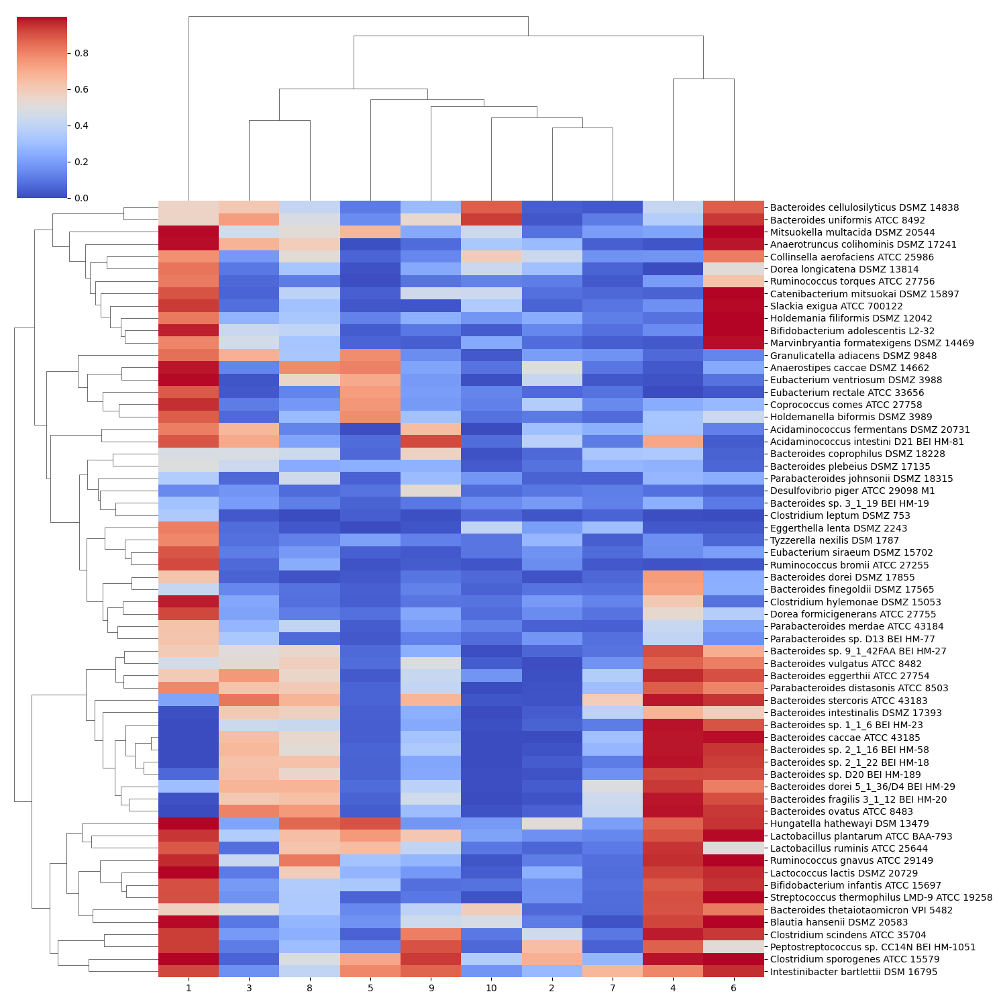

In [22]:
plt_ = sns.clustermap(df_speciesMetab_cluster.iloc[:, range(nclusts)], \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)

In [23]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
date_ = '20231005'
date_meeting = '20231005'
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')

plt_ = sns.clustermap(df_speciesMetab_cluster.iloc[:, range(nclusts)], \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True, \
                      cbar_kws={'shrink': 0.1, 'label': 'consumption'})

plt_.ax_heatmap.set_xlabel('Metabolite clusters')
plt_.ax_heatmap.set_ylabel('strains', labelpad=-1)

plt.setp(plt_.ax_heatmap.get_xticklabels(), rotation=0, fontsize=15)
plt.setp(plt_.ax_heatmap.get_yticklabels(), rotation=0, fontsize=15)
                           
# plt.subplots_adjust(left=0.2)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'cluster_metabs_consumption_SI.pdf'))

plt_.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
plt.close()

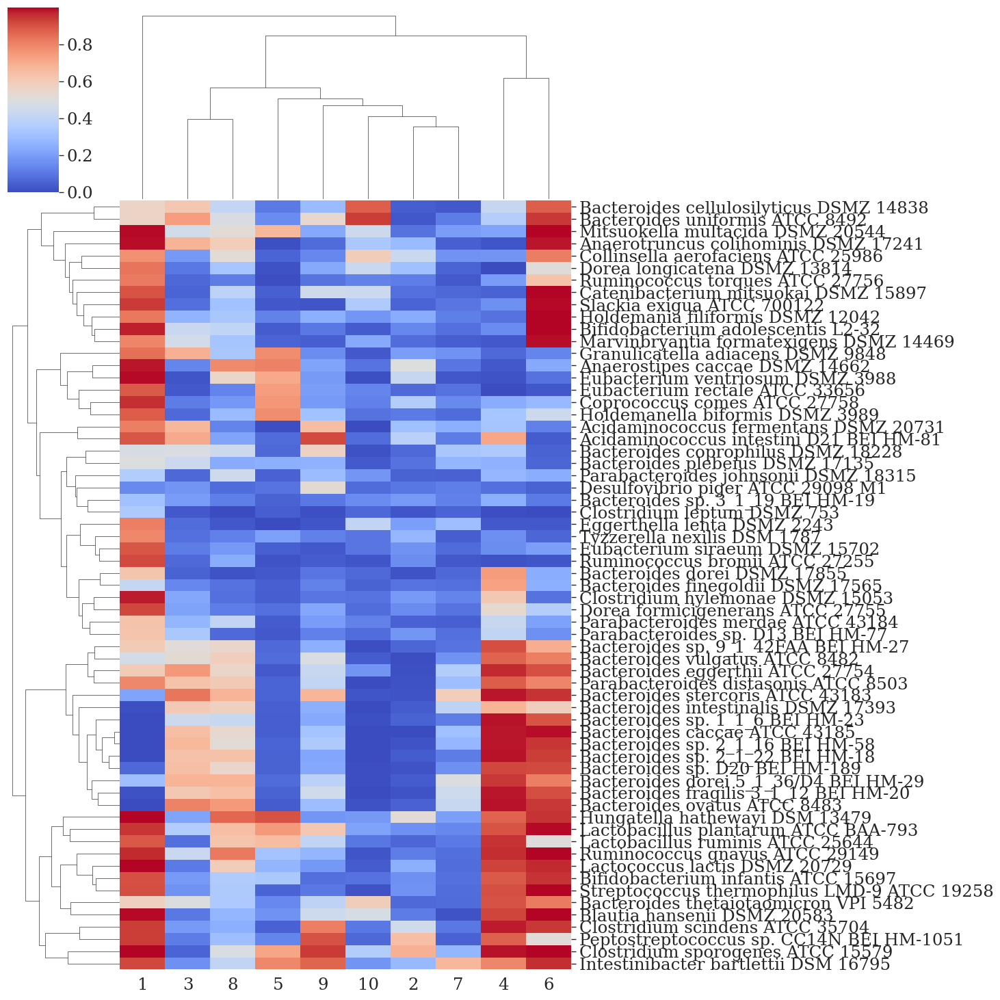

In [24]:
plt_ = sns.clustermap(df_speciesMetab_cluster.iloc[:, range(nclusts)], \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)

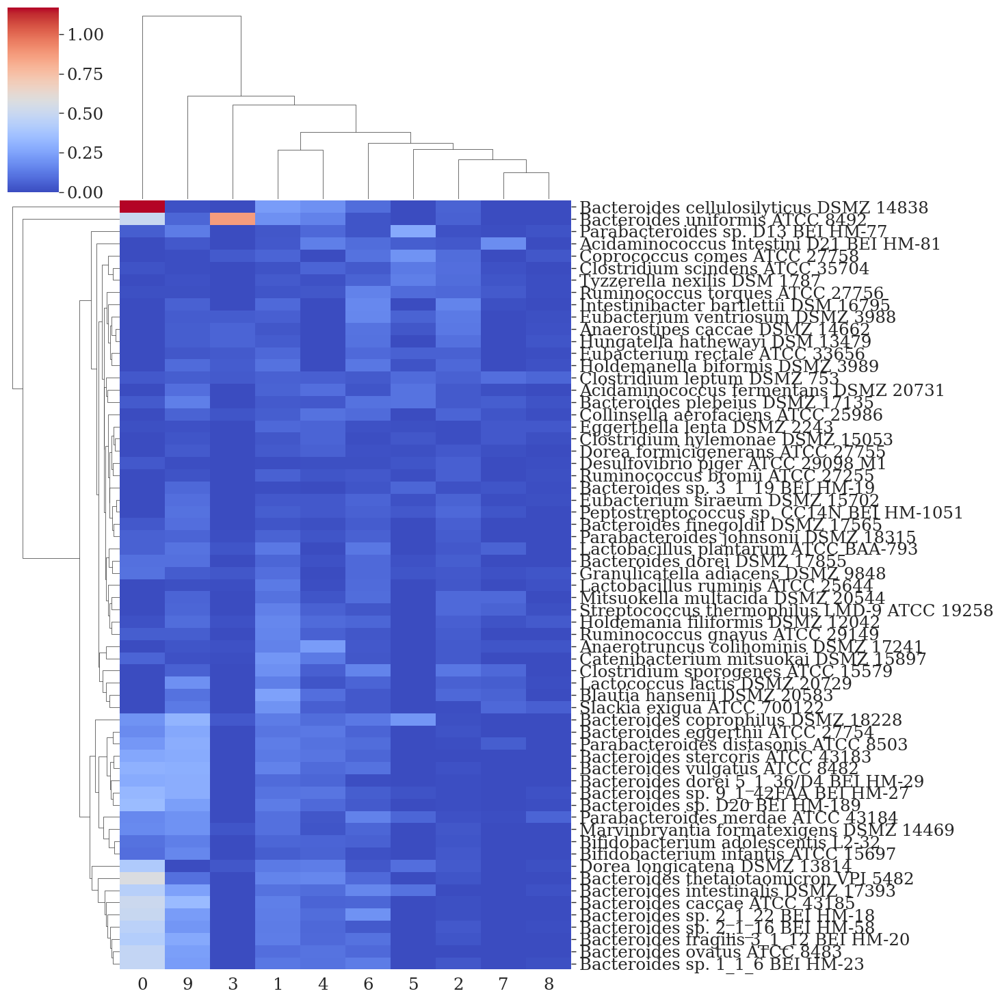

In [25]:
df_tmp = df_speciesMetab_prod_cluster.copy()
for col_ in df_tmp.columns.values:
    df_tmp[col_] = np.log10(1 + df_tmp[col_].values)
plt_ = sns.clustermap(df_tmp.iloc[:, range(nclusts)], \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)

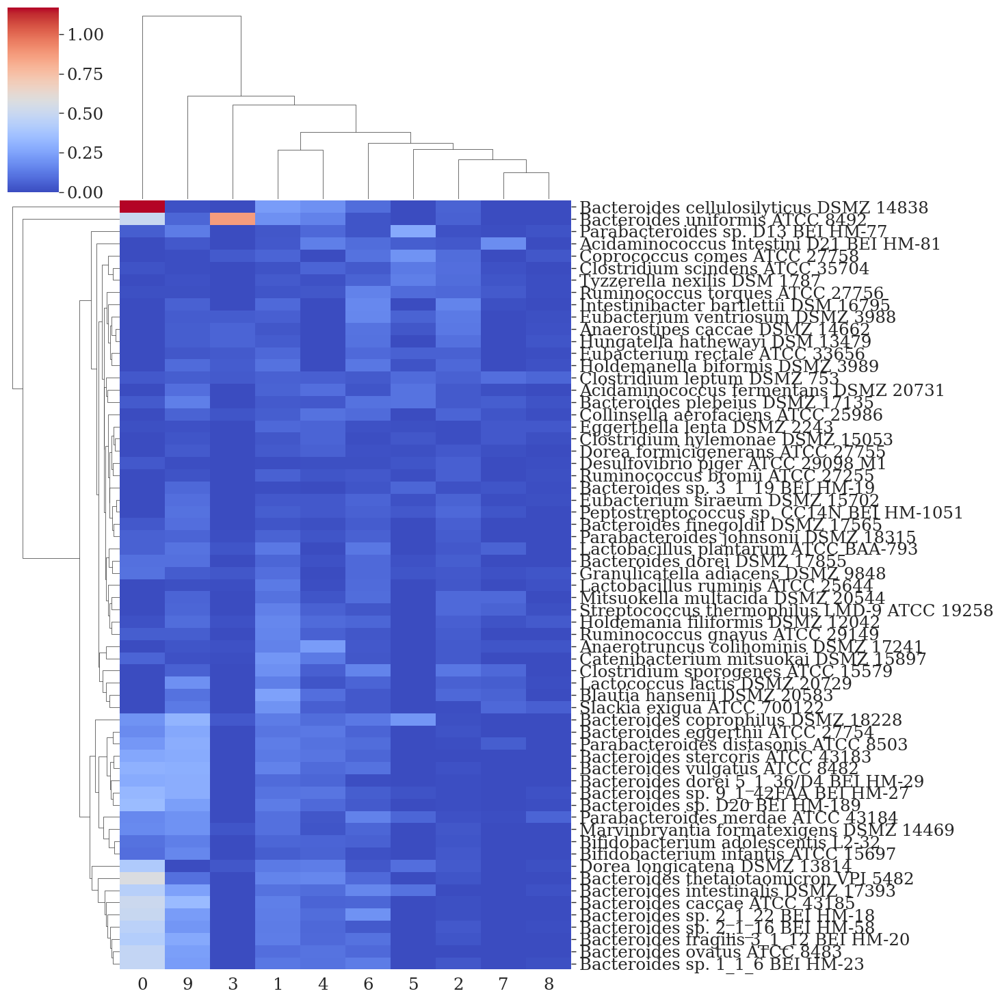

In [26]:
df_tmp = df_speciesMetab_prod_cluster.copy()
for col_ in df_tmp.columns.values:
    df_tmp[col_] = np.log10(1 + df_tmp[col_].values)
plt_ = sns.clustermap(df_tmp.iloc[:, range(nclusts)], \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True)

In [27]:
df_metabs_clusters.iloc[92, :]
# df_metabs_clusters.shape

cluster_labels                         92
cluster_counts                          1
cluster_metab_IDs                   [218]
cluser_metab_names    [PYROGLUTAMIC ACID]
Name: 92, dtype: object

In [28]:
# normalized clustering
df_metabs_clusters.iloc[range(nclusts), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE..."
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ..."
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI..."
3,3,5,"[35, 80, 93, 95, 106]","[3-UREIDOPROPIONATE, ASPARAGINE, GLUTAMINE, GL..."
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,..."
5,5,5,"[15, 73, 96, 100, 135]","[1-METHYLADENOSINE, ADENOSINE, GUANOSINE, INOS..."
6,6,24,"[10, 12, 14, 31, 33, 36, 42, 44, 50, 51, 52, 5...","[CARNITINE, PHOSPHOCHOLINE, TRYPTOPHAN ETHYL E..."
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC..."
8,8,6,"[4, 8, 63, 79, 84, 126]","[THREONINE_0, CINNAMALDEHYDE, 1-AMINOCYCLOPROP..."
9,9,14,"[2, 9, 11, 17, 21, 29, 32, 49, 58, 60, 61, 75,...","[OLEIC ACID, SPERMIDINE, AMINO(4-HYDROXYCYCLOH..."


In [29]:
df_metabs_clusters_table = df_metabs_clusters.copy()
df_metabs_clusters_table = df_metabs_clusters_table.drop(columns=['cluster_metab_IDs'])
for row_ in np.arange(df_metabs_clusters.shape[0]):
    df_metabs_clusters_table.iloc[row_, 2] = \

SyntaxError: unexpected EOF while parsing (3319719607.py, line 4)

In [32]:
separator_ = ', '
separator_.join(df_metabs_clusters_table.iloc[1, 2])


'NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ACID, LACTIC ACID, LINOLEIC ACID, IS_PROGESTERONE-D9_1, 1-METHYLGUANIDINE, 2-AMINOBENZOIC ACID, ARGININE, CAPRYLOYL GLYCINE, CYSTATHIONINE, DETHIOBIOTIN, GLUTAMIC ACID, HIPPURIC ACID, METHIONINE, N6-(DELTA2-ISOPENTENYL)-ADENINE, OPHTHALMIC ACID, PANTOTHENIC ACID, PHENYLALANINE, PROLINE, RIBOFLAVIN, SPERMINE, THREONINE_1, TRYPTAMINE, TYROSINE'

In [29]:
df_metabs_clusters.iloc[range(nclusts), :]

,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names
0,0,5,"[70, 72, 114, 125, 134]","[5'-METHYLTHIOADENOSINE, ADENINE, NICOTINAMIDE..."
1,1,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ..."
2,2,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI..."
3,3,5,"[35, 80, 93, 95, 106]","[3-UREIDOPROPIONATE, ASPARAGINE, GLUTAMINE, GL..."
4,4,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,..."
5,5,5,"[15, 73, 96, 100, 135]","[1-METHYLADENOSINE, ADENOSINE, GUANOSINE, INOS..."
6,6,24,"[10, 12, 14, 31, 33, 36, 42, 44, 50, 51, 52, 5...","[CARNITINE, PHOSPHOCHOLINE, TRYPTOPHAN ETHYL E..."
7,7,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC..."
8,8,6,"[4, 8, 63, 79, 84, 126]","[THREONINE_0, CINNAMALDEHYDE, 1-AMINOCYCLOPROP..."
9,9,14,"[2, 9, 11, 17, 21, 29, 32, 49, 58, 60, 61, 75,...","[OLEIC ACID, SPERMIDINE, AMINO(4-HYDROXYCYCLOH..."


In [29]:
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
id_sort = np.argsort(-abun_avg_pass_3)
species_ = 1
for species_, species_name in enumerate(species_names):
    # species_name = species_names[species_]
    print(species_name)
    x = []
    y = []
    passage_list = []
    rep_list = []
    for passage_ in range(1, num_passages):
        for rep_ in range(num_bioRep):
            tmp1 = df_speciesAbun_prev_mdl.loc[species_, f'p{passage_ + 1}_r{rep_}']
            tmp2 = df_speciesAbun_ratio_mdl.loc[species_, f'p{passage_ + 1}_r{rep_}']
            if tmp2 > 0:
                x += [tmp1]
                y += [df_speciesAbun_ratio_mdl.loc[species_, f'p{passage_ + 1}_r{rep_}']]
                passage_list += [passage_]
                rep_list += [rep_]
    x = np.array(x)
    y = np.array(y)
    passage_list = np.array(passage_list)
    rep_list = np.array(rep_list)


    sns.set(style="white", font='serif')

    # Set the font scale and context
    sns.set_context("paper", rc={"font.size": 15,"axes.labelsize": 15, \
                                'xtick.labelsize' : 13, \
                                'ytick.labelsize' : 13})

    fig, ax = plt.subplots(1, 3, figsize=(12, 4), sharex=True, sharey=True)
    fig.suptitle(species_name)
    for rep_ in range(num_bioRep):
        id_tmp = np.where(np.array(rep_list) == rep_)[0]
        plt_ = sns.scatterplot(x=np.log10(x[id_tmp]), y=np.log10(y[id_tmp]), \
                            hue=passage_list[id_tmp] + 1, palette='colorblind', \
                                ax=ax[rep_], hue_order=np.arange(2, 7))
        ax[rep_].set_xlabel(r'$\log_{10}\left(x_{i - 1}\right)$')

        passage_ = 1
        id_tmp1 = np.where((np.array(passage_list) == passage_) & (np.array(rep_list) == rep_))[0]
        ax[rep_].annotate(f'p{passage_ + 1}', \
                            xy=(np.log10(x[id_tmp1[0]]), np.log10(y[id_tmp1[0]])), \
                        xytext=(np.log10(x[id_tmp1[0]]) + 0.01, np.log10(y[id_tmp1[0]]) - 0.01), \
                        fontsize=13)
        ax[rep_].axhline(y=0, linestyle='dashed', color='black')
        for passage_ in range(1, num_passages - 1):
            id_tmp1 = np.where((np.array(passage_list) == passage_) & (np.array(rep_list) == rep_))[0]
            id_tmp2 = np.where((np.array(passage_list) == passage_ + 1) & (np.array(rep_list) == rep_))[0]
            if (len(id_tmp1) > 0) and (len(id_tmp2) > 0):
                ax[rep_].plot([np.log10(x[id_tmp1[0]]), np.log10(x[id_tmp2[0]])], \
                            [np.log10(y[id_tmp1[0]]), np.log10(y[id_tmp2[0]])], color='black')
                delta_x = np.log10(x[id_tmp2[0]]) - np.log10(x[id_tmp1[0]])
                delta_y = np.log10(y[id_tmp2[0]]) - np.log10(y[id_tmp1[0]])
                arrow_props = dict(facecolor='black', edgecolor='black', arrowstyle='->', \
                                shrinkA=0, shrinkB=0)
                # ax[rep_].annotate("", \
                #                   xy=((np.log10(x[id_tmp1[0]]) + \
                #                        np.log10(x[id_tmp2[0]])) / 2, \
                #                       (np.log10(y[id_tmp1[0]]) + \
                #                        np.log10(y[id_tmp2[0]])) / 2), \
                #                 xytext=((np.log10(x[id_tmp1[0]]) + \
                #                        np.log10(x[id_tmp2[0]])) / 2 + 0.1, \
                #                         (np.log10(y[id_tmp1[0]]) + \
                #                        np.log10(y[id_tmp2[0]])) / 2 - 0.1), \
                #                 arrowprops=arrow_props, \
                #                 fontsize=13, rotation=np.degrees(np.arctan2(delta_y, delta_x)))
                ax[rep_].annotate(f'p{passage_ + 2}', \
                                xy=(np.log10(x[id_tmp2[0]]), np.log10(y[id_tmp2[0]])), \
                                xytext=(np.log10(x[id_tmp2[0]]) + 0.01, np.log10(y[id_tmp2[0]]) - 0.01), \
                                fontsize=13)
                # print(np.degrees(np.arctan2(delta_y, delta_x)))
        # # Connect two points with a line
        # plt.plot([point1['sepal_length'], point2['sepal_length']],
        #         [point1['sepal_width'], point2['sepal_width']], color='black')

        # # Add arrowhead at the end of the line
        # plt.annotate('', xy=point2, xytext=point1, arrowprops=dict(arrowstyle='->', color='black'))


    ax[0].set_ylabel(r'$\log_{10}\left(\frac{x_i}{x_{i - 1}}\right)$')

    date_meeting = "20231201"
    save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                            'predictions', 'leaveOneOut', \
                                            f'{date_meeting}_for_paper_' + \
                                            f'_Ri_fit_dynamic_with_production' + \
                                            f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                            f'_pass_1to2', 'figures_paper'))
    if not os.path.exists(save_dir):
    # Create a new directory because it does not exist
        os.makedirs(save_dir)

    file_save = os.path.abspath(os.path.join(save_dir, 
                                                f'20231201_log_ratio_vs_log_xi_species_{species_name}.png'))

    # plt_.savefig(file_save, \
    #                     dpi=300, transparent=False, facecolor="white")

    # file_save = os.path.abspath(os.path.join(save_dir, 
    #                                             f'predicted_vs_observed_abundance.pdf'))

    fig.figure.savefig(file_save, \
                        dpi=300, transparent=False, facecolor="white")
    plt.close()

Acidaminococcus-fermentans-DSM-20731
Acidaminococcus-intestini-D21
Anaerostipes-caccae-DSM-14662
Anaerotruncus-colihominis-DSM-17241
Bacteroides-caccae-ATCC-43185
Bacteroides-cellulosilyticus-DSM-14838
Bacteroides-coprophilus-DSM-18228
Bacteroides-dorei-5-1-36-D4
Bacteroides-dorei-DSM-17855
Bacteroides-eggerthii-DSM-20697
Bacteroides-finegoldii-DSM-17565
Bacteroides-fragilis-3-1-12
Bacteroides-intestinalis-DSM-17393
Bacteroides-ovatus-ATCC-8483
Bacteroides-plebeius-DSM-17135
Bacteroides-thetaiotaomicron-1-1-6
Bacteroides-fragilis-2-1-16
Bacteroides-sp-2-1-22
Bacteroides-sp-3-1-19
Bacteroides-sp-9-1-42FAA
Bacteroides-sp-D2
Bacteroides-stercoris-ATCC-43183
Bacteroides-thetaiotaomicron-VPI-5482
Bacteroides-uniformis-ATCC-8492
Bacteroides-vulgatus-ATCC-8482
Bifidobacterium-adolescentis-L2-32
Bifidobacterium-longum-ATCC-15697
Blautia-hansenii-DSM-20583
Catenibacterium-mitsuokai-DSM-15897
Clostridium-hylemonae-DSM-15053
Clostridium-leptum-DSM-753
Clostridium-scindens-ATCC-35704
Clostridium-s

# fit Ri dynamic for passage 1 -> 2 transition

## first fit Ri without productiion

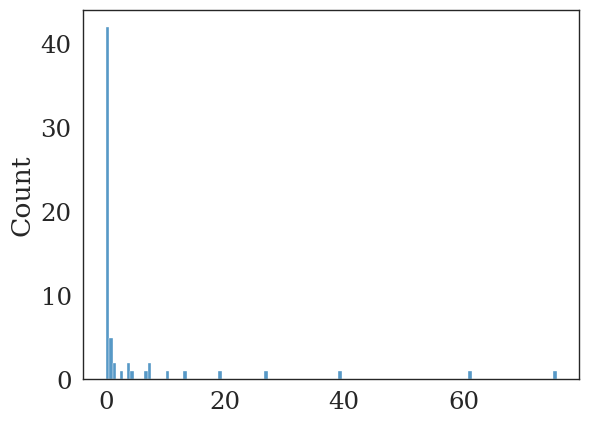

In [37]:
x = df_speciesAbun_ratio_mdl.iloc[:, 0].values
plt_ = sns.histplot(x)

0.006095063760344296


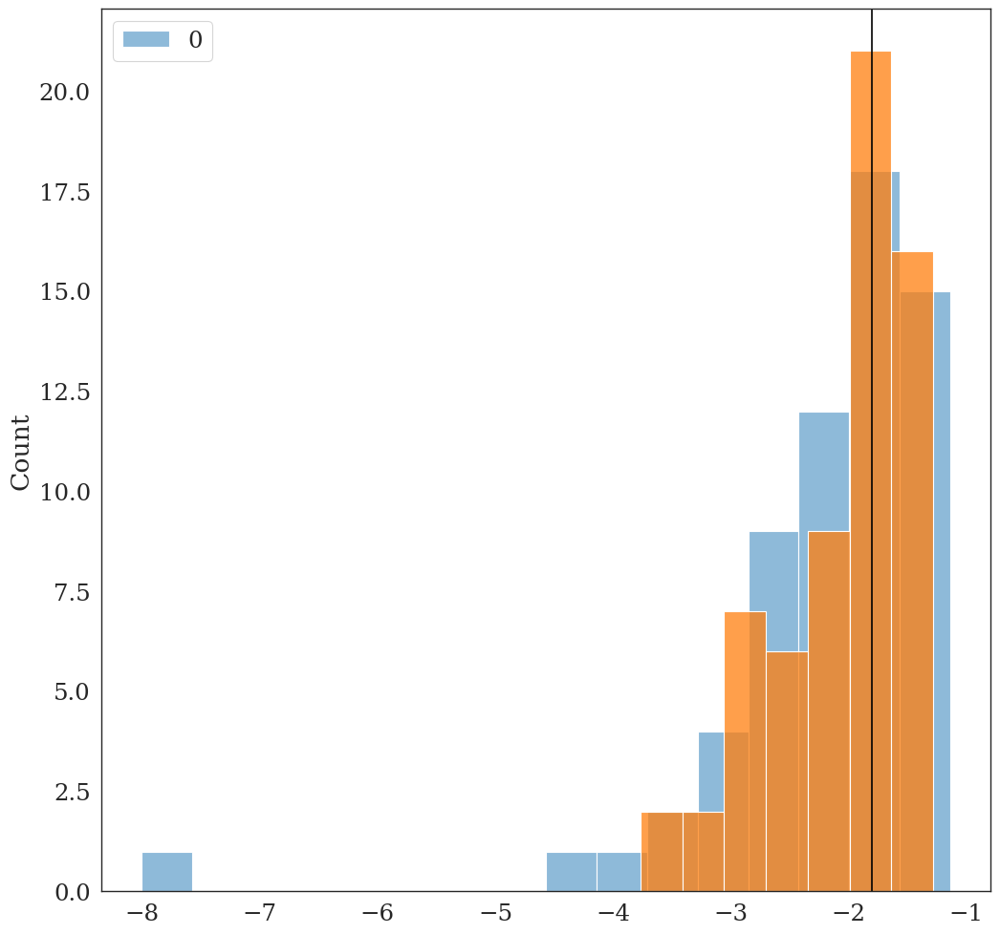

In [388]:
x = df_speciesAbun_inoc.values
plt_ = sns.histplot(np.log10(x))
plt_.axvline(x=np.log10(1 / num_species), c="black")
print(10**np.mean(np.log10(x)))
alpha_ = 0.76 * np.ones(num_species)
x_sample = np.random.dirichlet(alpha_, 1)
x_sample[x_sample <= 1e-8] = 1e-8
plt_ = sns.histplot(np.log10(x_sample.flatten()))

In [27]:
df_speciesAbun_sim = pd.DataFrame()
header_new = create_abundance_header_new(num_bioRep=3, num_passages=7)
count_ = 0
for rep_ in np.arange(3):
    for pass_ in np.arange(7):
        if pass_ == 0:
            df_speciesAbun_sim[header_new[count_]] = (1 / num_species) * np.ones(num_species)
#             df_speciesAbun_sim[header_new[count_]] = \
#                 df_speciesAbun_inoc.iloc[:, 0].values
        else:
            df_speciesAbun_sim[header_new[count_]] = \
                df_speciesAbun_mdl.iloc[:, (pass_ - 1) + 6 * rep_].values
        count_ += 1

In [28]:
df_speciesAbun_ratio_sim = pd.DataFrame()
df_speciesAbun_prev_sim = pd.DataFrame()
df_speciesAbun_next_sim = pd.DataFrame()
count_ = 0
num_bioRep = 3
passages_ = np.array(['p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7'])
reps_ = np.array(['r0', 'r1', 'r2'])
brep_vec = list(range(num_bioRep))
thresh_zero = 1e-8
for rep_ in reps_:
    for pass_ in range(1, len(passages_)):
        col_1 = passages_[pass_ - 1] + "_" + rep_
        col_2 = passages_[pass_] + "_" + rep_

        df_speciesAbun_prev_sim[col_2] = df_speciesAbun_sim[col_1].values
        df_speciesAbun_next_sim[col_2] = df_speciesAbun_sim[col_2].values

        array_1 = np.array(df_speciesAbun_sim[col_2].values / df_speciesAbun_sim[col_1].values)
        array_2 = np.array(df_speciesAbun_sim[col_2].values)
        array_3 = np.array(df_speciesAbun_sim[col_1].values)
        df_speciesAbun_ratio_sim[col_2] = array_1.copy()
        id_ = np.where((array_3 == thresh_zero) & (array_2 == thresh_zero))[0]
#         id_ = np.where((array_2 == thresh_zero))[0]
#         id_ = np.where(array_1 == 1)[0]

        if len(id_) > 0:
            df_speciesAbun_ratio_sim.iloc[id_, count_] = -1
            rep_alt = list(set(reps_) - set([rep_]))
            ratio_vec = []
            for id_tmp in id_:
                abun_alt_ratio = []
                for rep__ in rep_alt:
                    col_1_ = passages_[pass_ - 1] + "_" + rep__
                    col_2_ = passages_[pass_] + "_" + rep__
                    val_1 = df_speciesAbun_sim[col_1_].values[id_tmp]
                    val_2 = df_speciesAbun_sim[col_2_].values[id_tmp]
                    if (val_1 != thresh_zero) | (val_2 != thresh_zero):
                        abun_alt_ratio.append(val_2 / val_1)

        count_ += 1

In [29]:
df_speciesAbun_sim

,p1_r0,p2_r0,p3_r0,p4_r0,p5_r0,p6_r0,p7_r0,p1_r1,p2_r1,p3_r1,...,p5_r1,p6_r1,p7_r1,p1_r2,p2_r2,p3_r2,p4_r2,p5_r2,p6_r2,p7_r2
0,0.015873,3.180398e-02,1.232587e-04,6.704587e-06,1.964384e-05,2.923860e-04,6.674918e-04,0.015873,3.751642e-02,1.509550e-04,...,3.247537e-03,2.649064e-02,6.867454e-03,0.015873,4.710307e-02,6.802839e-04,2.546092e-04,1.037398e-04,1.317724e-04,2.793396e-04
1,0.015873,2.174619e-01,2.143392e-01,3.034948e-01,2.783072e-01,2.449287e-01,2.852345e-01,0.015873,2.173035e-01,1.983694e-01,...,3.043407e-01,2.476548e-01,2.650648e-01,0.015873,1.584982e-01,2.045056e-01,2.981957e-01,3.043595e-01,3.054243e-01,2.736223e-01
2,0.015873,3.053745e-02,7.893345e-02,4.178763e-02,1.553076e-02,2.513826e-02,7.685045e-03,0.015873,3.393580e-02,9.603154e-03,...,1.700029e-02,2.282783e-02,6.528065e-03,0.015873,3.420288e-02,4.933659e-03,1.727806e-02,7.776625e-03,6.220632e-02,8.449614e-03
3,0.015873,7.641646e-05,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,0.015873,9.158013e-05,1.277543e-06,...,1.000000e-08,8.028099e-08,1.000000e-08,0.015873,7.865395e-05,7.965272e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.575602e-07
4,0.015873,7.633257e-02,2.583468e-05,3.153010e-06,3.753517e-06,2.028774e-06,2.470496e-06,0.015873,7.271956e-02,4.145522e-05,...,6.430825e-06,1.331149e-06,1.814534e-06,0.015873,6.615639e-02,1.118852e-04,1.638908e-04,2.938171e-06,5.076057e-06,2.018581e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.015873,2.173690e-03,2.872359e-02,6.526354e-03,3.918121e-03,4.421267e-03,5.849030e-03,0.015873,2.753382e-03,1.592495e-02,...,5.560732e-03,6.711834e-03,1.701515e-03,0.015873,3.988645e-03,9.989043e-03,3.268566e-03,2.781552e-03,6.712029e-03,5.861230e-03
59,0.015873,2.727114e-04,9.021892e-05,2.965475e-06,4.094933e-06,1.882528e-05,1.090201e-05,0.015873,2.477832e-04,3.475236e-05,...,1.792223e-05,6.581487e-05,4.976816e-05,0.015873,2.444333e-04,3.758673e-05,4.198384e-05,3.080377e-05,1.010013e-05,8.941000e-05
60,0.015873,1.776472e-03,2.920661e-03,1.421295e-03,2.227100e-03,1.239252e-03,9.714653e-04,0.015873,1.821668e-03,2.737841e-03,...,7.986064e-04,3.016710e-04,3.447447e-04,0.015873,2.231052e-03,2.531160e-03,3.458196e-03,4.025108e-03,1.840863e-03,1.107381e-03
61,0.015873,3.879986e-07,1.000000e-08,8.662693e-08,1.000000e-08,1.000000e-08,1.000000e-08,0.015873,6.177283e-07,1.000000e-08,...,1.459906e-07,1.000000e-08,1.000000e-08,0.015873,8.277804e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08


In [33]:
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = 10**np.mean(np.log10(abun_avg_pass_3), axis=1)

In [33]:
df_tmp = pd.DataFrame(data={'strain' : species_names, \
                            'abundance' : abun_avg_pass_3 / np.sum(abun_avg_pass_3)})
id_order = np.argsort(-abun_avg_pass_3)

In [34]:
species_names

array(['Acidaminococcus-fermentans-DSM-20731',
       'Acidaminococcus-intestini-D21', 'Anaerostipes-caccae-DSM-14662',
       'Anaerotruncus-colihominis-DSM-17241',
       'Bacteroides-caccae-ATCC-43185',
       'Bacteroides-cellulosilyticus-DSM-14838',
       'Bacteroides-coprophilus-DSM-18228', 'Bacteroides-dorei-5-1-36-D4',
       'Bacteroides-dorei-DSM-17855', 'Bacteroides-eggerthii-DSM-20697',
       'Bacteroides-finegoldii-DSM-17565', 'Bacteroides-fragilis-3-1-12',
       'Bacteroides-intestinalis-DSM-17393',
       'Bacteroides-ovatus-ATCC-8483', 'Bacteroides-plebeius-DSM-17135',
       'Bacteroides-thetaiotaomicron-1-1-6',
       'Bacteroides-fragilis-2-1-16', 'Bacteroides-sp-2-1-22',
       'Bacteroides-sp-3-1-19', 'Bacteroides-sp-9-1-42FAA',
       'Bacteroides-sp-D2', 'Bacteroides-stercoris-ATCC-43183',
       'Bacteroides-thetaiotaomicron-VPI-5482',
       'Bacteroides-uniformis-ATCC-8492',
       'Bacteroides-vulgatus-ATCC-8482',
       'Bifidobacterium-adolescentis-L2-32

In [33]:
species_names_abbr = []
for species_ in species_names:
    tmp = species_.split("-")
    out_ = f'{tmp[0][:2]}-{tmp[1][:3]}'
    species_names_abbr.append(out_)
species_names_abbr[7] = f'{species_names_abbr[7]} 5-1-36-D4'
species_names_abbr[8] = f'{species_names_abbr[8]} DSM-17855'
species_names_abbr[11] = f'{species_names_abbr[11]} 3-1-12'
species_names_abbr[16] = f'{species_names_abbr[16]} 2-1-16'
species_names_abbr[17] = f'{species_names_abbr[17]} 2-1-22'
species_names_abbr[18] = f'{species_names_abbr[18]} 3-1-19'
species_names_abbr[19] = f'{species_names_abbr[19]} 9-1-42FAA'
species_names_abbr[20] = f'{species_names_abbr[20]} D2'
species_names_abbr[55] = f'{species_names_abbr[55]} D13'
species_names_abbr[56] = f'{species_names_abbr[56]} CC14N-HM-1051'

In [30]:
species_names_abbr = []
for species_ in species_names:
    tmp = species_.split("-")
    out_ = f'{tmp[0][:1]}. {tmp[1]}'
    species_names_abbr.append(out_)
species_names_abbr[7] = f'{species_names_abbr[7]} 5-1-36-D4'
species_names_abbr[8] = f'{species_names_abbr[8]} DSM-17855'
species_names_abbr[11] = f'{species_names_abbr[11]} 3-1-12'
species_names_abbr[16] = f'{species_names_abbr[16]} 2-1-16'
species_names_abbr[17] = f'{species_names_abbr[17]} 2-1-22'
species_names_abbr[18] = f'{species_names_abbr[18]} 3-1-19'
species_names_abbr[19] = f'{species_names_abbr[19]} 9-1-42FAA'
species_names_abbr[20] = f'{species_names_abbr[20]} D2'
species_names_abbr[55] = f'{species_names_abbr[55]} D13'
species_names_abbr[56] = f'{species_names_abbr[56]} CC14N-HM-1051'
species_names_abbr = np.array(species_names_abbr, dtype=object)

In [31]:
species_names_abbr

array(['A. fermentans', 'A. intestini', 'A. caccae', 'A. colihominis',
       'B. caccae', 'B. cellulosilyticus', 'B. coprophilus',
       'B. dorei 5-1-36-D4', 'B. dorei DSM-17855', 'B. eggerthii',
       'B. finegoldii', 'B. fragilis 3-1-12', 'B. intestinalis',
       'B. ovatus', 'B. plebeius', 'B. thetaiotaomicron',
       'B. fragilis 2-1-16', 'B. sp 2-1-22', 'B. sp 3-1-19',
       'B. sp 9-1-42FAA', 'B. sp D2', 'B. stercoris',
       'B. thetaiotaomicron', 'B. uniformis', 'B. vulgatus',
       'B. adolescentis', 'B. longum', 'B. hansenii', 'C. mitsuokai',
       'C. hylemonae', 'C. leptum', 'C. scindens', 'C. sporogenes',
       'C. aerofaciens', 'C. comes', 'D. piger', 'D. formicigenerans',
       'D. longicatena', 'E. lenta', 'E. rectale', 'E. siraeum',
       'E. ventriosum', 'G. adiacens', 'H. biformis', 'H. filiformis',
       'H. hathewayi', 'I. bartlettii', 'L. plantarum', 'L. ruminis',
       'L. lactis', 'M. formatexigens', 'M. multacida', 'P. distasonis',
       'P. joh

In [42]:
df_strains_abbr = pd.DataFrame(data={'Strain Abbr.' : species_names_abbr, \
                                     'Strain' : species_names})
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'data', \
                                        'jin_pollard'))
df_strains_abbr.to_csv(os.path.abspath(os.path.join(save_dir, \
                                                    f'species_names_abbr.csv')), \
                                                        index=False)

In [40]:
df_strains_abbr

,Strain Abbr.,Strain
0,A. fermentans,Acidaminococcus-fermentans-DSM-20731
1,A. intestini,Acidaminococcus-intestini-D21
2,A. caccae,Anaerostipes-caccae-DSM-14662
3,A. colihominis,Anaerotruncus-colihominis-DSM-17241
4,B. caccae,Bacteroides-caccae-ATCC-43185
...,...,...
58,R. gnavus,Ruminococcus-gnavus-ATCC-29149
59,R. torques,Ruminococcus-torques-ATCC-27756
60,S. exigua,Slackia-exigua-ATCC-700122
61,S. thermophilus,Streptococcus-thermophilus-LMD-9


In [407]:
## fit dynamic Ri for passage transition 1->2 and 2->3 for clustered metabs
# date_ = '20230912'
# date_meeting = '20230912'

#use normalized clustering of metabs
# date_ = '20231005'
# date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

# date_ = '20231026'
# date_meeting = '20231026'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]


num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
num_passages = 7
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + \
    list(pass_keep + 2 * (num_passages - 1))
pass_rm = [0, 2, 3, 4, 5]
Ri_dynamic_obj, A_train, b_train = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_sim, \
                                df_speciesAbun_next_sim, \
                                df_speciesAbun_ratio_sim, p_vec_new, \
                                file_save, num_passages=6, pass_rm=pass_rm, num_brep=3, \
                                get_prod=True, B_alone=0.1, \
                                df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                prod_use_prev=False, use_dilution_term=True, \
                                dilution_factor=15000, use_avg_for_prod=False, \
                                return_raw_data=True, check_ratio_dir=False)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001
count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5
count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7


In [195]:
date_ = '20231015'
date_meeting = '20231015'
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
with open(file_save, "rb") as file_:
     Ri_dynamic_obj = pickle.load(file_)

In [37]:
def get_corr_func_f(sens_obj_all_prod, pass_=2):
    b_ = range(3)
    x_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_obs']
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x_f = x_f.flatten()
    y_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred']
    thresh_zero = 1e-8
    y_f[y_f <= thresh_zero] = thresh_zero
    x_f[x_f <= thresh_zero] = thresh_zero

    x = np.zeros((num_species))
    x_min = np.zeros((num_species))
    x_max = np.zeros((num_species))
    y = np.zeros((num_species))
    for species_ in range(num_species):
        id_ = np.array([0, 1, 2]) + species_ * 3
        x[species_] = np.exp(np.mean(np.log(x_f[id_])))
        x_min[species_] = np.min(x_f[id_])
        x_max[species_] = np.max(x_f[id_])
        y[species_] = np.exp(np.mean(np.log(y_f[id_])))

    x = np.log10(x)
    x_min = np.log10(x_min)
    x_max = np.log10(x_max)
    y = np.log10(y)
    corr_ = scipy.stats.pearsonr(x, y)
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    return corr_, abs_mean_error

In [66]:
# RMSE and correlation as a function of f (1 - p)
# df_pred_vs_obsdate_ = '20230605'
date_ = '20230912'
date_meeting = '20230912'

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'
num_iter = 100

num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
# date_ = '20230921'
# date_meeting = '20230921'
# date_ = '20230927'
# date_meeting = '20230927'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

RMSE_over_f = np.zeros(len(p_vec_new))
corr_over_f = np.zeros(len(p_vec_new))

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'loop = {count_p}, p = {p_tmp}')
    Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
    Ri_fit = {0: Ri_avg}
    # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
    sens_obj_all_prod_tmp, RMSE_obj_all_prod_tmp = \
        blindly_pred_abun_growth([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                 df_speciesAbun_inoc.copy(), df_speciesAbun_mdl.copy(), \
                                 df_speciesAbun_prev_mdl.copy(), \
                                 df_speciesAbun_ratio_mdl.copy(), \
                                 Ri_fit, "dummy", "dummy", \
                                 "dummy", num_passages=6, num_iter=100, \
                                 thresh_zero=1e-10, Ri_ss=False, plot_=False, \
                                 save_data_obj=False, \
                                 return_sensitivity_ana=True, \
                                 get_prod=True, B_alone=0.1, \
                                 df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                 prod_use_prev=False, use_dilution=True, dilution_factor=15000, \
                                 use_avg_for_prod=False)
    pass_ = 2
#     RMSE_over_f[count_p] = RMSE_obj_all_prod[pass_]["abundance"]
    corr_tmp, rmse_tmp = get_corr_func_f(sens_obj_all_prod_tmp, pass_=pass_)
    corr_over_f[count_p] = corr_tmp[0]
    RMSE_over_f[count_p] = rmse_tmp

loop = 0, p = 0.001
loop = 1, p = 0.01
loop = 2, p = 0.05
loop = 3, p = 0.06
loop = 4, p = 0.07
loop = 5, p = 0.08
loop = 6, p = 0.09
loop = 7, p = 0.1
loop = 8, p = 0.125
loop = 9, p = 0.15
loop = 10, p = 0.175
loop = 11, p = 0.2
loop = 12, p = 0.3
loop = 13, p = 0.4
loop = 14, p = 0.5
loop = 15, p = 0.55
loop = 16, p = 0.6
loop = 17, p = 0.65
loop = 18, p = 0.7


In [40]:
f_ = np.arange(1000, 290, step=-25) / 1000
f_[0] = 1.0 - 0.001
p_vec_new_long = 1 - f_
p_vec_new_long

array([0.001, 0.025, 0.05 , 0.075, 0.1  , 0.125, 0.15 , 0.175, 0.2  ,
       0.225, 0.25 , 0.275, 0.3  , 0.325, 0.35 , 0.375, 0.4  , 0.425,
       0.45 , 0.475, 0.5  , 0.525, 0.55 , 0.575, 0.6  , 0.625, 0.65 ,
       0.675, 0.7  ])

In [144]:
# new Ri for getting linear f_ for RMSE/cc vs f_ plot
## fit dynamic Ri for passage transition 1->2 and 2->3 for clustered metabs
# date_ = '20230912'
# date_meeting = '20230912'

#use normalized clustering of metabs
# date_ = '20231005'
# date_meeting = '20231005'

date_ = '20231025'
date_meeting = '20231025'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
f_ = np.arange(1000, 290, step=-25) / 1000
f_[0] = 1.0 - 0.001
p_vec_new_long = 1 - f_


num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
num_passages = 7
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + \
    list(pass_keep + 2 * (num_passages - 1))
pass_rm = [0, 2, 3, 4, 5]
Ri_dynamic_obj, A_train, b_train = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_sim.iloc[:, id_keep], \
                                df_speciesAbun_next_sim.iloc[:, id_keep], \
                                df_speciesAbun_ratio_sim.iloc[:, id_keep], p_vec_new_long, \
                                file_save, num_passages=6, pass_rm=pass_rm, num_brep=3, \
                                get_prod=True, B_alone=0.1, \
                                df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                prod_use_prev=False, use_dilution_term=True, \
                                dilution_factor=15000, use_avg_for_prod=False, \
                                return_raw_data=True, check_ratio_dir=False)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.0010000000000000009
count = 1, p_tmp = 0.025000000000000022
count = 2, p_tmp = 0.050000000000000044
count = 3, p_tmp = 0.07499999999999996
count = 4, p_tmp = 0.09999999999999998
count = 5, p_tmp = 0.125
count = 6, p_tmp = 0.15000000000000002
count = 7, p_tmp = 0.17500000000000004
count = 8, p_tmp = 0.19999999999999996
count = 9, p_tmp = 0.22499999999999998
count = 10, p_tmp = 0.25
count = 11, p_tmp = 0.275
count = 12, p_tmp = 0.30000000000000004
count = 13, p_tmp = 0.32499999999999996
count = 14, p_tmp = 0.35
count = 15, p_tmp = 0.375
count = 16, p_tmp = 0.4
count = 17, p_tmp = 0.42500000000000004
count = 18, p_tmp = 0.44999999999999996
count = 19, p_tmp = 0.475
count = 20, p_tmp = 0.5
count = 21, p_tmp = 0.525
count = 22, p_tmp = 0.55
count = 23, p_tmp = 0.575
count = 24, p_tmp = 0.6
count = 25, p_tmp = 0.625
count = 26, p_tmp = 0.65
count = 27, p_tmp = 0.675
count = 28, p_tmp = 0.7


In [145]:
# for plotting RMSE/cc vs f
# RMSE and correlation as a function of f (1 - p)
# df_pred_vs_obsdate_ = '20230605'

date_ = '20231025'
date_meeting = '20231025'

# date_ = '20231015'
# date_meeting = '20231015'
num_iter = 100

num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
# date_ = '20230921'
# date_meeting = '20230921'
# date_ = '20230927'
# date_meeting = '20230927'
f_ = np.arange(1000, 290, step=-25) / 1000
f_[0] = 1.0 - 0.001
p_vec_new_long = 1 - f_
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

RMSE_over_f = np.zeros(len(p_vec_new_long))
corr_over_f = np.zeros(len(p_vec_new_long))

for count_p, p_tmp in enumerate(p_vec_new_long):
    print(f'loop = {count_p}, p = {p_tmp}')
    Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
    Ri_fit = {0: Ri_avg}
    # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
    sens_obj_all_prod_tmp, RMSE_obj_all_prod_tmp = \
        blindly_pred_abun_growth([p_vec_new_long[count_p]], df_speciesMetab_tmp, \
                                 df_speciesAbun_inoc.copy(), df_speciesAbun_mdl.copy(), \
                                 df_speciesAbun_prev_mdl.copy(), \
                                 df_speciesAbun_ratio_mdl.copy(), \
                                 Ri_fit, "dummy", "dummy", \
                                 "dummy", num_passages=6, num_iter=100, \
                                 thresh_zero=1e-9, Ri_ss=False, plot_=False, \
                                 save_data_obj=False, \
                                 return_sensitivity_ana=True, \
                                 get_prod=True, B_alone=0.1, \
                                 df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                 prod_use_prev=False, use_dilution=True, dilution_factor=15000, \
                                 use_avg_for_prod=False)
    pass_ = 2
#     RMSE_over_f[count_p] = RMSE_obj_all_prod[pass_]["abundance"]
    corr_tmp, rmse_tmp = get_corr_func_f(sens_obj_all_prod_tmp, pass_=pass_)
    corr_over_f[count_p] = corr_tmp[0]
    RMSE_over_f[count_p] = rmse_tmp

loop = 0, p = 0.0010000000000000009
loop = 1, p = 0.025000000000000022
loop = 2, p = 0.050000000000000044
loop = 3, p = 0.07499999999999996
loop = 4, p = 0.09999999999999998
loop = 5, p = 0.125
loop = 6, p = 0.15000000000000002
loop = 7, p = 0.17500000000000004
loop = 8, p = 0.19999999999999996
loop = 9, p = 0.22499999999999998
loop = 10, p = 0.25
loop = 11, p = 0.275
loop = 12, p = 0.30000000000000004
loop = 13, p = 0.32499999999999996
loop = 14, p = 0.35
loop = 15, p = 0.375
loop = 16, p = 0.4
loop = 17, p = 0.42500000000000004
loop = 18, p = 0.44999999999999996
loop = 19, p = 0.475
loop = 20, p = 0.5
loop = 21, p = 0.525
loop = 22, p = 0.55
loop = 23, p = 0.575
loop = 24, p = 0.6
loop = 25, p = 0.625
loop = 26, p = 0.65
loop = 27, p = 0.675
loop = 28, p = 0.7


/tmp/ipykernel_8260/1811866251.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)


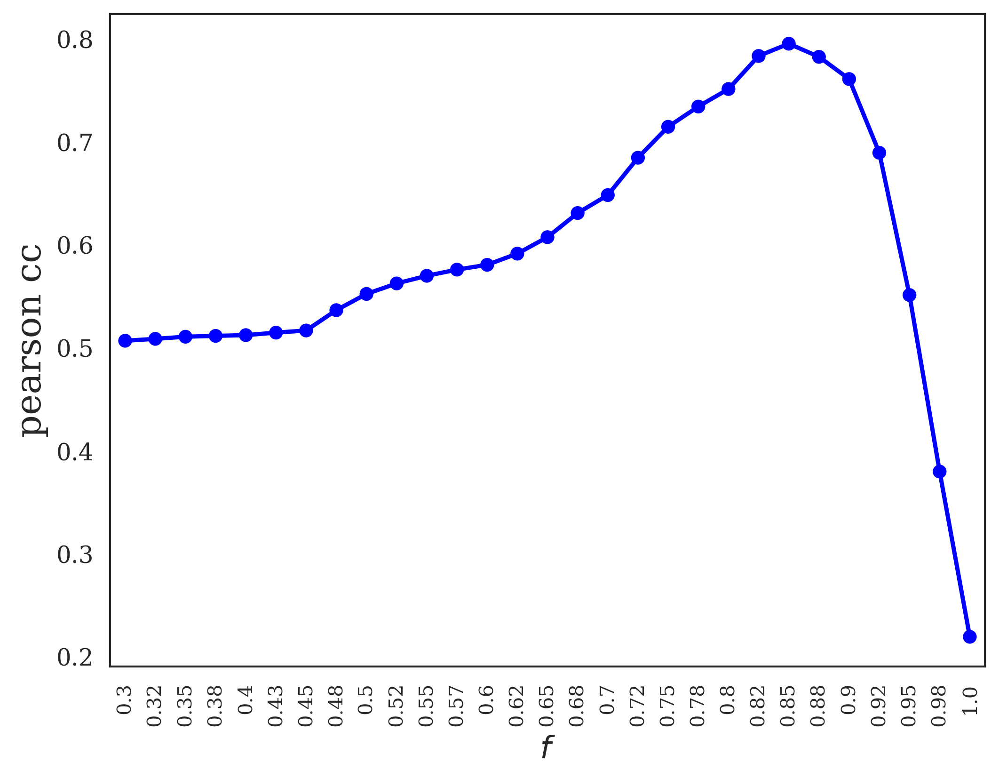

In [146]:
date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8, 6), dpi=300)

x = 1 - np.array(p_vec_new_long)
x = np.round(x, 2)
# x = np.hstack((x, x))
y1 = RMSE_over_f
y2 = corr_over_f
y = np.hstack((y1, y2))
type_ = ['RMSE'] * len(y1) + ['pearson cc'] * len(y2)
plt_ = sns.pointplot(x=x, y=y2, color='blue')
plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)
plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=10, rotation=90)
# plt_.set_ylabel('RMSE', color='blue', fontsize=18)
plt_.set_ylabel('pearson cc', fontsize=18)
plt_.set_xlabel(r'$f$', fontsize=16)

# ax2 = plt.twinx()
# plt_ = sns.pointplot(x=x, y=y2, ax=ax2, color='red')
# ax2.set_ylabel('pearson cc', color='red', fontsize=18)
# ax2.set_yticklabels(plt_.get_yticklabels(), fontsize=12)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))

#####################save figure to PDF
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'RMSE_cc_vs_f.svg'))

# plt_.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(plt_.figure)

/tmp/ipykernel_11728/3255371634.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)
/tmp/ipykernel_11728/3255371634.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels(plt_.get_yticklabels(), fontsize=12)


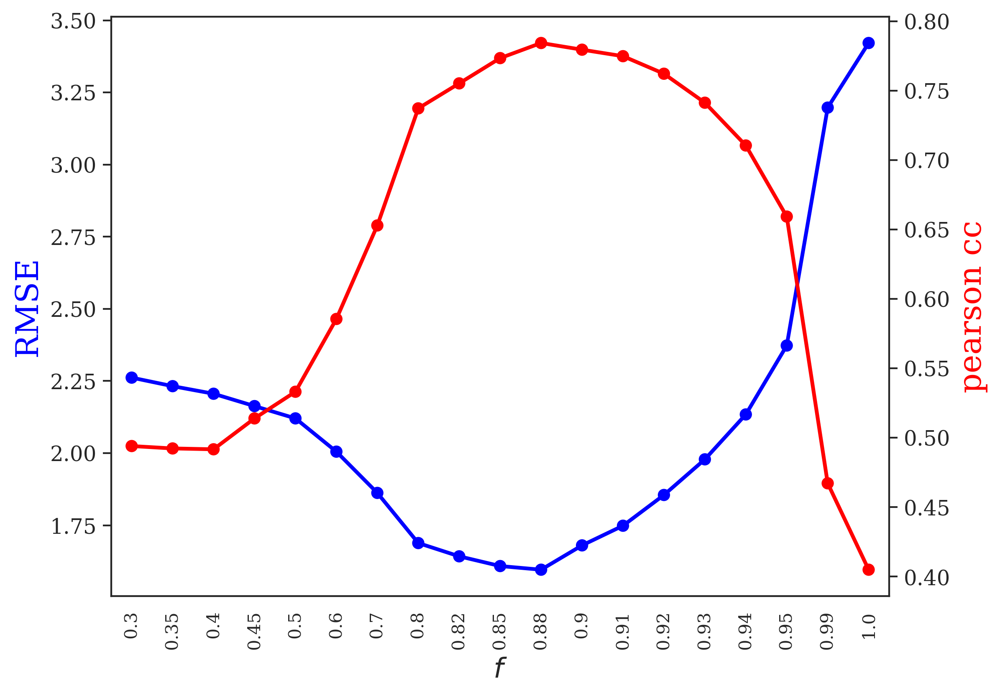

In [67]:
date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8, 6), dpi=300)

x = 1 - np.array(p_vec_new)
x = np.round(x, 2)
# x = np.hstack((x, x))
y1 = RMSE_over_f
y2 = corr_over_f
y = np.hstack((y1, y2))
type_ = ['RMSE'] * len(y1) + ['pearson cc'] * len(y2)
plt_ = sns.pointplot(x=x, y=y1, color='blue')
plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)
plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=10, rotation=90)
plt_.set_ylabel('RMSE', color='blue', fontsize=18)
plt_.set_xlabel(r'$f$', fontsize=16)

ax2 = plt.twinx()
plt_ = sns.pointplot(x=x, y=y2, ax=ax2, color='red')
ax2.set_ylabel('pearson cc', color='red', fontsize=18)
ax2.set_yticklabels(plt_.get_yticklabels(), fontsize=12)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))

#####################save figure to PDF
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'RMSE_cc_vs_f.svg'))

plt_.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
# plt.close(plt_.figure)

In [71]:
1 - np.array(p_vec_new)
id_p_keep = np.array([0, 7, 11, 12, 13, 14, 16, 18])
1 - np.array(p_vec_new)[id_p_keep]

array([0.999, 0.9  , 0.8  , 0.7  , 0.6  , 0.5  , 0.4  , 0.3  ])

/tmp/ipykernel_11728/788879156.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)


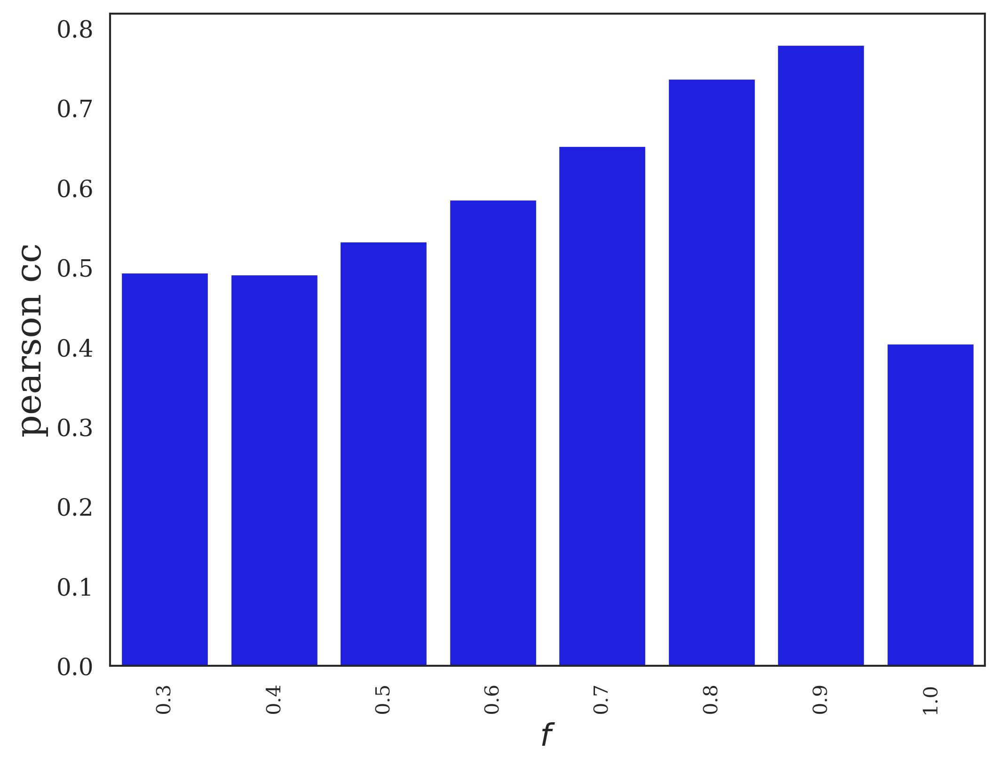

In [76]:
date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8, 6), dpi=300)

p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]

id_p_keep = np.array([0, 7, 11, 12, 13, 14, 16, 18])

x = 1 - np.array(p_vec_new)
x = np.round(x[id_p_keep], 2)
# x = np.hstack((x, x))
y1 = RMSE_over_f[id_p_keep]
y2 = corr_over_f[id_p_keep]
y = np.hstack((y1, y2))
type_ = ['RMSE'] * len(y1) + ['pearson cc'] * len(y2)
plt_ = sns.barplot(x=x, y=y2, color='blue')
plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)
plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=10, rotation=90)
plt_.set_ylabel('pearson cc', fontsize=18)
plt_.set_xlabel(r'$f$', fontsize=16)

# ax2 = plt.twinx()
# plt_ = sns.pointplot(x=x, y=y2, ax=ax2, color='red')
# ax2.set_ylabel('pearson cc', color='red', fontsize=18)
# ax2.set_yticklabels(plt_.get_yticklabels(), fontsize=12)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))

#####################save figure to PDF
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'cc_vs_f_barplot.svg'))

plt_.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
# plt.close(plt_.figure)

In [73]:
x

array([1.  , 0.99, 0.95, 0.94, 0.93, 0.92, 0.91, 0.9 , 0.88, 0.85, 0.82,
       0.8 , 0.7 , 0.6 , 0.5 , 0.45, 0.4 , 0.35, 0.3 ])

PearsonRResult(statistic=0.026551409756775786, pvalue=0.7168559358491748)


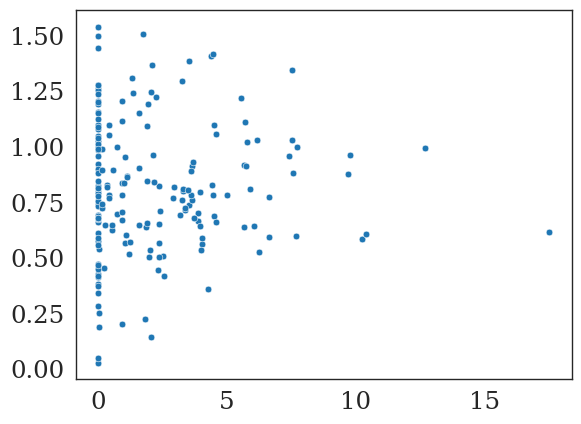

In [56]:
id_m = 23
x = A_train[7][:, id_m]
y = b_train[7]
plt_ = sns.scatterplot(x=x, y=y)
print(scipy.stats.pearsonr(x, y))

In [408]:
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'].copy()

count_p = 7
Ri_0_init_new = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()

In [409]:
# fit Ri with production and iteratively find B_alone
num_iter = 100
B_alone_iter = {}

## fit dynamic Ri for passage transition 1->2 and 2->3 for clustered metabs
# date_ = '20230912'
# date_meeting = '20230912'

# #use normalized clustering of metabs
# date_ = '20230921'
# date_meeting = '20230921'
# date_ = '20230927'
# date_meeting = '20230927'
# date_ = '20231006'
# date_meeting = '20231006'

date_ = '20231015'
date_meeting = '20231015'

# date_ = '20231026'
# date_meeting = '20231026'


rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]

date_ = '20231015'
date_meeting = '20231015'

n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new_tmp = [p_vec_new[count_p]]


num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'_iterate_Balone.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
num_passages = 7
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [0, 2, 3, 4, 5]

RMSE_Balone_iterate = {}
id_species_keep = np.arange(df_speciesAbun_mdl.shape[0])

for iter_ in range(num_iter):
    print(f'iteration = {iter_}')
    if iter_ == 0:
#         B_alone_cur = np.median(abun_alone)
        Ri_avg = Ri_0_init_new.copy()
        B_alone_cur = get_B_alone_func(Ri_avg, \
                                       df_speciesMetab_cluster.iloc[id_species_keep, :].copy())
#         B_alone_cur = 0.1 * np.ones(num_species)
    else:
        Ri_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
        B_alone_cur = B_alone_iter[iter_ - 1].copy()
    
    
    Ri_dynamic_obj, A_train, b_train = fit_dynamic_Ri(df_speciesMetab_tmp.iloc[id_species_keep, :], \
                                    df_speciesAbun_prev_sim.iloc[:, id_keep], \
                                    df_speciesAbun_next_sim.iloc[:, id_keep], \
                                    df_speciesAbun_ratio_sim.iloc[:, id_keep], p_vec_new_tmp, \
                                    file_save, num_passages=6, pass_rm=pass_rm, save_data=False, \
                                    num_brep=3, \
                                    get_prod=True, B_alone=B_alone_cur, \
                                    df_speciesMetab_prod=df_speciesMetab_prod_tmp.iloc[id_species_keep, :], \
                                    prod_use_prev=False, use_avg_for_prod=False, \
                                    return_raw_data=True, check_ratio_dir=False)
    Ri_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
#     a_tmp, A_mat, b_vec = fit_dynamic_Ri(df_speciesMetab_tmp, \
#                                     df_speciesAbun_prev_sim.iloc[:, id_keep], \
#                                     df_speciesAbun_next_sim.iloc[:, id_keep], \
#                                     df_speciesAbun_ratio_sim.iloc[:, id_keep], p_vec_new_tmp, \
#                                     file_save, num_passages=6, pass_rm=pass_rm, save_data=False, \
#                                     num_brep=3, \
#                                     get_prod=False, B_alone=B_alone_cur, \
#                                     df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
#                                     prod_use_prev=False, use_avg_for_prod=True, \
#                                     return_raw_data=True, check_ratio_dir=False, \
#                                         mode_Ri=False, Ri=Ri_avg.copy())
    
#     abun_alone_tmp = np.zeros((num_species))

#     for species_ in range(num_species):
#         abun_alone_tmp[species_] = np.sum(Ri_avg[0] * np.array(df_speciesMetab_cluster.iloc[species_, :].values))
    B_alone_iter[iter_] = get_B_alone_func(Ri_avg, \
                                           df_speciesMetab_cluster.iloc[id_species_keep, :].copy())
#     B_alone_iter[iter_] = 1 / (a_tmp['Ri_noMicrocosm_dynamicAll_fit_joint'][0] + 1e-10)
    RMSE_Balone_iterate[iter_] = \
        get_RMSE_Balone_func(df_speciesMetab_cluster.iloc[id_species_keep, :], \
                             df_speciesMetab_prod_cluster.iloc[id_species_keep, :], \
                             p_vec_new_tmp, 0, \
                        Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'].copy(), \
                        df_speciesAbun_inoc.iloc[id_species_keep, :], \
                             df_speciesAbun_mdl, df_speciesAbun_prev_mdl, \
                        df_speciesAbun_ratio_mdl, B_alone_cur, num_passages=6, \
                        use_dilution=True)
Ri_dynamic_obj['B_alone_iter'] = B_alone_iter
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

iteration = 0
count = 0, p_tmp = 0.1
iteration = 1
count = 0, p_tmp = 0.1
iteration = 2
count = 0, p_tmp = 0.1
iteration = 3
count = 0, p_tmp = 0.1
iteration = 4
count = 0, p_tmp = 0.1
iteration = 5
count = 0, p_tmp = 0.1
iteration = 6
count = 0, p_tmp = 0.1
iteration = 7
count = 0, p_tmp = 0.1
iteration = 8
count = 0, p_tmp = 0.1
iteration = 9
count = 0, p_tmp = 0.1
iteration = 10
count = 0, p_tmp = 0.1
iteration = 11
count = 0, p_tmp = 0.1
iteration = 12
count = 0, p_tmp = 0.1
iteration = 13
count = 0, p_tmp = 0.1
iteration = 14
count = 0, p_tmp = 0.1
iteration = 15
count = 0, p_tmp = 0.1
iteration = 16
count = 0, p_tmp = 0.1
iteration = 17
count = 0, p_tmp = 0.1
iteration = 18
count = 0, p_tmp = 0.1
iteration = 19
count = 0, p_tmp = 0.1
iteration = 20
count = 0, p_tmp = 0.1
iteration = 21
count = 0, p_tmp = 0.1
iteration = 22
count = 0, p_tmp = 0.1
iteration = 23
count = 0, p_tmp = 0.1
iteration = 24
count = 0, p_tmp = 0.1
iteration = 25
count = 0, p_tmp = 0.1
iteration = 26
count =

In [178]:
df_speciesMetab_prod_cluster.iloc[id_species_keep, :].shape

(56, 98)

In [402]:
len(id_species_keep)

56

In [215]:
df_speciesAbun_prev_sim.shape
pass_ = 5
np.arange(pass_ * 3, (pass_ + 1) * 3)

array([15, 16, 17])

In [29]:
date_ = '20231015'
date_meeting = '20231015'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'_iterate_Balone.pickle'))

with open(file_save, "rb") as file_:
     Ri_dynamic_obj = pickle.load(file_) 

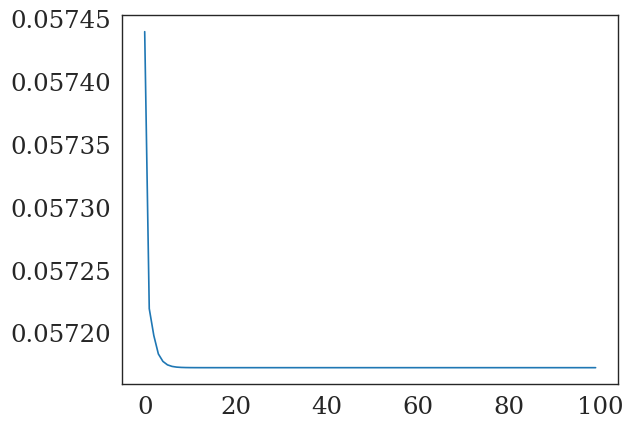

In [32]:
num_iter = 100
vals_ = np.zeros(num_iter)
id_ = 27
for iter_ in range(num_iter):
    vals_[iter_] = (B_alone_iter[iter_][id_])
plt_ = sns.lineplot(x=range(num_iter), y=vals_)

In [31]:
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']
B_alone_iter = Ri_dynamic_obj['B_alone_iter']

In [415]:
# Ri_0 = Ri_noMicrocosm_dynamicAll_fit_joint[0].copy()

In [33]:
# evalute Ri with production and iterative Balone
# date_ = '20230927'
# date_meeting = '20230927'
# date_ = '20230912'
# date_meeting = '20230912'

# date_ = '20231005'
# date_meeting = '20231005' 
date_ = '20231015'
date_meeting = '20231015'

# date_ = '20231026'
# date_meeting = '20231026'

num_iter = 100
num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
count_p = 7
# num_iter = 20
p_vec_new_tmp = [p_vec_new[count_p]]
count_p = 0

RMSE_mat_full = np.zeros((num_passages - 1, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
# Ri_fit = {0: Ri_pass1.copy()}
# Ri_0 = {0: Ri_inoc.copy()}
abun_alone = get_B_alone_func(Ri_avg, df_speciesMetab_cluster.iloc[id_species_keep, :].copy())
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all_prod, RMSE_obj_all_prod = \
    blindly_pred_abun_growth([p_vec_new_tmp[count_p]], \
                             df_speciesMetab_tmp.iloc[id_species_keep, :], \
                             df_speciesAbun_inoc.iloc[id_species_keep, :].copy(), \
                             df_speciesAbun_mdl.copy(), \
                             df_speciesAbun_prev_mdl.copy(), \
                             df_speciesAbun_ratio_mdl.copy(), \
                             Ri_fit.copy(), "dummy", "dummy", \
                             "dummy", num_passages=6, num_iter=100, \
                             thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                             save_data_obj=False, \
                             return_sensitivity_ana=True, \
                             get_prod=True, B_alone=B_alone_iter[num_iter - 2].copy(), \
                             df_speciesMetab_prod=df_speciesMetab_prod_tmp.iloc[id_species_keep, :], \
                             prod_use_prev=False, use_dilution=True, dilution_factor=15000, \
                             use_avg_for_prod=False, Ri_0=None)
for pass_ in range(num_passages - 1):
    RMSE_mat_full[pass_, 0] = RMSE_obj_all_prod[pass_]["abundance"]
    RMSE_mat_full[pass_, 1] = RMSE_obj_all_prod[pass_]["growth_ratio"]

In [241]:
B_alone_iter[num_iter - 2].shape

(63,)

In [40]:
RMSE_mat_full

array([[1.37872759, 1.35077109],
       [1.51271821, 0.89922494],
       [1.77124421, 1.19632398],
       [2.01500362, 1.40132652],
       [2.27557445, 1.3384019 ]])

In [34]:
RMSE_mat_full

array([[1.37872759, 1.35077109],
       [1.51271821, 0.89922494],
       [1.77124421, 1.19632398],
       [2.01500362, 1.40132652],
       [2.27557445, 1.3384019 ]])

In [42]:
# save metabolite clusters in decreasing order of Ri

In [48]:
df_metabs_clusters_table = df_metabs_clusters.copy()
df_metabs_clusters_table = df_metabs_clusters_table.drop(columns=['cluster_metab_IDs'])
df_metabs_clusters_table['cluster_metabs_names'] = [''] * df_metabs_clusters_table.shape[0]
separator_ = ', '
for row_ in np.arange(df_metabs_clusters.shape[0]):
    df_metabs_clusters_table['cluster_metabs_names'][row_] = separator_.join(df_metabs_clusters_table.iloc[row_, 2])
df_metabs_clusters_table['Ri'] = Ri_avg.copy()

/tmp/ipykernel_6284/3145994472.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_metabs_clusters_table['cluster_metabs_names'][row_] = separator_.join(df_metabs_clusters_table.iloc[row_, 2])


In [50]:
df_metabs_clusters_table = df_metabs_clusters_table.drop(columns=['cluser_metab_names'])
id_order = np.argsort(-Ri_avg)
df_metabs_clusters_table = df_metabs_clusters_table.iloc[id_order, :].copy()

In [56]:
df_metabs_clusters_table['cluster_labels'] = df_metabs_clusters_table['cluster_labels'].values + 1

In [60]:
df_metabs_clusters_table['Ri'].values

array([8.96936850e-02, 6.43526909e-02, 4.46155174e-02, 4.24549181e-02,
       3.57880195e-02, 2.28571508e-02, 2.22803333e-02, 1.91285366e-02,
       1.90298137e-02, 1.28303659e-02, 1.27829113e-02, 1.22929759e-02,
       1.21886790e-02, 8.17456293e-03, 7.80439576e-03, 6.97792870e-03,
       6.42445986e-03, 6.34064792e-03, 6.03668044e-03, 5.05226235e-03,
       4.33956216e-03, 4.27593958e-03, 3.86357133e-03, 2.71080892e-03,
       2.70241533e-03, 2.29491852e-03, 1.84730922e-03, 1.11114264e-03,
       9.18841259e-04, 6.60217592e-04, 4.31621220e-04, 3.98781001e-04,
       2.77371999e-04, 1.96684328e-04, 8.37369540e-05, 3.25176093e-05,
       9.50940319e-06, 6.47202607e-06, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
      

In [59]:
date_meeting = "20231015"
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'metab_clusters_IDs_Ri.csv'))
df_metabs_clusters_table.to_csv(file_save, index=False)

# get Ri for RMSE standard deviation computation

In [219]:
num_iter = 100
Ri_dist = get_RMSE_against_uniform_sd(p_vec_new_tmp, \
                                df_speciesMetab_cluster, \
                                df_speciesMetab_prod_cluster, \
                                B_alone_iter[num_iter - 2].copy(), \
                                df_speciesAbun_prev_sim, \
                                df_speciesAbun_next_sim, \
                                df_speciesAbun_ratio_sim, \
                                n_repeats=100)

count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1


/home/tarunm3/Desktop/work/maslov_lab/crn_gut_microbiome/src/utils.py:475: RuntimeWarning: invalid value encountered in power
  tmp_ratio = tmp_ratio**(p_tmp_new)


count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, p_tmp = 0.1
count = 0, 

In [227]:
Ri_new = np.zeros_like(Ri_dist[0])
for s_ in np.arange(len(Ri_dist)):
    x = Ri_dist[s_].copy()
    x[x <= 1e-12] = 1e-12
    Ri_new += np.log10(x)
Ri_new /= len(Ri_dist)
Ri_new = 10**Ri_new

In [231]:
len(np.where(Ri_new >= 1e-10)[0])

56

In [238]:
# evalute Ri with production and iterative Balone
# date_ = '20230927'
# date_meeting = '20230927'
# date_ = '20230912'
# date_meeting = '20230912'

# date_ = '20231005'
# date_meeting = '20231005'
date_ = '20231015'
date_meeting = '20231015'
num_iter = 100
num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
RMSE_dist_pass = np.zeros((num_passages - 1, len(Ri_dist)))

for s_ in np.arange(len(Ri_dist)):
    print(f'loop = {s_}')
    count_p = 7
    # num_iter = 20
    p_vec_new_tmp = [p_vec_new[count_p]]
    count_p = 0
    Ri_avg = Ri_dist[s_].copy()
    Ri_fit = {0: Ri_avg}
    # Ri_fit = {0: Ri_pass1.copy()}
    # Ri_0 = {0: Ri_inoc.copy()}
    abun_alone = get_B_alone_func(Ri_avg, df_speciesMetab_cluster.copy())
    # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
    sens_obj_all_dist, _ = \
        blindly_pred_abun_growth([p_vec_new_tmp[count_p]], df_speciesMetab_tmp, \
                                 df_speciesAbun_inoc.copy(), df_speciesAbun_mdl.copy(), \
                                 df_speciesAbun_prev_mdl.copy(), \
                                 df_speciesAbun_ratio_mdl.copy(), \
                                 Ri_fit.copy(), "dummy", "dummy", \
                                 "dummy", num_passages=6, num_iter=10, \
                                 thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                 save_data_obj=False, \
                                 return_sensitivity_ana=True, \
                                 get_prod=True, B_alone=B_alone_iter[num_iter - 2].copy(), \
                                 df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                 prod_use_prev=False, use_dilution=True, dilution_factor=15000, \
                                 use_avg_for_prod=False, Ri_0=None)
    id_species_rep = np.arange(num_species) * 3
    for pass_ in range(num_passages - 1):
        x = sens_obj_all_dist[pass_]['df_speciesAbun_next_pred'][id_species_rep].copy()
        x[x <= 1e-8] = 1e-8
        RMSE_dist_pass[pass_, s_] = \
            np.sqrt(np.mean(np.power(np.log10(x[id_strains_sensitive]) - \
                                     np.log10(1 / len(id_strains_sensitive)), 2)))

In [242]:
print(f'passage 3 RMSE sd against uniform')
print(np.sqrt(np.var(RMSE_dist_pass[2, :])))

passage 3 RMSE against uniform
0.33871288677797406


In [244]:
np.sqrt(np.mean(np.power(np.log10(abun_pred[id_strains_sensitive]) - \
                         np.log10(1 / len(id_strains_sensitive)), 2)))

3.406944110854096

array([2.67186004, 2.81783687, 2.10667702, 2.04665293, 2.81783687,
       2.62806126, 2.5157451 , 2.80338555, 2.78499923, 3.01545033,
       3.01545033, 2.67186004, 2.45646256, 2.81494183, 2.25604211,
       2.78499923, 2.78499923, 2.5157451 , 2.25604211, 2.76985829,
       2.70330529, 2.04665293, 2.45646256, 1.97687928, 2.70330529,
       2.72504067, 2.10473144, 2.64725679, 2.45646256, 2.10667702,
       2.45646256, 2.62806126, 2.04665293, 2.25604211, 2.78499923,
       2.76985829, 3.01545033, 2.81783687, 2.76985829, 2.64725679,
       2.10667702, 2.08045218, 2.25604211, 3.02683903, 2.10667702,
       2.67186004, 2.64725679, 2.08045218, 2.67186004, 2.62470896,
       1.91423211, 2.81494183, 2.10667702, 2.72504067, 2.67186004,
       2.04665293, 3.01545033, 2.25604211, 3.02683903, 1.91423211,
       2.99077383, 2.10667702, 2.53253237, 2.80338555, 2.72504067,
       2.67186004, 2.64725679, 1.91423211, 1.97687928, 3.02683903,
       2.62470896, 2.99077383, 1.97687928, 2.45646256, 3.02683

In [56]:
sens_obj_all_prod[2]['df_speciesAbun_next_pred']

array([4.42417114e-06, 4.42417114e-06, 4.42417114e-06, 1.93371168e-01,
       1.93371168e-01, 1.93371168e-01, 4.03170744e-02, 4.03170744e-02,
       4.03170744e-02, 1.36291723e-08, 1.36291723e-08, 1.36291723e-08,
       9.51292903e-09, 9.51292903e-09, 9.51292903e-09, 4.86545185e-07,
       4.86545185e-07, 4.86545185e-07, 8.92951584e-09, 8.92951584e-09,
       8.92951584e-09, 9.28397560e-06, 9.28397560e-06, 9.28397560e-06,
       1.00762267e-04, 1.00762267e-04, 1.00762267e-04, 2.15469060e-03,
       2.15469060e-03, 2.15469060e-03, 2.28210893e-06, 2.28210893e-06,
       2.28210893e-06, 2.91696816e-03, 2.91696816e-03, 2.91696816e-03,
       3.89194505e-05, 3.89194505e-05, 3.89194505e-05, 1.45270874e-02,
       1.45270874e-02, 1.45270874e-02, 7.22860812e-06, 7.22860812e-06,
       7.22860812e-06, 1.87894057e-05, 1.87894057e-05, 1.87894057e-05,
       6.02196680e-05, 6.02196680e-05, 6.02196680e-05, 2.13370388e-02,
       2.13370388e-02, 2.13370388e-02, 1.46884979e-04, 1.46884979e-04,
      

In [233]:
RMSE_mat_full

array([[1.36675082, 1.3426993 ],
       [2.1024907 , 1.39023261],
       [2.53041478, 1.50818021],
       [2.83172747, 1.62481706],
       [2.8582381 , 1.28840052]])

In [191]:
B_alone_iter[num_iter - 2]
df_speciesAbun_inoc

,inoculum
Acidaminococcus fermentans DSMZ 20731,0.009492
Acidaminococcus intestini D21 BEI HM-81,0.007298
Anaerostipes caccae DSMZ 14662,0.044081
Anaerotruncus colihominis DSMZ 17241,0.005461
Bacteroides caccae ATCC 43185,0.043142
...,...
Ruminococcus gnavus ATCC 29149,0.010984
Ruminococcus torques ATCC 27756,0.010870
Slackia exigua ATCC 700122,0.002198
Streptococcus thermophilus LMD-9 ATCC 19258,0.000785


In [43]:
# date_ = '20230912'
# date_meeting = '20230912'

# #use normalized clustering of metabs
# date_ = '20230921'
# date_meeting = '20230921'

# date_ = '20230927'
# date_meeting = '20230927'

date_ = '20231015'
date_meeting = '20231015'



count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
id_order = np.argsort(-Ri_avg)

num_metabs_clust = df_speciesMetab_cluster.shape[1]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['cluster_labels'] = np.arange(df_metabs_clusters_order.shape[0]) + 1
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order['Ri'] = Ri_avg[id_order]

# df_metabs_tmp = pd.DataFrame(data={"metabs" : metab_names[id_order], \
#                                    "Ri" : Ri_avg[id_order]})
print(f'with production term iterate')


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'metab_clusters_IDs.csv'))
df_metabs_clusters_order.to_csv(file_save, index=False)
df_metabs_clusters_order.iloc[range(20), :]

with production term iterate


,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
92,93,1,[218],[PYROGLUTAMIC ACID],0.089694
7,8,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.064353
37,38,1,[163],[BETA-LACTOSE],0.044616
2,3,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.042455
4,5,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.035788
88,89,1,[214],[PTERIN],0.022857
19,20,1,[145],[CYSTINE],0.022280
10,11,1,[136],[GALACTOSAMINE],0.019129
15,16,1,[141],[2-HYDROXY-2-METHYLBUTYRIC ACID],0.019030
24,25,1,[150],"[IS_PHENYLALANINE-2,3,4,5,6-D5_1]",0.012830


In [90]:
len(Ri_avg[Ri_avg >= 1e-8])

38

In [509]:
Ri_inoc = Ri_avg.copy()

In [516]:
Ri_pass1 = Ri_avg.copy()

In [489]:
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_pass2 = Ri_avg.copy()

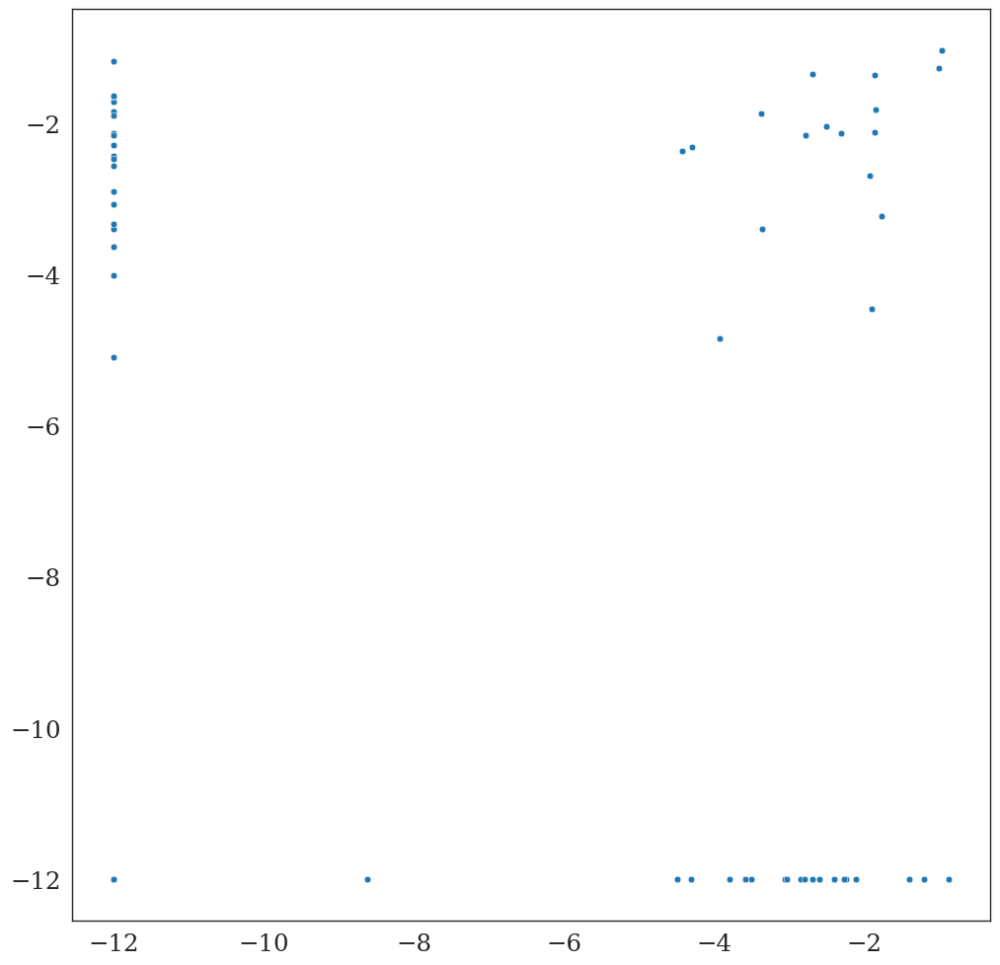

In [517]:
x = Ri_inoc.copy()
# x = Ri_pass2.copy()
x[x <= 1e-12] = 1e-12
y = Ri_pass1.copy()
y[y <= 1e-12] = 1e-12
plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y))

In [525]:
id_ = np.where((x > 1e-12) & (y <= 1e-12))[0]
y[id_]
df_metabs_clusters.iloc[id_, :]
x[id_]

array([6.27761199e-02, 4.02517130e-03, 5.71398946e-03, 1.33632778e-01,
       3.25720243e-05, 1.42245650e-03, 7.73897708e-03, 2.37769734e-09,
       3.12481382e-04, 8.74597692e-04, 1.63234248e-03, 2.55730367e-03,
       5.44314711e-03, 2.07324294e-03, 4.87782833e-05, 1.62042713e-04,
       9.48528468e-04, 2.62483516e-04, 4.00521077e-02])

In [63]:
sens_obj_all_prod[pass_]['df_speciesAbun_next_pred'].copy()

array([4.42417114e-06, 4.42417114e-06, 4.42417114e-06, 1.93371168e-01,
       1.93371168e-01, 1.93371168e-01, 4.03170744e-02, 4.03170744e-02,
       4.03170744e-02, 1.36291723e-08, 1.36291723e-08, 1.36291723e-08,
       1.00000000e-08, 1.00000000e-08, 1.00000000e-08, 4.86545185e-07,
       4.86545185e-07, 4.86545185e-07, 1.00000000e-08, 1.00000000e-08,
       1.00000000e-08, 9.28397560e-06, 9.28397560e-06, 9.28397560e-06,
       1.00762267e-04, 1.00762267e-04, 1.00762267e-04, 2.15469060e-03,
       2.15469060e-03, 2.15469060e-03, 2.28210893e-06, 2.28210893e-06,
       2.28210893e-06, 2.91696816e-03, 2.91696816e-03, 2.91696816e-03,
       3.89194505e-05, 3.89194505e-05, 3.89194505e-05, 1.45270874e-02,
       1.45270874e-02, 1.45270874e-02, 7.22860812e-06, 7.22860812e-06,
       7.22860812e-06, 1.87894057e-05, 1.87894057e-05, 1.87894057e-05,
       6.02196680e-05, 6.02196680e-05, 6.02196680e-05, 2.13370388e-02,
       2.13370388e-02, 2.13370388e-02, 1.46884979e-04, 1.46884979e-04,
      

row = 0, col = 0
RMSE high-mid abundance = 1.2878799835933428
row = 0, col = 1
RMSE high-mid abundance = 0.8146386433371601
row = 0, col = 2
RMSE high-mid abundance = 1.3382395623153416


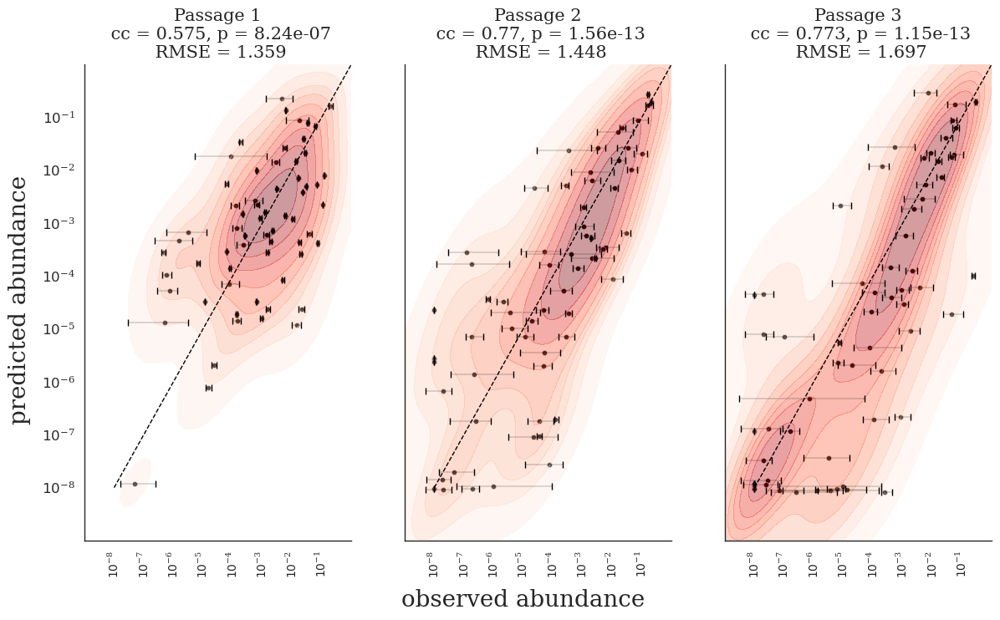

In [40]:
# Figure for paper: prediction performance with production and iterative Balone
date_ = '20230912'
date_meeting = '20230912'

date_ = '20230927'
date_meeting = '20230927'

date_ = '20231006'
date_meeting = '20231006'

date_ = '20231015'
date_meeting = '20231015'

# date_ = '20231025'
# date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')

# num_iter = 200
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 3, figsize=(14, 7.4), sharey="row", sharex="col")
fig.supylabel('predicted abundance', fontsize=20, x=0.06, y=0.5)
fig.supxlabel('observed abundance', fontsize=20, x=0.5, y=-0.005)
df_pred_vs_obs = pd.DataFrame(data={'passage' : [], \
                                    'species' : [], \
                                    'predicted_abundance' : [], \
                                    'mean_observed_abundance' : [], \
                                    'min_observed_abundance' : [], \
                                    'max_observed_abundance' : []})
max_to_min_pass = [None] * 3
abun_pred_pass = [None] * 3
abun_linear_pred_pass = [None] * 3
abun_orig_pass = [None] * 3
abun_orig_pass_rep = [None] * 3
sd_orig_pass = [None] * 3
RMSE_pred = [None] * 3
for pass_ in range(3):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')

    b_ = range(3)
    x_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_obs'].copy()
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x_f = x_f.flatten()
    y_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred'].copy()
    thresh_zero = 1e-8
    y_f[y_f <= thresh_zero] = thresh_zero
    x_f[x_f <= thresh_zero] = thresh_zero

    x = np.zeros((num_species))
    x_min = np.zeros((num_species))
    x_max = np.zeros((num_species))
    y = np.zeros((num_species))
    sd_orig_pass[pass_] = np.zeros((num_species))
    RMSE_pred[pass_] = np.zeros((num_species))
    abun_linear_pred_pass[pass_] = np.zeros((num_species))
    abun_orig_pass_rep[pass_] = np.zeros((num_species, 3))
    for rep_ in range(3):
        id_ = np.arange(num_species) * 3 + rep_
        abun_orig_pass_rep[pass_][:, rep_] = np.log10(x_f[id_])
    for species_ in range(num_species):
        id_ = np.array([0, 1, 2]) + species_ * 3
        x[species_] = np.exp(np.mean(np.log(x_f[id_])))
        x_min[species_] = np.min(x_f[id_])
        x_max[species_] = np.max(x_f[id_])
        y[species_] = np.exp(np.mean(np.log(y_f[id_])))
        abun_linear_pred_pass[pass_][species_] = np.mean(x_f[id_])

        sd_orig_pass[pass_][species_] = np.sqrt(np.var((x_f[id_])))
        RMSE_pred[pass_][species_] = np.sqrt(np.mean(np.power(np.log10(x_f[id_]) - \
                                                    np.log10(y_f[id_]), 2)))
        
    x = np.log10(x)
    x_min = np.log10(x_min)
    x_max = np.log10(x_max)
    y = np.log10(y)
    y_orig = y.copy()
    
    id_filter = np.where(x >= -3)[0]
    RMSE_tmp = np.sqrt(np.mean(np.power(y_orig[id_filter] - x[id_filter], 2)))
    print(f'RMSE high-mid abundance = {RMSE_tmp}')
    
    id_ = np.where(y <= -7.99)[0]
    noise_ = np.random.choice([-4, -3, -2, -1, 0, 1, 2, 3, 4], len(id_), replace=True)
    y[id_] += noise_ / 50
    
    df_pred_vs_obs_tmp = pd.DataFrame(data={'passage' : [pass_] * len(x), \
                                      'species' : species_names[:].flatten(), \
                                      'predicted_abundance (log10)' : y, \
                                      'mean_observed_abundance (log10)' : x, \
                                      'min_observed_abundance (log10)' : x_min, \
                                      'max_observed_abundance (log10)' : x_max})
    max_to_min_pass[pass_] = x_max.copy() - x_min.copy()
    abun_pred_pass[pass_] = y_orig.copy()
    abun_orig_pass[pass_] = x.copy()
    if pass_ == 0:
        df_pred_vs_obs = df_pred_vs_obs_tmp.copy()
    else:
        df_pred_vs_obs = pd.concat((df_pred_vs_obs, df_pred_vs_obs_tmp), axis=0)
    
    def error_bar_(x):
        return (np.min(x), np.max(x))

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=20, ax=axes[ax_col_], c="black")
    xerr=np.vstack([x_max.flatten() - x.flatten(), \
                    x.flatten() - x_min.flatten()])
    xerr[xerr < 0] = 0
    axes[ax_col_].errorbar(x=x, y=y, yerr=None, \
                                    xerr=xerr, \
                                   fmt='none', elinewidth=0.2, c="black", \
                          capsize=3)

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.4, cmap="Reds", \
                    ax=axes[ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="black", linewidth=1, ls="dashed")

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y_orig)
    corr_val_pe_log = scipy.stats.pearsonr(x, y_orig)
    corr_val_sp = scipy.stats.spearmanr(x, y_orig)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y_orig - x, 2)))
    std_error = np.sqrt(np.std(np.power(y_orig - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y_orig, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
#     plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
#                 linewidth=3)

#     title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
#             f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_pe_log[1]) + \
#             f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_sp[1]) + \
#             f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
#                     '{:.3e}'.format(slope_log_pval) + \
#             f'\n RMSE = {np.round(abs_mean_error, 3)}'
    title_ = f'Passage {pass_ + 1}' + \
            f'\n cc = {np.round(corr_val_pe_log[0], 3)}, p = ' + \
                    '{:.2e}'.format(corr_val_pe_log[1]) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_col_].set_title(title_, size=15)
#     if ax_row_ == 1:
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        yticks_ = np.arange(-8, 0, step=1)
        ylabs_ = []
        for y_ in yticks_:
            ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")
        plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=9)
    if ax_row_ == 0:
        xticks_ = np.arange(-8, 0, step=1)
        xlabs_ = []
        for x_ in xticks_:
            xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
#             plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
        plt_.set_xticks(xticks_, labels=xlabs_, fontsize=10)
        axes[ax_col_].tick_params(axis='x', rotation=90) 
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsiz
#         plt_.set_xticks(np.arange(-10, 1, step=2))
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=9)
    axes[ax_col_].set_xlim(-9, 0)
    axes[ax_col_].set_ylim(-9, 0)
        
    plt_ = sns.despine(right=True, top=True, ax=axes[ax_col_])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance' + \
                                         f'_until_passage3_final.svg'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)


# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'data_predicted_vs_observed_abundance.csv'))
# df_pred_vs_obs.to_csv(file_save, index=False)

In [84]:
id_ = np.arange(num_species) * 3 + 2
y_f[id_]

array([4.42417114e-06, 1.93371168e-01, 4.03170744e-02, 1.36291723e-08,
       1.00000000e-08, 4.86545185e-07, 1.00000000e-08, 9.28397560e-06,
       1.00762267e-04, 2.15469060e-03, 2.28210893e-06, 2.91696816e-03,
       3.89194505e-05, 1.45270874e-02, 7.22860812e-06, 1.87894057e-05,
       6.02196680e-05, 2.13370388e-02, 1.46884979e-04, 1.19477845e-02,
       2.17661486e-07, 1.96902844e-02, 6.40442927e-02, 1.77963801e-01,
       2.14161221e-05, 5.34645561e-03, 4.52415849e-05, 4.36661014e-05,
       1.00000000e-08, 7.37098247e-05, 1.00000000e-08, 2.98923737e-05,
       2.86548545e-01, 1.89052974e-03, 3.69484512e-08, 1.31590263e-07,
       1.62686342e-06, 1.16914680e-07, 1.00000000e-08, 4.86197755e-05,
       1.00000000e-08, 1.91972225e-07, 5.51177068e-05, 3.25186909e-08,
       1.00000000e-08, 1.74006748e-02, 1.00000000e-08, 1.16045624e-07,
       1.00000000e-08, 1.00000000e-08, 1.00000000e-08, 8.70468607e-02,
       5.60769511e-06, 1.00000000e-08, 5.90017630e-04, 7.44698369e-03,
      

In [59]:
pass_ = 2
x_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_obs'].copy()
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
x_f = x_f.flatten()

species_ = 5
id_ = np.array([0, 1, 2]) + species_ * 3
np.std(x_f[id_])

8.283830924231023e-05

PearsonRResult(statistic=-0.05107748394076422, pvalue=0.6909573355137691)


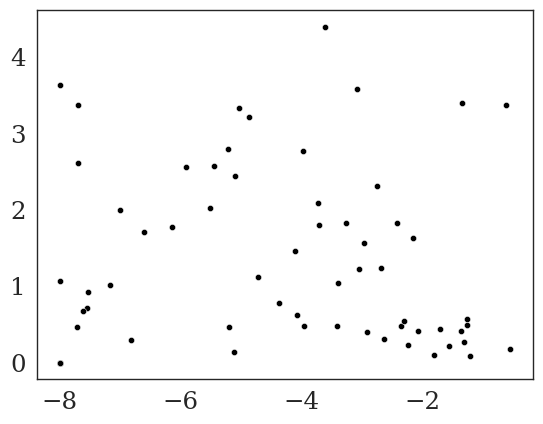

In [71]:
pass_ = 2
x = np.sqrt(abun_linear_pred_pass[pass_])
x = abun_orig_pass[pass_].copy()
# x = sd_orig_pass[pass_] / abun_linear_pred_pass[pass_]
# x = max_to_min_pass[pass_]
y = RMSE_pred[pass_]

plt_ = sns.scatterplot(x=x, y=y, s=20, c="black")
print(scipy.stats.pearsonr(x, y))

In [50]:
abun_linear_pred_pass[pass_]

array([1.80503684e-04, 2.89720285e-01, 3.01631829e-02, 8.19079908e-08,
       5.72777783e-05, 5.86890876e-05, 1.20631886e-07, 2.28085523e-03,
       2.43738161e-01, 9.25409638e-06, 6.73889206e-06, 7.59598519e-03,
       4.71058471e-04, 1.57980125e-02, 2.17735733e-07, 5.46940431e-02,
       4.84346541e-03, 8.90854139e-03, 4.37997169e-04, 2.59651434e-04,
       9.42700513e-04, 6.15963605e-02, 6.33492645e-02, 6.53419845e-02,
       9.31676769e-05, 6.65478570e-03, 3.55634365e-08, 1.00000000e-08,
       5.49824950e-08, 1.54218136e-04, 1.00000000e-08, 1.17020789e-03,
       9.81228460e-03, 3.02402540e-03, 8.01091890e-06, 9.44947772e-08,
       2.51843724e-04, 1.86288644e-07, 2.68021656e-04, 1.44029172e-04,
       1.00000000e-08, 1.44349328e-04, 9.70467563e-04, 3.22156571e-08,
       4.86901512e-06, 4.54406299e-02, 1.00000000e-08, 1.00000000e-08,
       4.29113899e-04, 9.41046797e-06, 8.64452279e-07, 4.98464441e-02,
       7.63019472e-06, 7.34352862e-06, 1.42646396e-03, 2.04509237e-02,
      

corr at pass = 0
len id = 63
PearsonRResult(statistic=-0.48366978300368213, pvalue=5.925975598130137e-05)
SignificanceResult(statistic=-0.46222158218125964, pvalue=0.0001369107160092578)
corr at pass = 1
len id = 59
PearsonRResult(statistic=-0.4244559947203457, pvalue=0.0008066863168454044)
SignificanceResult(statistic=-0.47469316189362953, pvalue=0.00014554243844205162)
corr at pass = 2
len id = 56
PearsonRResult(statistic=-0.5152865915711846, pvalue=4.8281918433959846e-05)
SignificanceResult(statistic=-0.6671223513328777, pvalue=1.9730305095844888e-08)


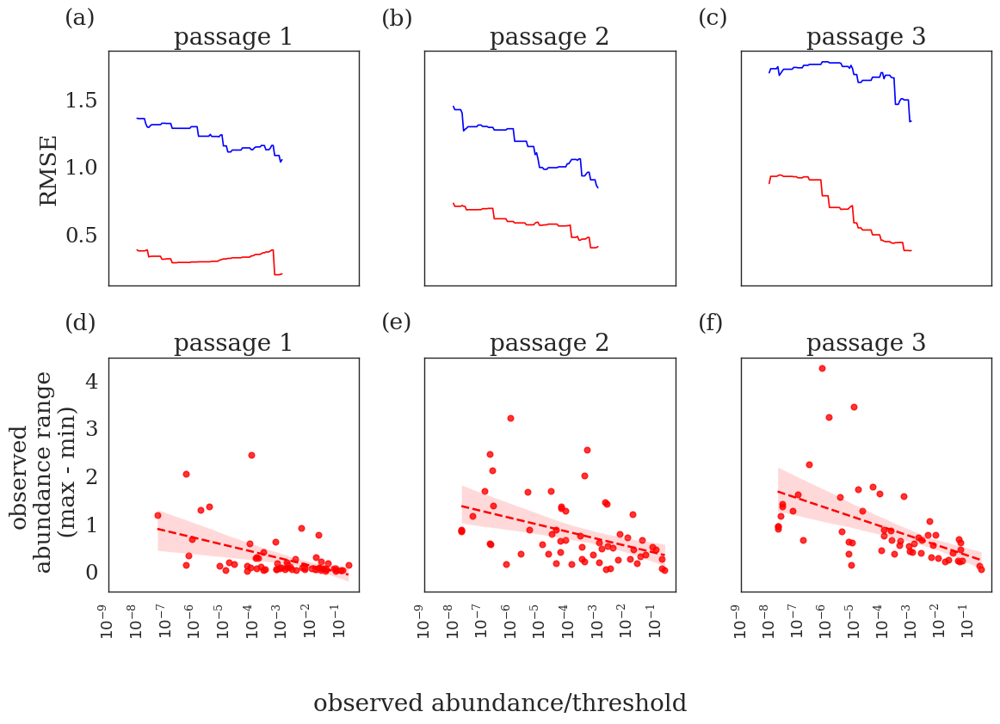

In [61]:
pass_ = 2

date_ = '20231015'
date_meeting = '20231015'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')

fig, axes = plt.subplots(2, 3, figsize=(12, 8.5), sharey="row", sharex="col")
fig.supxlabel('observed abundance/threshold', fontsize=20, x=0.5, y=-0.005)
abun_thresh = np.linspace(-8, -3, 100)
RMSE_pred_vs_org = np.zeros(3)
RMSE_org_rep = np.zeros(3)
x_filter = abun_orig_pass[2].copy()
for pass_ in np.arange(3):
    x = abun_orig_pass[pass_].copy()
    y = max_to_min_pass[pass_].copy()
    id_ = np.where((x >= -8.8) & (y != 0))[0]
    id_species_keep = id_.copy()
    x = x[id_]
    y = y[id_]
    # plt_ = sns.scatterplot(x=x, y=y)
    plt_ = sns.regplot(x=x, y=y, \
                       line_kws={'linestyle' : 'dashed'}, ax=axes[1][pass_], \
                        color='red')
    # axes[0][pass_].axhline(y=1, c="black", linestyle='dotted')

    # axes[0][pass_].axvline(x=-4, c="black", linestyle='dotted')
    # axes[0][pass_].axvline(x=-5, c="black", linestyle='dotted')
    print(f'corr at pass = {pass_}')
    print(f'len id = {len(id_)}')
    print(scipy.stats.pearsonr(x, y))
    print(scipy.stats.spearmanr(x, y))
    
    x = abun_orig_pass[pass_].copy()
    y = abun_pred_pass[pass_].copy()
    y_tmp = max_to_min_pass[pass_].copy()

    RMSE_pred_vs_org[pass_] = np.sqrt(np.mean(np.power(x - y, 2.0)))
    RMSE_org_tmp = 0
    for i_ in range(2):
        for j_ in np.arange(i_ + 1, 3):
            a_ = abun_orig_pass_rep[pass_][:, i_]
            b_ = abun_orig_pass_rep[pass_][:, j_]
            RMSE_org_tmp += np.sqrt(np.mean(np.power(a_[:] - b_[:], 2.0)))
    RMSE_org_tmp /= 3
    RMSE_org_rep[pass_] = RMSE_org_tmp
    
    RMSE_over_thresh = np.zeros(len(abun_thresh))
    max_to_mon_over_thresh = np.zeros(len(abun_thresh))
    RMSE_orig_thresh = np.zeros(len(abun_thresh))
    for count_, thresh_ in enumerate(abun_thresh):
        id_ = np.where(x_filter >= thresh_)[0]
        RMSE_over_thresh[count_] = np.sqrt(np.mean(np.power(x[id_] - y[id_], 2.0)))
        max_to_mon_over_thresh[count_] = np.mean(y_tmp[id_])
        RMSE_org_tmp = 0
        for i_ in range(2):
            for j_ in np.arange(i_ + 1, 3):
                a_ = abun_orig_pass_rep[pass_][:, i_]
                b_ = abun_orig_pass_rep[pass_][:, j_]
                RMSE_org_tmp += np.sqrt(np.mean(np.power(a_[id_] - b_[id_], 2.0)))
        RMSE_org_tmp /= 3
        RMSE_orig_thresh[count_] = RMSE_org_tmp
    plt_ = sns.lineplot(x=abun_thresh, y=RMSE_over_thresh, sort=False, \
                        ax=axes[0][pass_], c='blue')
    plt_ = sns.lineplot(x=abun_thresh, y=RMSE_orig_thresh, sort=False, \
                        ax=axes[0][pass_], c="red")
    # plt_ = sns.lineplot(x=abun_thresh, y=RMSE_over_thresh - RMSE_orig_thresh, sort=False, \
    #                 ax=axes[0][pass_], c="green", linestyle="dashed")
    
    xticks_ = np.arange(-9, 0, step=1)
    xlabs_ = []
    for x_ in xticks_:
        xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
#             plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
    axes[1][pass_].set_xticks(xticks_, labels=xlabs_, fontsize=13)
    axes[1][pass_].tick_params(axis='x', rotation=90) 
    
    if pass_ == 0:
        axes[1][pass_].set_ylabel(f'observed\n abundance range\n (max - min)')
        
        axes[0][pass_].set_ylabel('RMSE')

    axes[0][pass_].set_title(f'passage {pass_ + 1}', size=20)
    axes[1][pass_].set_title(f'passage {pass_ + 1}', size=20)

for i, ax in enumerate(axes.flatten()):
    if i <= 2:
        ax.text(-10.5, 2.05, f"({string.ascii_lowercase[i]})")
    else:
        ax.text(-10.5, 5.05, f"({string.ascii_lowercase[i]})")
plt.tight_layout()
        
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'abundance_variation_over_passage' + \
                                            f'_and_abundance_new.svg'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)


# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'data_predicted_vs_observed_abundance.csv'))

[1.35919543 1.44773543 1.6969281 ]
[0.38217627 0.72821592 0.87488366]
[0.97701916 0.71951951 0.82204445]


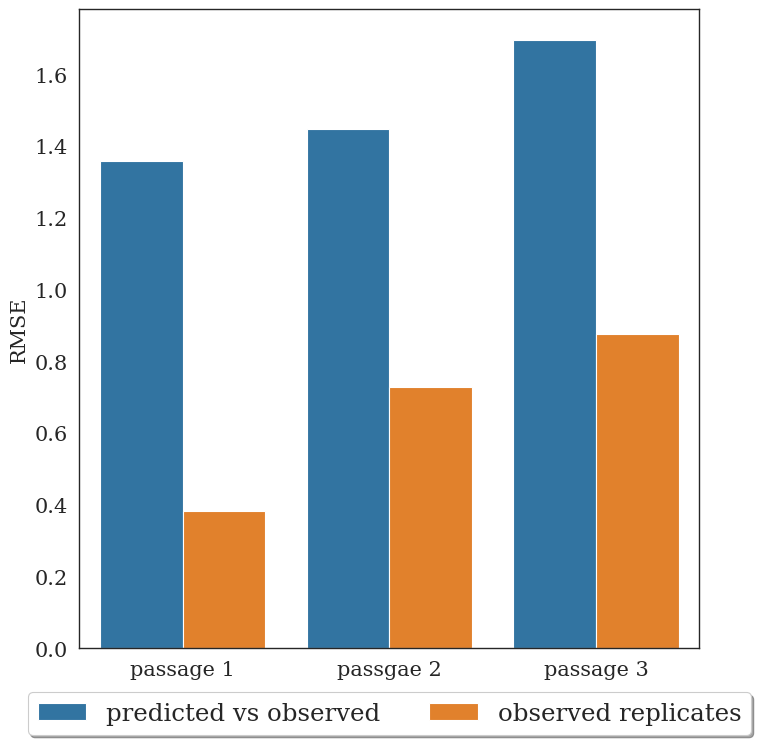

In [115]:
date_ = '20231015'
date_meeting = '20231015'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.rcParams['xtick.labelsize']=15
plt.rcParams['ytick.labelsize']=15
plt.rcParams['figure.figsize'] = [8, 8.3]

x = ['passage 1', 'passgae 2', 'passage 3']
x += x
y = np.concatenate((RMSE_pred_vs_org, RMSE_org_rep))
z = np.concatenate((['predicted vs observed'] * 3, ['observed replicates'] * 3))
plt_ = sns.barplot(x=x, y=y, hue=z)
print(RMSE_pred_vs_org)
print(RMSE_org_rep)
print(RMSE_pred_vs_org - RMSE_org_rep)
plt_.set_ylabel('RMSE', fontsize=15)
plt_.set_xlabel(None)
# plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=15)
plt_.legend(loc='upper center', \
            bbox_to_anchor=(0.5, -0.05), ncol=2, fancybox=True, shadow=True)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'RMSE_predicted_vs_observed_rep_new.svg'))

# plt_.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

In [46]:
RMSE_org_rep / RMSE_pred_vs_org


array([0.28117831, 0.50300345, 0.51556908])

In [62]:
plt.rcParams.keys()

KeysView(RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': ['-layers', 'OptimizePlus'],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': True,
          'axes.edgecolor': '.15',
          'axes.facecolor': 'white',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_mathtext': False,
          'axes.formatter.useoffset': True,
          'axes.grid': False,
          'axes.grid.axis': 'both'

In [106]:
RMSE_over_thresh - RMSE_orig_thresh

array([0.82204445, 0.79908134, 0.79908134, 0.79908134, 0.79908134,
       0.79908134, 0.81081894, 0.73944348, 0.75515476, 0.77521841,
       0.79565229, 0.79565229, 0.79565229, 0.79565229, 0.79565229,
       0.79565229, 0.79565229, 0.81164554, 0.81164554, 0.81164554,
       0.81698989, 0.81698989, 0.81698989, 0.81698989, 0.82794991,
       0.82794991, 0.82794991, 0.82794991, 0.85727965, 0.85727965,
       0.85727965, 0.85727965, 0.85727965, 0.85727965, 0.85727965,
       0.85727965, 0.85727965, 0.99486151, 0.99486151, 0.99486151,
       0.99486151, 0.99486151, 1.07389657, 1.07389657, 1.07389657,
       1.07389657, 1.07389657, 1.07389657, 1.07389657, 1.07389657,
       1.08520098, 1.05961229, 1.05961229, 1.05961229, 1.05961229,
       1.05961229, 1.03390693, 1.04715534, 1.01990647, 1.10174396,
       1.10174396, 1.10174396, 1.08033972, 1.08033972, 1.08033972,
       1.11095251, 1.11095251, 1.11095251, 1.11095251, 1.11095251,
       1.11095251, 1.11095251, 1.17012993, 1.17012993, 1.17012

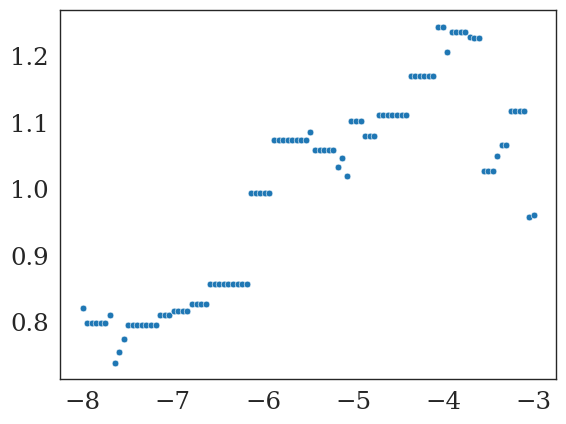

In [107]:
plt_ = sns.scatterplot(x=abun_thresh, y=RMSE_over_thresh - RMSE_orig_thresh)

In [102]:
x = abun_orig_pass[pass_].copy()
y = max_to_min_pass[pass_].copy()
id_ = np.where((x < -7.8) & (y == 0))[0]
x[id_]
df_speciesAbun.iloc[id_, :].copy()

,p1_r0,p2_r0,p3_r0,p4_r0,p5_r0,p6_r0,p1_r1,p2_r1,p3_r1,p4_r1,p5_r1,p6_r1,p1_r2,p2_r2,p3_r2,p4_r2,p5_r2,p6_r2
Blautia hansenii DSMZ 20583,7.200254e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,2.409139e-06,2.133601e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,0.000017,2.796065e-06,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08
Clostridium leptum DSMZ 753,2.447375e-05,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.850396e-05,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,0.000027,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08
Eubacterium siraeum DSMZ 15702,5.920126e-04,7.439457e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,6.530452e-04,1.101782e-07,1.000000e-08,2.931876e-07,1.000000e-08,1.000000e-08,0.000636,1.771879e-06,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08
Intestinibacter bartlettii DSM 16795,3.401546e-05,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,9.206712e-05,7.327037e-08,1.000000e-08,2.189859e-07,1.000000e-08,1.000000e-08,0.000131,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08
Lactobacillus plantarum ATCC BAA-793,4.817664e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,4.503917e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,0.000002,1.000000e-08,1.000000e-08,9.361592e-08,1.000000e-08,7.826871e-08
Ruminococcus bromii ATCC 27255,1.388142e-04,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.217491e-04,6.883915e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,0.000136,1.464844e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08
Tyzzerella nexilis DSM 1787,1.178492e-04,1.129604e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08,1.197888e-04,4.244615e-07,1.000000e-08,1.000000e-08,7.916584e-08,1.000000e-08,0.000225,1.446117e-07,1.000000e-08,1.000000e-08,1.000000e-08,1.000000e-08


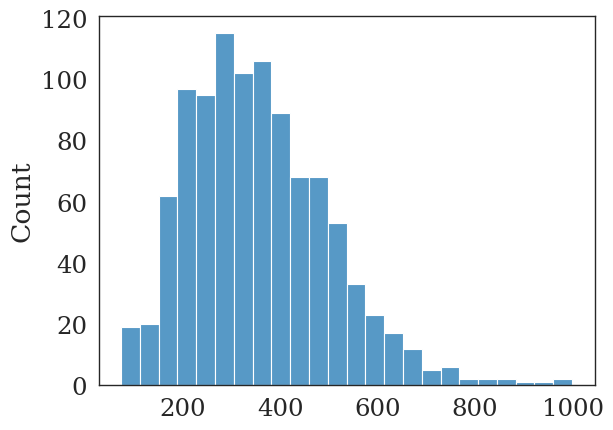

In [379]:
6 / 0.017
np.sqrt(6 / 0.017**2.0)
tmp = np.random.gamma(6, scale=1/0.017, size=1000)
plt_ = sns.histplot(tmp)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2


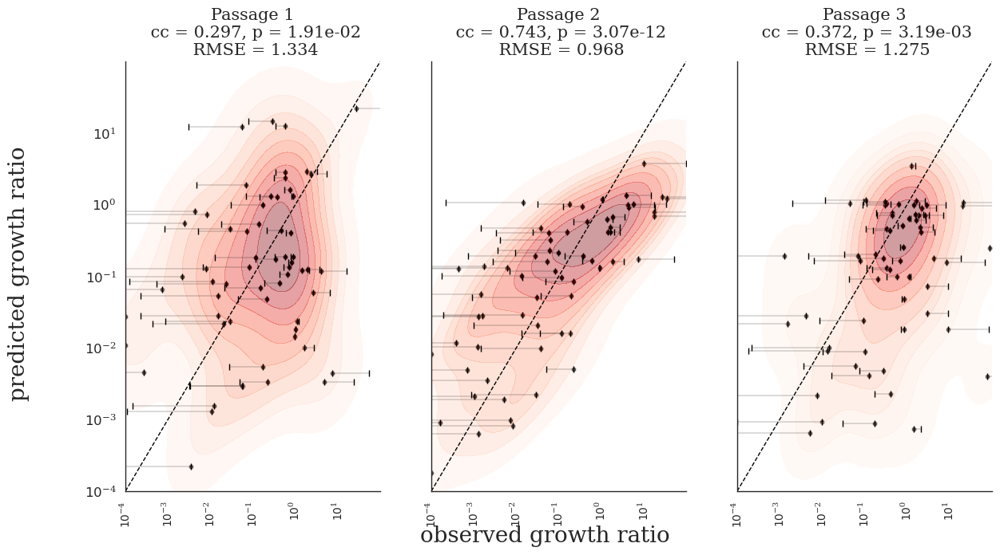

In [279]:
# Figure for paper: prediction performance with production and iterative Balone
date_ = '20230912'
date_meeting = '20230912'

date_ = '20230927'
date_meeting = '20230927'

date_ = '20231006'
date_meeting = '20231006'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 3, figsize=(14, 7), sharey="row", sharex="col")
fig.supylabel('predicted growth ratio', fontsize=20)
fig.supxlabel('observed growth ratio', fontsize=20)
df_pred_vs_obs = pd.DataFrame(data={'passage' : [], \
                                    'species' : [], \
                                    'predicted_abundance' : [], \
                                    'mean_observed_abundance' : [], \
                                    'min_observed_abundance' : [], \
                                    'max_observed_abundance' : []})
for pass_ in range(3):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')

    b_ = range(3)
    x_f = sens_obj_all_prod[pass_]['growth_ratio_obs']
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x_f = x_f.flatten()
    x_f_neg = x_f.copy()
    
    x_tmp = sens_obj_all_prod[pass_]['df_speciesAbun_next_obs']
    y_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred'] / x_tmp
    thresh_zero = 1e-4
    y_f[y_f <= thresh_zero] = thresh_zero
    x_f[x_f <= thresh_zero] = thresh_zero
    
    if pass_ > 0:
        pass_tmp = pass_ - 1
        df_speciesAbun_ratio_tmp_1 = \
                df_speciesAbun_ratio_mdl.iloc[:, [pass_tmp, pass_tmp + 5, \
                                                         pass_tmp + 10]].copy()
#         abun_prev = np.array(abun_prev)
#         abun_prev[abun_prev == 0] = thresh_zero
#         abun_prev = 10**np.mean(np.log10(abun_prev), axis=1)
        x = \
            np.array(df_speciesAbun_ratio_tmp_1)
    else:
        pass_tmp = pass_
        x = np.array(df_speciesAbun_mdl.iloc[:, [pass_, pass_ + 6, pass_ + 12]].copy())
        thresh_zero = 1e-8
        x[x <= thresh_zero] = thresh_zero
#         x = 10**np.mean(np.log10(x), axis=1).flatten()
        x_inoc_tmp = np.array(df_speciesAbun_inoc.copy()).reshape((-1, 1))
        x_inoc_tmp = np.tile(x_inoc_tmp, 3)
        x_inoc_tmp[x_inoc_tmp <= thresh_zero] = thresh_zero
        x /= x_inoc_tmp
        id_ = np.where((x == 1) & (x_inoc_tmp <= thresh_zero))[0]
        x[id_] = -1
#         y = np.array(growth_rate_all[num_iter - 1].copy())[:, :].flatten()
#         y = y[~id_]
#         abun_prev = x_inoc_tmp
    
#     abun_prev = df_speciesAbun_prev_mdl.iloc[:, [pass_tmp, pass_tmp + 5, \
#                                                  pass_tmp + 10]].copy()

    x_new = -1 * np.ones(x.shape[0])
    x_min = np.zeros((num_species))
    x_max = np.zeros((num_species))
    for row_ in range(x.shape[0]):
        id_tmp = np.where(x[row_, :] > 0)[0]
        if len(id_tmp) > 0:
            x_new[row_] = 10**np.mean(np.log10(x[row_, id_tmp]))
            x_min[species_] = np.min((x[row_, id_tmp]))
            x_max[species_] = np.max((x[row_, id_tmp]))
    id_tmp = np.where(x_new > 0)[0]
    x = x_new[id_tmp]
#     abun_prev = abun_prev.flatten()[id_tmp]
    #                 x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    y = np.array(sens_obj_all_prod[pass_]['growth_ratio_all'].copy())[:, :].flatten()
    y = y[id_tmp]
    x_min = x_min[id_tmp]
    x_max = x_max[id_tmp]
    thresh_zero = 1e-4
    y[y <= thresh_zero] = thresh_zero
    x[x <= thresh_zero] = thresh_zero
    id_ = np.where(y <= -3.99)[0]
    noise_ = np.random.choice([-4, -3, -2, -1, 0, 1, 2, 3, 4], len(id_), replace=True)
    y[id_] += noise_ / 10
    x = np.log10(x)
    y = np.log10(y)
    df_pred_vs_obs_tmp = pd.DataFrame(data={'passage' : [pass_] * len(x), \
                                      'species' : species_names[id_tmp], \
                                      'predicted_abundance (log10)' : y, \
                                      'mean_observed_abundance (log10)' : x, \
                                      'min_observed_abundance (log10)' : x_min, \
                                      'max_observed_abundance (log10)' : x_max})
    if pass_ == 0:
        df_pred_vs_obs = df_pred_vs_obs_tmp.copy()
    else:
        df_pred_vs_obs = pd.concat((df_pred_vs_obs, df_pred_vs_obs_tmp), axis=0)
    
    def error_bar_(x):
        return (np.min(x), np.max(x))

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=20, ax=axes[ax_col_], c="black")
    xerr=np.vstack([x_max.flatten() - x.flatten(), \
                    x.flatten() - x_min.flatten()])
    xerr[xerr < 0] = 0
    axes[ax_col_].errorbar(x=x, y=y, yerr=None, \
                                    xerr=xerr, \
                                   fmt='none', elinewidth=0.2, c="black", \
                          capsize=3)

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.4, cmap="Reds", \
                    ax=axes[ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="black", linewidth=1, ls="dashed")

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
#     plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
#                 linewidth=3)

#     title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
#             f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_pe_log[1]) + \
#             f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_sp[1]) + \
#             f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
#                     '{:.3e}'.format(slope_log_pval) + \
#             f'\n RMSE = {np.round(abs_mean_error, 3)}'
    title_ = f'Passage {pass_ + 1}' + \
            f'\n cc = {np.round(corr_val_pe_log[0], 3)}, p = ' + \
                    '{:.2e}'.format(corr_val_pe_log[1]) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_col_].set_title(title_, size=15)
#     if ax_row_ == 1:
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        yticks_ = np.arange(-4, 2, step=1)
        ylabs_ = []
        for y_ in yticks_:
            ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")
        plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=9)
    if ax_row_ == 0:
        xticks_ = np.arange(-4, 2, step=1)
        xlabs_ = []
        for x_ in xticks_:
            xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
            plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
        plt_.set_xticks(xticks_, labels=xlabs_, fontsize=10)
        axes[ax_col_].tick_params(axis='x', rotation=90) 
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsiz
#         plt_.set_xticks(np.arange(-10, 1, step=2))
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=9)
    axes[ax_col_].set_xlim(-4, 2)
    axes[ax_col_].set_ylim(-4, 2)
        
    plt_ = sns.despine(right=True, top=True, ax=axes[ax_col_])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_ratio' + \
                                         f'_until_passage3_diff_Ri.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)


# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'data_predicted_vs_observed_abundance.csv'))
# df_pred_vs_obs.to_csv(file_save, index=False)

Text(0, 0.5, 'Ri, 1->2')

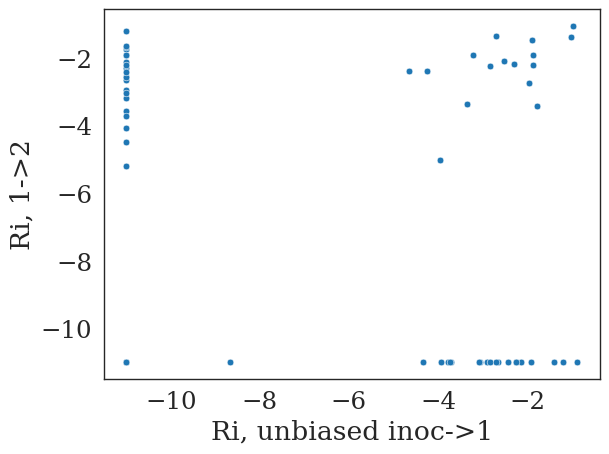

In [434]:
x = Ri_0.copy()
y = Ri_avg.copy()
x[x <= 1e-10] = 1e-11
y[y <= 1e-10] = 1e-11
plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y))
plt_.set_xlabel('Ri, unbiased inoc->1')
plt_.set_ylabel('Ri, 1->2')

[8.23950317e-03 3.96395008e+01 6.42222184e-01 5.17466823e-06
 3.13536559e-04 1.87066206e-04 3.82264880e-02 6.52551544e+00
 3.61967765e-04 6.66908773e-04 1.53022629e-01 8.43115529e-03
 2.25600679e+01 9.92826135e-04 2.79109135e+00 9.13629393e-02
 1.17700112e-01 1.23354817e-02 3.11704436e-03 4.08347933e-02
 2.01869346e+00 2.39745143e+00 5.33198227e+00 3.10059091e-03
 7.38829072e-01 1.29554449e-06 1.39646175e-05 1.35493528e-05
 5.67261937e-03 1.53084705e-06 6.49214434e-02 4.36824604e-01
 7.10844834e-01 2.82085525e-04 2.44214278e-06 5.44372481e-02
 9.94599059e-06 2.81786235e-02 3.61971907e-02 9.14944653e-07
 2.61555472e-02 1.79113608e-01 2.21878979e-06 3.86577260e-03
 4.34917423e+00 3.95184877e-06 2.85706700e-05 3.21136679e-03
 4.23199410e-04 9.28072205e-04 1.56692225e+00 2.49049018e-01
 2.76365511e-04 3.33639131e-02 5.57808264e-01 3.42963001e-01
 9.28935790e-07 4.62318564e-01 1.75055336e-03 9.57976888e-01
 2.61624362e-05 7.24233308e-07]
[ 1 20 21 22 50]
[ 1  7 12 14 20 21 22 44 50]


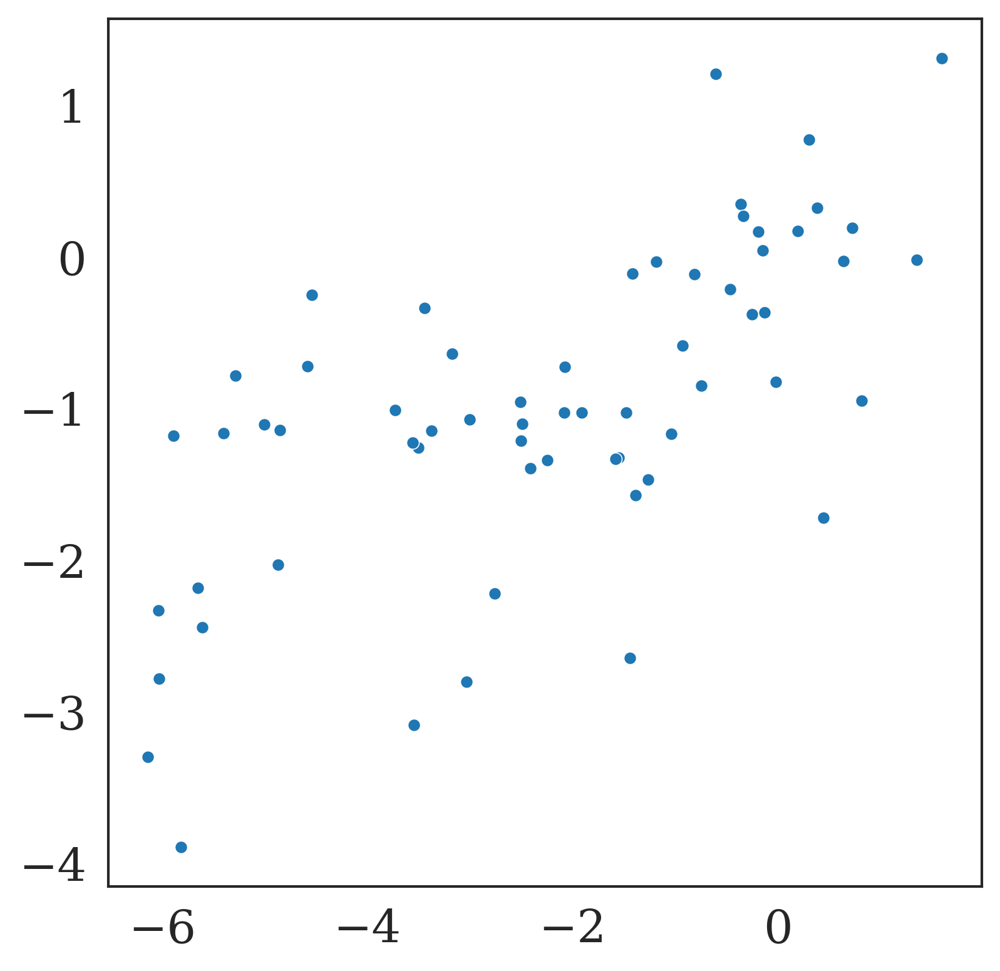

In [445]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)

pass_tmp = 0
x = np.array(df_speciesAbun_mdl.iloc[:, [pass_, pass_ + 6, pass_ + 12]].copy())
thresh_zero = 1e-8
x[x <= thresh_zero] = thresh_zero
#         x = 10**np.mean(np.log10(x), axis=1).flatten()
x_inoc_tmp = np.array(df_speciesAbun_inoc.copy()).reshape((-1, 1))
x_inoc_tmp = np.tile(x_inoc_tmp, 3)
x_inoc_tmp[x_inoc_tmp <= thresh_zero] = thresh_zero
x /= x_inoc_tmp
id_ = np.where((x == 1) & (x_inoc_tmp <= thresh_zero))[0]
x[id_] = -1
#         y = np.array(growth_rate_all[num_iter - 1].copy())[:, :].flatten()
#         y = y[~id_]
#         abun_prev = x_inoc_tmp

#     abun_prev = df_speciesAbun_prev_mdl.iloc[:, [pass_tmp, pass_tmp + 5, \
#                                                  pass_tmp + 10]].copy()

x_new = -1 * np.ones(x.shape[0])
x_min = np.zeros((num_species))
x_max = np.zeros((num_species))
for row_ in range(x.shape[0]):
    id_tmp = np.where(x[row_, :] > 0)[0]
    if len(id_tmp) > 0:
        x_new[row_] = 10**np.mean(np.log10(x[row_, id_tmp]))
        x_min[species_] = np.min((x[row_, id_tmp]))
        x_max[species_] = np.max((x[row_, id_tmp]))
id_tmp = np.where(x_new > 0)[0]
x = x_new[id_tmp]
print(x)
tmp = np.array(sens_obj_all_prod[0]['growth_ratio_all'].copy())[:, :].flatten()[id_tmp]
print(np.where((x >= 1) & (tmp >= 1))[0])
print(np.where((x >= 1))[0])

id_grow = np.where((x >= 1))[0]

plt_ = sns.scatterplot(x=np.log10(x[:]), y=np.log10(tmp[:]))

In [110]:
print(x_max.shape)
df_pred_vs_obs_tmp = pd.DataFrame(data={'passage' : [pass_] * len(x), \
                                  'species' : species_names.flatten(), \
                                  'predicted_abundance (log10)' : y, \
                                  'mean_observed_abundance (log10)' : x, \
                                  'min_observed_abundance (log10)' : x_min, \
                                  'max_observed_abundance (log10)' : x_max})

(63,)


# END: testing for right model for fitting the equations

In [102]:
## fit dynamic Ri for passage transition 1->2 and 2->3 for clustered metabs
# date_ = '20230912'
# date_meeting = '20230912'

#use normalized clustering of metabs
date_ = '20231005'
date_meeting = '20231005'
n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]


num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [1, 2, 3, 4]
Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new, \
                                file_save, num_passages=5, pass_rm=pass_rm, num_brep=3, \
                                get_prod=True, B_alone=0.1, \
                                df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                prod_use_prev=False, use_dilution_term=True, \
                                dilution_factor=15000, use_avg_for_prod=False)
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, p_vec_new, \
#                                       file_save, num_passages=5, pass_rm=[3, 4])
# Ri_dynamic_obj = fit_ss_Ri(df_speciesMetab, df_speciesAbun_mdl, \
#                                       df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                       df_speciesAbun_ratio_mdl, \
#                                       file_save, num_passages=6, pass_rm=[0, 1, 2])
# Ri_ss_obj =  fit_ss_Ri(df_speciesMetab_cluster, df_speciesAbun_mdl, \
#                        df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                        df_speciesAbun_ratio_mdl, \
#                        file_save=file_save, num_passages=6, pass_rm=pass_rm)

with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

count = 0, p_tmp = 0.001
count = 1, p_tmp = 0.01
count = 2, p_tmp = 0.05
count = 3, p_tmp = 0.06
count = 4, p_tmp = 0.07
count = 5, p_tmp = 0.08
count = 6, p_tmp = 0.09
count = 7, p_tmp = 0.1
count = 8, p_tmp = 0.125
count = 9, p_tmp = 0.15
count = 10, p_tmp = 0.175
count = 11, p_tmp = 0.2
count = 12, p_tmp = 0.3
count = 13, p_tmp = 0.4
count = 14, p_tmp = 0.5
count = 15, p_tmp = 0.55
count = 16, p_tmp = 0.6
count = 17, p_tmp = 0.65
count = 18, p_tmp = 0.7


In [103]:
# df_pred_vs_obsdate_ = '20230605'
# date_ = '20230912'
# date_meeting = '20230912'
# date_ = '20230921'
# date_meeting = '20230921'
# date_ = '20230927'
# date_meeting = '20230927'
date_ = '20231005'
date_meeting = '20231005'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

count_p = 7
Ri_0_init_new = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()

## use fitted Ri (without production) as first estimate of B_alone and iteratively fit Ri and update B_alone

In [104]:
# fit Ri with production and iteratively find B_alone
num_iter = 100
B_alone_iter = {}

## fit dynamic Ri for passage transition 1->2 and 2->3 for clustered metabs
# date_ = '20230912'
# date_meeting = '20230912'

# #use normalized clustering of metabs
# date_ = '20230921'
# date_meeting = '20230921'
# date_ = '20230927'
# date_meeting = '20230927'
date_ = '20231005'
date_meeting = '20231005'

n_repeats = 10
rand_seed = 7363
np.random.seed(rand_seed)
p_vec_new_tmp = [0.1]


num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'_iterate_Balone.pickle'))
Ri_dynamic_obj = {}
# Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_cluster, \
#                                 df_speciesAbun_prev_mdl, df_speciesAbun_next_mdl, \
#                                 df_speciesAbun_ratio_mdl, p_vec_new, \
#                                 file_save, num_passages=5, pass_rm=[1, 2, 3, 4])
pass_keep = np.arange(num_passages - 1)
id_keep = list(pass_keep) + list(pass_keep + num_passages - 1) + list(pass_keep + 2 * (num_passages - 1))
pass_rm = [1, 2, 3, 4]

RMSE_Balone_iterate = {}

for iter_ in range(num_iter):
    print(f'iteration = {iter_}')
    if iter_ == 0:
#         B_alone_cur = np.median(abun_alone)
        Ri_avg = Ri_0_init_new.copy()
        B_alone_cur = get_B_alone_func(Ri_avg, df_speciesMetab_cluster.copy())
    else:
        Ri_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
        B_alone_cur = B_alone_iter[iter_ - 1].copy()
    
    
    Ri_dynamic_obj = fit_dynamic_Ri(df_speciesMetab_tmp, \
                                    df_speciesAbun_prev_mdl.iloc[:, id_keep], \
                                    df_speciesAbun_next_mdl.iloc[:, id_keep], \
                                    df_speciesAbun_ratio_mdl.iloc[:, id_keep], p_vec_new_tmp, \
                                    file_save, num_passages=5, pass_rm=pass_rm, save_data=False, \
                                    num_brep=3, \
                                    get_prod=True, B_alone=B_alone_cur, \
                                    df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                    prod_use_prev=False, use_avg_for_prod=False)
    Ri_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'][0].copy()
#     abun_alone_tmp = np.zeros((num_species))

#     for species_ in range(num_species):
#         abun_alone_tmp[species_] = np.sum(Ri_avg[0] * np.array(df_speciesMetab_cluster.iloc[species_, :].values))
    B_alone_iter[iter_] = get_B_alone_func(Ri_avg, df_speciesMetab_cluster.copy())
    RMSE_Balone_iterate[iter_] = \
        get_RMSE_Balone_func(df_speciesMetab_cluster, df_speciesMetab_prod_cluster, p_vec_new_tmp, 0, \
                        Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint'].copy(), \
                        df_speciesAbun_inoc, df_speciesAbun_mdl, df_speciesAbun_prev_mdl, \
                        df_speciesAbun_ratio_mdl, B_alone_cur, num_passages=6, \
                        use_dilution=True)
Ri_dynamic_obj['B_alone_iter'] = B_alone_iter
with open(file_save, "wb") as file_:
     pickle.dump(Ri_dynamic_obj, file_) 

iteration = 0
count = 0, p_tmp = 0.1
iteration = 1
count = 0, p_tmp = 0.1
iteration = 2
count = 0, p_tmp = 0.1
iteration = 3
count = 0, p_tmp = 0.1
iteration = 4
count = 0, p_tmp = 0.1
iteration = 5
count = 0, p_tmp = 0.1
iteration = 6
count = 0, p_tmp = 0.1
iteration = 7
count = 0, p_tmp = 0.1
iteration = 8
count = 0, p_tmp = 0.1
iteration = 9
count = 0, p_tmp = 0.1
iteration = 10
count = 0, p_tmp = 0.1
iteration = 11
count = 0, p_tmp = 0.1
iteration = 12
count = 0, p_tmp = 0.1
iteration = 13
count = 0, p_tmp = 0.1
iteration = 14
count = 0, p_tmp = 0.1
iteration = 15
count = 0, p_tmp = 0.1
iteration = 16
count = 0, p_tmp = 0.1
iteration = 17
count = 0, p_tmp = 0.1
iteration = 18
count = 0, p_tmp = 0.1
iteration = 19
count = 0, p_tmp = 0.1
iteration = 20
count = 0, p_tmp = 0.1
iteration = 21
count = 0, p_tmp = 0.1
iteration = 22
count = 0, p_tmp = 0.1
iteration = 23
count = 0, p_tmp = 0.1
iteration = 24
count = 0, p_tmp = 0.1
iteration = 25
count = 0, p_tmp = 0.1
iteration = 26
count =

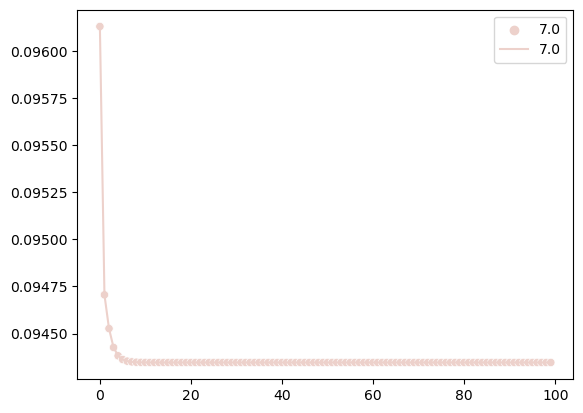

In [105]:
num_species = df_speciesAbun_mdl.shape[0]
RMSE_iter = np.zeros((num_iter))
balone_iter = np.zeros((num_iter, num_species))
col_ = np.zeros((num_iter, num_species))
x_ = np.zeros((num_iter, num_species))
for iter_ in range(num_iter):
    RMSE_iter[iter_] = RMSE_Balone_iterate[iter_][2, 0]
    balone_iter[iter_, :] = B_alone_iter[iter_].copy()
    col_[iter_, :] = np.arange(num_species)
    x_[iter_, :] = iter_ * np.ones(num_species)
    

species_ = 7
y = balone_iter[:, species_].flatten()
x = x_[:, species_].flatten()
# y = RMSE_iter

plt_ = sns.scatterplot(x=x, y=y, hue=col_[:, species_].flatten())
plt_ = sns.lineplot(x=x, y=y, hue=col_[:, species_].flatten())
# plt_.set_yscale('log', base=10)

## load fiitted Ri

In [189]:
date_ = '20230912'
date_meeting = '20230912'

# #use normalized clustering of metabs
# date_ = '20230921'
# date_meeting = '20230921'

# date_ = '20230927'
# date_meeting = '20230927'
date_ = '20231005'
date_meeting = '20231005'

p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'_iterate_Balone.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']
B_alone_iter = Ri_dynamic_obj['B_alone_iter']

In [107]:
# date_ = '20230912'
# date_meeting = '20230912'

# #use normalized clustering of metabs
# date_ = '20230921'
# date_meeting = '20230921'

# date_ = '20230927'
# date_meeting = '20230927'

date_ = '20231005'
date_meeting = '20231005'

count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
id_order = np.argsort(-Ri_avg)

num_metabs_clust = df_speciesMetab_cluster.shape[1]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['cluster_labels'] = np.arange(df_metabs_clusters_order.shape[0]) + 1
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order['Ri'] = Ri_avg[id_order]

# df_metabs_tmp = pd.DataFrame(data={"metabs" : metab_names[id_order], \
#                                    "Ri" : Ri_avg[id_order]})
print(f'with production term iterate')


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'metab_clusters_IDs.csv'))
df_metabs_clusters_order.to_csv(file_save, index=False)
df_metabs_clusters_order.iloc[range(20), :]

with production term iterate


,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
92,93,1,[218],[PYROGLUTAMIC ACID],0.115401
7,8,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.068953
37,38,1,[163],[BETA-LACTOSE],0.042200
19,20,1,[145],[CYSTINE],0.025465
4,5,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.023640
15,16,1,[141],[2-HYDROXY-2-METHYLBUTYRIC ACID],0.020793
10,11,1,[136],[GALACTOSAMINE],0.015051
88,89,1,[214],[PTERIN],0.014127
2,3,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.012987
36,37,1,[162],[DECANOIC ACID],0.011126


In [258]:
df_metabs_clusters_order.iloc[:, 3].values

array([list(['1-METHYLADENOSINE', 'ADENOSINE', 'GUANOSINE', 'INOSINE', 'URIDINE']),
       list(['MANNOSE 6-PHOSPHATE', 'BETA-ALANINE_0', 'IS_PHENYLALANINE-2,3,4,5,6-D5_0', 'GLUCOSE', 'SUCROSE_1', 'GLYCERIC ACID', '1,6-ANHYDRO-B-GLUCOSE', 'HYPOXANTHINE', 'N-ACETYLNEURAMINATE']),
       list(['PYROGLUTAMIC ACID']), list(['PYRIDOXINE']),
       list(['MALEAMIC ACID']), list(['TRYPTOPHAN']),
       list(['OMEGA-HYDROXYDODECANOIC ACID', 'IS_D15-OCTANOIC ACID_0', 'IS_D19-DECANOIC ACID_0', 'IS_TRIDECANOIC ACID_0', 'IS_D27-TETRADECANOIC ACID_0', '4-ACETAMIDOPHENOL', '3-HYDROXYPHENYLACETIC ACID', 'CADAVERINE', 'N6-(DELTA2-ISOPENTENYL)-ADENINE', 'PYRIDOXAMINE', 'SUBERIC ACID']),
       list(['OPHTHALMIC ACID']), list(['ACETYLCHOLINE']),
       list(['GALACTOSAMINE']), list(['LEUCINE']),
       list(["CYTIDINE 2',3'-CYCLIC MONOPHOSPHATE"]),
       list(['IS_PHENYLALANINE-2,3,4,5,6-D5_1']),
       list(["5'-METHYLTHIOADENOSINE", 'ADENINE', 'NICOTINAMIDE', 'URACIL']),
       list(['IS_INDOLE-2,4,5

In [113]:
date_ = '20230912'
date_meeting = '20230912'

#use normalized clustering of metabs
# date_ = '20230921'
# date_meeting = '20230921'

# date_ = '20230927'
# date_meeting = '20230927'
# date_ = '20231005'
# date_meeting = '20231005'


count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
id_order = np.argsort(-Ri_avg)

num_metabs_clust = df_speciesMetab_cluster.shape[1]

df_metabs_clusters_order = df_metabs_clusters.copy()
df_metabs_clusters_order['cluster_labels'] = np.arange(df_metabs_clusters_order.shape[0]) + 1
df_metabs_clusters_order = df_metabs_clusters_order.iloc[id_order, :]
df_metabs_clusters_order['Ri'] = Ri_avg[id_order]

# df_metabs_tmp = pd.DataFrame(data={"metabs" : metab_names[id_order], \
#                                    "Ri" : Ri_avg[id_order]})
print(f'with production term iterate')


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'metab_clusters_IDs.csv'))
df_metabs_clusters_order.to_csv(file_save, index=False)
df_metabs_clusters_order.iloc[range(20), :]

with production term iterate


,cluster_labels,cluster_counts,cluster_metab_IDs,cluser_metab_names,Ri
92,93,1,[218],[PYROGLUTAMIC ACID],0.117725
7,8,7,"[3, 27, 34, 39, 65, 99, 110]","[MANNOSE 6-PHOSPHATE, GLUCOSE, SUCROSE_1, GLYC...",0.073241
37,38,1,[163],[BETA-LACTOSE],0.042960
4,5,15,"[5, 13, 18, 19, 20, 22, 23, 45, 56, 57, 82, 85...","[BETA-ALANINE_0, OMEGA-HYDROXYDODECANOIC ACID,...",0.028162
19,20,1,[145],[CYSTINE],0.024887
15,16,1,[141],[2-HYDROXY-2-METHYLBUTYRIC ACID],0.021219
2,3,30,"[0, 16, 25, 26, 28, 30, 37, 38, 40, 41, 43, 46...","[N-METHYL-ASPARTIC ACID_0, STEARIC ACID, CITRI...",0.017275
10,11,1,[136],[GALACTOSAMINE],0.015408
88,89,1,[214],[PTERIN],0.014499
1,2,25,"[1, 6, 7, 24, 48, 62, 64, 66, 78, 83, 86, 90, ...","[NICOTINIC ACID, 1-METHYL-HYDANTOIN, SUCCINIC ...",0.012777


# plot predicted vs observed abundance

In [190]:
# evalute Ri with production and iterative Balone
# date_ = '20230927'
# date_meeting = '20230927'
# date_ = '20230912'
# date_meeting = '20230912'

date_ = '20231005'
date_meeting = '20231005'
num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
# count_p = 7
num_iter = 100
p_vec_new_tmp = [0.1]
count_p = 0

RMSE_mat_full = np.zeros((num_passages, 2))
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_fit = {0: Ri_avg}
abun_alone = get_B_alone_func(Ri_avg, df_speciesMetab_cluster.copy())
# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_all_prod, RMSE_obj_all_prod = \
    blindly_pred_abun_growth([p_vec_new_tmp[count_p]], df_speciesMetab_tmp, \
                             df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, \
                             df_speciesAbun_ratio_mdl, \
                             Ri_fit, "dummy", "dummy", \
                             "dummy", num_passages=6, num_iter=100, \
                             thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                             save_data_obj=False, \
                             return_sensitivity_ana=True, \
                             get_prod=True, B_alone=B_alone_iter[num_iter - 2], \
                             df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                             prod_use_prev=False, use_dilution=True, dilution_factor=15000, \
                             use_avg_for_prod=False)
for pass_ in range(num_passages):
    RMSE_mat_full[pass_, 0] = RMSE_obj_all_prod[pass_]["abundance"]
    RMSE_mat_full[pass_, 1] = RMSE_obj_all_prod[pass_]["growth_ratio"]

In [191]:
RMSE_mat_full

array([[1.39544662, 1.38093827],
       [1.50061699, 0.95411456],
       [1.84278994, 1.30971726],
       [2.15630879, 1.55319893],
       [2.37645328, 1.44487269],
       [2.55825941, 1.45074713]])

In [283]:
RMSE_mat_full

array([[1.4008476 , 1.38493807],
       [1.50630786, 0.93174995],
       [1.8335915 , 1.24791535],
       [2.12169539, 1.48328894],
       [2.3511105 , 1.37370103],
       [2.53124197, 1.37763276]])

In [193]:
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)

PearsonRResult(statistic=0.7646178310794014, pvalue=3.028438133169407e-13)
1.7714778255223222


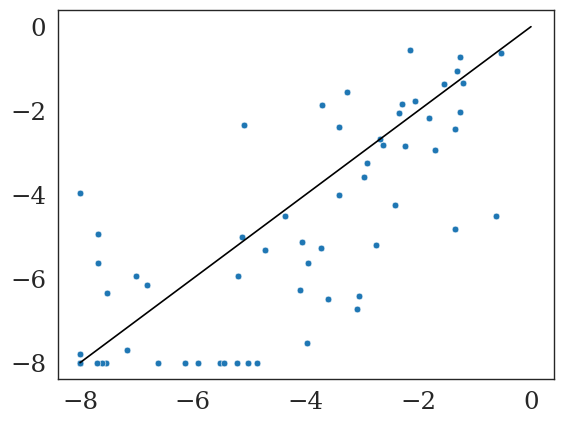

In [194]:
x = abun_avg_pass_3

id_rep_keep = np.arange(len(species_names)) * 3
y = np.log10(sens_obj_all_prod[2]['df_speciesAbun_next_pred'].copy())[id_rep_keep]
y[y <= -8] = -8
plt_ = sns.scatterplot(x=x, y=y)
plt.plot([-8, 0], [-8, 0], c="black")

print(scipy.stats.pearsonr(x, y))

id_ = np.where(x >= -10)
print(np.sqrt(np.mean(np.power(x[id_] - y[id_], 2))))

In [201]:
s_ = 1
print(species_names[s_])
print(10**x[s_])
print(10**y[s_])

['Acidaminococcus-intestini-D21']
0.2892740182944301
0.2324020341660353


In [133]:
# Figure for paper: prediction performance with production and iterative Balone
date_ = '20230912'
date_meeting = '20230912'

date_ = '20230927'
date_meeting = '20230927'

date_ = '20231005'
date_meeting = '20231005'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 3, figsize=(14, 7.4), sharey="row", sharex="col")
fig.supylabel('predicted abundance', fontsize=20, x=0.06, y=0.5)
fig.supxlabel('observed abundance', fontsize=20, x=0.5, y=-0.005)
df_pred_vs_obs = pd.DataFrame(data={'passage' : [], \
                                    'species' : [], \
                                    'predicted_abundance' : [], \
                                    'mean_observed_abundance' : [], \
                                    'min_observed_abundance' : [], \
                                    'max_observed_abundance' : []})
for pass_ in range(3):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')

    b_ = range(3)
    x_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_obs']
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x_f = x_f.flatten()
    y_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred']
    thresh_zero = 1e-8
    y_f[y_f <= thresh_zero] = thresh_zero
    x_f[x_f <= thresh_zero] = thresh_zero

    x = np.zeros((num_species))
    x_min = np.zeros((num_species))
    x_max = np.zeros((num_species))
    y = np.zeros((num_species))
    for species_ in range(num_species):
        id_ = np.array([0, 1, 2]) + species_ * 3
        x[species_] = np.exp(np.mean(np.log(x_f[id_])))
        x_min[species_] = np.min(x_f[id_])
        x_max[species_] = np.max(x_f[id_])
        y[species_] = np.exp(np.mean(np.log(y_f[id_])))
        
    x = np.log10(x)
    x_min = np.log10(x_min)
    x_max = np.log10(x_max)
    y = np.log10(y)
    id_ = np.where(y <= -7.99)[0]
    noise_ = np.random.choice([-4, -3, -2, -1, 0, 1, 2, 3, 4], len(id_), replace=True)
    y[id_] += noise_ / 10
    
    df_pred_vs_obs_tmp = pd.DataFrame(data={'passage' : [pass_] * len(x), \
                                      'species' : species_names[:], \
                                      'predicted_abundance (log10)' : y, \
                                      'mean_observed_abundance (log10)' : x, \
                                      'min_observed_abundance (log10)' : x_min, \
                                      'max_observed_abundance (log10)' : x_max})
    if pass_ == 0:
        df_pred_vs_obs = df_pred_vs_obs_tmp.copy()
    else:
        df_pred_vs_obs = pd.concat((df_pred_vs_obs, df_pred_vs_obs_tmp), axis=0)
    
    def error_bar_(x):
        return (np.min(x), np.max(x))

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=20, ax=axes[ax_col_], c="black")
    xerr=np.vstack([x_max.flatten() - x.flatten(), \
                    x.flatten() - x_min.flatten()])
    xerr[xerr < 0] = 0
    axes[ax_col_].errorbar(x=x, y=y, yerr=None, \
                                    xerr=xerr, \
                                   fmt='none', elinewidth=0.2, c="black", \
                          capsize=3)

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.4, cmap="Reds", \
                    ax=axes[ax_col_])
    plt_.plot([-8, 0], [-8, 0], c="black", linewidth=1, ls="dashed")

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
#     plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
#                 linewidth=3)

#     title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
#             f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_pe_log[1]) + \
#             f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_sp[1]) + \
#             f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
#                     '{:.3e}'.format(slope_log_pval) + \
#             f'\n RMSE = {np.round(abs_mean_error, 3)}'
    title_ = f'Passage {pass_ + 1}' + \
            f'\n cc = {np.round(corr_val_pe_log[0], 3)}, p = ' + \
                    '{:.2e}'.format(corr_val_pe_log[1]) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_col_].set_title(title_, size=15)
#     if ax_row_ == 1:
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        yticks_ = np.arange(-8, 0, step=1)
        ylabs_ = []
        for y_ in yticks_:
            ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")
        plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=9)
    if ax_row_ == 0:
        xticks_ = np.arange(-8, 0, step=1)
        xlabs_ = []
        for x_ in xticks_:
            xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
            plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
        plt_.set_xticks(xticks_, labels=xlabs_, fontsize=10)
        axes[ax_col_].tick_params(axis='x', rotation=90) 
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsiz
#         plt_.set_xticks(np.arange(-10, 1, step=2))
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=9)
    axes[ax_col_].set_xlim(-9, 0)
    axes[ax_col_].set_ylim(-9, 0)
        
    plt_ = sns.despine(right=True, top=True, ax=axes[ax_col_])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_abundance' + \
                                         f'_until_passage3.pdf'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)


# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'data_predicted_vs_observed_abundance.csv'))
# df_pred_vs_obs.to_csv(file_save, index=False)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2


In [134]:
# Figure for paper: prediction performance with production and iterative Balone
date_ = '20230912'
date_meeting = '20230912'

date_ = '20230927'
date_meeting = '20230927'

date_ = '20231005'
date_meeting = '20231005'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 3, figsize=(14, 7), sharey="row", sharex="col")
fig.supylabel('predicted growth ratio', fontsize=20)
fig.supxlabel('observed growth ratio', fontsize=20)
df_pred_vs_obs = pd.DataFrame(data={'passage' : [], \
                                    'species' : [], \
                                    'predicted_abundance' : [], \
                                    'mean_observed_abundance' : [], \
                                    'min_observed_abundance' : [], \
                                    'max_observed_abundance' : []})
for pass_ in range(3):
    ax_row_ = int(pass_ / 3)
    ax_col_ = int(pass_ % 3)
    print(f'row = {ax_row_}, col = {ax_col_}')

    b_ = range(3)
    x_f = sens_obj_all_prod[pass_]['growth_ratio_obs']
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x_f = x_f.flatten()
    x_f_neg = x_f.copy()
    
    x_tmp = sens_obj_all_prod[pass_]['df_speciesAbun_next_obs']
    y_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred'] / x_tmp
    thresh_zero = 1e-4
    y_f[y_f <= thresh_zero] = thresh_zero
    x_f[x_f <= thresh_zero] = thresh_zero
    
    if pass_ > 0:
        pass_tmp = pass_ - 1
        df_speciesAbun_ratio_tmp_1 = \
                df_speciesAbun_ratio_mdl.iloc[:, [pass_tmp, pass_tmp + 5, \
                                                         pass_tmp + 10]].copy()
#         abun_prev = np.array(abun_prev)
#         abun_prev[abun_prev == 0] = thresh_zero
#         abun_prev = 10**np.mean(np.log10(abun_prev), axis=1)
        x = \
            np.array(df_speciesAbun_ratio_tmp_1)
    else:
        pass_tmp = pass_
        x = np.array(df_speciesAbun_mdl.iloc[:, [pass_, pass_ + 6, pass_ + 12]].copy())
        thresh_zero = 1e-8
        x[x <= thresh_zero] = thresh_zero
#         x = 10**np.mean(np.log10(x), axis=1).flatten()
        x_inoc_tmp = np.array(df_speciesAbun_inoc.copy()).reshape((-1, 1))
        x_inoc_tmp = np.tile(x_inoc_tmp, 3)
        x_inoc_tmp[x_inoc_tmp <= thresh_zero] = thresh_zero
        x /= x_inoc_tmp
        id_ = np.where((x == 1) & (x_inoc_tmp <= thresh_zero))[0]
        x[id_] = -1
#         y = np.array(growth_rate_all[num_iter - 1].copy())[:, :].flatten()
#         y = y[~id_]
#         abun_prev = x_inoc_tmp
    
#     abun_prev = df_speciesAbun_prev_mdl.iloc[:, [pass_tmp, pass_tmp + 5, \
#                                                  pass_tmp + 10]].copy()

    x_new = -1 * np.ones(x.shape[0])
    x_min = np.zeros((num_species))
    x_max = np.zeros((num_species))
    for row_ in range(x.shape[0]):
        id_tmp = np.where(x[row_, :] > 0)[0]
        if len(id_tmp) > 0:
            x_new[row_] = 10**np.mean(np.log10(x[row_, id_tmp]))
            x_min[species_] = np.min((x[row_, id_tmp]))
            x_max[species_] = np.max((x[row_, id_tmp]))
    id_tmp = np.where(x_new > 0)[0]
    x = x_new[id_tmp]
#     abun_prev = abun_prev.flatten()[id_tmp]
    #                 x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    y = np.array(sens_obj_all_prod[pass_]['growth_ratio_all'].copy())[:, :].flatten()
    y = y[id_tmp]
    x_min = x_min[id_tmp]
    x_max = x_max[id_tmp]
    thresh_zero = 1e-4
    y[y <= thresh_zero] = thresh_zero
    x[x <= thresh_zero] = thresh_zero
    id_ = np.where(y <= -3.99)[0]
    noise_ = np.random.choice([-4, -3, -2, -1, 0, 1, 2, 3, 4], len(id_), replace=True)
    y[id_] += noise_ / 10
    x = np.log10(x)
    y = np.log10(y)
    df_pred_vs_obs_tmp = pd.DataFrame(data={'passage' : [pass_] * len(x), \
                                      'species' : species_names[id_tmp], \
                                      'predicted_abundance (log10)' : y, \
                                      'mean_observed_abundance (log10)' : x, \
                                      'min_observed_abundance (log10)' : x_min, \
                                      'max_observed_abundance (log10)' : x_max})
    if pass_ == 0:
        df_pred_vs_obs = df_pred_vs_obs_tmp.copy()
    else:
        df_pred_vs_obs = pd.concat((df_pred_vs_obs, df_pred_vs_obs_tmp), axis=0)
    
    def error_bar_(x):
        return (np.min(x), np.max(x))

    plt_ = sns.scatterplot(x=x, \
                            y=y, s=20, ax=axes[ax_col_], c="black")
    xerr=np.vstack([x_max.flatten() - x.flatten(), \
                    x.flatten() - x_min.flatten()])
    xerr[xerr < 0] = 0
    axes[ax_col_].errorbar(x=x, y=y, yerr=None, \
                                    xerr=xerr, \
                                   fmt='none', elinewidth=0.2, c="black", \
                          capsize=3)

    plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.4, cmap="Reds", \
                    ax=axes[ax_col_])
    plt_.plot([-4, 2], [-4, 2], c="black", linewidth=1, ls="dashed")

    corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
    corr_val_pe_log = scipy.stats.pearsonr(x, y)
    corr_val_sp = scipy.stats.spearmanr(x, y)
    # abs_mean_error = np.median(np.abs(y - x))
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    std_error = np.sqrt(np.std(np.power(y - x, 2)))

    id_notzero_zero = np.where((x > -4) & (y <= -4))[0]

    frac_zero = len(id_notzero_zero) / len(x)

    model = sm.OLS(10**y, 10**x).fit()
    slope = model.params[0]
    slope_pval = model.pvalues[0]

    model_log = sm.OLS(y, x).fit()
    slope_log = model_log.params[0]
    slope_log_pval = model_log.pvalues[0]

    # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
#     plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
#                 linewidth=3)

#     title_ = f'predicted vs observed abundance at passage {pass_ + 1}' + \
#             f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_pe_log[1]) + \
#             f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_sp[1]) + \
#             f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
#                     '{:.3e}'.format(slope_log_pval) + \
#             f'\n RMSE = {np.round(abs_mean_error, 3)}'
    title_ = f'Passage {pass_ + 1}' + \
            f'\n cc = {np.round(corr_val_pe_log[0], 3)}, p = ' + \
                    '{:.2e}'.format(corr_val_pe_log[1]) + \
            f'\n RMSE = {np.round(abs_mean_error, 3)}'

    axes[ax_col_].set_title(title_, size=15)
#     if ax_row_ == 1:
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
    if ax_col_ == 0:
        yticks_ = np.arange(-4, 2, step=1)
        ylabs_ = []
        for y_ in yticks_:
            ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")
        plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=9)
    if ax_row_ == 0:
        xticks_ = np.arange(-4, 2, step=1)
        xlabs_ = []
        for x_ in xticks_:
            xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
            plt_.set_yticks(yticks_, labels=ylabs_, fontsize=12)
        plt_.set_xticks(xticks_, labels=xlabs_, fontsize=10)
        axes[ax_col_].tick_params(axis='x', rotation=90) 
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsiz
#         plt_.set_xticks(np.arange(-10, 1, step=2))
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=9)
    axes[ax_col_].set_xlim(-4, 2)
    axes[ax_col_].set_ylim(-4, 2)
        
    plt_ = sns.despine(right=True, top=True, ax=axes[ax_col_])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_vs_observed_growth_ratio' + \
                                         f'_until_passage3.pdf'))

fig.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(fig.figure)


# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'data_predicted_vs_observed_abundance.csv'))
# df_pred_vs_obs.to_csv(file_save, index=False)

row = 0, col = 0
row = 0, col = 1
row = 0, col = 2


In [136]:
def get_corr_func_f(sens_obj_all_prod, pass_=2):
    b_ = range(3)
    x_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_obs']
#     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
    x_f = x_f.flatten()
    y_f = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred']
    thresh_zero = 1e-8
    y_f[y_f <= thresh_zero] = thresh_zero
    x_f[x_f <= thresh_zero] = thresh_zero

    x = np.zeros((num_species))
    x_min = np.zeros((num_species))
    x_max = np.zeros((num_species))
    y = np.zeros((num_species))
    for species_ in range(num_species):
        id_ = np.array([0, 1, 2]) + species_ * 3
        x[species_] = np.exp(np.mean(np.log(x_f[id_])))
        x_min[species_] = np.min(x_f[id_])
        x_max[species_] = np.max(x_f[id_])
        y[species_] = np.exp(np.mean(np.log(y_f[id_])))

    x = np.log10(x)
    x_min = np.log10(x_min)
    x_max = np.log10(x_max)
    y = np.log10(y)
    corr_ = scipy.stats.pearsonr(x, y)
    abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
    return corr_, abs_mean_error

In [137]:
# RMSE and correlation as a function of f (1 - p)
# df_pred_vs_obsdate_ = '20230605'
date_ = '20230912'
date_meeting = '20230912'

date_ = '20231005'
date_meeting = '20231005'
num_iter = 100

num_metabs_clust = df_speciesMetab_cluster.shape[1]
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
# date_ = '20230921'
# date_meeting = '20230921'
# date_ = '20230927'
# date_meeting = '20230927'
p_vec_new = [0.001, 0.01, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.125, 0.15, 0.175, \
             0.2, 0.3, 0.4, 0.5, 0.55, 0.6, 0.65, 0.7]
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'.pickle'))

with open(file_save, "rb") as file_:
    Ri_dynamic_obj = pickle.load(file_) 
    
Ri_noMicrocosm_dynamicAll_fit_all = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_all']
Ri_noMicrocosm_dynamicAll_fit_avg = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_avg']
Ri_noMicrocosm_dynamicAll_fit_joint = Ri_dynamic_obj['Ri_noMicrocosm_dynamicAll_fit_joint']

RMSE_over_f = np.zeros(len(p_vec_new))
corr_over_f = np.zeros(len(p_vec_new))

for count_p, p_tmp in enumerate(p_vec_new):
    print(f'loop = {count_p}, p = {p_tmp}')
    Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
    Ri_fit = {0: Ri_avg}
    # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
    sens_obj_all_prod, RMSE_obj_all_prod = \
        blindly_pred_abun_growth([p_vec_new[count_p]], df_speciesMetab_tmp, \
                                 df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                 df_speciesAbun_prev_mdl, \
                                 df_speciesAbun_ratio_mdl, \
                                 Ri_fit, "dummy", "dummy", \
                                 "dummy", num_passages=6, num_iter=100, \
                                 thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                 save_data_obj=False, \
                                 return_sensitivity_ana=True, \
                                 get_prod=True, B_alone=0.1, \
                                 df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                 prod_use_prev=False, use_dilution=True, dilution_factor=15000, \
                                 use_avg_for_prod=False)
    pass_ = 2
#     RMSE_over_f[count_p] = RMSE_obj_all_prod[pass_]["abundance"]
    corr_tmp, rmse_tmp = get_corr_func_f(sens_obj_all_prod, pass_=pass_)
    corr_over_f[count_p] = corr_tmp[0]
    RMSE_over_f[count_p] = rmse_tmp

loop = 0, p = 0.001
loop = 1, p = 0.01
loop = 2, p = 0.05
loop = 3, p = 0.06
loop = 4, p = 0.07
loop = 5, p = 0.08
loop = 6, p = 0.09
loop = 7, p = 0.1
loop = 8, p = 0.125
loop = 9, p = 0.15
loop = 10, p = 0.175
loop = 11, p = 0.2
loop = 12, p = 0.3
loop = 13, p = 0.4
loop = 14, p = 0.5
loop = 15, p = 0.55
loop = 16, p = 0.6
loop = 17, p = 0.65
loop = 18, p = 0.7


In [138]:
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)

In [139]:
date_ = '20231005'
date_meeting = '20231005'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8, 6), dpi=300)

x = 1 - np.array(p_vec_new)
x = np.round(x, 2)
# x = np.hstack((x, x))
y1 = RMSE_over_f
y2 = corr_over_f
y = np.hstack((y1, y2))
type_ = ['RMSE'] * len(y1) + ['pearson cc'] * len(y2)
plt_ = sns.pointplot(x=x, y=y1, color='blue')
plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)
plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=10, rotation=90)
plt_.set_ylabel('RMSE', color='blue', fontsize=18)
plt_.set_xlabel(r'$f$', fontsize=16)

ax2 = plt.twinx()
plt_ = sns.pointplot(x=x, y=y2, ax=ax2, color='red')
ax2.set_ylabel('pearson cc', color='red', fontsize=18)
ax2.set_yticklabels(plt_.get_yticklabels(), fontsize=12)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance' + \
#                                          f'_until_passage3.pdf'))

#####################save figure to PDF
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'RMSE_cc_vs_f.pdf'))

plt_.figure.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")
plt.close(plt_.figure)

/tmp/ipykernel_8652/1299747516.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=12)
/tmp/ipykernel_8652/1299747516.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels(plt_.get_yticklabels(), fontsize=12)


In [34]:
x

['1.00',
 '0.99',
 '0.95',
 '0.94',
 '0.93',
 '0.92',
 '0.91',
 '0.90',
 '0.88',
 '0.85',
 '0.82',
 '0.80',
 '0.70',
 '0.60',
 '0.50',
 '0.45',
 '0.40',
 '0.35',
 '0.30']

# experiment 2: perturb species

In [38]:
def species_mean(id_species_full, x, y, num_species):
    x_mean = np.zeros((num_species))
    y_mean = np.zeros_like(x_mean)
    
    for s_ in range(num_species):
        id_ = np.where(id_species_full == s_)[0]
        x_mean[s_] = np.exp(np.mean(np.log(x[id_])))
        y_mean[s_] = np.exp(np.mean(np.log(y[id_])))
        
    return x_mean, y_mean

In [39]:
def find_perturbed_species(x, y, thresh_=1):
    id_species = np.where(np.abs(np.log10(x) - np.log10(y)) >= thresh_)[0]
    id_species_type = np.zeros((len(id_species)))
    id_species_type[(np.log10(x) - np.log10(y))[id_species] < 0] = 1
    
    return id_species, id_species_type

In [40]:
def normalize_columns(df_):
    for col_ in df_.columns.values:
        df_[col_] /= np.sum(df_[col_].values)
    return df_

In [73]:
df_speciesAbun_inoc_tmp = df_speciesAbun_inoc.copy()
df_speciesAbun_inoc_tmp.iloc[s_, :] = 1e-8
df_speciesAbun_inoc_tmp = normalize_columns(df_speciesAbun_inoc_tmp.copy())
df_speciesAbun_inoc_tmp.iloc[s_, :] = 1e-8
df_speciesAbun_inoc_tmp.sum(axis=0)

NameError: name 's_' is not defined

In [284]:
species_names_tmp[29]
count_p

0

In [289]:
s_ = np.array([32])
print(species_names[s_])
id_strains_sensitive = set(list(np.arange(num_species))) - \
    set(list(s_))
id_strains_sensitive = np.array(list(id_strains_sensitive))
df_speciesAbun_inoc_tmp = df_speciesAbun_inoc.copy()
df_speciesAbun_inoc_tmp.iloc[s_, :] = 1e-8
df_speciesAbun_inoc_tmp = normalize_columns(df_speciesAbun_inoc_tmp.copy())
df_speciesAbun_inoc_tmp.iloc[s_, :] = 1e-8

df_speciesAbun_tmp = df_speciesAbun_mdl.copy()
df_speciesAbun_tmp.iloc[s_, :] = 1e-8
df_speciesAbun_tmp = normalize_columns(df_speciesAbun_tmp.copy())
df_speciesAbun_tmp.iloc[s_, :] = 1e-8

df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy()
df_speciesAbun_prev_tmp.iloc[s_, :] = 1e-8
df_speciesAbun_prev_tmp = normalize_columns(df_speciesAbun_prev_tmp.copy())
df_speciesAbun_prev_tmp.iloc[s_, :] = 1e-8

df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy()
df_speciesAbun_ratio_tmp.iloc[s_, :] = 1

# id_metabs_keep = metabs_to_remove_knockdown_species(df_speciesMetab_cluster, [s_])
id_metabs_keep = np.arange(df_speciesMetab_cluster.shape[1])
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg = Ri_avg[id_metabs_keep]
Ri_fit = {0: Ri_avg}

num_metabs_clust = df_speciesMetab_cluster.shape[1] - 1
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_metabs_keep]
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_tmp.iloc[:, id_metabs_keep]

# RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
sens_obj_knock, RMSE_obj_knock = \
    blindly_pred_abun_growth([p_vec_new_tmp[count_p]], df_speciesMetab_tmp, \
                             df_speciesAbun_inoc_tmp, df_speciesAbun_tmp, \
                             df_speciesAbun_prev_tmp, \
                             df_speciesAbun_ratio_tmp, \
                             Ri_fit, "dummy", "dummy", \
                             "dummy", num_passages=6, num_iter=100, \
                             thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                             save_data_obj=False, \
                             return_sensitivity_ana=True, \
                             get_prod=True, B_alone=B_alone_iter[num_iter - 2], \
                             df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                             prod_use_prev=False, num_passages_run=3, \
                             use_dilution=True, \
                             dilution_factor=15000, \
                             id_species_update=id_strains_sensitive, \
                             use_avg_for_prod=False)
y = sens_obj_knock[2]['df_speciesAbun_next_pred'].copy()
x = sens_obj_all_prod[2]['df_speciesAbun_next_pred'].copy()

[['Clostridium-sporogenes-ATCC-15579']]


In [305]:
df_speciesAbun_mdl.iloc[31, :]
print(np.exp(abun_avg_pass_3[31]))
print(species_names[31])

0.0010727534176161783
['Clostridium-scindens-ATCC-35704']


In [72]:
id_rep_keep = np.arange(len(species_names)) * 3
x_mean = x[id_rep_keep]
y_mean = y[id_rep_keep]

IndexError: index 63 is out of bounds for axis 0 with size 63

In [73]:
x_mean.sum()
# np.sum(sens_obj_all_prod[2]['df_speciesAbun_next_pred'].copy())

3.000000323093828

In [307]:
id_find = np.where(np.abs(np.log10(x_mean) - np.log10(y_mean)) >= 1)[0]
id_find
np.abs(np.log10(x_mean) - np.log10(y_mean))[31]

2.8263315150206476

In [168]:
def bray_curtis_dist(x1, x2):
    return 1 - np.sum(np.minimum(x1, x2))

def distance_log_ratio(x1, x2, mode_=0):
    diff_ = np.log10(x2.copy() / x1.copy())
    if mode_ == 1:
        diff_[diff_ < 0] = 0
    elif mode_ == 2:
        diff_[diff_ > 0] = 0
    return np.mean(np.abs(diff_))

In [169]:
# with production term and iterative Balone
date_ = '20230912'
date_meeting = '20230912'

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

p_vec_new_tmp = [0.1]
num_iter = 100
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log(abun_avg_pass_3), axis=1)
id_species_order = np.argsort(-abun_avg_pass_3)

RMSE_mat_full = np.zeros((num_passages, 2))

s_ = id_species_order[3]
count_p = 0

id_species_full = np.arange((num_species)).reshape((num_species, 1))
id_species_full = np.hstack([id_species_full, id_species_full, id_species_full]).flatten()
# for count_, s_ in enumerate(id_species_order):


id_rep_keep = np.arange(len(species_names)) * 3
count_keep = 0
abun_pertub_list = [None] * len(species_names)
thresh_zero = 1e-8
dist_ = np.zeros((len(species_names)))
dist_pos = np.zeros((len(species_names)))
dist_neg = np.zeros((len(species_names)))
for count_ in range(len(species_names)):
    abun_pertub_list[count_] = np.zeros(len(species_names))
for count_, s_ in enumerate(id_species_order):
    x = sens_obj_all_prod[2]['df_speciesAbun_next_pred'].copy()
    x[x <= thresh_zero] = thresh_zero
    x_mean = x[id_rep_keep]
    abun_pred = x_mean.copy()
#     if np.abs(np.log10(x_mean[s_]) - np.log10(np.exp(abun_avg_pass_3[s_]))) < 1:
    if True:
        print(f'loop = {count_}, species perturbed = {s_}')
        id_strains_sensitive = set(list(np.arange(num_species))) - \
            set(list([s_]))
        id_strains_sensitive = np.array(list(id_strains_sensitive))
        df_speciesAbun_inoc_tmp = df_speciesAbun_inoc.copy()
        df_speciesAbun_inoc_tmp.iloc[s_, :] = thresh_zero
        df_speciesAbun_inoc_tmp = normalize_columns(df_speciesAbun_inoc_tmp.copy())
        df_speciesAbun_inoc_tmp.iloc[s_, :] = thresh_zero

        df_speciesAbun_tmp = df_speciesAbun_mdl.copy()
        df_speciesAbun_tmp.iloc[s_, :] = thresh_zero
        df_speciesAbun_tmp = normalize_columns(df_speciesAbun_tmp.copy())
        df_speciesAbun_tmp.iloc[s_, :] = thresh_zero

        df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy()
        df_speciesAbun_prev_tmp.iloc[s_, :] = thresh_zero
        df_speciesAbun_prev_tmp = normalize_columns(df_speciesAbun_prev_tmp.copy())
        df_speciesAbun_prev_tmp.iloc[s_, :] = thresh_zero

        df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy()
        df_speciesAbun_ratio_tmp.iloc[s_, :] = 1

        id_metabs_keep = metabs_to_remove_knockdown_species(df_speciesMetab_cluster, [s_])
        Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
        Ri_avg = Ri_avg[id_metabs_keep]
        Ri_fit = {0: Ri_avg}

        num_metabs_clust = df_speciesMetab_cluster.shape[1] - 1
        df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
        df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_metabs_keep]
        df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
        df_speciesMetab_prod_tmp = df_speciesMetab_prod_tmp.iloc[:, id_metabs_keep]

        # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
        sens_obj_knock, RMSE_obj_knock = \
            blindly_pred_abun_growth([p_vec_new_tmp[count_p]], df_speciesMetab_tmp, \
                                     df_speciesAbun_inoc_tmp, df_speciesAbun_tmp, \
                                     df_speciesAbun_prev_tmp, \
                                     df_speciesAbun_ratio_tmp, \
                                     Ri_fit, "dummy", "dummy", \
                                     "dummy", num_passages=6, num_iter=100, \
                                     thresh_zero=thresh_zero, Ri_ss=False, plot_=False, \
                                     save_data_obj=False, \
                                     return_sensitivity_ana=True, \
                                     get_prod=True, B_alone=B_alone_iter[num_iter - 2], \
                                     df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                     prod_use_prev=False, num_passages_run=3, \
                                     use_dilution=True, \
                                     dilution_factor=15000, \
                                     id_species_update=id_strains_sensitive, \
                                     use_avg_for_prod=False)
        y = sens_obj_knock[2]['df_speciesAbun_next_pred'].copy()

        y[y <= thresh_zero] = thresh_zero
    #     x_mean, y_mean = species_mean(id_species_full, x, y, num_species)


        y_mean = y[id_rep_keep]

        x_null = x_mean.copy()
        x_null[s_] = 0
        x_null = x_null / np.sum(x_null)
        x_null[x_null <= thresh_zero] = thresh_zero
        y_mean[y_mean <= thresh_zero] = thresh_zero
        
        print(f'vals = {x_mean[s_]}, {y_mean[s_]}, {x_null[s_]}')
        id_drop_all = np.setdiff1d(np.arange(len(x_null)), np.array([s_]))
        dist_[s_] = distance_log_ratio(x_null[id_drop_all], y_mean[id_drop_all], mode_=0)
        dist_pos[s_] = distance_log_ratio(x_null[id_drop_all], y_mean[id_drop_all], mode_=1)
        dist_neg[s_] = distance_log_ratio(x_null[id_drop_all], y_mean[id_drop_all], mode_=2)

        abun_pertub_list[s_] = y_mean.copy()
        print(f'difference in community sum = {np.sum(y_mean) - np.sum(x_mean)}')
        print(f'knocked-out abundance = {y_mean[s_]}')
        id_species, id_species_type = \
            find_perturbed_species(x_mean, y_mean, thresh_=1)
        id_species_f, id_species_type_full = \
            find_perturbed_species(x_mean, y_mean, thresh_=0.01)
        if np.abs(np.log10(x_mean[s_]) - np.log10(np.exp(abun_avg_pass_3[s_]))) < 1:
            col_ = "green"
        else:
            col_ = "gray"
        df_perturb_tmp = pd.DataFrame(data={"species_knocked" : [s_] * len(id_species), \
                                            "species_type" : [col_] * len(id_species), \
                                            "species_perturbed" : id_species, \
                                            "species_perturbed_type" : id_species_type, \
                                            "species_unperturbed_abun" : x_mean[id_species], \
                                            "species_perturbed_abun" : y_mean[id_species]})

        df_perturb_full_tmp = pd.DataFrame(data={"species_knocked" : [s_] * len(id_species_f), \
                                        "species_type" : [col_] * len(id_species_f), \
                                        "species_perturbed" : id_species_f, \
                                        "species_perturbed_type" : id_species_type_full, \
                                        "species_unperturbed_abun" : x_mean[id_species_f], \
                                        "species_perturbed_abun" : y_mean[id_species_f]})
        if count_keep == 0:
            df_perturb_net = df_perturb_tmp.copy()
            df_perturb_net_full = df_perturb_full_tmp.copy()
        else:
            df_perturb_net = pd.concat([df_perturb_net, df_perturb_tmp])
            df_perturb_net_full = pd.concat([df_perturb_net_full, df_perturb_full_tmp])
        count_keep += 1
    
    

loop = 0, species perturbed = 1
vals = 0.1933711683876213, 1e-08, 1e-08
difference in community sum = 1.690257800390782e-08
knocked-out abundance = 1e-08
loop = 1, species perturbed = 8
vals = 0.0001007622668630513, 1e-08, 1e-08
difference in community sum = 1.5959667365450514e-08
knocked-out abundance = 1e-08
loop = 2, species perturbed = 22
vals = 0.06404429274165248, 1e-08, 1e-08
difference in community sum = 1.7891422121607548e-08
knocked-out abundance = 1e-08
loop = 3, species perturbed = 23
vals = 0.1779638010905456, 1e-08, 1e-08
difference in community sum = 4.415805943125406e-09
knocked-out abundance = 1e-08
loop = 4, species perturbed = 21
vals = 0.019690284430924923, 1e-08, 1e-08
difference in community sum = 1.5970591960012825e-08
knocked-out abundance = 1e-08
loop = 5, species perturbed = 51
vals = 0.08704686067305659, 1e-08, 1e-08
difference in community sum = -1.3822489597359322e-08
knocked-out abundance = 1e-08
loop = 6, species perturbed = 15
vals = 1.878940572933896e-0

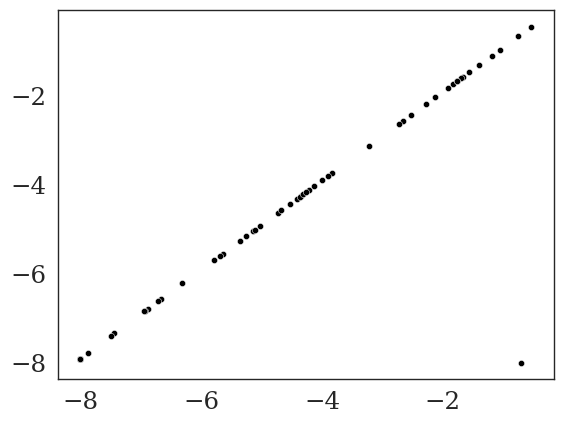

In [145]:
plt_ = sns.scatterplot(x=np.log10(x_mean), y=np.log10(x_null), s=20, c="black")

In [149]:
np.max(np.abs(np.log10(y_mean / x_null)))

3.7068749895377997

In [57]:
import statsmodels.formula.api as smf

In [63]:
np.where(dist_ == 0)[0]

array([6])

In [85]:
# check for keystone strains with bray-curtis

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     4354.
Date:                Fri, 08 Dec 2023   Prob (F-statistic):           1.96e-58
Time:                        13:18:46   Log-Likelihood:                 237.80
No. Observations:                  63   AIC:                            -471.6
Df Residuals:                      61   BIC:                            -467.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0005      0.001      0.655      0.5

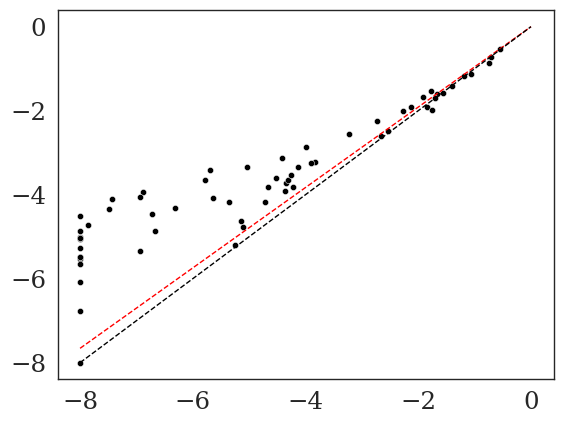

In [84]:
x = x_mean.copy()
y = dist_.copy()

y[y == 0] = 1e-8
# id_ = np.where(y > 0)[0]
# x = x[id_]
# y = y[id_]

# data = pd.DataFrame({"y":y,"x":x})
# res = smf.ols("y ~ x", data).fit()


X = sm.add_constant(np.log10(x))
# X = x
model = sm.OLS(np.log10(y), X)
res = model.fit()
print(res.summary())

plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y), s=20, c="black")
plt.plot([-8, 0], [-8 * res.params[1] + res.params[0], \
                   0 * res.params[1] + res.params[0]], c="red", linewidth=1, ls="dashed")
plt.plot([-8, 0], [-8, 0], c="black", linewidth=1, ls="dashed")

In [189]:
id_sort = np.where((np.log10(x_mean) <= -2.5) & (np.log10(x_mean) >= -4) & \
                   (np.log10(dist_pos) >= -2))[0]
print(dist_pos[id_sort])
print(species_names[id_sort])

[0.16343138 0.04312702]
['Collinsella-aerofaciens-ATCC-25986' 'Parabacteroides-merdae-ATCC-43184']


In [196]:
id_ = np.where(adj_G[id_sort[1], :] != 0)[0]
print(species_names[id_])

['Dorea-longicatena-DSM-13814' 'Eggerthella-lenta-DSM-2243']


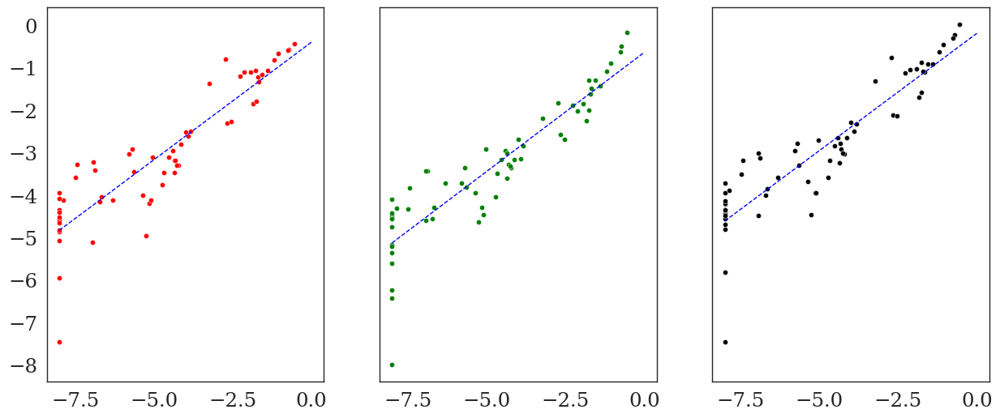

In [172]:
x = x_mean.copy()

fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey="row", sharex=None)

# upregulated
y = dist_pos.copy()

y[y == 0] = 1e-8

X = sm.add_constant(np.log10(x))
# X = x
model = sm.OLS(np.log10(y), X)
res = model.fit()
# print(res.summary())

plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y), s=20, c="red", ax=axes[0])
axes[0].plot([-8, 0], [-8 * res.params[1] + res.params[0], \
                   0 * res.params[1] + res.params[0]], c="blue", linewidth=1, ls="dashed")


# upregulated
y = dist_neg.copy()

y[y == 0] = 1e-8

X = sm.add_constant(np.log10(x))
# X = x
model = sm.OLS(np.log10(y), X)
res = model.fit()
# print(res.summary())

plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y), s=20, c="green", ax=axes[1])
axes[1].plot([-8, 0], [-8 * res.params[1] + res.params[0], \
                   0 * res.params[1] + res.params[0]], c="blue", linewidth=1, ls="dashed")

# total
y = dist_.copy()

y[y == 0] = 1e-8

X = sm.add_constant(np.log10(x))
# X = x
model = sm.OLS(np.log10(y), X)
res = model.fit()
# print(res.summary())

plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y), s=20, c="black", ax=axes[2])
axes[2].plot([-8, 0], [-8 * res.params[1] + res.params[0], \
                   0 * res.params[1] + res.params[0]], c="blue", linewidth=1, ls="dashed")

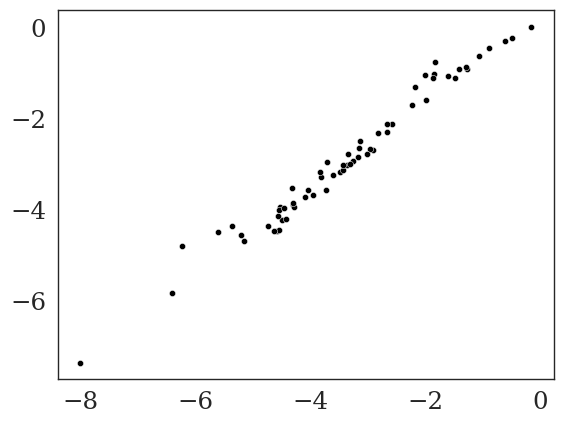

In [177]:
plt_ = sns.scatterplot(x=np.log10(dist_neg + 1e-8), y=np.log10(dist_ + 1e-8), s=20, c="black")

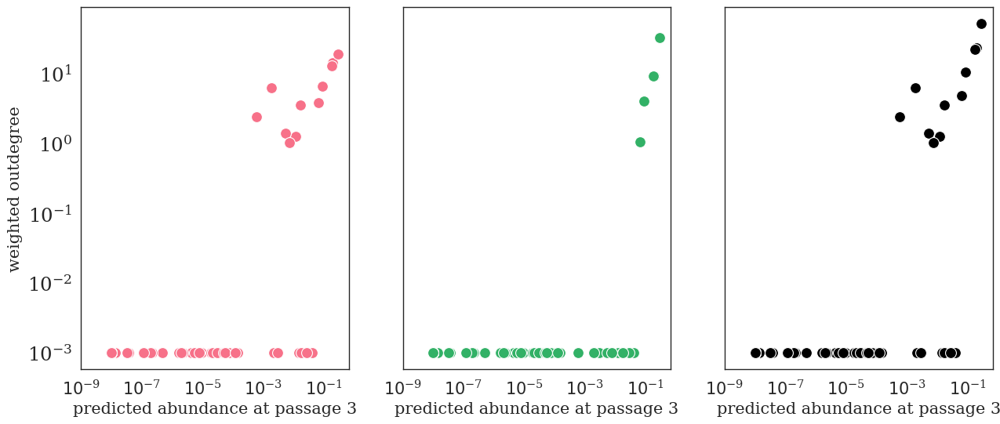

In [166]:
# Figure for paper: prediction performance with production and iterative Balone

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey="row", sharex=None)
abuns_ = abun_avg_pass_3
abuns_ = np.log(abun_pred.copy())
abun_pred_log = np.log(abun_pred.copy())
# plot abundance change
abuns_ = abun_pred_log.copy()

# up regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_x = np.sum(count_nnz, axis=1)
weighted_indeg = np.sum(count_nnz, axis=0)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_y = np.sum(count_nnz, axis=1)

num_changes_ = num_changes_x.copy() + num_changes_y.copy()

id_nnz_x = np.where((num_changes_x > 0))[0]
id_nnz_x = np.arange(len(species_names))
id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_x])), \
                       y=num_changes_x[id_nnz_x] + 1e-3, ax=axes[0], s=100, \
                       color=cols_[0])
axes[0].set_ylabel('weighted outdegree', fontsize=15)
axes[0].set_xlabel('predicted abundance at passage 3', fontsize=15)

# id_sort = np.argsort(-num_changes_x[id_nnz_x])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
axes[0].set_xscale('log', base=10)
axes[0].set_yscale('log', base=10)
xticks_ = np.arange(-9, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

    
# downregulated
id_nnz_y = np.where((num_changes_y > 0))[0]
id_nnz_y = np.arange(len(species_names))
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_y])), \
                       y=num_changes_y[id_nnz_y] + 1e-3, ax=axes[1], s=100, \
                       color=cols_[3])
# axes[1].set_ylabel('weighted indegree', fontsize=15)
axes[1].set_xlabel('predicted abundance at passage 3', fontsize=15)
axes[1].set_xscale('log', base=10)
axes[1].set_yscale('log', base=10)
xticks_ = np.arange(-9, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)


# total
id_nnz_ = np.where((num_changes_ > 0))[0]
id_nnz_ = np.arange(len(species_names))
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_])), \
                       y=num_changes_[id_nnz_] + 1e-3, ax=axes[2], s=100, \
                       color="black")
# axes[1].set_ylabel('weighted indegree', fontsize=15)
axes[2].set_xlabel('predicted abundance at passage 3', fontsize=15)
axes[2].set_xscale('log', base=10)
axes[2].set_yscale('log', base=10)
xticks_ = np.arange(-9, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[2].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)


# save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
#                                         'predictions', 'leaveOneOut', \
#                                         f'{date_meeting}_for_paper_' + \
#                                         f'_Ri_fit_dynamic_with_production' + \
#                                         f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
#                                         f'_pass_1to2', 'figures_paper'))
# if not os.path.exists(save_dir):
#    # Create a new directory because it does not exist
#    os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'species_perturb_unweighted_outdegree_vs_pred_abun.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

In [163]:
num_changes_x

array([ 0.        , 13.94382237,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  1.24350701,
        0.        ,  0.        ,  3.7203666 , 12.74132133,  0.        ,
        1.37001364,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , 18.83363076,  6.1884141 ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  6.49173936,  0.        ,  0.        ,  2.35553018,
        1.00565324,  0.        ,  0.        ,  3.49858174,  0.        ,
        0.        ,  0.        ,  0.        ])

0.1933711683876213
Acidaminococcus-intestini-D21
high abundance strain knock-out
PearsonRResult(statistic=0.9263258437957282, pvalue=4.022422093689312e-27)
4.424171136698194e-06
Acidaminococcus-fermentans-DSM-20731
low abundance strain knock-out
PearsonRResult(statistic=0.9999999879203886, pvalue=3.1881862092341867e-230)


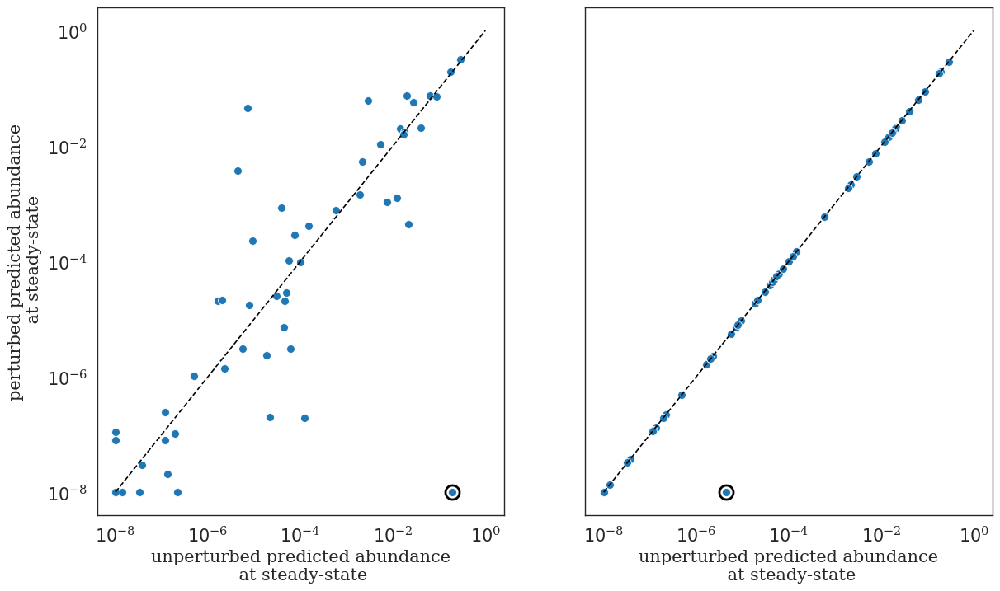

In [354]:
# Figure for paper: prediction performance with production and iterative Balone

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 2, figsize=(14, 8), sharey="row", sharex=None)
abuns_ = abun_avg_pass_3
abuns_ = np.log(abun_pred.copy())
abun_pred_log = np.log(abun_pred.copy())
# plot abundance change
abuns_ = abun_pred_log.copy()

st_ = 1
print(x_mean[st_])
print(species_names[st_])
plt_ = sns.scatterplot(x=[x_mean[st_]], y=[abun_pertub_list[st_][st_]], \
                       ax=axes[0], s=150, linewidth=2, marker='o', edgecolor='black', \
                       color='white')
plt_ = sns.scatterplot(x=(x_mean), y=(abun_pertub_list[st_]), \
                       ax=axes[0], s=50)
axes[0].plot([10.0**-8, 1], [10.0**-8, 1], c="black", linestyle='dashed')
print(f'high abundance strain knock-out')
id_corr = np.array(list(set(list(np.arange(len(species_names)))) - set([st_])))
print(scipy.stats.pearsonr(np.log10(x_mean[id_corr]), np.log10(abun_pertub_list[st_][id_corr])))
axes[0].set_ylabel('perturbed predicted abundance\n at steady-state', fontsize=15)
axes[0].set_xlabel('unperturbed predicted abundance\n at steady-state', fontsize=15)
    
axes[0].set_xscale('log', base=10)
xticks_ = np.arange(-8, 1, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

axes[0].set_yscale('log', base=10)
axes[0].set_yticks(xticks_pow, labels=xlabs_, fontsize=15)

    
st_ = 0
print(x_mean[st_])
print(species_names[st_])
plt_ = sns.scatterplot(x=[x_mean[st_]], y=[abun_pertub_list[st_][st_]], \
                       ax=axes[1], s=150, linewidth=2, marker='o', edgecolor='black', \
                       color='white')
plt_ = sns.scatterplot(x=(x_mean), y=(abun_pertub_list[st_]), \
                       ax=axes[1], s=50)
axes[1].plot([10.0**-8, 1], [10.0**-8, 1], c="black", linestyle='dashed')
print(f'low abundance strain knock-out')
id_corr = np.array(list(set(list(np.arange(len(species_names)))) - set([st_])))
print(scipy.stats.pearsonr(np.log10(x_mean[id_corr]), np.log10(abun_pertub_list[st_][id_corr])))
axes[1].set_ylabel('perturbed predicted abundance\n at steady-state', fontsize=15)
axes[1].set_xlabel('unperturbed predicted abundance\n at steady-state', fontsize=15)
    
axes[1].set_xscale('log', base=10)
xticks_ = np.arange(-8, 1, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

axes[1].set_yscale('log', base=10)
axes[1].set_yticks(xticks_pow, labels=xlabs_, fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_high_vs_low_abun_strains.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

In [120]:
species_names

array(['Acidaminococcus-fermentans-DSM-20731',
       'Acidaminococcus-intestini-D21', 'Anaerostipes-caccae-DSM-14662',
       'Anaerotruncus-colihominis-DSM-17241',
       'Bacteroides-caccae-ATCC-43185',
       'Bacteroides-cellulosilyticus-DSM-14838',
       'Bacteroides-coprophilus-DSM-18228', 'Bacteroides-dorei-5-1-36-D4',
       'Bacteroides-dorei-DSM-17855', 'Bacteroides-eggerthii-DSM-20697',
       'Bacteroides-finegoldii-DSM-17565', 'Bacteroides-fragilis-3-1-12',
       'Bacteroides-intestinalis-DSM-17393',
       'Bacteroides-ovatus-ATCC-8483', 'Bacteroides-plebeius-DSM-17135',
       'Bacteroides-thetaiotaomicron-1-1-6',
       'Bacteroides-fragilis-2-1-16', 'Bacteroides-sp-2-1-22',
       'Bacteroides-sp-3-1-19', 'Bacteroides-sp-9-1-42FAA',
       'Bacteroides-sp-D2', 'Bacteroides-stercoris-ATCC-43183',
       'Bacteroides-thetaiotaomicron-VPI-5482',
       'Bacteroides-uniformis-ATCC-8492',
       'Bacteroides-vulgatus-ATCC-8482',
       'Bifidobacterium-adolescentis-L2-32

0.1933711683876213
PearsonRResult(statistic=0.861516099096682, pvalue=1.2986263238833695e-19)


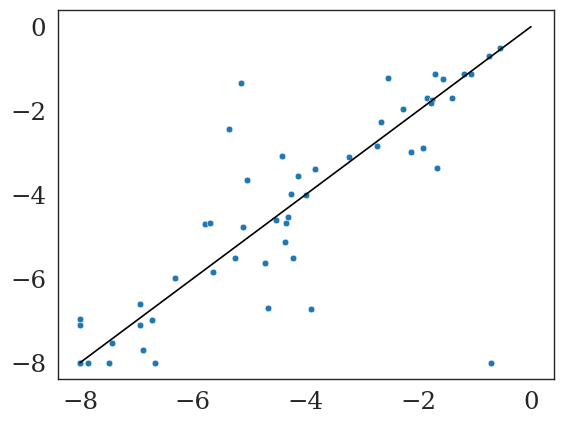

In [101]:
st_ = 1
print(x_mean[st_])
plt_ = sns.scatterplot(x=np.log10(x_mean), y=np.log10(abun_pertub_list[st_]))
plt.plot([-8, 0], [-8, 0], c="black")
print(scipy.stats.pearsonr(np.log10(x_mean), np.log10(abun_pertub_list[st_])))

In [79]:
x_mean[s_]
abun_pred

array([4.42417114e-06, 1.93371168e-01, 4.03170744e-02, 1.36291723e-08,
       1.00000000e-08, 4.86545185e-07, 1.00000000e-08, 9.28397560e-06,
       1.00762267e-04, 2.15469060e-03, 2.28210893e-06, 2.91696816e-03,
       3.89194505e-05, 1.45270874e-02, 7.22860812e-06, 1.87894057e-05,
       6.02196680e-05, 2.13370388e-02, 1.46884979e-04, 1.19477845e-02,
       2.17661486e-07, 1.96902844e-02, 6.40442927e-02, 1.77963801e-01,
       2.14161221e-05, 5.34645561e-03, 4.52415849e-05, 4.36661014e-05,
       1.00000000e-08, 7.37098247e-05, 1.00000000e-08, 2.98923737e-05,
       2.86548545e-01, 1.89052974e-03, 3.69484512e-08, 1.31590263e-07,
       1.62686342e-06, 1.16914680e-07, 1.00000000e-08, 4.86197755e-05,
       1.00000000e-08, 1.91972225e-07, 5.51177068e-05, 3.25186909e-08,
       1.00000000e-08, 1.74006748e-02, 1.00000000e-08, 1.16045624e-07,
       1.00000000e-08, 1.00000000e-08, 1.00000000e-08, 8.70468607e-02,
       5.60769511e-06, 1.00000000e-08, 5.90017630e-04, 7.44698369e-03,
      

In [152]:
# passage 3 abundance for the unperturbed metabs
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log(abun_avg_pass_3), axis=1)

In [153]:
# df_perturb_net['species_abun_obs'] = np.exp(abun_avg_pass_3[df_perturb_net['species_perturbed'].values])
# df_perturb_net_full['species_abun_obs'] = np.exp(abun_avg_pass_3[df_perturb_net_full['species_perturbed'].values])

In [154]:
df_perturb_net['species_abun_obs'] = np.exp(abun_avg_pass_3[df_perturb_net['species_perturbed'].values])
df_perturb_net_full['species_abun_obs'] = np.exp(abun_avg_pass_3[df_perturb_net_full['species_perturbed'].values])

In [288]:
date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_perturb_strains_outnetwork.pickle'))
df_net_obj = {'df_perturb_net' : df_perturb_net, \
              'df_perturb_net_full' : df_perturb_net_full}
with open(file_save, "wb") as file_:
      pickle.dump(df_net_obj, file_)

In [178]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                            'predictions', 'leaveOneOut', \
                            f'{date_meeting}_for_paper_' + \
                            f'_Ri_fit_dynamic_with_production' + \
                            f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                            f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'df_perturb_net.pickle'))

with open(file_save, "wb") as file_:
     pickle.dump(df_perturb_net, file_) 
        

In [179]:
np.exp(abun_avg_pass_3)[1]

0.2892740182944301

In [57]:
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log(abun_avg_pass_3), axis=1)
id_species_order = np.argsort(-abun_avg_pass_3)
np.exp(abun_avg_pass_3)[id_species_order]

array([2.89274018e-01, 2.42199233e-01, 6.19659039e-02, 5.57492250e-02,
       5.54222634e-02, 4.86556195e-02, 4.56216287e-02, 4.43732049e-02,
       2.83096225e-02, 1.98363782e-02, 1.54603307e-02, 8.59233939e-03,
       7.12048815e-03, 5.77015209e-03, 5.07810532e-03, 4.47801175e-03,
       3.84687210e-03, 2.37350667e-03, 2.10549131e-03, 1.80813904e-03,
       1.20905119e-03, 1.07275342e-03, 8.98514441e-04, 8.21638705e-04,
       5.49079142e-04, 3.99905327e-04, 3.85355449e-04, 2.50154170e-04,
       1.97671198e-04, 1.89343428e-04, 1.11610003e-04, 1.07892127e-04,
       8.53303518e-05, 7.82053870e-05, 4.26537462e-05, 1.90285542e-05,
       1.35266883e-05, 9.42488423e-06, 7.95170221e-06, 7.56235535e-06,
       6.36790988e-06, 6.12650117e-06, 3.61548379e-06, 3.09528687e-06,
       1.24160585e-06, 7.25509592e-07, 2.45896452e-07, 1.54806073e-07,
       9.87951154e-08, 6.75188399e-08, 2.97567113e-08, 2.82613277e-08,
       2.43820506e-08, 2.05426682e-08, 2.05376605e-08, 1.97165837e-08,
      

In [155]:
x_obs = df_perturb_net['species_abun_obs'].values
x = df_perturb_net['species_unperturbed_abun'].values
y = df_perturb_net['species_perturbed_abun'].values
col_type = df_perturb_net['species_type'].values
# id_filter = np.where((np.abs(np.log10(x) - np.log10(x_obs)) - np.abs(np.log10(y) - np.log10(x_obs)) <= -1) & \
#                      (col_type == "green"))[0]
# id_filter = np.where((np.abs(np.log10(x) - np.log10(x_obs)) - np.abs(np.log10(y) - np.log10(x_obs)) <= -1))[0]
# id_filter = np.where((np.abs(np.log10(y) - np.log10(x)) >= 2))[0]
id_filter = np.arange(df_perturb_net.shape[0])
df_perturb_net_filter = df_perturb_net.copy()
df_perturb_net_filter = df_perturb_net_filter.iloc[id_filter, :]

In [156]:
print(df_perturb_net_filter.shape)
print(df_perturb_net_full.shape)

(108, 7)
(800, 7)


In [157]:
df_perturb_net_filter

,species_knocked,species_type,species_perturbed,species_perturbed_type,species_unperturbed_abun,species_perturbed_abun,species_abun_obs
0,1.0,green,0,1.0,4.424171e-06,3.697888e-03,7.820539e-05
1,1.0,green,1,0.0,1.933712e-01,1.000000e-08,2.892740e-01
2,1.0,green,7,1.0,9.283976e-06,2.296923e-04,1.808139e-03
3,1.0,green,11,1.0,2.916968e-03,6.155613e-02,4.478012e-03
4,1.0,green,12,1.0,3.891945e-05,8.421511e-04,3.999053e-04
...,...,...,...,...,...,...,...
0,35.0,green,35,0.0,1.315903e-07,1.000000e-08,2.975671e-08
0,26.0,gray,26,0.0,4.524158e-05,1.000000e-08,2.054267e-08
0,61.0,gray,61,0.0,7.869836e-06,1.000000e-08,2.053766e-08
0,27.0,gray,27,0.0,4.366610e-05,1.000000e-08,1.000000e-08


In [203]:
np.min(np.log10(np.exp(abun_avg_pass_3)))
10 + np.log10(np.exp(abun_avg_pass_3))

array([5.89323667, 9.46130943, 8.45193408, 2.45119256, 5.13119148,
       3.86064316, 2.82942497, 7.25723182, 9.38417276, 4.90046011,
       4.80399691, 7.65108523, 6.60195719, 8.18921878, 2.99473547,
       8.65917079, 7.58510775, 7.93411142, 6.5858615 , 6.29594339,
       6.91468089, 8.74368426, 8.79215279, 8.74623883, 5.93110354,
       7.76118726, 2.31265685, 2.        , 2.38707023, 5.62995718,
       2.        , 7.03049991, 7.85250977, 7.37539046, 4.4907009 ,
       2.47358493, 6.27725023, 3.18978799, 6.39820775, 6.04770312,
       2.        , 6.03298976, 6.95352506, 2.29483167, 4.55816642,
       8.6471208 , 2.        , 2.        , 4.97427602, 4.09398375,
       3.39075226, 8.68713301, 4.87865708, 4.78721252, 7.08244469,
       8.29746238, 6.73963495, 2.        , 7.7057017 , 5.27940579,
       7.32335345, 2.31255097, 2.        ])

In [228]:
print(species_names)
df_names_convert

['Acidaminococcus fermentans DSMZ 20731'
 'Acidaminococcus intestini D21 BEI HM-81'
 'Anaerostipes caccae DSMZ 14662' 'Anaerotruncus colihominis DSMZ 17241'
 'Bacteroides caccae ATCC 43185' 'Bacteroides cellulosilyticus DSMZ 14838'
 'Bacteroides coprophilus DSMZ 18228'
 'Bacteroides dorei 5_1_36/D4 BEI HM-29' 'Bacteroides dorei DSMZ 17855'
 'Bacteroides eggerthii ATCC 27754' 'Bacteroides finegoldii DSMZ 17565'
 'Bacteroides fragilis 3_1_12 BEI HM-20'
 'Bacteroides intestinalis DSMZ 17393' 'Bacteroides ovatus ATCC 8483'
 'Bacteroides plebeius DSMZ 17135' 'Bacteroides sp. 1_1_6 BEI HM-23'
 'Bacteroides sp. 2_1_16 BEI HM-58' 'Bacteroides sp. 2_1_22 BEI HM-18'
 'Bacteroides sp. 3_1_19 BEI HM-19' 'Bacteroides sp. 9_1_42FAA BEI HM-27'
 'Bacteroides sp. D20 BEI HM-189' 'Bacteroides stercoris ATCC 43183'
 'Bacteroides thetaiotaomicron VPI 5482' 'Bacteroides uniformis ATCC 8492'
 'Bacteroides vulgatus ATCC 8482' 'Bifidobacterium adolescentis L2-32'
 'Bifidobacterium infantis ATCC 15697' 'Blauti

,used_name,jinPollard_name
0,Acidaminococcus fermentans DSMZ 20731,Acidaminococcus-fermentans-DSM-20731
1,Acidaminococcus intestini D21 BEI HM-81,Acidaminococcus-intestini-D21
2,Anaerostipes caccae DSMZ 14662,Anaerostipes-caccae-DSM-14662
3,Anaerotruncus colihominis DSMZ 17241,Anaerotruncus-colihominis-DSM-17241
4,Bacteroides caccae ATCC 43185,Bacteroides-caccae-ATCC-43185
...,...,...
58,Ruminococcus gnavus ATCC 29149,Ruminococcus-gnavus-ATCC-29149
59,Ruminococcus torques ATCC 27756,Ruminococcus-torques-ATCC-27756
60,Slackia exigua ATCC 700122,Slackia-exigua-ATCC-700122
61,Streptococcus thermophilus LMD-9 ATCC 19258,Streptococcus-thermophilus-LMD-9


In [158]:
G = nx.DiGraph()
# id_species_order = np.argsort(abun_avg_pass_3)
id_species_order = np.argsort(abun_pred)
species_order = np.zeros(num_species)
species_order[id_species_order] = (np.arange(num_species) / num_species)
# species_order = 8.1 + np.log10(np.exp(abun_avg_pass_3))
# species_order = np.exp(abun_avg_pass_3)
species_order = abun_pred.copy()
col_species = []
for s_ in range(num_species):
    if np.abs(np.log10(x_mean[s_]) - np.log10(np.exp(abun_avg_pass_3[s_]))) < 1:
#         col_ = "gray"
        col_ = "white"
#         G.add_nodes_from([(species_names[s_], {"abundance_obs" : species_order[s_], "node_color" : col_})])
    else:
        col_ = "white"
#     G.add_nodes_from([(species_names[s_], {"abundance_obs" : species_order[s_], "node_color" : col_})])
    G.add_nodes_from([(f'{s_ + 1}', {"abundance_obs" : species_order[s_], "node_color" : col_})])
#     G.add_nodes_from([(f'{df_names_convert.iloc[s_, 1]}', {"abundance_obs" : species_order[s_], "node_color" : col_})])
    col_species.append(col_)
col_species = np.array(col_species)    

In [159]:
red_ = '#e41a1c'
blue_ = '#4daf4a'
perturbed_nodes = {}
perturbed_nodes_col = {}
for row_ in range(num_species):
    perturbed_nodes[row_] = []
    perturbed_nodes_col[row_] = []
for row_ in range(df_perturb_net_filter.shape[0]):
    src_ = df_perturb_net_filter['species_knocked'].values[row_]
    dest_ = df_perturb_net_filter['species_perturbed'].values[row_]
    
    if (src_ != dest_):
        perturbed_nodes[int(src_)].append(int(dest_))
        type_ = df_perturb_net_filter['species_perturbed_type'].values[row_]
        if type_ == 1:
            col_ = red_
        else:
            col_ = blue_
        perturbed_nodes_col[int(src_)].append(col_)
for row_ in range(num_species):
    perturbed_nodes[row_] = np.array(perturbed_nodes[row_])
    perturbed_nodes_col[row_] = np.array(perturbed_nodes_col[row_])

In [160]:
red_ = '#e41a1c'
blue_ = '#4daf4a'
edges_ = []
competition_ = []
cross_feeding = []
competition_with_increased = []
# for row_ in range(num_species):
#     competition_with_increased[row_] = {}
src_abun = []
col_edges = []
col_edges_full = []
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
zero_thresh_Ri = 1e-8
# Ri_avg[Ri_avg >= zero_thresh_Ri] = 1
Ri_avg[Ri_avg < zero_thresh_Ri] = 0
for row_ in range(df_perturb_net_filter.shape[0]):
    src_ = df_perturb_net_filter['species_knocked'].values[row_]
    dest_ = df_perturb_net_filter['species_perturbed'].values[row_]
    
    if (src_ != dest_):
#     if (src_ != dest_) and (col_species[int(src_)] == "gray") and (col_species[int(dest_)] == "gray"):
        type_ = df_perturb_net_filter['species_perturbed_type'].values[row_]
        if type_ == 1:
            col_ = red_
        else:
            col_ = blue_
        col_edges_full.append(col_)
#         src_abun.append(abun_avg_pass_3[int(src_)])
        src_abun.append(abun_pred[int(src_)])
        vec_src = df_speciesMetab_cluster.iloc[int(src_), :].values
        vec_prod_src = df_speciesMetab_prod_cluster.iloc[int(src_), :].values
        vec_dest = df_speciesMetab_cluster.iloc[int(dest_), :].values
        nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
        nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
        tmp = np.sum(Ri_avg * vec_src * Ri_avg * vec_dest) / \
            (np.sqrt(np.sum(np.power(Ri_avg * vec_src, 2))) * \
             np.sqrt(np.sum(np.power(Ri_avg * vec_dest, 2))))
        competition_.append(nnz_common / nnz_dest)
#         competition_.append(tmp)
        
        nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
        nnz_common = len(np.where(Ri_avg * vec_dest * vec_prod_src != 0)[0])
        tmp = np.sum(Ri_avg * vec_prod_src * Ri_avg * vec_dest) / \
            (np.sqrt(np.sum(np.power(Ri_avg * vec_prod_src, 2))) * \
             np.sqrt(np.sum(np.power(Ri_avg * vec_dest, 2))))
        cross_feeding.append(nnz_common / nnz_dest)
#         cross_feeding.append(tmp)

        id_blue = np.where(perturbed_nodes_col[int(src_)] == blue_)[0]
        id_red = np.where(perturbed_nodes_col[int(src_)] == red_)[0]
        
        if (col_ == blue_) and (len(id_red) > 0):
            competition_with_increased_tmp = []
            vec_dest = df_speciesMetab_cluster.iloc[int(dest_), :].values
            nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
            for id_2 in range(len(id_red)):
                src_tmp = perturbed_nodes[int(src_)][id_red[id_2]]
                vec_src = df_speciesMetab_cluster.iloc[src_tmp, :].values
                nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
                tmp = np.sum(Ri_avg * vec_src * Ri_avg * vec_dest) / \
                    (np.sqrt(np.sum(np.power(Ri_avg * vec_src, 2))) * \
                     np.sqrt(np.sum(np.power(Ri_avg * vec_dest, 2))))
                competition_with_increased_tmp.append(nnz_common / nnz_dest)
#                 competition_with_increased_tmp.append(tmp)
            competition_with_increased_tmp = np.array(competition_with_increased_tmp)
#                 id_max = \
#                     np.where(competition_with_increased_tmp == \
#                              np.max(competition_with_increased_tmp))[0]
            competition_with_increased.append(np.median(competition_with_increased_tmp))
#             competition_with_increased.append(np.median(np.array(competition_with_increased_tmp)))
        
    if (src_ != dest_):
#     if (src_ != dest_) and (col_species[int(src_)] == "gray") and (col_species[int(dest_)] == "gray"):
#     if (src_ != dest_) and (col_species[int(src_)] == "gray"):
#         print(f'row = {row_}')
        type_ = df_perturb_net_filter['species_perturbed_type'].values[row_]
        if type_ == 1:
            col_ = red_
        else:
            col_ = blue_
        col_edges.append(col_)
#         vec_src = df_speciesMetab_cluster.iloc[int(src_), :].values
#         vec_prod_src = df_speciesMetab_prod_cluster.iloc[int(src_), :].values
#         vec_dest = df_speciesMetab_cluster.iloc[int(dest_), :].values
#         nnz_dest = len(np.where(vec_dest != 0)[0])
#         nnz_common = len(np.where((vec_dest * vec_src) != 0)[0])
#         tmp = np.sum(vec_src * vec_dest) / \
#             (np.sqrt(np.sum(np.power(vec_src, 2))) * np.sqrt(np.sum(np.power(vec_dest, 2))))
# #         competition_.append(nnz_common / nnz_dest)
#         competition_.append(tmp)
        
#         nnz_dest = len(np.where(vec_dest != 0)[0])
#         nnz_common = len(np.where(vec_dest * vec_prod_src != 0)[0])
#         tmp = np.sum(vec_prod_src * vec_dest) / \
#             (np.sqrt(np.sum(np.power(vec_prod_src, 2))) * np.sqrt(np.sum(np.power(vec_dest, 2))))
# #         cross_feeding.append(nnz_common / nnz_dest)
#         cross_feeding.append(tmp)
        
        weight_ = np.abs(np.log10(df_perturb_net_filter['species_unperturbed_abun'].values[row_]) - \
                         np.log10(df_perturb_net_filter['species_perturbed_abun'].values[row_]))
#         edges_.append((species_names[int(src_)], \
#                        species_names[int(dest_)], {'increased abundance': col_, 'weight' : weight_}))
        edges_.append((f'{int(src_ + 1)}', \
                       f'{int(dest_ + 1)}', {'increased abundance': col_, 'weight' : weight_}))
G.add_edges_from(edges_)
competition_ = np.array(competition_)
competition_with_increased = np.array(competition_with_increased)
src_abun = np.array(src_abun)
col_edges = np.array(col_edges)
col_edges_full = np.array(col_edges_full)
# col_edges_full = col_edges.copy()
cross_feeding = np.array(cross_feeding)

SignificanceResult(statistic=-0.4327875761913309, pvalue=0.00044276241585924187)


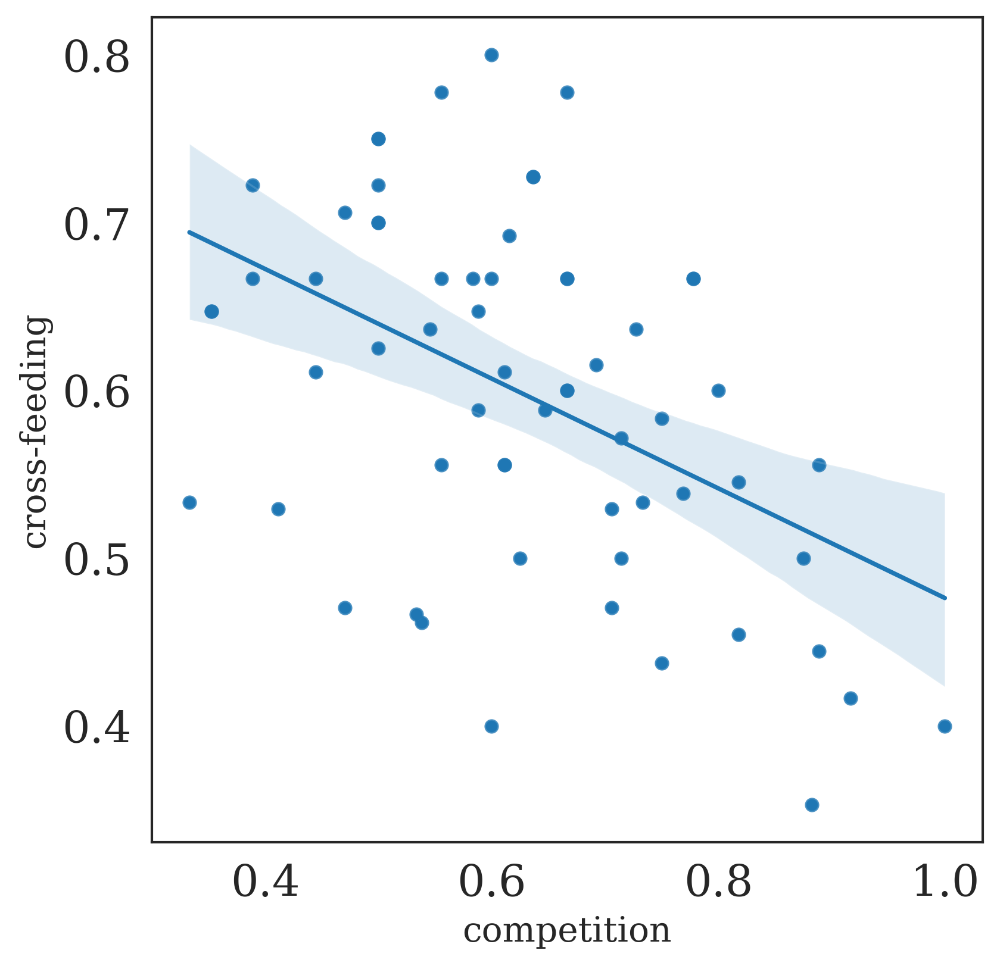

In [64]:
date_ = '20230912'
date_meeting = '20230912'

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)

y = cross_feeding
x = competition_
plt_ = sns.scatterplot(x=x, y=y)
plt_ = sns.regplot(x=x, y=y)
print(scipy.stats.spearmanr(x, y))
plt_.set_xlabel('competition', fontsize=14)
plt_.set_ylabel('cross-feeding', fontsize=14)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'competition_vs_cross_feeding.pdf'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close()

In [143]:
# len(weights)
# node_size_
A = nx.adjacency_matrix(G)
A = A.todense()

/tmp/ipykernel_13290/815537651.py:3: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  A = nx.adjacency_matrix(G)


In [161]:
# get adjacency matrix
adj_G = np.zeros((num_species, num_species))
edges = G.edges()
nodes_ = G.nodes()
for u,v in edges:
    i = int(u) - 1
    j = int(v) - 1
    if G[u][v]['increased abundance'] == red_:
        adj_G[i, j] = G[u][v]['weight']
    else:
        adj_G[i, j] = -G[u][v]['weight']

In [52]:
len(np.where(adj_G != 0)[0])

62

In [450]:
len(np.where(adj_G[1, :] != 0)[0])

12

In [338]:
species_names[abun_avg_pass_3 == np.max(abun_avg_pass_3)]
np.exp(abun_avg_pass_3[id_order[32]])
species_names[32]
# np.where(abun_avg_pass_3 == np.max(abun_avg_pass_3))
(np.exp(abun_avg_pass_3[32]))

0.007120488146377777

In [333]:
species_names[32]
id_order = np.argsort(-abun_avg_pass_3)
id_order
species_names[32]
(np.exp(abun_avg_pass_3[1])) / np.exp(abun_avg_pass_3[32])
# species_names[32]

40.625588070332654

In [129]:
adj_bin = np.zeros((adj_G.shape))
adj_bin[adj_G != 0] = 1
outdeg = np.sum(adj_bin, axis=1)
len(np.where(outdeg != 0)[0])

11

In [249]:
df_perturb_net_full

,species_knocked,species_type,species_perturbed,species_perturbed_type,species_unperturbed_abun,species_perturbed_abun,species_abun_obs
0,1,green,0,1.0,5.502265e-07,1.489743e-03,7.820539e-05
1,1,green,1,0.0,2.324020e-01,1.000000e-08,2.892740e-01
2,1,green,2,0.0,4.322055e-02,2.377058e-02,2.830962e-02
3,1,green,4,1.0,1.000000e-08,1.071925e-08,1.352669e-05
4,1,green,5,1.0,1.000000e-08,1.622172e-08,7.255096e-07
...,...,...,...,...,...,...,...
0,57,green,6,0.0,2.008432e-08,1.000000e-08,6.751884e-08
0,30,green,6,0.0,2.008432e-08,1.000000e-08,6.751884e-08
0,47,green,6,0.0,2.008432e-08,1.000000e-08,6.751884e-08
0,46,green,6,0.0,2.008432e-08,1.000000e-08,6.751884e-08


In [ ]:
-(np.log10(df_perturb_net_full['species_unperturbed_abun'].values[row_]) - \
                         np.log10(df_perturb_net_full['species_perturbed_abun'].values[row_]))

In [456]:
adj_G = np.zeros((num_species, num_species))
for sp_ in range(len(species_names)):
    id_ = np.where(df_perturb_net_full.iloc[:, 0].values == sp_)[0]
    if len(id_) > 0:
#         id_pert = 
        weight_ = -(np.log10(df_perturb_net_full['species_unperturbed_abun'].values[id_]) - \
                         np.log10(df_perturb_net_full['species_perturbed_abun'].values[id_]))
        adj_G[sp_, df_perturb_net_full.iloc[id_, 2].values] = weight_
    adj_G[sp_, sp_] = 0

In [204]:
adj_G1 = adj_G.copy()

In [461]:
len(np.where(adj_G != 0)[0])

61

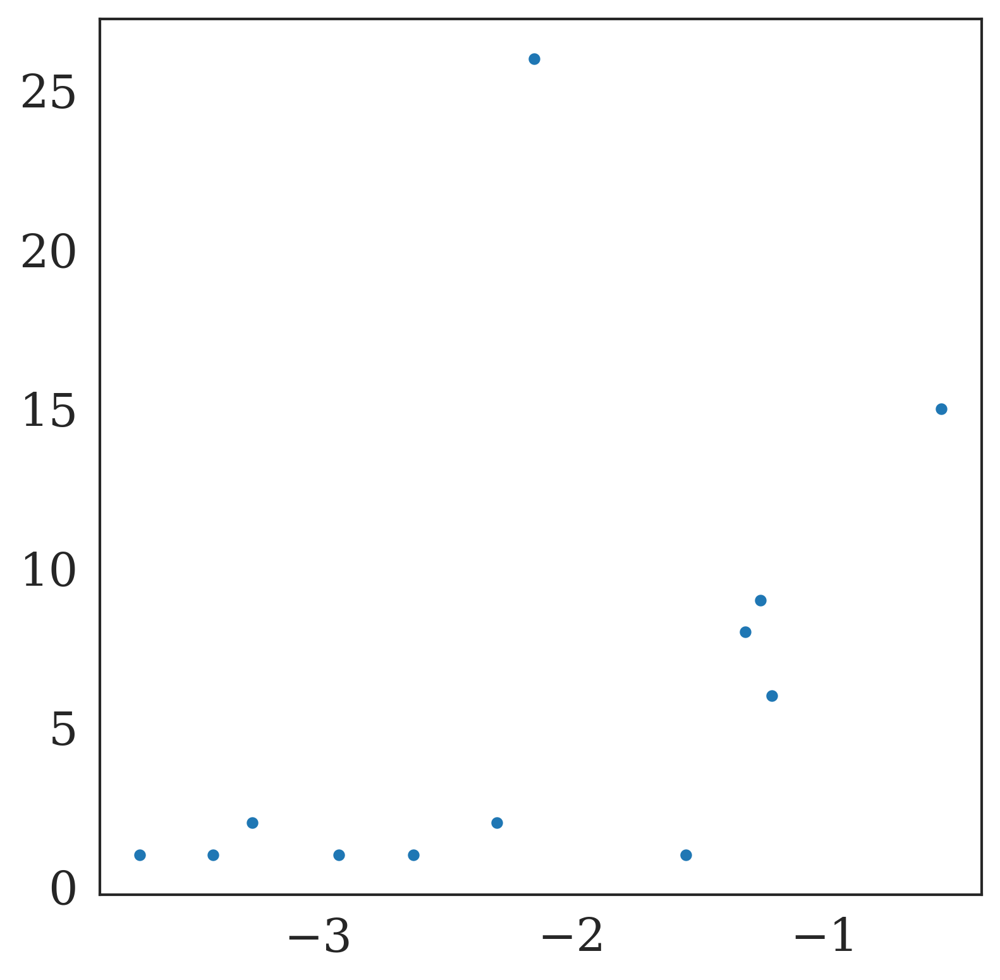

In [96]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)
id_ = np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0]
len(np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0])

abuns_ = abun_avg_pass_3
type_ = np.array(['non keystone'] * len(abun_avg_pass_3), dtype=object)
type_[id_] = 'keystone'
# plt_ = sns.histplot(x=abuns_, hue=type_)

count_nnz = np.zeros((num_species, num_species))
id_ = np.where(np.abs(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes = np.sum(count_nnz, axis=1)

id_nnz_ = np.where(np.sum(np.abs(adj_bin), axis=1) != 0)
plt_ = sns.scatterplot(x=np.log10(np.exp(abun_avg_pass_3[id_nnz_])), y=num_changes[id_nnz_])

In [102]:
species_names[num_changes >= 25]
np.log10(np.exp(abun_avg_pass_3[num_changes >= 25]))
abun_avg_pass_3[num_changes == 15]

array([-1.24038088])

In [97]:
abun_avg_pass_3

array([ -9.45617203,  -1.24038088,  -3.56455351, -17.38177148,
       -11.21084591, -14.13639154, -16.51085917,  -6.31545712,
        -1.41799462, -11.74212454, -11.96423926,  -5.40857614,
        -7.82428272,  -4.16947785, -16.13021767,  -3.08737336,
        -5.5604949 ,  -4.75688424,  -7.86134441,  -8.52890552,
        -7.10420979,  -2.8927739 ,  -2.78117098,  -2.88689177,
        -9.36898034,  -5.15505684, -17.70076174, -18.42068074,
       -17.52941861, -10.06239545, -18.42068074,  -6.83752665,
        -4.944779  ,  -6.04338681, -12.68562997, -17.33021114,
        -8.57194811, -15.68109264,  -8.29343315,  -9.10049988,
       -18.42068074,  -9.13437865,  -7.01476778, -17.74180574,
       -12.53028488,  -3.11511949, -18.42068074, -18.42068074,
       -11.57215711, -13.59910497, -15.21835532,  -3.02298797,
       -11.79232786, -12.00288674,  -6.71791936,  -3.92023774,
        -7.50726797, -18.42068074,  -5.28281705, -10.86956985,
        -6.16320644, -17.70100554, -18.42068074])

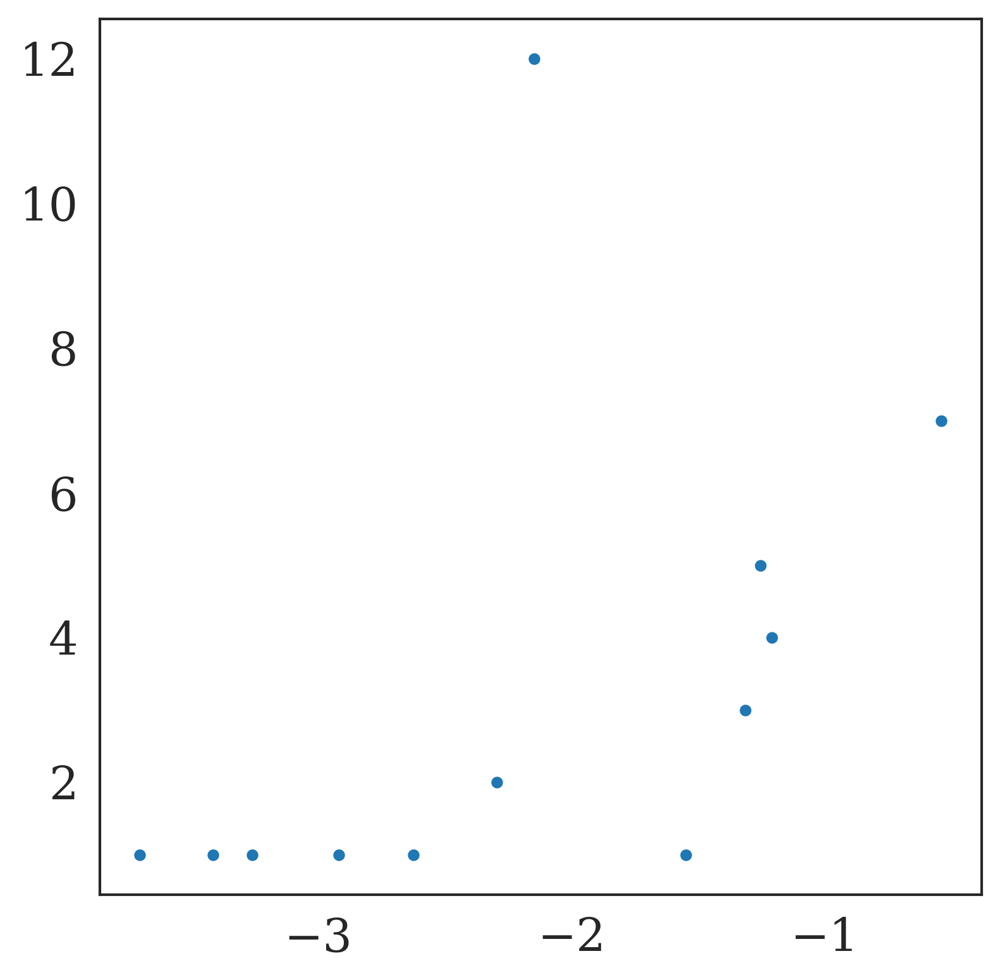

In [107]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)
id_ = np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0]
len(np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0])

abuns_ = abun_avg_pass_3
type_ = np.array(['non keystone'] * len(abun_avg_pass_3), dtype=object)
type_[id_] = 'keystone'
# plt_ = sns.histplot(x=abuns_, hue=type_)

count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes = np.sum(count_nnz, axis=1)

id_nnz_ = np.where(np.sum(np.abs(adj_bin), axis=1) != 0)
plt_ = sns.scatterplot(x=np.log10(np.exp(abun_avg_pass_3[id_nnz_])), y=num_changes[id_nnz_])

In [297]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

0.8995006242197253
0.9200419379759409
1.059288537549407
2.9117451337480794e-36
0.9263953939046229
1.0790678318768214
(1.0011949258757422, 1.1569407378779006)


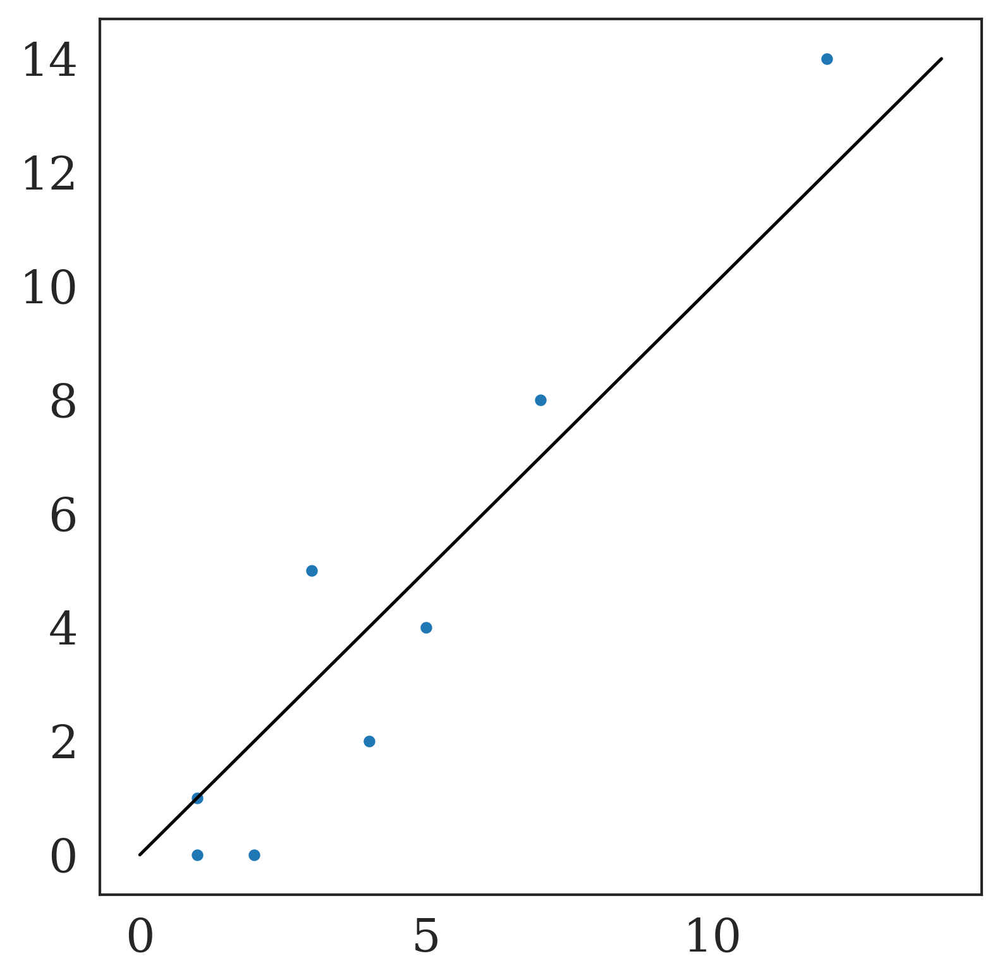

In [213]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)
id_ = np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0]
len(np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0])

abuns_ = abun_avg_pass_3
type_ = np.array(['non keystone'] * len(abun_avg_pass_3), dtype=object)
type_[id_] = 'keystone'
# plt_ = sns.histplot(x=abuns_, hue=type_)

# up regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_x = np.sum(count_nnz, axis=1)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_y = np.sum(count_nnz, axis=1)

id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=num_changes_x[id_nnz_], y=num_changes_y[id_nnz_])
max_val = np.max([np.max(num_changes_x), np.max(num_changes_y)])
plt.plot([0, max_val], [0, max_val], c='black')
# num_changes_x = num_changes_x[id_nnz_]
# num_changes_y = num_changes_y[id_nnz_]
ss_res_1 = np.sum(np.power(num_changes_x - num_changes_y, 2))
ss_tot_1 = np.sum(np.power(num_changes_x - np.mean(num_changes_x), 2))
R2_1 = 1 - ss_res_1 / ss_tot_1
print(R2_1)

ss_res_2 = np.sum(np.power(num_changes_x - num_changes_y, 2))
ss_tot_2 = np.sum(np.power(num_changes_y - np.mean(num_changes_y), 2))
R2_2 = 1 - ss_res_2 / ss_tot_2
print(R2_2)


model = LinearRegression(fit_intercept=False)

# Reshape x to a 2D array (required by sklearn)
x = num_changes_x.reshape(-1, 1)
y = num_changes_y.copy()

# Fit the model to the data
model.fit(x, y)

# Extract the slope (m) from the model
slope = model.coef_[0]
print(slope)


# Add a constant term to the input data for statsmodels
x_with_constant = sm.add_constant(x)

# Fit the statsmodels linear regression model
stats_model = sm.OLS(y, x_with_constant).fit()

# Get the p-value and R-squared value
p_value = stats_model.pvalues[1]
r_squared = stats_model.rsquared

# Get the confidence intervals for the coefficients
confidence_intervals = stats_model.conf_int()

# Extract the slope (m) and its confidence intervals
slope = stats_model.params[1]
slope_ci_lower, slope_ci_upper = confidence_intervals[1]

print(p_value)
print(r_squared)
print(slope)
print((slope_ci_lower, slope_ci_upper))

0.8663028649386084
0.8662014563106796
0.917391304347826


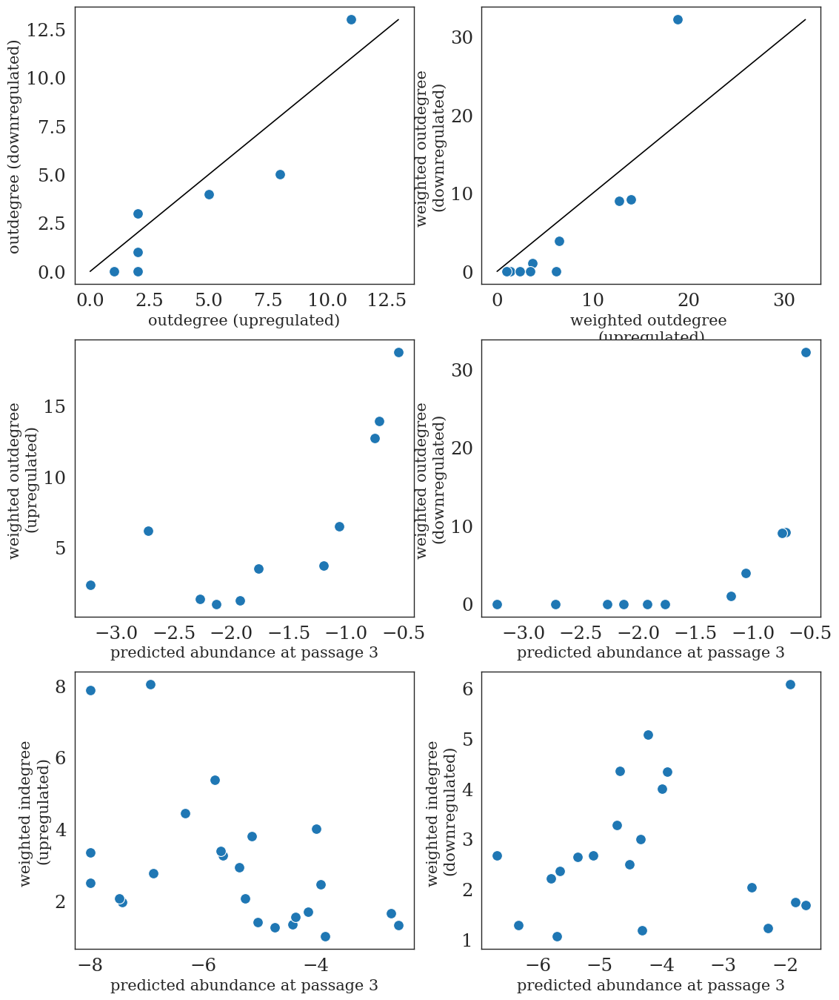

In [62]:
# Figure for paper: prediction performance with production and iterative Balone

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
# plt.figure(figsize=(10, 10), dpi=300)

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(3, 2, figsize=(13, 16.5), sharey=None, sharex=None)
# fig.supylabel('predicted growth ratio', fontsize=20)
# fig.supxlabel('observed abundance', fontsize=20, x=0.5, y=-0.005)

# plot 1, 1 for positive and negative change number of species
abuns_ = abun_avg_pass_3
abuns_ = np.log(abun_pred.copy())
abun_pred_log = np.log(abun_pred.copy())

# up regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_x = np.sum(count_nnz, axis=1)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_y = np.sum(count_nnz, axis=1)

id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=num_changes_x[id_nnz_], y=num_changes_y[id_nnz_], ax=axes[0][0], \
                       s=100)
max_val = np.max([np.max(num_changes_x), np.max(num_changes_y)])
axes[0][0].plot([0, max_val], [0, max_val], c='black')
axes[0][0].set_ylabel('outdegree (downregulated)', fontsize=15)
axes[0][0].set_xlabel('outdegree (upregulated)', fontsize=15)


# num_changes_x = num_changes_x[id_nnz_]
# num_changes_y = num_changes_y[id_nnz_]
ss_res_1 = np.sum(np.power(num_changes_x - num_changes_y, 2))
ss_tot_1 = np.sum(np.power(num_changes_x - np.mean(num_changes_x), 2))
R2_1 = 1 - ss_res_1 / ss_tot_1
print(R2_1)

ss_res_2 = np.sum(np.power(num_changes_x - num_changes_y, 2))
ss_tot_2 = np.sum(np.power(num_changes_y - np.mean(num_changes_y), 2))
R2_2 = 1 - ss_res_2 / ss_tot_2
print(R2_2)


model = LinearRegression(fit_intercept=False)

# Reshape x to a 2D array (required by sklearn)
x = num_changes_x.reshape(-1, 1)
y = num_changes_y.copy()

# Fit the model to the data
model.fit(x, y)

# Extract the slope (m) from the model
slope = model.coef_[0]
print(slope)

# plot abundance change
abuns_ = abun_pred_log.copy()

# up regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_x = np.sum(count_nnz, axis=1)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_y = np.sum(count_nnz, axis=1)

id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=num_changes_x[id_nnz_], y=num_changes_y[id_nnz_], ax=axes[0][1], \
                       s=100)
max_val = np.max([np.max(num_changes_x), np.max(num_changes_y)])
axes[0][1].plot([0, max_val], [0, max_val], c='black')
axes[0][1].set_ylabel('weighted outdegree \n(downregulated)', fontsize=15)
axes[0][1].set_xlabel('weighted outdegree \n(upregulated)', fontsize=15)


# Add a constant term to the input data for statsmodels
x_with_constant = sm.add_constant(x)

# Fit the statsmodels linear regression model
stats_model = sm.OLS(y, x_with_constant).fit()

# Get the p-value and R-squared value
p_value = stats_model.pvalues[1]
r_squared = stats_model.rsquared

# Get the confidence intervals for the coefficients
confidence_intervals = stats_model.conf_int()

# Extract the slope (m) and its confidence intervals
slope = stats_model.params[1]
slope_ci_lower, slope_ci_upper = confidence_intervals[1]


plt_ = sns.scatterplot(x=np.log10(np.exp(abun_pred_log[id_nnz_])), \
                       y=num_changes_x[id_nnz_], ax=axes[1][0], s=100)
axes[1][0].set_ylabel('weighted outdegree \n(upregulated)', fontsize=15)
axes[1][0].set_xlabel('predicted abundance at passage 3', fontsize=15)

plt_ = sns.scatterplot(x=np.log10(np.exp(abun_pred_log[id_nnz_])), \
                       y=num_changes_y[id_nnz_], ax=axes[1][1], s=100)
axes[1][1].set_ylabel('weighted outdegree \n(downregulated)', fontsize=15)
axes[1][1].set_xlabel('predicted abundance at passage 3', fontsize=15)



# in-degree
# up regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_x = np.sum(count_nnz, axis=0)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_y = np.sum(count_nnz, axis=0)

id_nnz_x = np.where((num_changes_x > 0))[0]
id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=np.log10(np.exp(abun_pred_log[id_nnz_x])), \
                       y=num_changes_x[id_nnz_x], ax=axes[2][0], s=100)
axes[2][0].set_ylabel('weighted indegree \n(upregulated)', fontsize=15)
axes[2][0].set_xlabel('predicted abundance at passage 3', fontsize=15)

id_nnz_y = np.where((num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=np.log10(np.exp(abun_pred_log[id_nnz_y])), \
                       y=num_changes_y[id_nnz_y], ax=axes[2][1], s=100)
axes[2][1].set_ylabel('weighted indegree \n(downregulated)', fontsize=15)
axes[2][1].set_xlabel('predicted abundance at passage 3', fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_keystone_species.pdf'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

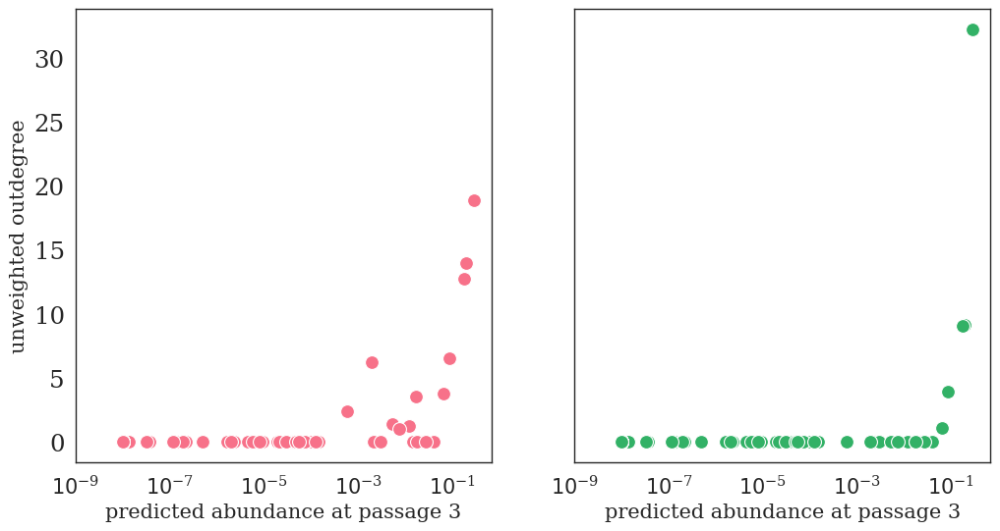

In [63]:
# Figure for paper: prediction performance with production and iterative Balone

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey="row", sharex=None)
abuns_ = abun_avg_pass_3
abuns_ = np.log(abun_pred.copy())
abun_pred_log = np.log(abun_pred.copy())
# plot abundance change
abuns_ = abun_pred_log.copy()

# up regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_x = np.sum(count_nnz, axis=1)
weighted_indeg = np.sum(count_nnz, axis=0)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_y = np.sum(count_nnz, axis=1)

id_nnz_x = np.where((num_changes_x > 0))[0]
id_nnz_x = np.arange(len(species_names))
id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_x])), \
                       y=num_changes_x[id_nnz_x], ax=axes[0], s=100, \
                       color=cols_[0])
axes[0].set_ylabel('unweighted outdegree', fontsize=15)
axes[0].set_xlabel('predicted abundance at passage 3', fontsize=15)

# id_sort = np.argsort(-num_changes_x[id_nnz_x])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
axes[0].set_xscale('log', base=10)
xticks_ = np.arange(-9, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

    
# downregulated
id_nnz_y = np.where((num_changes_y > 0))[0]
id_nnz_y = np.arange(len(species_names))
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_y])), \
                       y=num_changes_y[id_nnz_y], ax=axes[1], s=100, \
                       color=cols_[3])
# axes[1].set_ylabel('weighted indegree', fontsize=15)
axes[1].set_xlabel('predicted abundance at passage 3', fontsize=15)

# id_sort = np.argsort(-num_changes_y[id_nnz_y])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 5
# axes[1].axhline(y=num_changes_y[id_nnz_y[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')

# labels = species_names[id_nnz_y[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_y[id_sort[range(size_)]]])
# y = (num_changes_y[id_nnz_y[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 2:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 4), ha='left', \
#                          fontsize=10)


axes[1].set_xscale('log', base=10)
xticks_ = np.arange(-9, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_unweighted_outdegree_vs_pred_abun.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

In [67]:
id_sort = np.argsort(-(num_changes_x))
id_print = np.arange(11)
print(num_changes_x[id_sort[id_print]])
print(num_changes_y[id_sort[id_print]])
print(species_names[id_sort[id_print]])
print(abun_pred[id_sort[id_print]])

[18.83363076 13.94382237 12.74132133  6.49173936  6.1884141   3.7203666
  3.49858174  2.35553018  1.37001364  1.24350701  1.00565324]
[32.2032028   9.16308012  9.05949481  3.92814874  0.          1.03873429
  0.          0.          0.          0.          0.        ]
['Clostridium-sporogenes-ATCC-15579' 'Acidaminococcus-intestini-D21'
 'Bacteroides-uniformis-ATCC-8492' 'Mitsuokella-multacida-DSM-20544'
 'Collinsella-aerofaciens-ATCC-25986'
 'Bacteroides-thetaiotaomicron-VPI-5482' 'Ruminococcus-gnavus-ATCC-29149'
 'Parabacteroides-merdae-ATCC-43184' 'Bifidobacterium-adolescentis-L2-32'
 'Bacteroides-sp-9-1-42FAA' 'Parabacteroides-sp-D13']
[0.28654855 0.19337117 0.1779638  0.08704686 0.00189053 0.06404429
 0.01717433 0.00059002 0.00534646 0.01194778 0.00744698]


In [154]:
id_order = np.argsort(abun_pred)
size_ = 63 - 15
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[0].copy()

competition_top = np.zeros((size_, size_))
for i_ in np.arange(size_ - 1):
    for j_ in np.arange(i_ + 1, size_):
        competition_top[i_, j_] = get_competition(Ri_avg, df_speciesMetab_cluster.copy(), \
                                                  id_order[i_], id_order[j_])
        competition_top[j_, i_] = competition_top[i_, j_]

In [52]:
competition_rand_median = np.zeros(size_)
p_val_vec = np.zeros(size_)

for i_ in np.arange(size_):
    print(f'loop = {i_}')
    id_src = np.array([id_order[i_]])

    id_dest = np.arange(num_species)
    id_dest = np.delete(id_dest, id_order[:size_])
    id_dest = np.hstack((id_src, id_dest))
    df_speciesMetabs_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetabs_tmp = df_speciesMetabs_tmp.iloc[id_dest, :]
    # competition_rand = random_competition_index(Ri_avg, df_speciesMetabs_tmp, [0], nboot=10000)
    competition_rand = random_competition_subset(Ri_avg, df_speciesMetabs_tmp, \
                                                [0], np.arange(1, len(id_dest)), size_ - 1, nboot=20000)
    competition_rand_median[i_] = np.median(competition_rand)
    p_val_vec[i_] = scipy.stats.wilcoxon(competition_rand - np.max(competition_top[i_, 1:]), \
                                         alternative='greater')[1]

loop = 0


/home/tarunm3/Desktop/Python_Workspace/envs/pyg_env/lib/python3.9/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/tarunm3/Desktop/Python_Workspace/envs/pyg_env/lib/python3.9/site-packages/scipy/stats/_morestats.py:3428: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


ValueError: setting an array element with a sequence.

In [182]:
num_changes_x[id_sort]

array([18.83363076, 13.94382237, 12.74132133,  6.49173936,  6.1884141 ,
        3.7203666 ,  3.49858174,  2.35553018,  1.37001364,  1.24350701,
        1.00565324,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

In [193]:
len(Ri_avg[Ri_avg >= 1e-8])

38

In [214]:
id_order = np.argsort(-abun_pred)
size_ = 15
id_src = id_sort[:10]
id_dest = np.arange(num_species)
id_dest = np.delete(id_dest, id_src)
id_full = np.arange(num_species)
avg_competition = np.zeros((len(id_dest), len(id_src)))
p_val_vec = np.zeros((len(id_dest)))
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
nboot = 1000
for i in range(len(id_dest)):
    print(f'loop = {i}')
    # competition_rand = np.zeros((nboot))
    id_1 = id_dest[i]
    competition_tmp = np.zeros((len(id_src)))
    for j in range(len(id_src)):
        id_2 = id_src[j]
        competition_tmp[j] = get_competition(Ri_avg, df_speciesMetab_cluster_tmp, id_1, id_2)
        if competition_tmp[j] >= 0.75:
            avg_competition[i, j] = 1

    # id_rm = [id_1] + list(id_src)
    # id_rm = np.array(id_rm)
    # id_species_left = np.delete(id_full.copy(), id_rm)

    # id_tmp = id_full.copy()
    # id_tmp = np.delete(id_tmp, id_1)
    # id_src_tmp = np.random.choice(id_tmp, size=len(id_src), replace=False)
    # competition_rand = random_competition_subset(Ri_avg, df_speciesMetab_cluster, [id_1], id_species_left, \
    #                                              len(id_src), nboot=nboot)

    # avg_competition[i] = np.max(competition_tmp)
    # p_val_vec[i] = np.sum(competition_rand >= avg_competition[i]) / nboot

loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14
loop = 15
loop = 16
loop = 17
loop = 18
loop = 19
loop = 20
loop = 21
loop = 22
loop = 23
loop = 24
loop = 25
loop = 26
loop = 27
loop = 28
loop = 29
loop = 30
loop = 31
loop = 32
loop = 33
loop = 34
loop = 35
loop = 36
loop = 37
loop = 38
loop = 39
loop = 40
loop = 41
loop = 42
loop = 43
loop = 44
loop = 45
loop = 46
loop = 47
loop = 48
loop = 49
loop = 50
loop = 51
loop = 52


In [115]:
id_rm = [id_1] + list(id_src)
id_rm = np.array(id_rm)
id_species_left = np.delete(id_full.copy(), id_rm)
competition_rand = random_competition_subset(Ri_avg, df_speciesMetab_cluster, [id_1], id_species_left, \
                                                len(id_src), nboot=nboot)

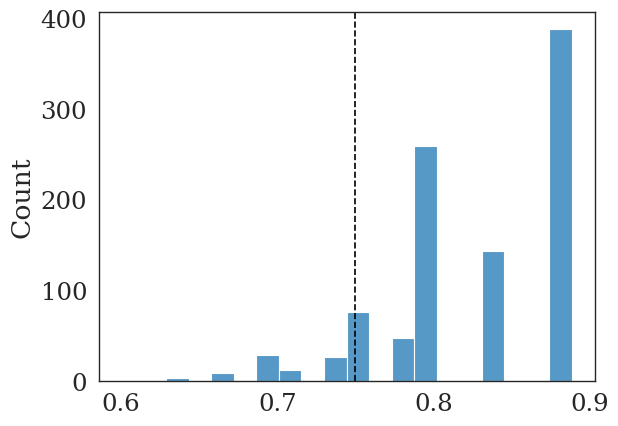

In [119]:
plt_ = sns.histplot(x=competition_rand, bins=20)
plt_.axvline(x=np.max(competition_tmp), c='black', linestyle='dashed')

In [215]:
np.unique(np.sum(avg_competition, axis=1), return_counts=True)
id_indeg_rm = np.where((np.sum(avg_competition, axis=1) == 0) & (abun_pred[id_dest] <= 1e-6))[0]
print(len(id_indeg_rm))
print(abun_pred[id_dest[id_indeg_rm]])
print(id_indeg_rm)
id_indeg_rm = id_dest[id_indeg_rm]
print(len(id_indeg_rm))
print(id_indeg_rm)

12
[1.36291723e-08 1.00000000e-08 4.86545185e-07 1.00000000e-08
 1.00000000e-08 3.69484512e-08 1.16914680e-07 1.00000000e-08
 1.91972225e-07 1.00000000e-08 1.16045624e-07 1.00000000e-08]
[ 2  3  4 23 25 27 30 31 34 39 40 45]
12
[ 3  4  5 28 30 34 37 38 41 46 47 53]


In [210]:
i = 30
id_1 = id_dest[i]
competition_tmp = np.zeros((len(id_src)))
for j in range(len(id_src)):
    id_2 = id_src[j]
    competition_tmp[j] = get_competition(Ri_avg, df_speciesMetab_cluster_tmp, id_1, id_2)
    if competition_tmp[j] >= 0.6:
        avg_competition[i, j] = competition_tmp[j]

In [213]:
competition_tmp

array([0.41176471, 0.5       , 0.53846154, 0.55555556, 0.42105263,
       0.5       , 0.46153846, 0.38461538, 0.4       , 0.55555556])

In [206]:
avg_competition[30, :]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [187]:
np.sum(avg_competition, axis=1)

array([1., 0., 0., 0., 0., 1., 0., 0., 2., 5., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 3., 2., 0., 3., 0., 1., 0., 2., 3., 0., 0., 1., 1.,
       0., 2., 1., 1., 0., 0., 0., 1., 1., 1., 1., 0., 0., 1., 1., 1., 0.,
       3., 1.])

In [201]:
weighted_indeg[id_indeg_rm]

array([0.        , 1.95185464, 8.0430959 ])

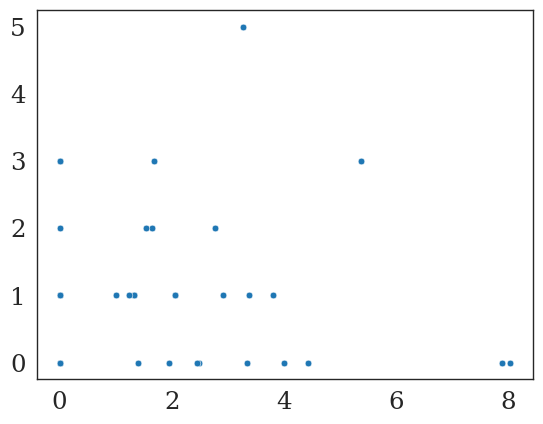

In [188]:
x = weighted_indeg[id_dest].copy()
y = np.sum(avg_competition, axis=1)
plt_ = sns.scatterplot(x=x, y=y)

In [174]:
len(x)

63

In [368]:
id_sort = np.argsort(-abun_pred)
print(num_changes_x[id_sort])
print(num_changes_x[id_sort[[13, 17, 18]]])
print(species_names[id_sort[[13, 17, 18]]])
print(abun_pred[id_sort[[13, 17, 18]]])
print(id_sort[[13, 17, 18]])

[18.83363076 13.94382237 12.74132133  6.49173936  3.7203666   0.
  0.          0.          0.          0.          3.49858174  0.
  1.24350701  1.00565324  1.37001364  0.          0.          6.1884141
  2.35553018  0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.00565324 6.1884141  2.35553018]
['Parabacteroides-sp-D13' 'Collinsella-aerofaciens-ATCC-25986'
 'Parabacteroides-merdae-ATCC-43184']
[0.00744698 0.00189053 0.00059002]
[55 33 54]


0.0018905297382280249
Collinsella-aerofaciens-ATCC-25986
high abundance strain knock-out
PearsonRResult(statistic=0.9664980138659881, pvalue=3.8751035055139145e-37)
0.0005900176297942915
Parabacteroides-merdae-ATCC-43184
low abundance strain knock-out
PearsonRResult(statistic=0.992787363991048, pvalue=5.504855478357056e-57)


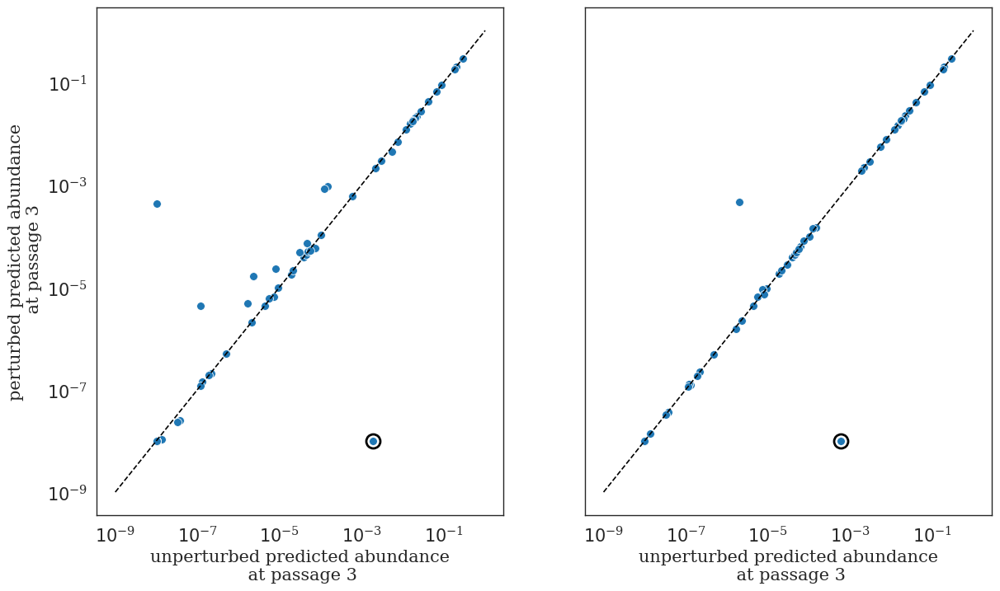

In [369]:
# Figure for paper: prediction performance with production and iterative Balone

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 2, figsize=(14, 8), sharey="row", sharex=None)
abuns_ = abun_avg_pass_3
abuns_ = np.log(abun_pred.copy())
abun_pred_log = np.log(abun_pred.copy())
# plot abundance change
abuns_ = abun_pred_log.copy()

st_ = 33
print(x_mean[st_])
print(species_names[st_])
plt_ = sns.scatterplot(x=[x_mean[st_]], y=[abun_pertub_list[st_][st_]], \
                       ax=axes[0], s=150, linewidth=2, marker='o', edgecolor='black', \
                       color='white')
plt_ = sns.scatterplot(x=(x_mean), y=(abun_pertub_list[st_]), \
                       ax=axes[0], s=50)
axes[0].plot([10.0**-9, 1], [10.0**-9, 1], c="black", linestyle='dashed')
print(f'high abundance strain knock-out')
id_corr = np.array(list(set(list(np.arange(len(species_names)))) - set([st_])))
print(scipy.stats.pearsonr(np.log10(x_mean[id_corr]), np.log10(abun_pertub_list[st_][id_corr])))
axes[0].set_ylabel('perturbed predicted abundance\n at passage 3', fontsize=15)
axes[0].set_xlabel('unperturbed predicted abundance\n at passage 3', fontsize=15)
    
axes[0].set_xscale('log', base=10)
xticks_ = np.arange(-9, 1, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

axes[0].set_yscale('log', base=10)
axes[0].set_yticks(xticks_pow, labels=xlabs_, fontsize=15)

    
st_ = 54
print(x_mean[st_])
print(species_names[st_])
plt_ = sns.scatterplot(x=[x_mean[st_]], y=[abun_pertub_list[st_][st_]], \
                       ax=axes[1], s=150, linewidth=2, marker='o', edgecolor='black', \
                       color='white')
plt_ = sns.scatterplot(x=(x_mean), y=(abun_pertub_list[st_]), \
                       ax=axes[1], s=50)
axes[1].plot([10.0**-9, 1], [10.0**-9, 1], c="black", linestyle='dashed')
print(f'low abundance strain knock-out')
id_corr = np.array(list(set(list(np.arange(len(species_names)))) - set([st_])))
print(scipy.stats.pearsonr(np.log10(x_mean[id_corr]), np.log10(abun_pertub_list[st_][id_corr])))
axes[1].set_ylabel('perturbed predicted abundance\n at passage 3', fontsize=15)
axes[1].set_xlabel('unperturbed predicted abundance\n at passage 3', fontsize=15)
    
axes[1].set_xscale('log', base=10)
xticks_ = np.arange(-9, 1, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

axes[1].set_yscale('log', base=10)
axes[1].set_yticks(xticks_pow, labels=xlabs_, fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_outdegree_keystone_strains.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

In [76]:
species_names_abbr = np.array(species_names_abbr, dtype=object)

# strains responding to changes = 35
with zeros excluded
corr upregulated = PearsonRResult(statistic=-0.49873682357493143, pvalue=0.013110852083732702)
with zeros included
corr upregulated = PearsonRResult(statistic=-0.27385664533682563, pvalue=0.029867168782678553)
with zeros excluded
corr downregulated = PearsonRResult(statistic=0.14284010900450697, pvalue=0.5479983711785216)
with zeros included
corr downregulated = PearsonRResult(statistic=0.1686138485197613, pvalue=0.18649745208923774)


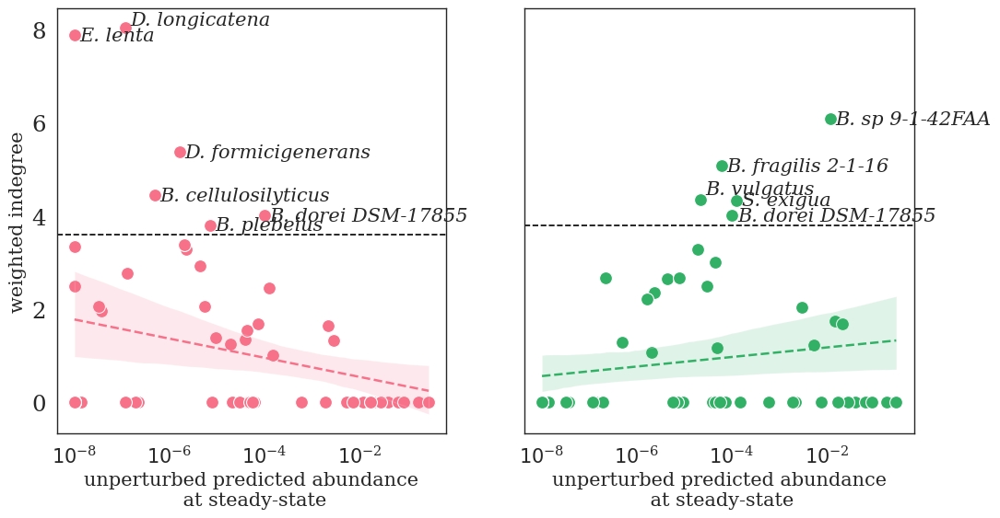

In [48]:
# Figure for paper: prediction performance with production and iterative Balone

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey="row", sharex=None)

abuns_ = np.log(abun_pred.copy())
abun_pred_log = np.log(abun_pred.copy())
# in-degree
# up regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_x = np.sum(count_nnz, axis=0)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_y = np.sum(count_nnz, axis=0)

id_ = np.where(num_changes_x + num_changes_y != 0)[0]
print(f'# strains responding to changes = {len(id_)}')

# with zeros excluded
print(f'with zeros excluded')
id_nnz_x = np.where((num_changes_x > 0))[0]
# id_nnz_x = np.arange(len(species_names))
# id_ = np.where(p_val_vec_new >= 0.05)[0]
# id_rm = id_low_low[id_]
# id_nnz_x = np.delete(id_nnz_x, id_rm)
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred[id_nnz_x]), \
                                num_changes_x[id_nnz_x])
print(f'corr upregulated = {corr_tmp}')

# with zeros included
print(f'with zeros included')
id_nnz_x = np.where((num_changes_x >= 0))[0]
id_nnz_x = np.arange(len(species_names))
# id_nnz_x = np.delete(id_nnz_x, id_indeg_rm)
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred[id_nnz_x]), \
                                num_changes_x[id_nnz_x])
print(f'corr upregulated = {corr_tmp}')
# id_nnz_x = np.arange(len(species_names))
id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=np.log10(np.exp(abun_pred_log[id_nnz_x])), \
                       y=num_changes_x[id_nnz_x], ax=axes[0], s=100, \
                       color=cols_[0])
plt_ = sns.regplot(x=(np.log10(np.exp(abun_pred_log[id_nnz_x]))), \
                   y=num_changes_x[id_nnz_x], ax=axes[0], scatter=False, \
                   color=cols_[0], line_kws={'linestyle':'dashed'})

axes[0].set_ylabel('weighted indegree', fontsize=15)
axes[0].set_xlabel(f'unperturbed predicted abundance\n at steady-state', fontsize=15)

id_sort = np.argsort(-num_changes_x[id_nnz_x])
# print(num_changes_y[id_nnz_[id_sort]])
size_ = 6
axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
                c='black', linestyle='dashed')
labels = species_names_abbr[id_nnz_x[id_sort[range(size_)]]]
x = np.log10(np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]]))
y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
for i, label in enumerate(labels):
    if i != 0:
        axes[0].annotate(label, (x[i], y[i]), \
                         textcoords="offset points", xytext=(4, -4), ha='left', \
                         fontsize=15, style='italic')
    else:
        axes[0].annotate(label, (x[i], y[i]), \
                         textcoords="offset points", xytext=(4, 2), ha='left', \
                         fontsize=15, style='italic')
    
# axes[0].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_, labels=xlabs_, fontsize=15)


    
# downregulated
print(f'with zeros excluded')
id_nnz_y = np.where((num_changes_y > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred[id_nnz_y]), \
                                num_changes_y[id_nnz_y])
print(f'corr downregulated = {corr_tmp}')

print(f'with zeros included')
id_nnz_y = np.where((num_changes_y >= 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred[id_nnz_y]), \
                                num_changes_y[id_nnz_y])
print(f'corr downregulated = {corr_tmp}')
id_nnz_y = np.arange(len(species_names))
plt_ = sns.scatterplot(x=np.log10(np.exp(abun_pred_log[id_nnz_y])), \
                       y=num_changes_y[id_nnz_y], ax=axes[1], s=100, \
                       color=cols_[3])
plt_ = sns.regplot(x=(np.log10(np.exp(abun_pred_log[id_nnz_y]))), \
                   y=num_changes_y[id_nnz_y], ax=axes[1], scatter=False, \
                   color=cols_[3], line_kws={'linestyle':'dashed'})
# axes[1].set_xlim(auto=True)

axes[1].set_ylabel('weighted indegree', fontsize=15)
axes[1].set_xlabel(f'unperturbed predicted abundance\n at steady-state', fontsize=15)

id_sort = np.argsort(-num_changes_y[id_nnz_y])
# print(num_changes_y[id_nnz_[id_sort]])
size_ = 5
axes[1].axhline(y=num_changes_y[id_nnz_y[id_sort[size_ - 1]]] - 0.2, \
                c='black', linestyle='dashed')

labels = species_names_abbr[id_nnz_y[id_sort[range(size_)]]]
x = np.log10(np.exp(abun_pred_log[id_nnz_y[id_sort[range(size_)]]]))
y = (num_changes_y[id_nnz_y[id_sort[range(size_)]]])
for i, label in enumerate(labels):
    if i != 2:
        axes[1].annotate(label, (x[i], y[i]), \
                         textcoords="offset points", xytext=(4, -4), ha='left', \
                         fontsize=15, style='italic')
    else:
        axes[1].annotate(label, (x[i], y[i]), \
                         textcoords="offset points", xytext=(4, 4), ha='left', \
                         fontsize=15, style='italic')


# axes[1].set_xscale('log', base=10)

xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_, labels=xlabs_, fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'species_perturb_keystone_species.svg'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_keystone_species_new.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

In [200]:
id_nnz_x = np.arange(len(species_names))
id_ = np.where((freq_low_abun <= 0) & (abun_pred <= 1e-6))[0]
id_nnz_x = np.delete(id_nnz_x, id_)

In [205]:
id_ = np.where((num_changes_x <= 0) & (abun_pred <= 1e-6))[0]
freq_low_abun[id_]

array([15.,  7.,  9., 11.,  6.,  6.,  8., 10., 13., 12., 13.,  9.,  2.,
        2.,  7.])

In [77]:
id_order = np.argsort(-abun_pred)
size_ = 15
print(num_changes_x[id_order[:size_]])
print(abun_pred[id_order[:size_]])
print(np.sum(abun_pred[id_order[:size_]]))
print(species_names[id_order[:size_]])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[0.28654855 0.19337117 0.1779638  0.08704686 0.06404429 0.04031707
 0.02743672 0.02133704 0.01969028 0.01740067 0.01717433 0.01452709
 0.01194778 0.00744698 0.00534646]
0.9915991038121236
['Clostridium-sporogenes-ATCC-15579' 'Acidaminococcus-intestini-D21'
 'Bacteroides-uniformis-ATCC-8492' 'Mitsuokella-multacida-DSM-20544'
 'Bacteroides-thetaiotaomicron-VPI-5482' 'Anaerostipes-caccae-DSM-14662'
 'Peptostreptococcus-sp-CC14N-HM-1051' 'Bacteroides-sp-2-1-22'
 'Bacteroides-stercoris-ATCC-43183' 'Hungatella-hathewayi-DSM-13479'
 'Ruminococcus-gnavus-ATCC-29149' 'Bacteroides-ovatus-ATCC-8483'
 'Bacteroides-sp-9-1-42FAA' 'Parabacteroides-sp-D13'
 'Bifidobacterium-adolescentis-L2-32']


In [108]:
id_order = np.argsort(-abun_pred)
size_ = 15
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[0].copy()

competition_top = np.zeros((size_, len(id_order)))
for i_ in np.arange(size_):
    for j_ in np.arange(i_ + 1, len(id_order)):
        competition_top[i_, j_] = get_competition(Ri_avg, df_speciesMetab_cluster, \
                                                           id_order[j_], id_order[i_])
        if j_ <= size_ - 1:
            competition_top[j_, i_] = competition_top[i_, j_]

In [112]:
x = competition_top[:, :size_]
# x = x[np.triu_indices(size_, k=1)].flatten()
x = np.mean(x, axis=1)
y = np.mean(competition_top[:, size_:], axis=1).flatten()
y1 = np.mean(competition_top[:, :], axis=1).flatten()

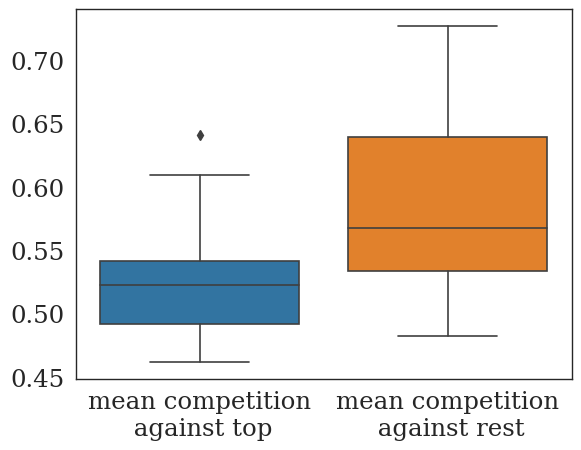

In [113]:
x_total = np.hstack((x, y))
z = [f'mean competition\n against top'] * len(x) + [f'mean competition\n against rest'] * len(y)
plt_ = sns.boxplot(x=z, y=x_total, palette=['#1f77b4', '#ff7f0e'])

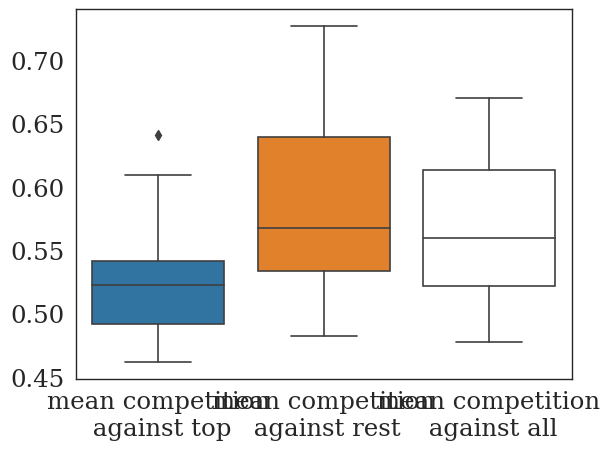

In [110]:
x_total = np.hstack((x, y, y1))
z = [f'mean competition\n against top'] * len(x) + [f'mean competition\n against rest'] * len(y) + \
    [f'mean competition\n against all'] * len(y1)
plt_ = sns.boxplot(x=z, y=x_total, palette=['#1f77b4', '#ff7f0e', "white"])

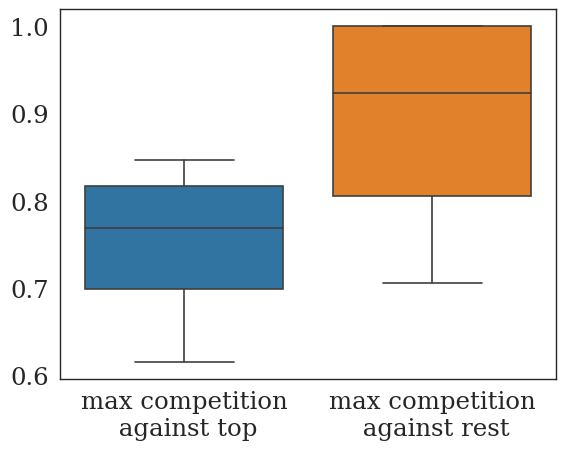

In [164]:
x_total = np.hstack((x, y))
z = [f'max competition\n against top'] * len(x) + [f'max competition\n against rest'] * len(y)
plt_ = sns.boxplot(x=z, y=x_total, palette=['#1f77b4', '#ff7f0e'])

In [154]:
scipy.stats.wilcoxon(x, y)

/home/tarunm3/Desktop/Python_Workspace/envs/pyg_env/lib/python3.9/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


WilcoxonResult(statistic=1.0, pvalue=0.0012182067404331491)

In [115]:
np.random.seed(8397)
competition_rand_median = np.zeros(size_)
p_val_vec = np.ones(size_)
p_val_vec_count = np.ones(size_)
competition_rand_all = []

freq_low_abun = np.zeros(num_species)

for i_ in np.arange(size_):
    print(f'loop = {i_}')
    id_src = np.array([id_order[i_]])

    id_dest = np.arange(num_species)
    id_dest = np.delete(id_dest, id_order[:size_])
    id_dest = np.hstack((id_src, id_dest))
    df_speciesMetabs_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetabs_tmp = df_speciesMetabs_tmp.iloc[id_dest, :]
    # competition_rand = random_competition_index(Ri_avg, df_speciesMetabs_tmp, [0], nboot=10000)
    competition_rand, id_rand = random_competition_subset(Ri_avg, df_speciesMetabs_tmp, \
                                                [0], np.arange(1, len(id_dest)), size_ - 1, nboot=20000)
    competition_rand_all.append(competition_rand)
    un_ = np.unique(id_rand, return_counts=True)
    freq_low_abun[id_dest[un_[0]]] += 1
    counts_tmp = np.zeros(len(id_dest))
    counts_tmp[un_[0]] = un_[1]
    id_zero = np.where(counts_tmp == 0)[0]
    if i_ == 0:
        id_strains_rm = id_dest[id_zero]
    else:
        id_strains_rm = np.intersect1d(id_strains_rm, id_dest[id_zero])
    competition_rand_median[i_] = np.median(competition_rand)
    if np.sum(competition_rand - np.max(competition_top[i_, 1:])) != 0:
        p_val_vec[i_] = scipy.stats.wilcoxon(competition_rand - np.max(competition_top[i_, 1:]))[1]
    p_val_vec_count[i_] = len(np.where(competition_rand <= np.max(competition_top[i_, 1:]))[0]) / 20000
    


loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14


In [106]:
competition_top[i_, 1:]

array([0.41666667, 0.61538462, 0.33333333, 0.41666667, 0.38461538,
       0.4       , 0.        , 0.8       , 0.5       , 0.5       ,
       0.8       , 0.8       , 0.8       , 0.6       ])

In [59]:
i_ = 10
id_src = np.array([id_order[i_]])

id_dest = np.arange(num_species)
id_dest = np.delete(id_dest, id_order[:size_])
id_dest = np.hstack((id_src, id_dest))
df_speciesMetabs_tmp = df_speciesMetab_cluster.copy()
df_speciesMetabs_tmp = df_speciesMetabs_tmp.iloc[id_dest, :]
# competition_rand = random_competition_index(Ri_avg, df_speciesMetabs_tmp, [0], nboot=10000)
competition_rand, id_rand = random_competition_subset(Ri_avg, df_speciesMetabs_tmp, \
                                            [0], np.arange(1, len(id_dest)), size_ - 1, nboot=20000)

In [85]:
i_ = 10
for i_ in np.arange(size_):
    competition_rand = competition_rand_all[i_].copy()
    # print(np.mean(competition_rand))
    # print(np.max(competition_top[i_, 1:]))
    print(scipy.stats.wilcoxon(competition_rand - np.max(competition_top[i_, 1:]))[1])
    p_val_vec_count[i_] = len(np.where(competition_rand <= np.max(competition_top[i_, 1:]))[0]) / 20000

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
3.528972981685581e-12
0.0
0.0
1.5290010776230883e-16
5.431464084327872e-60


0.8461538461538461
0.8461538461538461


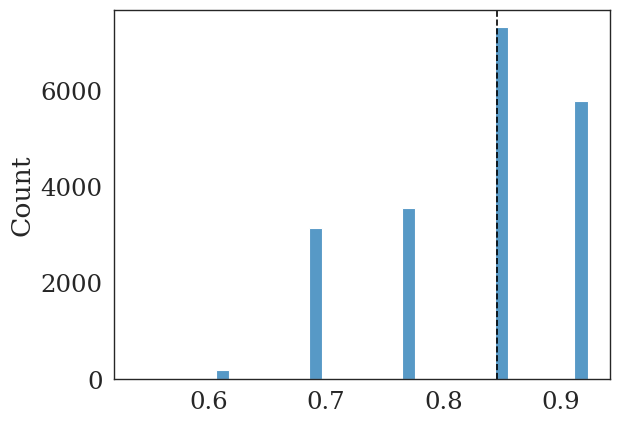

In [121]:
i_ = 10
competition_rand = competition_rand_all[i_].copy()
plt_ = sns.histplot(x=competition_rand)
plt.axvline(x=np.max(competition_top[i_, 1:]), c='black', linestyle='dashed')
print(np.median(competition_rand))
print(np.max(competition_top[i_, 1:]))

In [58]:
species_names_abbr[id_order[:size_]]

array(['C. sporogenes', 'A. intestini', 'B. uniformis', 'M. multacida',
       'B. thetaiotaomicron', 'A. caccae', 'P. sp CC14N-HM-1051',
       'B. sp 2-1-22', 'B. stercoris', 'H. hathewayi', 'R. gnavus',
       'B. ovatus', 'B. sp 9-1-42FAA', 'P. sp D13', 'B. adolescentis'],
      dtype=object)

20

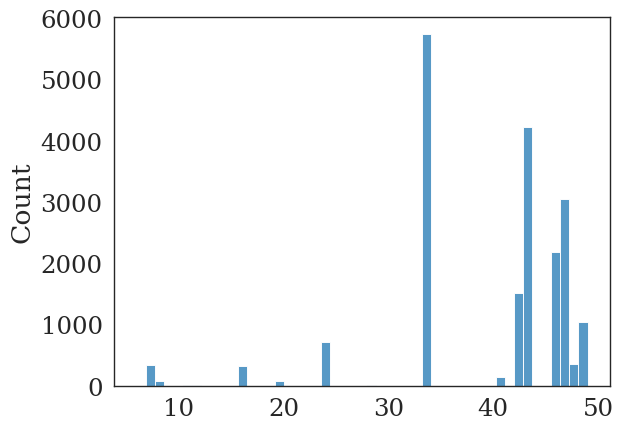

In [169]:
plt_ = sns.histplot(id_dest[id_rand])
len(np.unique(id_dest[id_rand], return_counts=True)[1] / 20000)

In [123]:
print(np.median(competition_rand))
print(np.max(competition_top[i_, 1:]))
p_val_vec_count
# len(np.where(competition_rand <= np.max(competition_top[i_, 1:]))[0])
print(p_val_vec_count)
print(p_val_vec)

0.8461538461538461
0.8461538461538461
[1.      0.3471  0.3485  0.1599  0.23965 0.2365  1.      0.04815 0.23495
 0.4966  0.71045 0.0743  0.0198  0.49645 0.3465 ]
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 3.52897298e-12 0.00000000e+00
 0.00000000e+00 1.52900108e-16 5.43146408e-60]


In [117]:
z = np.array(['ns'] * size_, dtype=object)
z[p_val_vec < 0.025] = '*'
z[p_val_vec < 0.01] = '**'
z[p_val_vec < 0.001] = '***'
z[p_val_vec < 0.0001] = '****'

In [118]:
z

array(['****', '****', '****', '****', '****', '****', '****', '****',
       '****', '****', '****', '****', '****', '****', '****'],
      dtype=object)

In [116]:
competition_rand_median - np.max(competition_top, axis=1)[:size_]

array([-0.05882353,  0.08333333,  0.07692308,  0.10683761,  0.05769231,
        0.15384615, -0.03589744,  0.1       ,  0.08333333,  0.1474359 ,
        0.        ,  0.16666667,  0.08888889,  0.0125    ,  0.02051282])

In [108]:
z = np.array(['ns'] * size_, dtype=object)
z[p_val_vec_count < 0.025] = '*'
z[p_val_vec_count < 0.01] = '**'
z[p_val_vec_count < 0.001] = '***'
z[p_val_vec_count < 0.0001] = '****'

In [109]:
z

array(['ns', 'ns', 'ns', '****', 'ns', 'ns', 'ns', 'ns', 'ns', 'ns', 'ns',
       'ns', '****', 'ns', 'ns'], dtype=object)

In [160]:
np.argmax(competition_top, axis=1)
print(competition_top[0, 8])
print(np.max(competition_top[0, 8]))

0.8333333333333334
0.8333333333333334


In [223]:
sns.color_palette("husl", 8)

[(0.9677975592919913, 0.44127456009157356, 0.5358103155058701),
 (0.8087954113106306, 0.5634700050056693, 0.19502642696727285),
 (0.5920891529639701, 0.6418467016378244, 0.1935069134991043),
 (0.19783576093349015, 0.6955516966063037, 0.3995301037444499),
 (0.21044753832183283, 0.6773105080456748, 0.6433941168468681),
 (0.22335772267769388, 0.6565792317435265, 0.8171355503265633),
 (0.6423044349219739, 0.5497680051256467, 0.9582651433656727),
 (0.9603888539940703, 0.3814317878772117, 0.8683117650835491)]

0.75

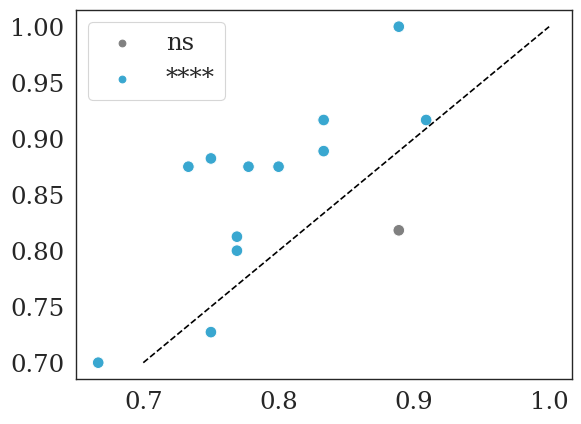

In [268]:
plt_ = sns.scatterplot(x=x, y=y, hue=z, s=70, hue_order=['ns', '****'], palette=['grey', cols_[5]])
plt.plot([0.7, 1], [0.7, 1], c='black', linestyle='dashed')
np.max(competition_top, axis=1)[4]

/home/tarunm3/Desktop/Python_Workspace/envs/pyg_env/lib/python3.9/site-packages/scipy/stats/_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


max competition
 between top vs. max competition
 against rest: Wilcoxon test (paired samples), P_val:1.218e-03 Stat=1.000e+00


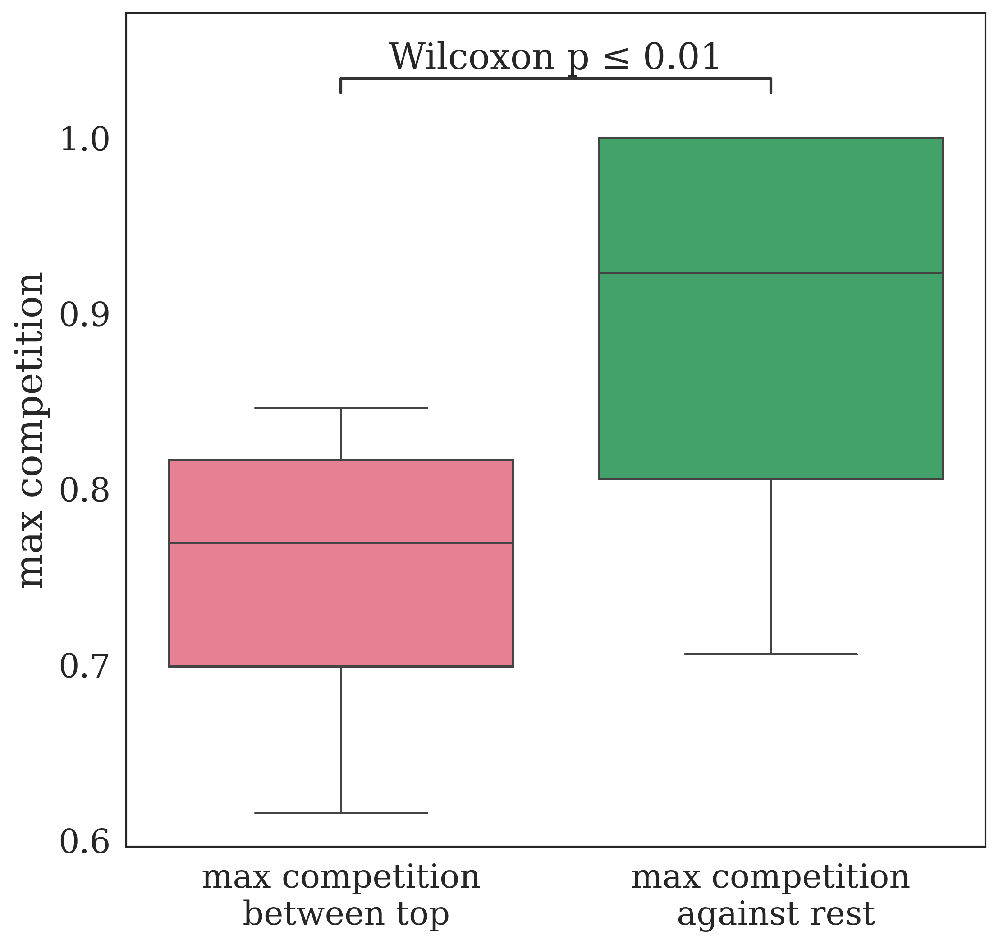

In [177]:
size_ = 15
x = competition_top[:, :size_]
# x = x[np.triu_indices(size_, k=1)].flatten()
x = np.max(x, axis=1)
y = np.max(competition_top[:, size_:], axis=1).flatten()

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8.2, 8), dpi=300)
cols_ = sns.color_palette("husl", 8)

x_total = np.hstack((x, y))
z = [f'max competition\n between top'] * len(x) + [f'max competition\n against rest'] * len(y)
# plt_ = sns.boxplot(x=z, y=x_total, palette=[cols_[0], cols_[3]])




df_plt = pd.DataFrame(data={"measure" : np.hstack([x, y]), \
                            "type" : z})
plt_ = sns.boxplot(data=df_plt, x="type", y="measure", \
                   palette = [cols_[0], cols_[3]])
plt_.set_xlabel(None)
pairs = [[('competition', 'random competition'), ('competition', 'observed competition')], \
         [('cross-feeding', 'random cross-feeding'), ('cross-feeding', 'observed cross-feeding')]]
pairs = [(f'max competition\n between top', f'max competition\n against rest')]
annotator = Annotator(plt_, pairs, data=df_plt, x='type', y='measure', \
                   palette = [cols_[0], cols_[3]])
# annotator = Annotator(plt_, pairs, data=df_plt, x='type', y='metric')
annotator.configure(test="Wilcoxon", text_format="simple")
annotator.apply_and_annotate()
plt_.set_ylabel(f'max competition', fontsize=20)

# legend_labels = ['random', 'competition', 'cross-feeding']
# handles = [plt.Rectangle((0,0),1,1, color='gray'), \
#            plt.Rectangle((0,0),1,1, color=cols_[0]), \
#            plt.Rectangle((0,0),1,1, color=cols_[3])]
# legend_labels = ['random', 'upregulation', 'downregulation']
# # handles = [plt.Rectangle((0,0),1,1, color='gray')]
# handles = [plt.Rectangle((0,0),1,1, color='gray'), \
#            plt.Rectangle((0,0),1,1, color=cols_[0]), \
#            plt.Rectangle((0,0),1,1, color=cols_[3])]
# plt_.legend(handles, legend_labels, title=None, loc='lower right', \
#             bbox_to_anchor=(1.1, 0.1), ncol=1, fontsize=12)



save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'species_perturb_keystone_species.svg'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_competitiveEdge_topmostAbun_boxplot.svg'))

plt.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

mean competition
 between top vs. mean competition
 against rest: Wilcoxon test (paired samples), P_val:1.245e-02 Stat=1.700e+01


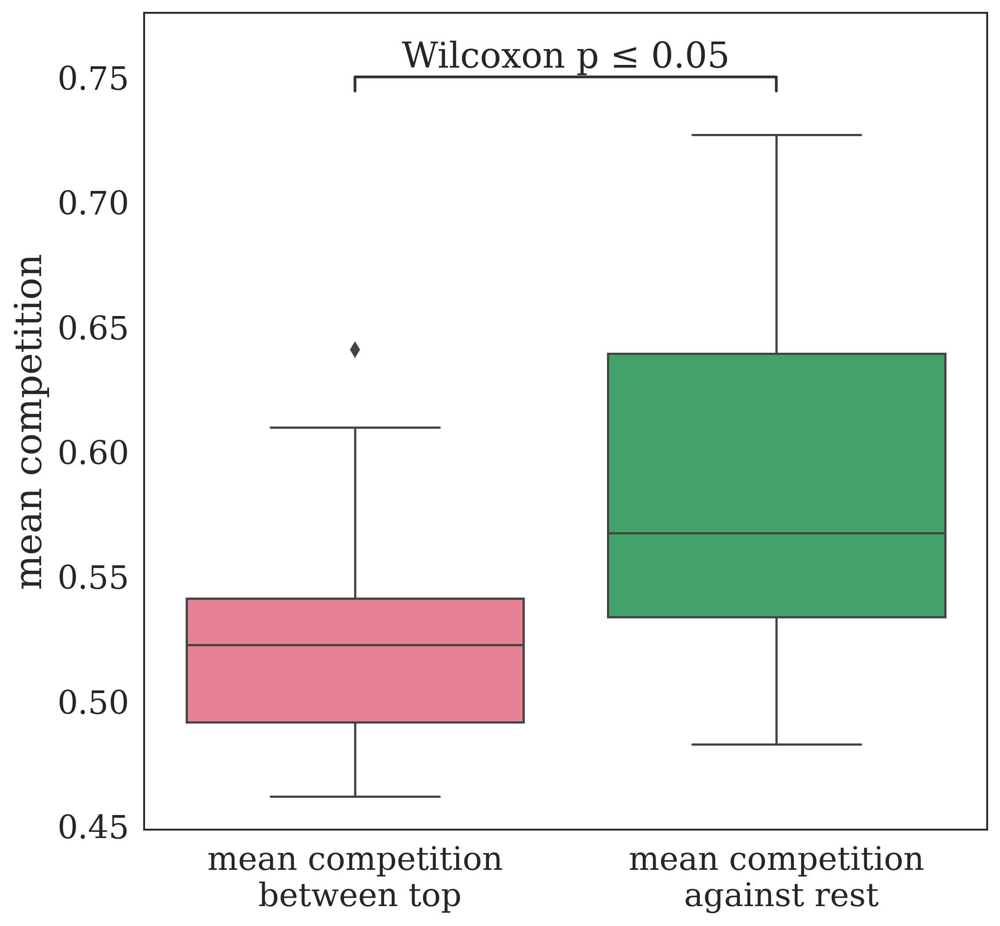

In [111]:
size_ = 15
x = competition_top[:, :size_]
# x = x[np.triu_indices(size_, k=1)].flatten()
x = np.mean(x, axis=1)
y = np.mean(competition_top[:, size_:], axis=1).flatten()

date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8.2, 8), dpi=300)
cols_ = sns.color_palette("husl", 8)

x_total = np.hstack((x, y))
z = [f'mean competition\n between top'] * len(x) + [f'mean competition\n against rest'] * len(y)
# plt_ = sns.boxplot(x=z, y=x_total, palette=[cols_[0], cols_[3]])




df_plt = pd.DataFrame(data={"measure" : np.hstack([x, y]), \
                            "type" : z})
plt_ = sns.boxplot(data=df_plt, x="type", y="measure", \
                   palette = [cols_[0], cols_[3]])
plt_.set_xlabel(None)
pairs = [[('competition', 'random competition'), ('competition', 'observed competition')], \
         [('cross-feeding', 'random cross-feeding'), ('cross-feeding', 'observed cross-feeding')]]
pairs = [(f'mean competition\n between top', f'mean competition\n against rest')]
annotator = Annotator(plt_, pairs, data=df_plt, x='type', y='measure', \
                   palette = [cols_[0], cols_[3]])
# annotator = Annotator(plt_, pairs, data=df_plt, x='type', y='metric')
annotator.configure(test="Wilcoxon", text_format="simple")
annotator.apply_and_annotate()
plt_.set_ylabel(f'mean competition', fontsize=20)

# legend_labels = ['random', 'competition', 'cross-feeding']
# handles = [plt.Rectangle((0,0),1,1, color='gray'), \
#            plt.Rectangle((0,0),1,1, color=cols_[0]), \
#            plt.Rectangle((0,0),1,1, color=cols_[3])]
# legend_labels = ['random', 'upregulation', 'downregulation']
# # handles = [plt.Rectangle((0,0),1,1, color='gray')]
# handles = [plt.Rectangle((0,0),1,1, color='gray'), \
#            plt.Rectangle((0,0),1,1, color=cols_[0]), \
#            plt.Rectangle((0,0),1,1, color=cols_[3])]
# plt_.legend(handles, legend_labels, title=None, loc='lower right', \
#             bbox_to_anchor=(1.1, 0.1), ncol=1, fontsize=12)



save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'species_perturb_keystone_species.svg'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_competitiveEdge_topmostAbun_boxplot.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

15


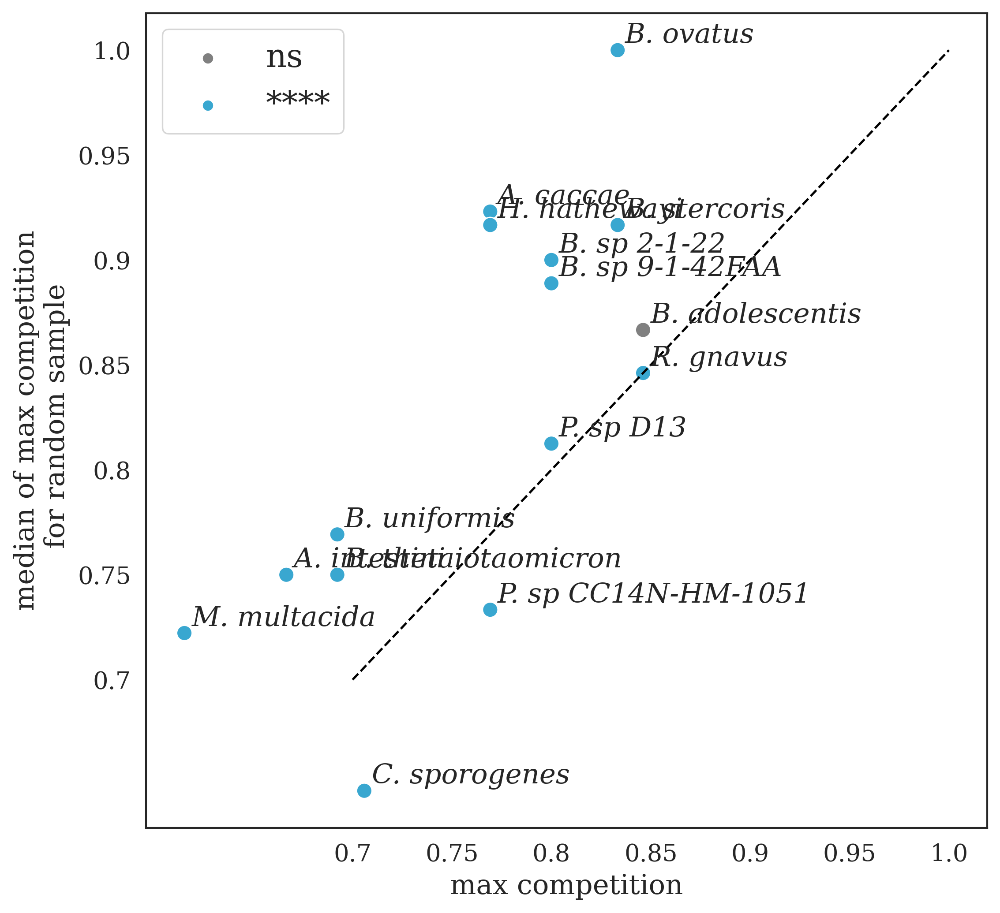

In [79]:
date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8.2, 8), dpi=300)
cols_ = sns.color_palette("husl", 8)

len_ = size_
x = np.max(competition_top, axis=1)[:len_]
y = competition_rand_median[:len_].copy()
z = np.array(['ns'] * size_, dtype=object)
z[p_val_vec_count < 0.025] = '*'
z[p_val_vec_count < 0.01] = '**'
z[p_val_vec_count < 0.001] = '***'
z[p_val_vec_count < 0.0001] = '****'
z = z[:len_]
# z[4] = 'ns'
plt_ = sns.scatterplot(x=x, y=y, hue=z, s=70, hue_order=['ns', '****'], palette=['grey', cols_[5]])
# plt_ = sns.scatterplot(x=x, y=y, s=70, c=cols_[5])
plt.plot([0.7, 1], [0.7, 1], c='black', linestyle='dashed')
# plt_.legend(loc='upper center', \
#             bbox_to_anchor=(0.5, 1.18), ncol=3, fancybox=True, shadow=True)
xticks_ = np.linspace(70, 100, 7) / 100
plt_.set_xticks(xticks_, labels=xticks_, fontsize=13, rotation=0)
plt_.set_yticks(xticks_, labels=xticks_, fontsize=13, rotation=0)
print(len(x))

plt_.set_ylabel(f'median of max competition\n for random sample', fontsize=15)
plt_.set_xlabel(f'max competition', fontsize=15)

labels = species_names_abbr[id_order[:size_]]
for i, label in enumerate(labels):
    if i >= 0:
        plt_.annotate(label, (x[i], y[i]), \
                         textcoords="offset points", xytext=(4, 4), ha='left', \
                         fontsize=15, style='italic')
      #   plt_.annotate(label, (x[i], y[i]), ha='left', \
      #                    fontsize=15, style='italic')
    # else:
    #     plt_.annotate(label, (x[i], y[i]), \
    #                      textcoords="offset points", xytext=(4, 4), ha='left', \
    #                      fontsize=15, style='italic')


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'species_perturb_keystone_species.svg'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_competitiveEdge_topmostAbun_new.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt_.figure.show()

In [226]:
id_low_low = np.where((abun_pred <= 1e-6) & (num_changes_x <= 0))[0]
id_low_high = np.where((abun_pred <= 1e-6) & (num_changes_x > 0))[0]
id_order = np.hstack((id_low_low, id_low_high))
# id_order = np.argsort(-abun_pred)
size_ = len(id_order)
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[0].copy()

competition_top = np.zeros((size_, size_))
for i_ in np.arange(size_ - 1):
    for j_ in np.arange(i_ + 1, size_):
        competition_top[i_, j_] = get_competition(Ri_avg, df_speciesMetab_cluster, \
                                                  id_order[i_], id_order[j_])
        competition_top[j_, i_] = competition_top[i_, j_]

In [220]:
competition_rand_median_new = np.zeros(len(id_low_low))
p_val_vec_new = np.zeros(len(id_low_low))

# freq_low_abun = np.zeros(num_species)

for i_ in np.arange(len(id_low_low)):
    print(f'loop = {i_}')
    id_src = np.array([id_order[i_]])

    id_dest = np.arange(num_species)
    id_dest = np.delete(id_dest, id_order[:size_])
    id_dest = np.hstack((id_src, id_dest))
    df_speciesMetabs_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetabs_tmp = df_speciesMetabs_tmp.iloc[id_dest, :]
    # competition_rand = random_competition_index(Ri_avg, df_speciesMetabs_tmp, [0], nboot=10000)
    competition_rand, _ = random_competition_subset(Ri_avg, df_speciesMetabs_tmp, \
                                                [0], np.arange(1, len(id_dest)), len(id_low_high), nboot=20000)
    competition_rand_median_new[i_] = np.median(competition_rand)
    p_val_vec_new[i_] = scipy.stats.wilcoxon(competition_rand - np.max(competition_top[i_, len(id_low_low):]), \
                                         alternative='less')[1]
    


loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14


In [221]:
p_val_vec_new

array([0., 1., 1., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0.])

15


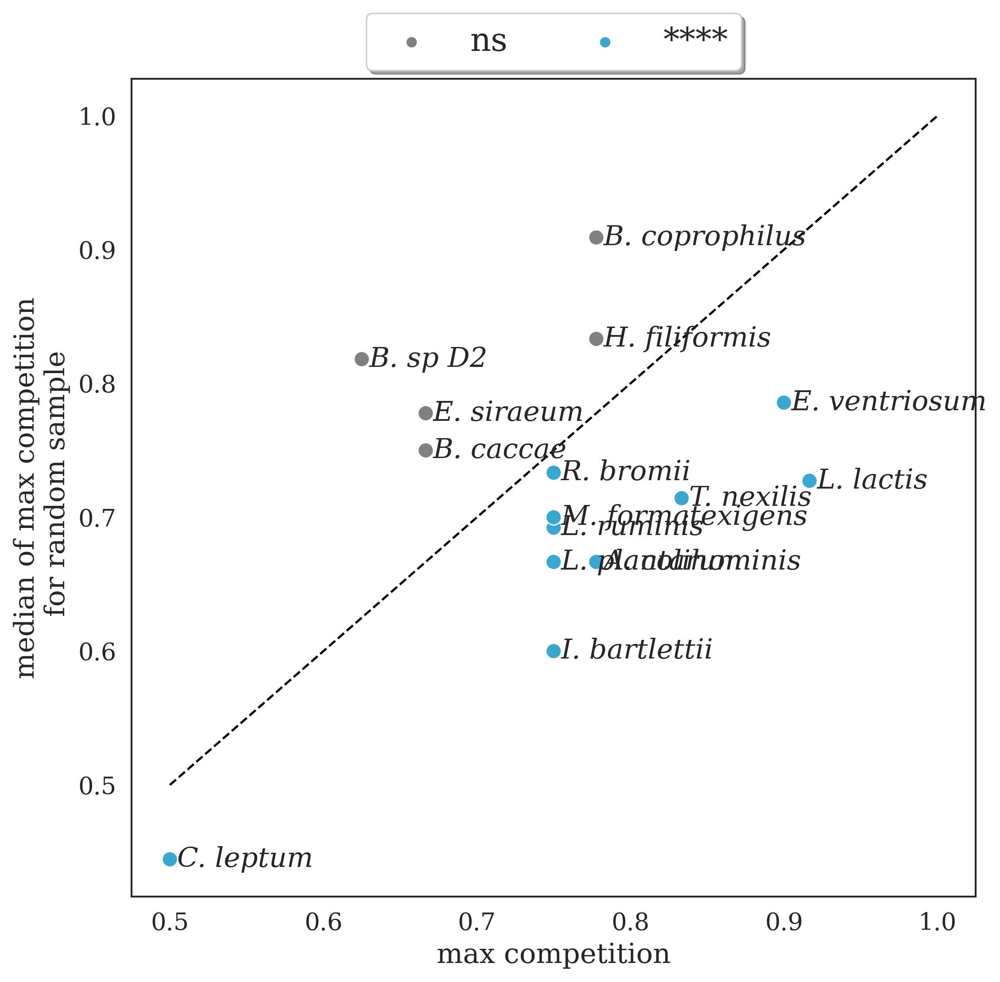

In [230]:
date_ = '20231015'
date_meeting = '20231015'

date_ = '20231025'
date_meeting = '20231025'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(8.2, 8), dpi=300)
cols_ = sns.color_palette("husl", 8)

len_ = size_
x = np.max(competition_top[:, len(id_low_low):], axis=1)[:len(id_low_low)]
y = competition_rand_median_new[:len_]
z = np.array(['ns'] * len(x), dtype=object)
z[p_val_vec_new < 0.05] = '*'
z[p_val_vec_new < 0.01] = '**'
z[p_val_vec_new < 0.001] = '***'
z[p_val_vec_new < 0.0001] = '****'
z = z[:len_]
plt_ = sns.scatterplot(x=x, y=y, hue=z, s=70, hue_order=['ns', '****'], palette=['grey', cols_[5]])
plt.plot([0.5, 1], [0.5, 1], c='black', linestyle='dashed')
plt_.legend(loc='upper center', \
            bbox_to_anchor=(0.5, 1.1), ncol=2, fancybox=True, shadow=True)
xticks_ = np.linspace(50, 100, 6) / 100
plt_.set_xticks(xticks_, labels=xticks_, fontsize=13, rotation=0)
plt_.set_yticks(xticks_, labels=xticks_, fontsize=13, rotation=0)
print(len(x))

plt_.set_ylabel(f'median of max competition\n for random sample', fontsize=15)
plt_.set_xlabel(f'max competition', fontsize=15)

labels = species_names_abbr[id_order[:len(id_low_low)]]
for i, label in enumerate(labels):
    if i >= 0:
        plt_.annotate(label, (x[i], y[i]), \
                         textcoords="offset points", xytext=(4, -4), ha='left', \
                         fontsize=15, style='italic')
    else:
        plt_.annotate(label, (x[i], y[i]), \
                         textcoords="offset points", xytext=(4, 4), ha='left', \
                         fontsize=15, style='italic')


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'species_perturb_keystone_species.svg'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_perturb_competitiveEdge_lowAbun_lessThan_1eNeg6.svg'))

plt.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

In [236]:
id_order = np.argsort(-abun_pred[id_low_low])
print(abun_pred[id_low_low[id_order]])
print(species_names[id_low_low[id_order]])
p_val_vec_new[id_order]

[2.17661486e-07 1.91972225e-07 1.16045624e-07 1.36291723e-08
 1.00000000e-08 1.00000000e-08 1.00000000e-08 1.00000000e-08
 1.00000000e-08 1.00000000e-08 1.00000000e-08 1.00000000e-08
 1.00000000e-08 1.00000000e-08 1.00000000e-08]
['Bacteroides-sp-D2' 'Eubacterium-ventriosum-ATCC-27560'
 'Lactobacillus-plantarum-ATCC-BAA-793'
 'Anaerotruncus-colihominis-DSM-17241' 'Bacteroides-caccae-ATCC-43185'
 'Bacteroides-coprophilus-DSM-18228' 'Clostridium-leptum-DSM-753'
 'Eubacterium-siraeum-DSM-15702' 'Holdemania-filiformis-DSM-12042'
 'Intestinibacter-bartlettii-DSM-16795' 'Lactobacillus-ruminis-ATCC-25644'
 'Lactococcus-lactis-DSMZ-20729' 'Marvinbryantia-formatexigens-DSM-14469'
 'Ruminococcus-bromii-ATCC-27255' 'Tyzzerella-nexilis-DSM-1787']


array([1., 0., 0., 0., 1., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0.])

In [245]:
len(id_low_high) + len(id_low_low)

23

In [243]:
id_ = np.argsort(-num_changes_x)
print(species_names[id_[:6]])
print(abun_pred[id_[:6]])

['Dorea-longicatena-DSM-13814' 'Eggerthella-lenta-DSM-2243'
 'Dorea-formicigenerans-ATCC-27755'
 'Bacteroides-cellulosilyticus-DSM-14838' 'Bacteroides-dorei-DSM-17855'
 'Bacteroides-plebeius-DSM-17135']
[1.16914680e-07 1.00000000e-08 1.62686342e-06 4.86545185e-07
 1.00762267e-04 7.22860812e-06]


In [121]:
z = np.array(['ns'] * size_, dtype=object)
z[p_val_vec < 0.05] = '*'
z[p_val_vec < 0.01] = '**'
z[p_val_vec < 0.001] = '***'
z[p_val_vec < 0.0001] = '****'
z

array(['****', '****', '****', '****', '****', '****', '****', '****',
       '****', '****', '****', '****', 'ns', '****', '****'], dtype=object)

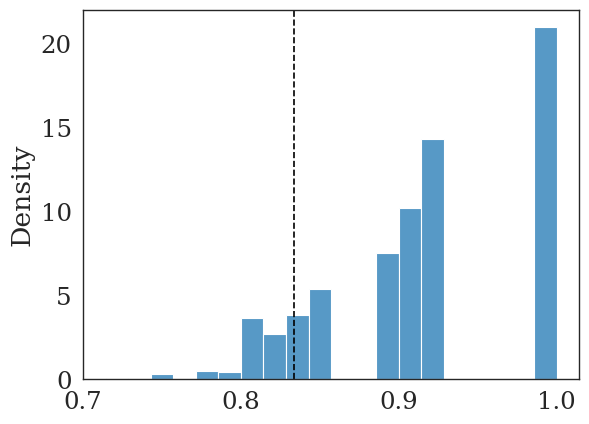

In [97]:
plt_ = sns.histplot(x=competition_rand, bins=20, stat='density')
# plt_ = sns.histplot(x=competition_top[i_, 1:], stat='density')
plt_.axvline(x=np.max(competition_top[i_, 1:]), c='black', linestyle='dashed')

In [105]:
scipy.stats.ttest_1samp(competition_rand, np.max(competition_top[i_, 1:]))
print(scipy.stats.wilcoxon(competition_rand - np.max(competition_top[i_, 1:]))[1])
print(np.median(competition_rand))
np.max(competition_top[i_, 1:])

0.0
0.9166666666666666


0.8333333333333334

In [447]:
id_nnz_x = np.where((num_changes_x >= 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred[id_nnz_x]), \
                                num_changes_x[id_nnz_x])
print(corr_tmp)

PearsonRResult(statistic=-0.21239231408194598, pvalue=0.09468611984854537)


In [448]:
num_changes_x[id_nnz_x]

array([1., 0., 0., 0., 0., 1., 0., 1., 2., 1., 2., 1., 1., 0., 1., 1., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 0.,
       1., 1., 4., 3., 4., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 0., 0., 0., 0., 2., 2., 0., 0.])

In [373]:
len(np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0])
id_sort = np.argsort(-abun_pred)
size_ = 15
print(species_names[id_sort[np.arange(size_)]])
print(abun_pred[id_sort[np.arange(size_)]])

['Clostridium-sporogenes-ATCC-15579' 'Acidaminococcus-intestini-D21'
 'Bacteroides-uniformis-ATCC-8492' 'Mitsuokella-multacida-DSM-20544'
 'Bacteroides-thetaiotaomicron-VPI-5482' 'Anaerostipes-caccae-DSM-14662'
 'Peptostreptococcus-sp-CC14N-HM-1051' 'Bacteroides-sp-2-1-22'
 'Bacteroides-stercoris-ATCC-43183' 'Hungatella-hathewayi-DSM-13479'
 'Ruminococcus-gnavus-ATCC-29149' 'Bacteroides-ovatus-ATCC-8483'
 'Bacteroides-sp-9-1-42FAA' 'Parabacteroides-sp-D13'
 'Bifidobacterium-adolescentis-L2-32']
[0.28654855 0.19337117 0.1779638  0.08704686 0.06404429 0.04031707
 0.02743672 0.02133704 0.01969028 0.01740067 0.01717433 0.01452709
 0.01194778 0.00744698 0.00534646]


In [176]:
sns.color_palette("husl", 8)

[(0.9677975592919913, 0.44127456009157356, 0.5358103155058701),
 (0.8087954113106306, 0.5634700050056693, 0.19502642696727285),
 (0.5920891529639701, 0.6418467016378244, 0.1935069134991043),
 (0.19783576093349015, 0.6955516966063037, 0.3995301037444499),
 (0.21044753832183283, 0.6773105080456748, 0.6433941168468681),
 (0.22335772267769388, 0.6565792317435265, 0.8171355503265633),
 (0.6423044349219739, 0.5497680051256467, 0.9582651433656727),
 (0.9603888539940703, 0.3814317878772117, 0.8683117650835491)]

In [382]:
id_tmp = np.where((num_changes_x <= 1) & (abun_pred <= 1e-8))[0]
id_tmp
print(abun_pred[id_tmp])
print(num_changes_x[id_tmp])
len(id_tmp)
print(id_tmp)

[1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08
 1.e-08]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[ 4  6 30 40 44 46 48 49 50 57 62]


In [74]:
id_nnz_

array([ 1, 19, 22, 23, 25, 32, 33, 51, 54, 55, 58])

In [285]:
tmp = num_changes_x[id_nnz_].copy() + num_changes_y[id_nnz_].copy()

id_sort = np.argsort(-tmp)
# print(num_changes_y[id_nnz_[id_sort]])
size_ = 15
print(num_changes_y[id_nnz_[id_sort[range(size_)]]])
print(num_changes_x[id_nnz_[id_sort[range(size_)]]])
print(species_names[id_nnz_[id_sort[range(size_)]]])
print(abun_pred[id_nnz_[id_sort[range(size_)]]])
print(np.exp(abun_avg_pass_3[id_nnz_[id_sort[range(size_)]]]))

[0.         4.00329793 0.         2.21931946 4.33601782 6.07728738
 1.28078145 2.35833637 2.64583192 5.07189521 3.27391304 1.06497764
 4.35015867 0.         2.04487766]
[8.0430959  4.01096213 7.88582761 5.37005981 2.44427807 0.
 4.43922308 3.27129714 2.92212179 0.         1.24350701 3.37979949
 0.         3.80020119 1.32433964]
['Dorea-longicatena-DSM-13814' 'Bacteroides-dorei-DSM-17855'
 'Eggerthella-lenta-DSM-2243' 'Dorea-formicigenerans-ATCC-27755'
 'Slackia-exigua-ATCC-700122' 'Bacteroides-sp-9-1-42FAA'
 'Bacteroides-cellulosilyticus-DSM-14838'
 'Bacteroides-finegoldii-DSM-17565' 'Acidaminococcus-fermentans-DSM-20731'
 'Bacteroides-fragilis-2-1-16' 'Bacteroides-thetaiotaomicron-1-1-6'
 'Ruminococcus-torques-ATCC-27756' 'Bacteroides-vulgatus-ATCC-8482'
 'Bacteroides-plebeius-DSM-17135' 'Bacteroides-fragilis-3-1-12']
[1.16914680e-07 1.00762267e-04 1.00000000e-08 1.62686342e-06
 1.23719706e-04 1.19477845e-02 4.86545185e-07 2.28210893e-06
 4.42417114e-06 6.02196680e-05 1.87894057e-05 2

In [270]:
id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
tmp = num_changes_y[id_nnz_].copy()

id_sort = np.argsort(-tmp)
# print(num_changes_y[id_nnz_[id_sort]])
size_ = 10
print(num_changes_y[id_nnz_[id_sort[range(size_)]]])
# print(num_changes_x[id_nnz_[id_sort[range(size_)]]])
print(species_names[id_nnz_[id_sort[range(size_)]]])
print(abun_pred[id_nnz_[id_sort[range(size_)]]])
print(np.exp(abun_avg_pass_3[id_nnz_[id_sort[range(size_)]]]))

[6.07728738 5.07189521 4.35015867 4.33601782 4.00329793 3.27391304
 2.99848016 2.67556318 2.66817549 2.64583192]
['Bacteroides-sp-9-1-42FAA' 'Bacteroides-fragilis-2-1-16'
 'Bacteroides-vulgatus-ATCC-8482' 'Slackia-exigua-ATCC-700122'
 'Bacteroides-dorei-DSM-17855' 'Bacteroides-thetaiotaomicron-1-1-6'
 'Bifidobacterium-longum-ATCC-15697' 'Bacteroides-sp-D2'
 'Streptococcus-thermophilus-LMD-9' 'Acidaminococcus-fermentans-DSM-20731']
[1.19477845e-02 6.02196680e-05 2.14161221e-05 1.23719706e-04
 1.00762267e-04 1.87894057e-05 4.52415849e-05 2.17661486e-07
 7.86983579e-06 4.42417114e-06]
[1.97671198e-04 3.84687210e-03 8.53303518e-05 2.10549131e-03
 2.42199233e-01 4.56216287e-02 2.05426682e-08 8.21638705e-04
 2.05376605e-08 7.82053870e-05]


In [282]:
id_order = np.argsort(-abun_pred)
size_ = 10
print(num_changes_y[id_order[:size_]])
print(abun_pred[id_order[:size_]])
print(species_names[id_order[:size_]])
print(np.sum(abun_pred[id_order[:size_]]))

[0.         0.         0.         0.         0.         0.
 0.         1.68477703 0.         0.        ]
[0.28654855 0.19337117 0.1779638  0.08704686 0.06404429 0.04031707
 0.02743672 0.02133704 0.01969028 0.01740067]
['Clostridium-sporogenes-ATCC-15579' 'Acidaminococcus-intestini-D21'
 'Bacteroides-uniformis-ATCC-8492' 'Mitsuokella-multacida-DSM-20544'
 'Bacteroides-thetaiotaomicron-VPI-5482' 'Anaerostipes-caccae-DSM-14662'
 'Peptostreptococcus-sp-CC14N-HM-1051' 'Bacteroides-sp-2-1-22'
 'Bacteroides-stercoris-ATCC-43183' 'Hungatella-hathewayi-DSM-13479']
0.9351564601672078


In [280]:
id_order = np.argsort(abun_pred)
size_ = 21
print(num_changes_y[id_order[:size_]])
print(abun_pred[id_order[:size_]])
print(species_names[id_order[:size_]])
print(np.sum(abun_pred[id_order[:size_]]))

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1.00000000e-08 1.00000000e-08 1.00000000e-08 1.00000000e-08
 1.00000000e-08 1.00000000e-08 1.00000000e-08 1.00000000e-08
 1.00000000e-08 1.00000000e-08 1.00000000e-08 1.00000000e-08
 1.00000000e-08 1.00000000e-08 1.36291723e-08 3.25186909e-08
 3.69484512e-08 1.16045624e-07 1.16914680e-07 1.31590263e-07
 1.91972225e-07]
['Tyzzerella-nexilis-DSM-1787' 'Eggerthella-lenta-DSM-2243'
 'Eubacterium-siraeum-DSM-15702' 'Holdemania-filiformis-DSM-12042'
 'Intestinibacter-bartlettii-DSM-16795' 'Clostridium-leptum-DSM-753'
 'Lactobacillus-ruminis-ATCC-25644' 'Lactococcus-lactis-DSMZ-20729'
 'Catenibacterium-mitsuokai-DSM-15897'
 'Parabacteroides-johnsonii-DSM-18315'
 'Marvinbryantia-formatexigens-DSM-14469' 'Bacteroides-caccae-ATCC-43185'
 'Ruminococcus-bromii-ATCC-27255' 'Bacteroides-coprophilus-DSM-18228'
 'Anaerotruncus-colihominis-DSM-17241' 'Holdemanella-biformis-DSM-3989'
 'Coprococcus-comes-ATCC-27758' 'Lactobacillus-plantaru

In [73]:
tmp = num_changes_x[id_nnz_].copy() + num_changes_y[id_nnz_].copy()

id_sort = np.argsort(-tmp)
# print(num_changes_y[id_nnz_[id_sort]])
size_ = 10
print(num_changes_y[id_nnz_[id_sort[range(size_)]]])
print(num_changes_x[id_nnz_[id_sort[range(size_)]]])
print(species_names[id_nnz_[id_sort[range(size_)]]])
print(abun_pred[id_nnz_[id_sort[range(size_)]]])
print(np.exp(abun_avg_pass_3[id_nnz_[id_sort[range(size_)]]]))

[32.2032028   9.16308012  9.05949481  3.92814874  0.          1.03873429
  0.          0.          0.          0.        ]
[18.83363076 13.94382237 12.74132133  6.49173936  6.1884141   3.7203666
  3.49858174  2.35553018  1.37001364  1.24350701]
['Clostridium-sporogenes-ATCC-15579' 'Acidaminococcus-intestini-D21'
 'Bacteroides-uniformis-ATCC-8492' 'Mitsuokella-multacida-DSM-20544'
 'Collinsella-aerofaciens-ATCC-25986'
 'Bacteroides-thetaiotaomicron-VPI-5482' 'Ruminococcus-gnavus-ATCC-29149'
 'Parabacteroides-merdae-ATCC-43184' 'Bifidobacterium-adolescentis-L2-32'
 'Bacteroides-sp-9-1-42FAA']
[0.28654855 0.19337117 0.1779638  0.08704686 0.00189053 0.06404429
 0.01717433 0.00059002 0.00534646 0.01194778]
[7.12048815e-03 2.89274018e-01 5.57492250e-02 4.86556195e-02
 2.37350667e-03 6.19659039e-02 5.07810532e-03 1.20905119e-03
 5.77015209e-03 1.97671198e-04]


In [283]:
# print(species_names)
# 21 bacteriodes


N = 63
K = 21
n = 15
x = 9
print(K / N)
print(x / n)
print((x / n) / (K / N))
p_value = 1 - scipy.stats.hypergeom.cdf(x, N, n, K) + scipy.stats.hypergeom.pmf(x, N, n, K)
print(p_value)

0.3333333333333333
0.6
1.8
0.015433925226153417


In [469]:
count_nnz = np.zeros((num_species, num_species))
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes_x = np.sum(count_nnz, axis=0)

In [125]:
id_sort = np.argsort(-num_changes_y[id_nnz_y])
# print(num_changes_y[id_nnz_[id_sort]])
size_ = 10
print(num_changes_y[id_nnz_y[id_sort[range(size_)]]])
print(species_names[id_nnz_y[id_sort[range(size_)]]])
print(abun_pred[id_nnz_y[id_sort[range(size_)]]])
print(np.exp(abun_avg_pass_3[id_nnz_y[id_sort[range(size_)]]]))

[6.07728738 5.07189521 4.35015867 4.33601782 4.00329793 3.27391304
 2.99848016 2.67556318 2.66817549 2.64583192]
['Bacteroides-sp-9-1-42FAA' 'Bacteroides-fragilis-2-1-16'
 'Bacteroides-vulgatus-ATCC-8482' 'Slackia-exigua-ATCC-700122'
 'Bacteroides-dorei-DSM-17855' 'Bacteroides-thetaiotaomicron-1-1-6'
 'Bifidobacterium-longum-ATCC-15697' 'Bacteroides-sp-D2'
 'Streptococcus-thermophilus-LMD-9' 'Acidaminococcus-fermentans-DSM-20731']
[1.19477845e-02 6.02196680e-05 2.14161221e-05 1.23719706e-04
 1.00762267e-04 1.87894057e-05 4.52415849e-05 2.17661486e-07
 7.86983579e-06 4.42417114e-06]
[1.97671198e-04 3.84687210e-03 8.53303518e-05 2.10549131e-03
 2.42199233e-01 4.56216287e-02 2.05426682e-08 8.21638705e-04
 2.05376605e-08 7.82053870e-05]


In [126]:
id_sort = np.argsort(-num_changes_x[id_nnz_])
# print(num_changes_y[id_nnz_[id_sort]])
size_ = 10
print(num_changes_x[id_nnz_[id_sort[range(size_)]]])
print(species_names[id_nnz_[id_sort[range(size_)]]])
print(abun_pred[id_nnz_[id_sort[range(size_)]]])
print(np.exp(abun_avg_pass_3[id_nnz_[id_sort[range(size_)]]]))

[8.0430959  7.88582761 5.37005981 4.43922308 4.01096213 3.80020119
 3.37979949 3.34206892 3.27129714 2.92212179]
['Dorea-longicatena-DSM-13814' 'Eggerthella-lenta-DSM-2243'
 'Dorea-formicigenerans-ATCC-27755'
 'Bacteroides-cellulosilyticus-DSM-14838' 'Bacteroides-dorei-DSM-17855'
 'Bacteroides-plebeius-DSM-17135' 'Ruminococcus-torques-ATCC-27756'
 'Catenibacterium-mitsuokai-DSM-15897' 'Bacteroides-finegoldii-DSM-17565'
 'Acidaminococcus-fermentans-DSM-20731']
[1.16914680e-07 1.00000000e-08 1.62686342e-06 4.86545185e-07
 1.00762267e-04 7.22860812e-06 2.03171059e-06 1.00000000e-08
 2.28210893e-06 4.42417114e-06]
[1.54806073e-07 2.50154170e-04 1.89343428e-04 7.25509592e-07
 2.42199233e-01 9.87951154e-08 1.90285542e-05 2.43820506e-08
 6.36790988e-06 7.82053870e-05]


In [249]:
id_ = np.where(species_names == 'Clostridium-scindens-ATCC-35704')[0][0]
adj_G[id_, :]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [246]:
adj_G

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 3.4359179 ,  0.        ,  0.        , ..., -2.52716684,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [130]:
len(np.where((num_changes_x == 0) & (num_changes_y > 0))[0])

0

In [244]:
adj_bin = np.zeros(adj_G.shape)
adj_bin[adj_G != 0] = 1
sum_ = np.sum(adj_bin, axis=1)
id_max = np.where(sum_ == np.max(sum_))[0]
id_max[0]
(np.exp(abun_avg_pass_3[id_max[0]]))
species_names[id_max[0]]
df_speciesMetab_cluster.iloc[id_max[0], :]
df_speciesMetab_prod_cluster.iloc[id_max[0], :]

0     0.000000
1     0.551825
2     0.310053
3     0.000000
4     0.124785
        ...   
93    0.071619
94    0.436439
95    0.000000
96    0.000000
97    0.000000
Name: Clostridium sporogenes ATCC 15579, Length: 98, dtype: float64

In [106]:
adj_G[1, :]

array([ 3.4359179 ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  1.58499706,  0.        ,  0.        ,
        0.        ,  1.18690878,  1.61636944,  0.        ,  4.58404778,
       -3.18563735, -3.44874857, -3.20928662,  0.        , -3.35969379,
       -1.27668286,  0.        ,  0.        ,  0.        , -2.88321435,
        0.        ,  0.        ,  0.        ,  0.        ,  1.29552758,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  2.16580868,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       -1.45778081,  0.        ,  0.        ,  0.        ,  0.        ,
       -2.52716684,  0.        ,  0.        ])

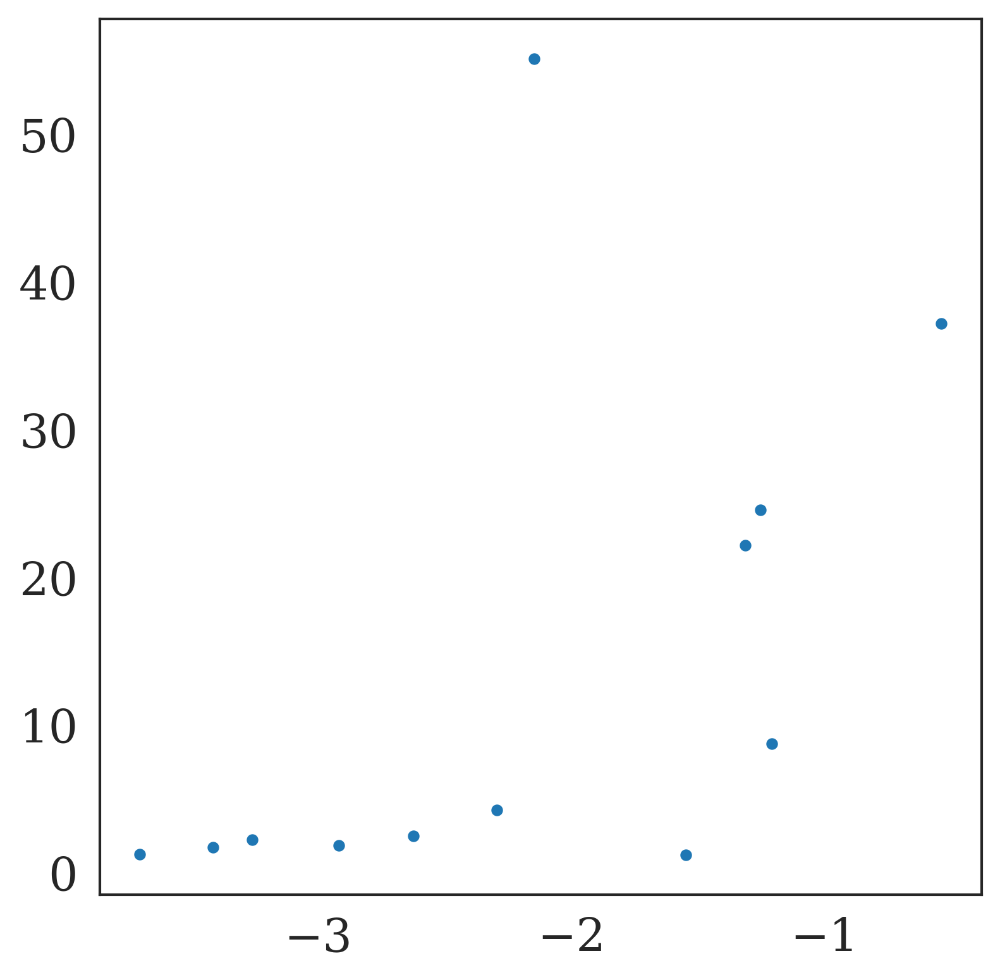

In [103]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)
id_ = np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0]
len(np.where(np.sum(np.abs(adj_G), axis=1) != 0)[0])

abuns_ = abun_avg_pass_3
type_ = np.array(['non keystone'] * len(abun_avg_pass_3), dtype=object)
type_[id_] = 'keystone'
# plt_ = sns.histplot(x=abuns_, hue=type_)

count_nnz = np.zeros((num_species, num_species))
id_ = np.where(np.abs(adj_G) > 0)
count_nnz[id_] = np.abs(adj_G)[id_]
num_changes = np.sum(count_nnz, axis=1)

id_nnz_ = np.where(np.sum(np.abs(adj_G), axis=1) != 0)
plt_ = sns.scatterplot(x=np.log10(np.exp(abun_avg_pass_3[id_nnz_])), y=num_changes[id_nnz_])

In [434]:
node_labels = {}
for s_ in range(len(species_names)):
    id_ = np.where(df_names_convert.iloc[:, 1].values == species_names_abbr[s_])[0]
    if len(id_) > 0:
        node_labels[f'{s_ + 1}'] = df_names_convert.iloc[id_, 1].values[0]

In [128]:
G_new = nx.relabel_nodes(G, node_labels)

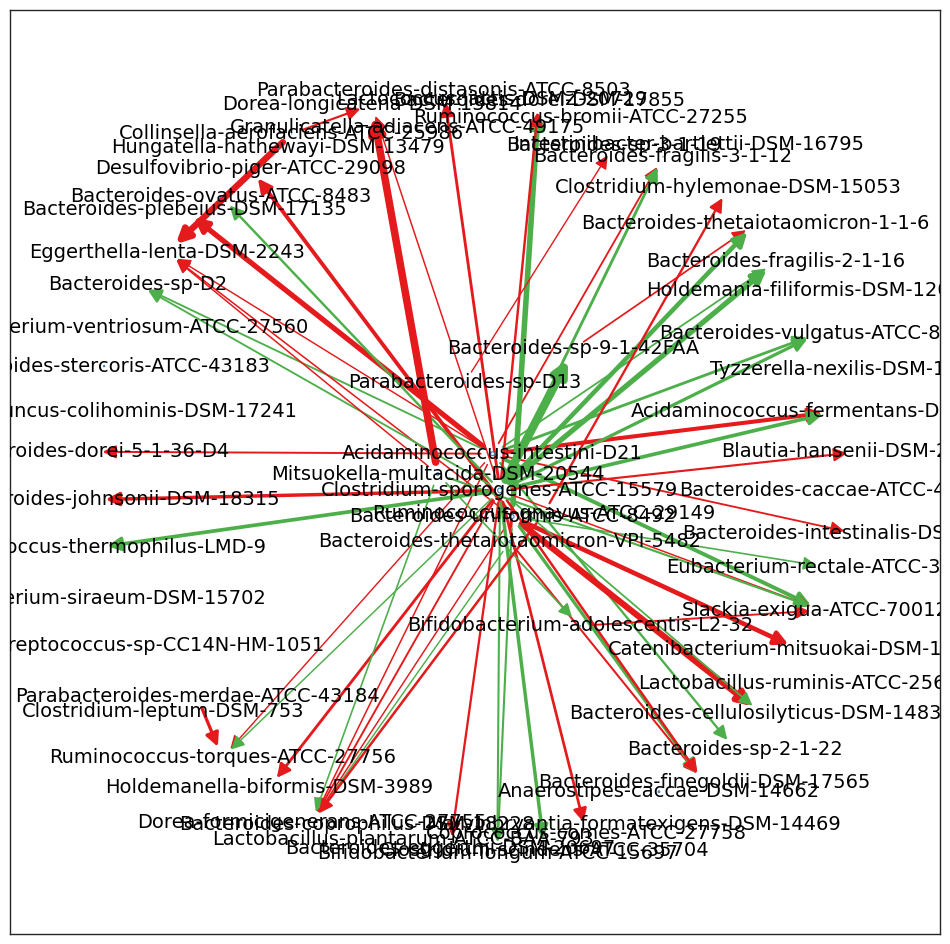

In [129]:
# only between green nodes
date_ = '20231005'
date_meeting = '20231005'
edges = G_new.edges()
nodes_ = G_new.nodes()
colors = [G_new[u][v]['increased abundance'] for u,v in edges]
weights = [G_new[u][v]['weight'] for u,v in edges]
node_size_ = [u[1]['abundance_obs'] * 40 for u in G_new.nodes.data()]
node_color_ = [u[1]['node_color'] for u in G_new.nodes.data()]
pos = nx.spring_layout(G_new, seed=986, iterations=100, weight=None, k=0.9)
# pos = nx.planar_layout(G)

labels = {}    
for node in G.nodes(): 
    labels[node] = node

plt.rcParams["figure.figsize"] = (12,12)
# plt_ = nx.draw_networkx(G, pos, edge_color=colors, width=weights, node_size=node_size_, \
#                         node_color=node_color_, arrowsize=20)
nodes = nx.draw_networkx_nodes(G_new, pos, node_size=node_size_, node_color=node_color_)
nx.draw_networkx_labels(G_new, pos, font_size=14, font_color='black')
# for node, (x, y) in pos.items():
#     plt.text(x, y, node, fontsize=node_size_[int(node) - 1]*0.04, ha='center', va='center', \
#              color='black')
# Set edge color to red
nodes.set_edgecolor('#377eb8')
edges_draw = nx.draw_networkx_edges(G_new, pos, arrowsize=20, width=weights, edge_color=colors)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_species_interaction_network.pdf'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# # file_save = os.path.abspath(os.path.join(save_dir, 
# #                                             f'predicted_vs_observed_abundance.pdf'))

# # fig.figure.savefig(file_save, \
# #                     dpi=300, transparent=False, facecolor="white")
# plt.close()

In [246]:
species_names[[1, 22, 23, 58, 51]]

array([['Acidaminococcus-intestini-D21'],
       ['Bacteroides-thetaiotaomicron-VPI-5482'],
       ['Bacteroides-uniformis-ATCC-8492'],
       ['Ruminococcus-gnavus-ATCC-29149'],
       ['Mitsuokella-multacida-DSM-20544']], dtype=object)

In [233]:
print((np.exp(abun_avg_pass_3))[[1, 22, 23, 58, 51]])
id_ = np.argsort(-abun_avg_pass_3)
np.exp(abun_avg_pass_3[id_[np.arange(5)]])

[0.28927402 0.0619659  0.05574923 0.00507811 0.04865562]


array([0.28927402, 0.24219923, 0.0619659 , 0.05574923, 0.05542226])

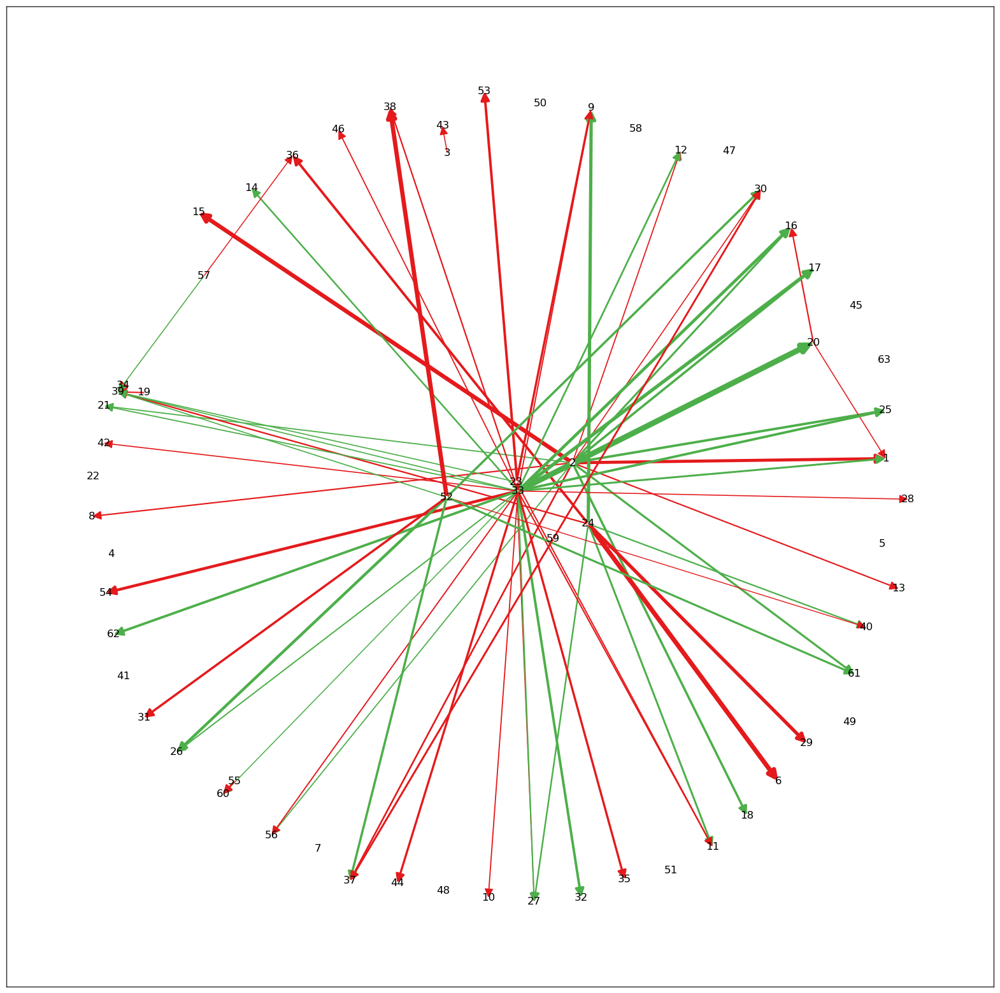

In [146]:
# only between green nodes

edges = G.edges()
nodes_ = G.nodes()
colors = [G[u][v]['increased abundance'] for u,v in edges]
weights = [G[u][v]['weight'] for u,v in edges]
node_size_ = [u[1]['abundance_obs'] for u in G.nodes.data()]
node_color_ = [u[1]['node_color'] for u in G.nodes.data()]
pos = nx.spring_layout(G, seed=986, iterations=100)

plt.rcParams["figure.figsize"] = (20,20)
plt_ = nx.draw_networkx(G, pos, edge_color=colors, width=weights, node_size=node_size_, \
                        node_color=node_color_, arrowsize=20)

In [130]:
date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
G_new.remove_nodes_from(list(nx.isolates(G_new)))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'species_species_interaction_network_new.gexf'))
nx.write_gexf(G_new, file_save)

# perturb strains: competition and cross-feeding

In [55]:
def get_competition(Ri_avg, df_speciesMetab_cluster, id_1, id_2):
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    vec_src = df_speciesMetab_cluster.iloc[id_1, :].values
    vec_dest = df_speciesMetab_cluster.iloc[id_2, :].values
    nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
    nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
#     competition_rand[b_] = nnz_common / nnz_dest
#         competition_rand[b_] = tmp
    return nnz_common / nnz_dest

def get_crossfeeding(Ri_avg, df_speciesMetab_cluster, \
                     df_speciesMetab_prod_cluster, id_1, id_2):
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    vec_src = df_speciesMetab_prod_cluster.iloc[int(id_1), :].values
    vec_dest = df_speciesMetab_cluster.iloc[int(id_2), :].values
    nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
    nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
#         crossfeeding_rand[b_] = tmp
    return nnz_common / nnz_dest 

def random_competition_index(Ri_avg, df_speciesMetab_cluster, id_src, nboot=10000):
    competition_rand = np.zeros((nboot))
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    for b_ in range(nboot):
        id_1 = np.random.choice(id_src, 1, replace=False)[0]
        id_species_left = id_species.copy()
        id_species_left = np.delete(id_species_left, [id_1])
        id_2 = np.random.choice(id_species_left, 1, replace=False)[0]
        vec_src = df_speciesMetab_cluster.iloc[int(id_1), :].values
        vec_dest = df_speciesMetab_cluster.iloc[int(id_2), :].values
        nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
        nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
        tmp = np.sum(Ri_avg * vec_src * Ri_avg * vec_dest) / \
            (np.sqrt(np.sum(np.power(Ri_avg * vec_src, 2))) * \
             np.sqrt(np.sum(np.power(Ri_avg * vec_dest, 2))))
        competition_rand[b_] = nnz_common / nnz_dest
#         competition_rand[b_] = tmp
    return competition_rand

def random_competition_index_2_0(Ri_avg, df_speciesMetab_cluster, id_src, adj_G, nboot=10000):
    id_zero = np.where(adj_G <= 0)
    competition_rand = np.zeros((nboot))
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    for b_ in range(len(id_zero[0])):
        # id_choose = np.random.choice(np.arange(len(id_zero[0])), 1, replace=False)
        id_1 = id_zero[0][b_]
        id_2 = id_zero[1][b_]
        # id_1 = np.random.choice(id_src, 1, replace=False)[0]
        # id_species_left = id_species.copy()
        # id_species_left = np.delete(id_species_left, [id_1])
        # id_2 = np.random.choice(id_species_left, 1, replace=False)[0]
        vec_src = df_speciesMetab_cluster.iloc[int(id_1), :].values
        vec_dest = df_speciesMetab_cluster.iloc[int(id_2), :].values
        nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
        nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
        tmp = np.sum(Ri_avg * vec_src * Ri_avg * vec_dest) / \
            (np.sqrt(np.sum(np.power(Ri_avg * vec_src, 2))) * \
             np.sqrt(np.sum(np.power(Ri_avg * vec_dest, 2))))
        competition_rand[b_] = nnz_common / nnz_dest
#         competition_rand[b_] = tmp
    return competition_rand

def random_competition_with_blue_index(Ri_avg, df_speciesMetab_cluster, id_src, perturbed_nodes_nnz, nboot=10000):
    competition_rand = np.zeros((nboot))
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    for b_ in range(nboot):
        id_1 = np.random.choice(id_src, 1, replace=False)[0]
        id_species_left = id_species.copy()
        id_species_left = np.delete(id_species_left, [id_1])
        num_red = np.random.choice(perturbed_nodes_nnz, 1, replace=False)[0]
        id_2_vec = np.random.choice(id_species_left, num_red, replace=False)
        vec_src = df_speciesMetab_cluster.iloc[int(id_1), :].values
        competition_rand_tmp = []
        for id_2 in id_2_vec:
            vec_dest = df_speciesMetab_cluster.iloc[int(id_2), :].values
            nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
            nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
            tmp = np.sum(Ri_avg * vec_src * Ri_avg * vec_dest) / \
                (np.sqrt(np.sum(np.power(Ri_avg * vec_src, 2))) * \
                 np.sqrt(np.sum(np.power(Ri_avg * vec_dest, 2))))
#             competition_rand[b_] = nnz_common / nnz_dest
#             competition_rand_tmp.append(tmp)
            competition_rand_tmp.append(nnz_common / nnz_dest)
        competition_rand[b_] = np.median(np.array(competition_rand_tmp))
    return competition_rand

def random_crossfeeding_index(Ri_avg, df_speciesMetab_cluster, \
                              df_speciesMetab_prod_cluster, id_src, nboot=10000):
    crossfeeding_rand = np.zeros((nboot))
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    for b_ in range(nboot):
        id_1 = np.random.choice(id_src, 1, replace=False)[0]
        id_species_left = id_species.copy()
        id_species_left = np.delete(id_species_left, [id_1])
        id_2 = np.random.choice(id_species_left, 1, replace=False)[0]
        vec_src = df_speciesMetab_prod_cluster.iloc[int(id_1), :].values
        vec_dest = df_speciesMetab_cluster.iloc[int(id_2), :].values
        nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
        nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
        tmp = np.sum(vec_src * vec_dest) / \
            (np.sqrt(np.sum(np.power(vec_src, 2))) * np.sqrt(np.sum(np.power(vec_dest, 2))))
        crossfeeding_rand[b_] = nnz_common / nnz_dest
#         crossfeeding_rand[b_] = tmp
    return crossfeeding_rand    


def random_crossfeeding_index_2_0(Ri_avg, df_speciesMetab_cluster, \
                              df_speciesMetab_prod_cluster, id_src, adj_G, nboot=10000):
    
    id_zero = np.where(adj_G >= 0)
    crossfeeding_rand = np.zeros((nboot))
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    for b_ in range(len(id_zero[0])):
        id_1 = id_zero[0][b_]
        id_2 = id_zero[1][b_]
        vec_src = df_speciesMetab_prod_cluster.iloc[int(id_1), :].values
        vec_dest = df_speciesMetab_cluster.iloc[int(id_2), :].values
        nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
        nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
        tmp = np.sum(vec_src * vec_dest) / \
            (np.sqrt(np.sum(np.power(vec_src, 2))) * np.sqrt(np.sum(np.power(vec_dest, 2))))
        crossfeeding_rand[b_] = nnz_common / nnz_dest
#         crossfeeding_rand[b_] = tmp
    return crossfeeding_rand   




In [56]:
adj_G = np.zeros((num_species, num_species))
edges = G.edges()
nodes_ = G.nodes()
for u,v in edges:
    i = int(u) - 1
    j = int(v) - 1
    if G[u][v]['increased abundance'] == red_:
        adj_G[i, j] = G[u][v]['weight']
    else:
        adj_G[i, j] = -G[u][v]['weight']

In [57]:
# id_species_green = np.where(col_species == "green")[0]
np.random.seed(92398)
id_species_green = np.arange(num_species)
# id_src = np.where(col_species == "gray")[0]
id_src = np.arange(num_species)

count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
# Ri_avg[Ri_avg >= zero_thresh_Ri] = 1
Ri_avg[Ri_avg < zero_thresh_Ri] = 0
# competition_rand = random_competition_index(Ri_avg, \
#                                             df_speciesMetab_cluster.iloc[id_species_green, :].copy(), \
#                                             id_src, \
#                                             nboot=10000)
competition_rand = random_competition_index_2_0(Ri_avg, \
                                            df_speciesMetab_cluster.iloc[id_species_green, :].copy(), \
                                            id_src, adj_G, \
                                            nboot=10000)
# crossfeeding_rand = \
#     random_crossfeeding_index(Ri_avg, df_speciesMetab_cluster.iloc[id_species_green, :].copy(), \
#                               df_speciesMetab_prod_cluster.iloc[id_species_green, :].copy(), \
#                               id_src, \
#                               nboot=10000)
crossfeeding_rand = \
    random_crossfeeding_index_2_0(Ri_avg, df_speciesMetab_cluster.iloc[id_species_green, :].copy(), \
                              df_speciesMetab_prod_cluster.iloc[id_species_green, :].copy(), \
                              id_src, adj_G, \
                              nboot=10000)

# competition_rand_with_blue = \
#     random_competition_with_blue_index(Ri_avg, \
#                                        df_speciesMetab_cluster.iloc[id_species_green, :].copy(), \
#                                        id_src, \
#                                        perturbed_nodes_nnz, nboot=10000)

cross-feeding_random cross-feeding vs. cross-feeding_observed cross-feeding: Mann-Whitney-Wilcoxon test two-sided, P_val:7.839e-05 U_stat=7.184e+04
competition_random competition vs. competition_observed competition: Mann-Whitney-Wilcoxon test two-sided, P_val:1.860e-02 U_stat=1.392e+05
competition
MannwhitneyuResult(statistic=139199.5, pvalue=0.01859509008545462)
0.5855901870085538
0.6487328847622966
cross-feeding
MannwhitneyuResult(statistic=71844.5, pvalue=7.838891006886174e-05)
0.5508665976571587
0.6436977238447827


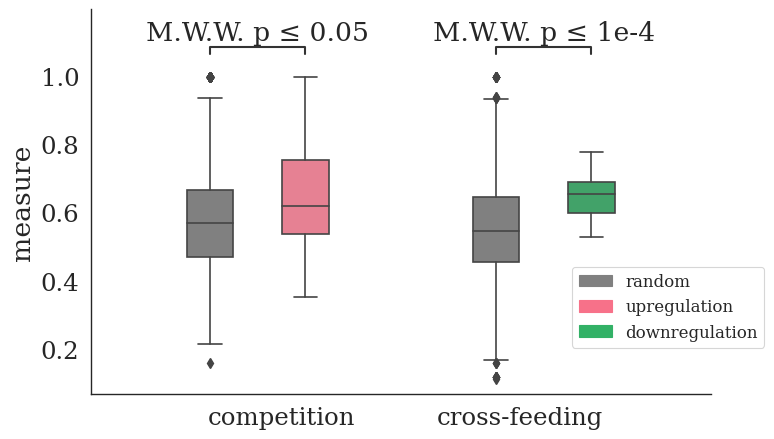

In [176]:
date_ = '20231015'
date_meeting = '20231015'

cols_ = sns.color_palette("husl", 8)

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
# plt.rcParams["figure.figsize"] = (8,5)
plt.figure(figsize=(8, 5))
x1 = competition_rand.flatten()
x2 = crossfeeding_rand.flatten()
x = np.hstack([x1, \
               x2])
y1 = competition_[col_edges_full == red_].flatten()
y2 = cross_feeding[col_edges_full == blue_].flatten()
y = np.hstack([y1, y2])
df_plt = pd.DataFrame(data={"measure" : np.hstack([x, y]), \
                            "type" : ["random competition"] * len(x1) + \
                            ["random cross-feeding"] * len(x2)+ \
                            ["observed competition"] * len(y1) + \
                            ["observed cross-feeding"] * len(y2), \
                            "direction": ['competition'] * len(x1) + ['cross-feeding'] * len(x2) + \
                            ['competition'] * len(y1) + ['cross-feeding'] * len(y2)})
plt_ = sns.boxplot(data=df_plt, x="direction", y="measure", hue='type', \
                   hue_order=["random competition", "random cross-feeding", \
                              "observed competition", "observed cross-feeding"], \
                   palette = ['gray', 'gray', cols_[0], cols_[3]])
plt_.set_xlabel(None)
pairs = [[('competition', 'random competition'), ('competition', 'observed competition')], \
         [('cross-feeding', 'random cross-feeding'), ('cross-feeding', 'observed cross-feeding')]]
# pairs = [('random competition', 'observed competition')]
annotator = Annotator(plt_, pairs, data=df_plt, x='direction', y='measure', hue='type', \
                   hue_order=["random competition", "random cross-feeding", \
                              "observed competition", "observed cross-feeding"], \
                   palette = ['gray', 'gray', cols_[0], cols_[3]])
# annotator = Annotator(plt_, pairs, data=df_plt, x='type', y='metric')
annotator.configure(test="Mann-Whitney", text_format="simple")
annotator.apply_and_annotate()

# legend_labels = ['random', 'competition', 'cross-feeding']
handles = [plt.Rectangle((0,0),1,1, color='gray'), \
           plt.Rectangle((0,0),1,1, color=cols_[0]), \
           plt.Rectangle((0,0),1,1, color=cols_[3])]
legend_labels = ['random', 'upregulation', 'downregulation']
# handles = [plt.Rectangle((0,0),1,1, color='gray')]
handles = [plt.Rectangle((0,0),1,1, color='gray'), \
           plt.Rectangle((0,0),1,1, color=cols_[0]), \
           plt.Rectangle((0,0),1,1, color=cols_[3])]
plt_.legend(handles, legend_labels, title=None, loc='lower right', \
            bbox_to_anchor=(1.1, 0.1), ncol=1, fontsize=12)
# plt.legend(bbox_to_anchor=(1.02, 0.55), loc='upper center', borderaxespad=0)
plt_ = sns.despine(right=True, top=True, ax=plt_)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'competition_crossFeeding_vs_random.svg'))

plt.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close()

# competition
print(f'competition')
print(scipy.stats.mannwhitneyu(x1, y1))
print(np.mean(x1))
print(np.mean(y1))

# cross-feeding
print(f'cross-feeding')
print(scipy.stats.mannwhitneyu(x2, y2))
print(np.mean(x2))
print(np.mean(y2))

# save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
#                                         'predictions', 'leaveOneOut', \
#                                         f'{date_meeting}_for_paper_' + \
#                                         f'_Ri_fit_dynamic_with_production' + \
#                                         f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
#                                         f'_pass_1to2', 'figures_paper'))
# if not os.path.exists(save_dir):
#    # Create a new directory because it does not exist
#    os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'data_competition_crossFeeding_vs_random.csv'))
# df_plt.to_csv(file_save, index=False)

cross-feeding_random cross-feeding vs. cross-feeding_observed cross-feeding: Mann-Whitney-Wilcoxon test two-sided, P_val:4.910e-15 U_stat=2.812e+04
competition_random competition vs. competition_observed competition: Mann-Whitney-Wilcoxon test two-sided, P_val:5.933e-16 U_stat=5.609e+04
competition
MannwhitneyuResult(statistic=56088.5, pvalue=5.932684326253338e-16)
0.23276165209145858
0.6487328847622966
cross-feeding
MannwhitneyuResult(statistic=28122.5, pvalue=4.910176149378882e-15)
0.215887351793803
0.6436977238447827


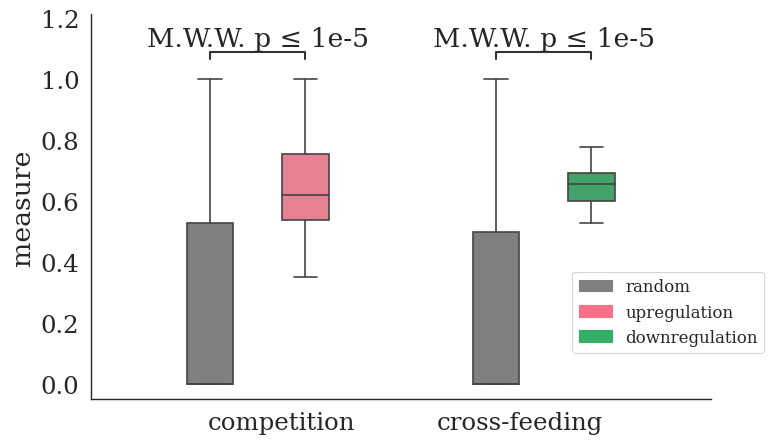

In [62]:
date_ = '20231015'
date_meeting = '20231015'

cols_ = sns.color_palette("husl", 8)

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
# plt.rcParams["figure.figsize"] = (8,5)
plt.figure(figsize=(8, 5))
x1 = competition_rand.flatten()
x2 = crossfeeding_rand.flatten()
x = np.hstack([x1, \
               x2])
y1 = competition_[col_edges_full == red_].flatten()
y2 = cross_feeding[col_edges_full == blue_].flatten()
y = np.hstack([y1, y2])
df_plt = pd.DataFrame(data={"measure" : np.hstack([x, y]), \
                            "type" : ["random competition"] * len(x1) + \
                            ["random cross-feeding"] * len(x2)+ \
                            ["observed competition"] * len(y1) + \
                            ["observed cross-feeding"] * len(y2), \
                            "direction": ['competition'] * len(x1) + ['cross-feeding'] * len(x2) + \
                            ['competition'] * len(y1) + ['cross-feeding'] * len(y2)})
plt_ = sns.boxplot(data=df_plt, x="direction", y="measure", hue='type', \
                   hue_order=["random competition", "random cross-feeding", \
                              "observed competition", "observed cross-feeding"], \
                   palette = ['gray', 'gray', cols_[0], cols_[3]])
plt_.set_xlabel(None)
pairs = [[('competition', 'random competition'), ('competition', 'observed competition')], \
         [('cross-feeding', 'random cross-feeding'), ('cross-feeding', 'observed cross-feeding')]]
# pairs = [('random competition', 'observed competition')]
annotator = Annotator(plt_, pairs, data=df_plt, x='direction', y='measure', hue='type', \
                   hue_order=["random competition", "random cross-feeding", \
                              "observed competition", "observed cross-feeding"], \
                   palette = ['gray', 'gray', cols_[0], cols_[3]])
# annotator = Annotator(plt_, pairs, data=df_plt, x='type', y='metric')
annotator.configure(test="Mann-Whitney", text_format="simple")
annotator.apply_and_annotate()

# legend_labels = ['random', 'competition', 'cross-feeding']
handles = [plt.Rectangle((0,0),1,1, color='gray'), \
           plt.Rectangle((0,0),1,1, color=cols_[0]), \
           plt.Rectangle((0,0),1,1, color=cols_[3])]
legend_labels = ['random', 'upregulation', 'downregulation']
# handles = [plt.Rectangle((0,0),1,1, color='gray')]
handles = [plt.Rectangle((0,0),1,1, color='gray'), \
           plt.Rectangle((0,0),1,1, color=cols_[0]), \
           plt.Rectangle((0,0),1,1, color=cols_[3])]
plt_.legend(handles, legend_labels, title=None, loc='lower right', \
            bbox_to_anchor=(1.1, 0.1), ncol=1, fontsize=12)
# plt.legend(bbox_to_anchor=(1.02, 0.55), loc='upper center', borderaxespad=0)
plt_ = sns.despine(right=True, top=True, ax=plt_)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'competition_crossFeeding_vs_random_with_not_random_twoGroups.svg'))

plt.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close()

# competition
print(f'competition')
print(scipy.stats.mannwhitneyu(x1, y1))
print(np.mean(x1))
print(np.mean(y1))

# cross-feeding
print(f'cross-feeding')
print(scipy.stats.mannwhitneyu(x2, y2))
print(np.mean(x2))
print(np.mean(y2))

# save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
#                                         'predictions', 'leaveOneOut', \
#                                         f'{date_meeting}_for_paper_' + \
#                                         f'_Ri_fit_dynamic_with_production' + \
#                                         f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
#                                         f'_pass_1to2', 'figures_paper'))
# if not os.path.exists(save_dir):
#    # Create a new directory because it does not exist
#    os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'data_competition_crossFeeding_vs_random.csv'))
# df_plt.to_csv(file_save, index=False)

# test cheng et al. 2022 cell

In [388]:
# passage 3 abundance for the unperturbed metabs
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log(abun_avg_pass_3), axis=1)

In [389]:
# get strain abundances from cheng et al. 2022
filepath_ = os.path.abspath(os.path.join('..', 'data', 'fischbach', \
                                    'design_hcom', \
                                    'relative_abundances.csv'))
df_abun_cheng = pd.read_csv(filepath_, index_col=None, header=None)

In [390]:
df_abun_cheng_filter = df_abun_cheng.copy()
df_abun_cheng_filter = df_abun_cheng_filter.dropna(subset=[1, 2])
df_abun_cheng_filter.index = df_abun_cheng_filter.iloc[:, 1].values

In [391]:
valid_indices = [i for i in species_names if i in df_abun_cheng_filter.index]
df_abun_cheng_filter_final = df_abun_cheng_filter.loc[valid_indices, :].copy()

In [392]:
abun_avg_filter = np.log10(np.exp(abun_avg_pass_3.copy()))
id_select = []
for i in range(len(valid_indices)):
    id_ = np.where(species_names == valid_indices[i])[0]
    if len(id_) > 0:
        id_select.append(id_[0])
        
abun_avg_filter = abun_avg_filter[id_select]

PearsonRResult(statistic=0.3871708942852041, pvalue=0.004182480998803535)
SignificanceResult(statistic=0.40489536691352707, pvalue=0.002635488275810022)


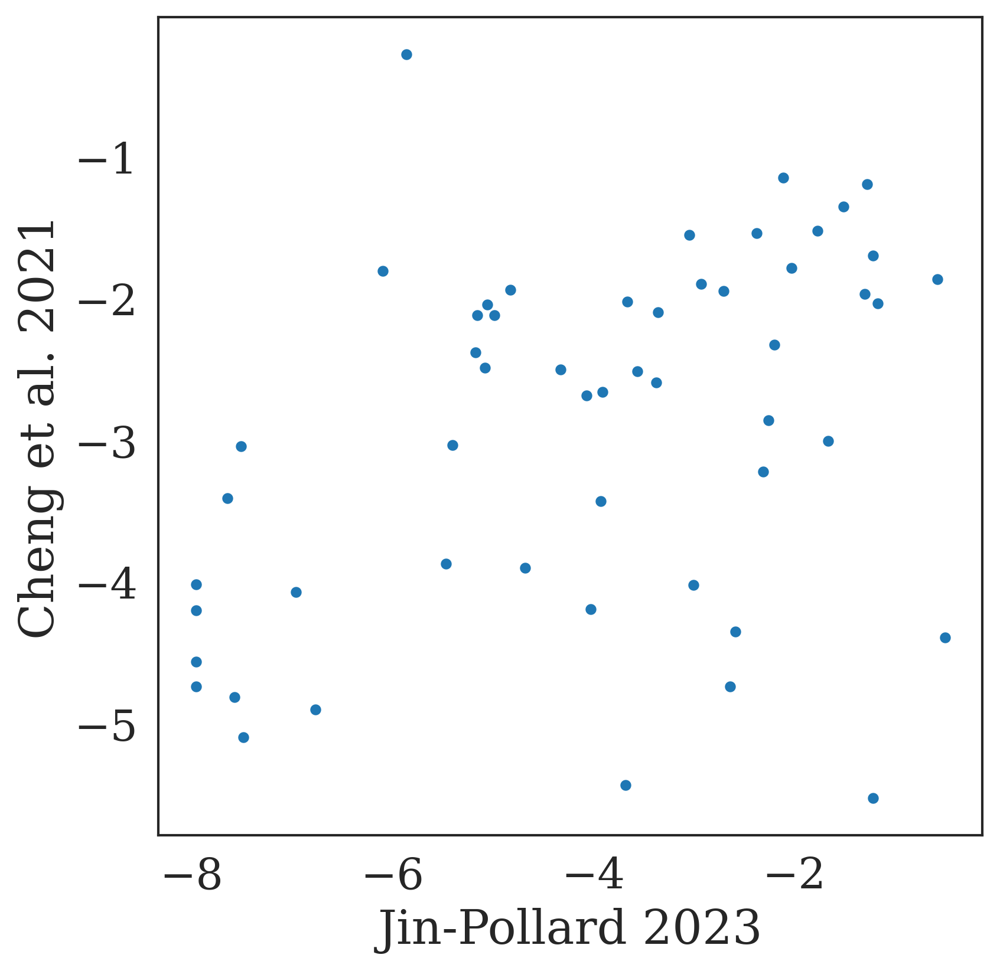

In [394]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)

x = abun_avg_filter.copy()
y = df_abun_cheng_filter_final.iloc[:, 2].values

x = np.log10(10**x / np.sum(10**x))
y = np.log10(10**y / np.sum(10**y))

id_ = np.where(y == np.max(y))[0]

id_keep = np.arange(len(y))
# id_keep = np.delete(id_keep, id_)
plt_ = sns.scatterplot(x=x[id_keep], y=y[id_keep])
plt_.set_xlabel('Jin-Pollard 2023')
plt_.set_ylabel('Cheng et al. 2021')
print(scipy.stats.pearsonr(x, y))
print(scipy.stats.spearmanr(x[id_keep], y[id_keep]))

# test wang et al. 2023

In [395]:
# get strain abundances from cheng et al. 2022
filepath_ = os.path.abspath(os.path.join('..', 'data', 'fischbach', \
                                    'wang_et_al_2023', \
                                    'relative_abundance_avg_cecum.csv'))
df_abun_wang = pd.read_csv(filepath_, index_col=None, header=0)

In [396]:
df_abun_wang_filter = df_abun_wang.copy()
df_abun_wang_filter = df_abun_wang_filter.dropna(subset=['name_ours'])
df_abun_wang_filter.index = df_abun_wang_filter.iloc[:, 2].values

In [405]:
df_abun_wang_filter

,name_paper,phyla,name_ours,mean_inoc,mean_cecum
Acidaminococcus-fermentans-DSM-20731,Acidaminococcus fermentans DSM 20731,Firmicutes,Acidaminococcus-fermentans-DSM-20731,0.076736,0.011384
Acidaminococcus-intestini-D21,Acidaminococcus sp. D21,Firmicutes,Acidaminococcus-intestini-D21,0.086448,0.263960
Anaerostipes-caccae-DSM-14662,Anaerostipes caccae DSM 14662,Firmicutes,Anaerostipes-caccae-DSM-14662,0.444987,1.059102
Anaerotruncus-colihominis-DSM-17241,Anaerotruncus colihominis DSM 17241,Firmicutes,Anaerotruncus-colihominis-DSM-17241,0.415527,0.177287
Bacteroides-caccae-ATCC-43185,Bacteroides caccae ATCC 43185,Bacteroidetes,Bacteroides-caccae-ATCC-43185,3.131750,1.599102
Bacteroides-cellulosilyticus-DSM-14838,Bacteroides cellulosilyticus DSM 14838,Bacteroidetes,Bacteroides-cellulosilyticus-DSM-14838,7.937540,22.408169
Bacteroides-coprophilus-DSM-18228,Bacteroides coprophilus DSM 18228,Bacteroidetes,Bacteroides-coprophilus-DSM-18228,1.020325,0.000396
Bacteroides-dorei-5-1-36-D4,Bacteroides dorei 5_1_36/D4,Bacteroidetes,Bacteroides-dorei-5-1-36-D4,1.728487,4.310943
Bacteroides-dorei-DSM-17855,Bacteroides dorei DSM 17855,Bacteroidetes,Bacteroides-dorei-DSM-17855,1.950264,0.069959
Bacteroides-eggerthii-DSM-20697,Bacteroides eggerthii DSM 20697,Bacteroidetes,Bacteroides-eggerthii-DSM-20697,1.169310,1.334801


In [398]:
valid_indices = [i for i in species_names if i in df_abun_wang_filter.index]
df_abun_wang_filter_final = df_abun_wang_filter.loc[valid_indices, :].copy()

In [399]:
abun_avg_filter = np.log10(np.exp(abun_avg_pass_3.copy()))
id_select = []
for i in range(len(valid_indices)):
    id_ = np.where(species_names == valid_indices[i])[0]
    if len(id_) > 0:
        id_select.append(id_[0])
        
abun_avg_filter = abun_avg_filter[id_select]

In [400]:
abun_avg_filter

array([-4.10676333, -0.53869057, -1.54806592, -7.54880744, -4.86880852,
       -6.13935684, -7.17057503, -2.74276818, -0.61582724, -5.09953989,
       -5.19600309, -2.34891477, -3.39804281, -1.81078122, -7.00526453,
       -1.34082921, -2.41489225, -2.06588858, -3.4141385 , -3.70405661,
       -3.08531911, -1.25631574, -1.20784721, -1.25376117, -4.06889646,
       -2.23881274, -8.        , -7.61292977, -4.37004282, -8.        ,
       -2.96950009, -2.14749023, -2.62460954, -5.5092991 , -7.52641507,
       -3.72274977, -6.81021201, -3.60179225, -3.95229688, -8.        ,
       -3.96701024, -3.04647494, -5.44183358, -8.        , -5.02572398,
       -5.90601625, -1.31286699, -5.12134292, -5.21278748, -2.91755531,
       -1.70253762, -8.        , -2.2942983 , -4.72059421, -2.67664655,
       -7.68744903])

PearsonRResult(statistic=0.31340971374286947, pvalue=0.01867065287413113)
PearsonRResult(statistic=0.31340971374286947, pvalue=0.01867065287413113)


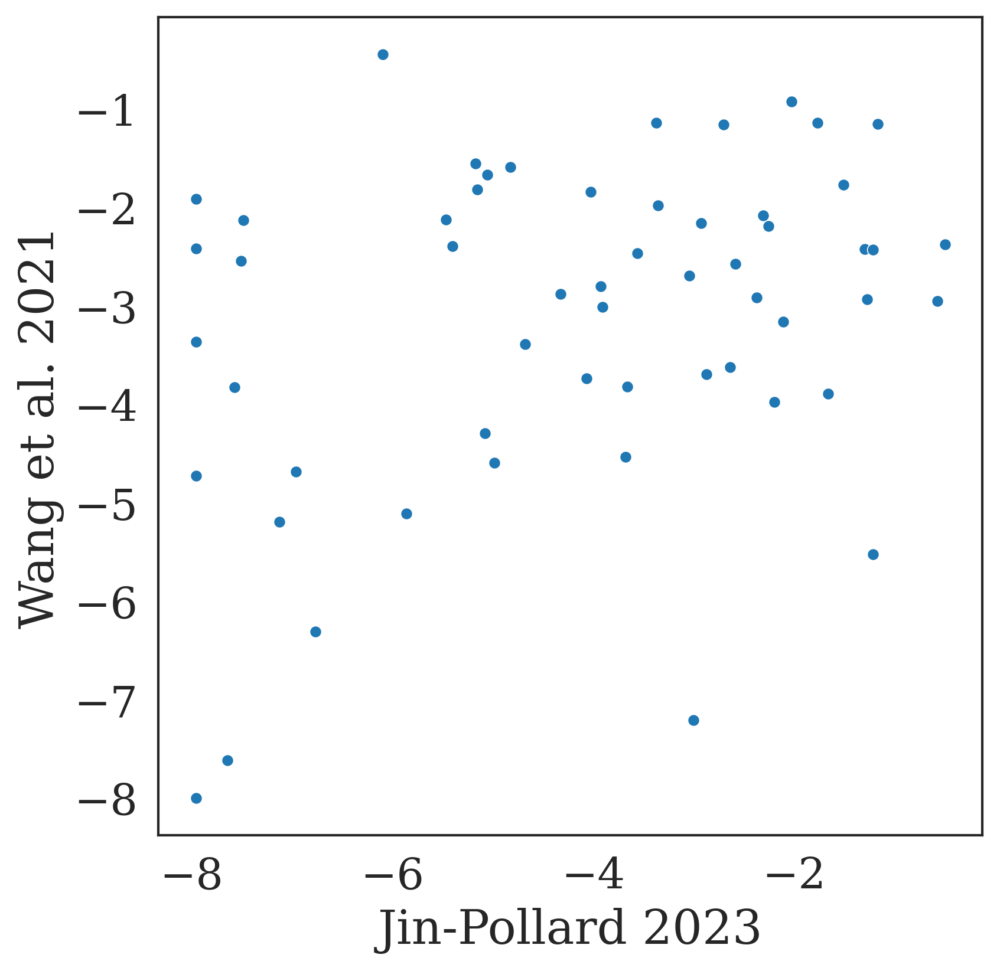

In [404]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)

x = abun_avg_filter.copy()
y = df_abun_wang_filter_final.iloc[:, 4].values
y = y / np.sum(y)
y[y <= 1e-8] = 1e-8
y = np.log10(y)

x = np.log10(10**x / np.sum(10**x))
y = np.log10(10**y / np.sum(10**y))

id_ = np.where(y == np.max(y))[0]

id_keep = np.arange(len(y))
# id_keep = np.delete(id_keep, id_)
plt_ = sns.scatterplot(x=x[id_keep], y=y[id_keep])
plt_.set_xlabel('Jin-Pollard 2023')
plt_.set_ylabel('Wang et al. 2021')
print(scipy.stats.pearsonr(x, y))
print(scipy.stats.pearsonr(x[id_keep], y[id_keep]))

In [403]:
y

array([-3.73229057, -2.36704148, -1.76364248, -2.5399034 , -1.58470402,
       -0.43817392, -5.19097197, -1.15400796, -2.94373587, -1.66316363,
       -1.81070694, -2.07477961, -1.9709808 , -1.13234075, -4.68072844,
       -2.41867374, -2.90922709, -0.917284  , -1.1323086 , -3.81520185,
       -2.68937404, -2.42107587, -1.14388766, -5.51938945, -1.83649206,
       -3.97302586, -1.90457258, -3.82298327, -2.87471269, -3.36012866,
       -2.15060655, -3.15573832, -2.56575174, -2.11601237, -2.12429835,
       -4.52876941, -6.30671966, -2.45656444, -3.00525196,        -inf,
       -2.79795899, -7.20710168, -2.38632845, -4.72269012, -4.59049946,
       -5.10567008, -2.9279698 , -4.28829471, -1.54957324, -3.68965359,
       -3.88789656, -2.40966897, -2.18151601, -3.38318473, -3.61711465,
       -7.61617484])

In [356]:
y = df_abun_wang_filter_final.iloc[:, 4].values
y / np.sum(y)

array([1.85229192e-04, 4.29495405e-03, 1.72328664e-02, 2.88467309e-03,
       2.60193224e-02, 3.64607906e-01, 6.44210837e-06, 7.01442448e-02,
       1.13831938e-03, 2.17188272e-02, 1.54629753e-02, 8.41822234e-03,
       1.06910214e-02, 7.37325491e-02, 2.08579472e-05, 3.81352200e-03,
       1.23246020e-03, 1.20980675e-01, 7.37380073e-02, 1.53037600e-04,
       2.04468287e-03, 3.79248730e-03, 7.17979996e-02, 3.02420026e-06,
       1.45716236e-02, 1.06407966e-04, 1.24574002e-02, 1.50319987e-04,
       1.33440393e-03, 4.36386533e-04, 7.06957740e-03, 6.98653241e-04,
       2.71799255e-03, 7.65574799e-03, 7.51106716e-03, 2.95958346e-05,
       4.93492249e-07, 3.49490645e-03, 9.87979748e-04, 0.00000000e+00,
       1.59235908e-03, 6.20723685e-08, 4.10838891e-03, 1.89369436e-05,
       2.56744141e-05, 7.84025018e-06, 1.18040271e-03, 5.14879134e-05,
       2.82115380e-02, 2.04336718e-04, 1.29450413e-04, 3.89341794e-03,
       6.58391164e-03, 4.13823610e-04, 2.41482328e-04, 2.42005457e-08])

In [283]:
species_names

array([['Acidaminococcus-fermentans-DSM-20731'],
       ['Acidaminococcus-intestini-D21'],
       ['Anaerostipes-caccae-DSM-14662'],
       ['Anaerotruncus-colihominis-DSM-17241'],
       ['Bacteroides-caccae-ATCC-43185'],
       ['Bacteroides-cellulosilyticus-DSM-14838'],
       ['Bacteroides-coprophilus-DSM-18228'],
       ['Bacteroides-dorei-5-1-36-D4'],
       ['Bacteroides-dorei-DSM-17855'],
       ['Bacteroides-eggerthii-DSM-20697'],
       ['Bacteroides-finegoldii-DSM-17565'],
       ['Bacteroides-fragilis-3-1-12'],
       ['Bacteroides-intestinalis-DSM-17393'],
       ['Bacteroides-ovatus-ATCC-8483'],
       ['Bacteroides-plebeius-DSM-17135'],
       ['Bacteroides-thetaiotaomicron-1-1-6'],
       ['Bacteroides-fragilis-2-1-16'],
       ['Bacteroides-sp-2-1-22'],
       ['Bacteroides-sp-3-1-19'],
       ['Bacteroides-sp-9-1-42FAA'],
       ['Bacteroides-sp-D2'],
       ['Bacteroides-stercoris-ATCC-43183'],
       ['Bacteroides-thetaiotaomicron-VPI-5482'],
       ['Bacteroides-un

# experiment 3: perturb metabolites

In [61]:
def predict_abun_wrapper(df_speciesMetab_cluster, df_speciesMetab_prod_cluster, Ri_new, \
                         B_alone_iter, df_speciesAbun_inoc, df_speciesAbun_mdl, \
                         df_speciesAbun_prev_mdl, \
                         df_speciesAbun_ratio_mdl):
    pass_ = 2
    num_species = df_speciesMetab_cluster.shape[0]
    p_vec_new_tmp = [0.1]
    count_p = 0
    num_metabs_clust = df_speciesMetab_cluster.shape[1]
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
    num_iter = 100
    num_metabs = df_speciesMetab_cluster.shape[1]
#     solution = solution_list[0].copy()
    Ri_fit = {0: Ri_new}
#     abun_alone = get_B_alone(Ri_avg, df_speciesMetab_cluster.copy())
    # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
    sens_obj_tmp, RMSE_obj_tmp = \
        blindly_pred_abun_growth([p_vec_new_tmp[count_p]], df_speciesMetab_tmp, \
                                 df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                 df_speciesAbun_prev_mdl, \
                                 df_speciesAbun_ratio_mdl, \
                                 Ri_fit, "dummy", "dummy", \
                                 "dummy", num_passages=6, num_iter=100, \
                                 thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                 save_data_obj=False, \
                                 return_sensitivity_ana=True, \
                                 get_prod=True, B_alone=B_alone_iter[num_iter - 2], \
                                 df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                 prod_use_prev=False, num_passages_run=3)
    
    pred_dist_all = sens_obj_tmp[pass_]['df_speciesAbun_next_pred'].copy()
    pred_dist_all[pred_dist_all <= 1e-8] = 1e-8
    abun_tmp = np.zeros((num_species))
    for species_ in range(num_species):
        id_ = np.array([0, 1, 2]) + species_ * 3
        abun_tmp[species_] = np.exp(np.mean(np.log(pred_dist_all[id_])))
    return abun_tmp

In [62]:
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-12] = 1e-12
id_nnz = np.where(Ri_avg >= 1e-8)[0]
num_metabs = df_speciesMetab_cluster.shape[1]
abundance_change_pos = np.zeros((num_metabs, num_species))
abundance_change_neg = np.zeros((num_metabs, num_species))
change_fac = 100
for count_, id_ in enumerate(np.arange(num_metabs)):
    print(f'loop = {count_}')
    Ri_new = Ri_avg.copy()
    Ri_new[id_] = change_fac * Ri_avg.copy()[id_]
#     Ri_new[id_] = 0.2
    abundance_change_pos[count_, :] = \
        predict_abun_wrapper(df_speciesMetab_cluster, df_speciesMetab_prod_cluster, Ri_new, \
                             B_alone_iter, df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, \
                             df_speciesAbun_ratio_mdl)
    
#     Ri_new[id_] = (1 / change_fac) * Ri_avg[id_]
#     abundance_change_neg[count_, :] = \
#         predict_abun_wrapper(df_speciesMetab_cluster, df_speciesMetab_prod_cluster, Ri_new, \
#                              B_alone_iter, df_speciesAbun_inoc, df_speciesAbun_mdl, \
#                              df_speciesAbun_prev_mdl, \
#                              df_speciesAbun_ratio_mdl)
    

loop = 0
loop = 1
loop = 2
loop = 3
loop = 4
loop = 5
loop = 6
loop = 7
loop = 8
loop = 9
loop = 10
loop = 11
loop = 12
loop = 13
loop = 14
loop = 15
loop = 16
loop = 17
loop = 18
loop = 19
loop = 20
loop = 21
loop = 22
loop = 23
loop = 24
loop = 25
loop = 26
loop = 27
loop = 28
loop = 29
loop = 30
loop = 31
loop = 32
loop = 33
loop = 34
loop = 35
loop = 36
loop = 37
loop = 38
loop = 39
loop = 40
loop = 41
loop = 42
loop = 43
loop = 44
loop = 45
loop = 46
loop = 47
loop = 48
loop = 49
loop = 50
loop = 51
loop = 52
loop = 53
loop = 54
loop = 55
loop = 56
loop = 57
loop = 58
loop = 59
loop = 60
loop = 61
loop = 62
loop = 63
loop = 64
loop = 65
loop = 66
loop = 67
loop = 68
loop = 69
loop = 70
loop = 71
loop = 72
loop = 73
loop = 74
loop = 75
loop = 76
loop = 77
loop = 78
loop = 79
loop = 80
loop = 81
loop = 82
loop = 83
loop = 84
loop = 85
loop = 86
loop = 87
loop = 88
loop = 89
loop = 90
loop = 91
loop = 92
loop = 93
loop = 94
loop = 95
loop = 96
loop = 97


In [63]:
# passage 3 abundance for the unperturbed metabs
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)

In [64]:
id_rep_keep = np.arange(len(species_names)) * 3
x = sens_obj_all_prod[2]['df_speciesAbun_next_pred'].copy()
x[x <= 1e-8] = 1e-8
x_mean = x[id_rep_keep]
abun_pred = x_mean.copy()

In [65]:
np.sum(abundance_change_pos[count_, :])

1.0000001143600297

In [66]:
df_tmp = pd.DataFrame()
for count_, id_ in enumerate(np.arange(num_metabs)):
#     df_tmp[f'metabCluster_{id_ + 1}'] = (np.log10(abundance_change_pos[count_, :].copy()) - \
#         np.log10(abundance_change_neg[count_, :].copy()))
#     df_tmp[f'{id_ + 1}'] = (np.log10(abundance_change_pos[count_, :].copy()) - \
#         0 * np.log10(abundance_change_neg[count_, :].copy()))
#     print(f'sum = {np.sum(abundance_change_pos[count_, :])}')
    df_tmp[f'{id_ + 1}'] = (np.log10(abundance_change_pos[count_, :].copy()) - \
        np.log10(abun_pred))
# df_tmp.index = df_metabs_clusters['cluser_metab_names'].values[id_metabs_keep]
df_tmp.index = species_names
thresh_ = 1
df_tmp[(df_tmp <= thresh_) & (df_tmp >= -thresh_)] = 0
id_ = np.where(np.sum(np.abs(np.array(df_tmp)), axis=1) == 0)[0]
print(id_)
df_metab_pert = df_tmp.copy()
df_metab_pert.shape


[6]


(63, 98)

In [67]:
print(len(np.where(np.array(df_metab_pert) != 0)[0]))
x = np.array(df_metab_pert)
np.min(np.abs(x[x != 0]))

977


1.0000324450103744

PearsonRResult(statistic=-0.0844915401190723, pvalue=0.20370868660586916)


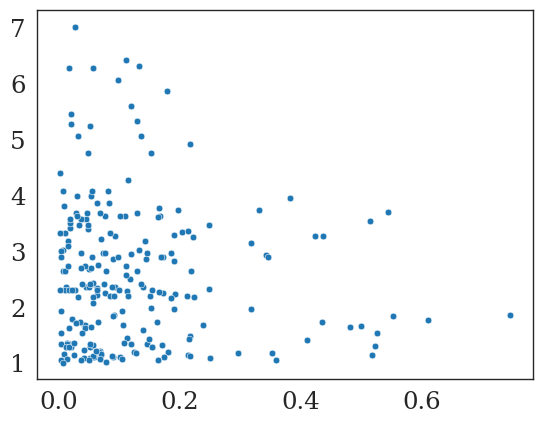

In [68]:
df_metab_pert_pos = df_metab_pert.copy()
df_metab_pert_pos[df_metab_pert_pos <= 0] = 0

df_metab_pert_neg = df_metab_pert.copy()
df_metab_pert_neg[df_metab_pert_neg >= 0] = 0
x = np.array(df_speciesMetab_cluster).flatten()
y = np.array(np.abs(df_metab_pert_neg)).flatten()
id_ = np.where((x > 0) & (y > 0))[0]
# id_ = np.arange(len(x))
plt_ = sns.scatterplot(x=x[id_], y=y[id_])
print(scipy.stats.pearsonr(x[id_], y[id_]))

In [141]:
np.max(np.abs(np.array(df_tmp)))

7.384172763125538

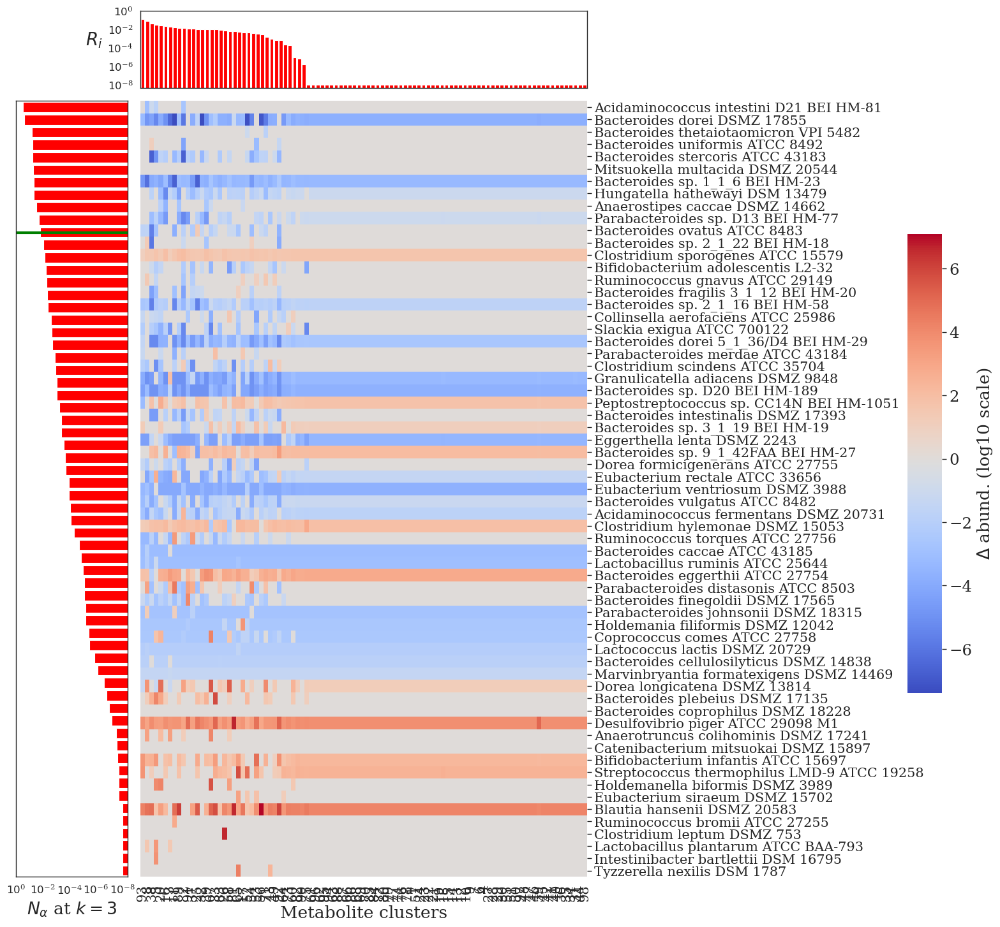

In [218]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
date_ = '20230912'
date_meeting = '20230912'
date_ = '20231015'
date_meeting = '20231015'
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
pass_ = 2
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
id_species_order = np.argsort(-abun_pred)
species_names_order = species_names[id_species_order]
sorted_tensor_order = (abun_pred[id_species_order])
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-8] = 1e-8
# Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)
df_tmp = df_metab_pert.copy()
df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[:, id_metabs_order]
# f, axs = plt.subplots(1, 3, figsize=(18, 18), \
#                       sharey=False, gridspec_kw=dict(width_ratios=[3,1.5,5]))
plt_ = sns.clustermap(df_tmp, \
                      cmap="coolwarm", figsize=(18, 18), \
                      metric="euclidean", xticklabels=True, yticklabels=True, \
                      row_cluster=False, col_cluster=False, \
                      cbar_kws={'shrink': 0.1, 'label': r'$\Delta$ abund. (log10 scale)'}, \
                      cbar_pos=(0.92, .2, .03, .4))
plt_.ax_col_dendrogram.set_visible(False)
plt_.ax_row_dendrogram.set_visible(False)
plt_.ax_heatmap.set_xlabel('Metabolite clusters')
# plt_.fig.subplots_adjust(right=0.7)
# plt_.ax_cbar.set_position((0.1, .2, .03, .4))
plt.setp(plt_.ax_heatmap.get_xticklabels(), rotation=90, fontsize=15)
plt.setp(plt_.ax_heatmap.get_yticklabels(), rotation=0, fontsize=15)
# sns.move_legend(plt_.ax_heatmap, "center right")

# Create a subplot for tensor_order on the left
divider = make_axes_locatable(plt_.ax_heatmap)
ax2 = divider.append_axes('left', size='25%', pad=0.2)
ax2.set_ylim(0, 62)

# Plot tensor_order on the left
y_ticks = np.arange(len(sorted_tensor_order))
y_tick_pos = [i + 0.5 for i in y_ticks]
# ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
ax2.barh(y_tick_pos, sorted_tensor_order, color='red')
ax2.set_xlabel(fr"$N_{{\alpha}}$ at $k=3$")
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

xticks_ = [-8, -6, -4, -2, 0]
xlabs_ = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")

ax2.invert_yaxis()
id_mid = np.where((sorted_tensor_order <= 1 / num_species))[0][0]
ax2.axhline(y=y_tick_pos[id_mid], c="green", linewidth=3)
ax2.set_xscale('log', base=10)
ax2.set_xticks(np.power(10, np.array(xticks_, dtype='float')))
ax2.set_xticklabels(xlabs_, fontsize=12, rotation=0)
ax2.invert_xaxis()
ax2.set_yticklabels([])
# Hide y-axis labels for the clustermap
# plt_.ax_heatmap.set_yticklabels([])

ax3 = divider.append_axes('top', size='10%', pad=0.2)
ax3.set_xlim(0, len(id_nnz) - 1)

# Plot tensor_order on the left
x_ticks = np.arange(len(id_metabs_order))
x_tick_pos = [i + 0.5 for i in x_ticks]
# ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
ax3.bar(x_tick_pos, Ri_avg[id_metabs_order], color='red')
ax3.set_ylabel(fr"$R_i$", fontsize=20, rotation=0, labelpad=15)
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

yticks_ = [-8, -6, -4, -2, 0]
ylabs_ = []
for y_ in yticks_:
    ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")

# ax2.invert_yaxis()
ax3.set_yscale('log', base=10)
ax3.set_yticks(np.power(10, np.array(yticks_, dtype='float')))
ax3.set_yticklabels(ylabs_, fontsize=12, rotation=0)
ax3.set_xticklabels([])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'pert_metabs_abun_heatmap_new_2.pdf'))

# plt_.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# # file_save = os.path.abspath(os.path.join(save_dir, 
# #                                             f'predicted_vs_observed_abundance.pdf'))

# # fig.figure.savefig(file_save, \
# #                     dpi=300, transparent=False, facecolor="white")
# plt.close()

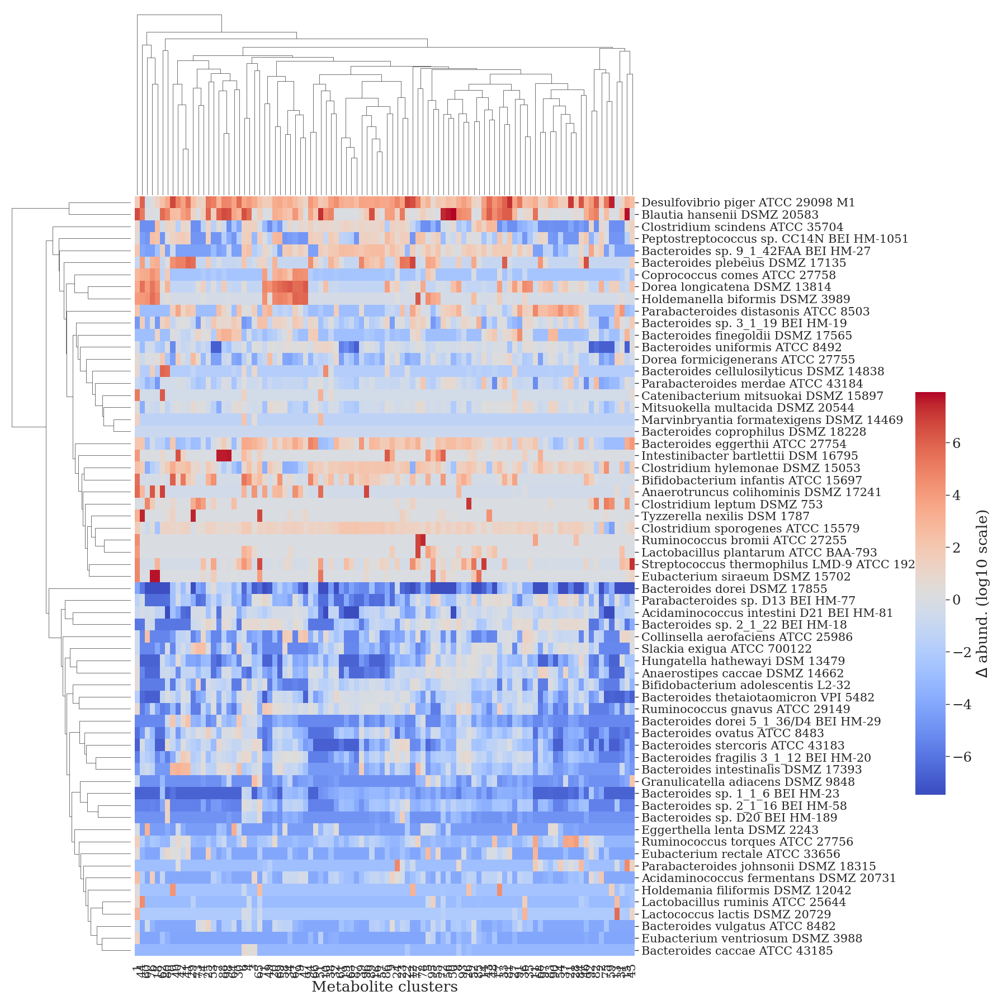

In [197]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
date_ = '20230912'
date_meeting = '20230912'
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
pass_ = 2
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
id_species_order = np.argsort(-abun_avg_pass_3)
species_names_order = species_names[id_species_order]
sorted_tensor_order = 10**(abun_avg_pass_3[id_species_order])
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-8] = 1e-8
# Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)
df_tmp = df_metab_pert.copy()
df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[:, id_metabs_order]
# f, axs = plt.subplots(1, 3, figsize=(18, 18), \
#                       sharey=False, gridspec_kw=dict(width_ratios=[3,1.5,5]))
plt_ = sns.clustermap(df_tmp, \
                      cmap="coolwarm", figsize=(18, 18), \
                      metric="euclidean", xticklabels=True, yticklabels=True, \
                      row_cluster=True, col_cluster=True, \
                      cbar_kws={'shrink': 0.1, 'label': r'$\Delta$ abund. (log10 scale)'}, \
                      cbar_pos=(0.92, .2, .03, .4))
# plt_.ax_col_dendrogram.set_visible(False)
# plt_.ax_row_dendrogram.set_visible(False)
plt_.ax_heatmap.set_xlabel('Metabolite clusters')
# plt_.fig.subplots_adjust(right=0.7)
# plt_.ax_cbar.set_position((0.1, .2, .03, .4))
plt.setp(plt_.ax_heatmap.get_xticklabels(), rotation=90, fontsize=15)
plt.setp(plt_.ax_heatmap.get_yticklabels(), rotation=0, fontsize=15)
# sns.move_legend(plt_.ax_heatmap, "center right")

# Create a subplot for tensor_order on the left
# divider = make_axes_locatable(plt_.ax_heatmap)
# ax2 = divider.append_axes('left', size='25%', pad=0.2)
# ax2.set_ylim(0, 62)

# # Plot tensor_order on the left
# y_ticks = np.arange(len(sorted_tensor_order))
# y_tick_pos = [i + 0.5 for i in y_ticks]
# # ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
# ax2.barh(y_tick_pos, sorted_tensor_order, color='red')
# ax2.set_xlabel(fr"$N_{{\alpha}}$ at $k=3$")
# # ax2.legend(loc='none')
# # ax2.set_ylabel('abundance at passage 3', fontsize=35)

# xticks_ = [-8, -6, -4, -2, 0]
# xlabs_ = []
# for x_ in xticks_:
#     xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")

# ax2.invert_yaxis()
# id_mid = np.where((sorted_tensor_order <= 1 / num_species))[0][0]
# ax2.axhline(y=y_tick_pos[id_mid], c="green", linewidth=3)
# ax2.set_xscale('log', base=10)
# ax2.set_xticks(np.power(10, np.array(xticks_, dtype='float')))
# ax2.set_xticklabels(xlabs_, fontsize=12, rotation=0)
# ax2.invert_xaxis()
# ax2.set_yticklabels([])
# # Hide y-axis labels for the clustermap
# # plt_.ax_heatmap.set_yticklabels([])

# ax3 = divider.append_axes('top', size='10%', pad=0.2)
# ax3.set_xlim(0, len(id_nnz) - 1)

# # Plot tensor_order on the left
# x_ticks = np.arange(len(id_metabs_order))
# x_tick_pos = [i + 0.5 for i in x_ticks]
# # ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
# ax3.bar(x_tick_pos, Ri_avg[id_metabs_order], color='red')
# ax3.set_ylabel(fr"$R_i$", fontsize=20, rotation=0, labelpad=15)
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

yticks_ = [-8, -6, -4, -2, 0]
ylabs_ = []
for y_ in yticks_:
    ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")

# ax2.invert_yaxis()
ax3.set_yscale('log', base=10)
ax3.set_yticks(np.power(10, np.array(yticks_, dtype='float')))
ax3.set_yticklabels(ylabs_, fontsize=12, rotation=0)
ax3.set_xticklabels([])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'pert_metabs_abun_heatmap_new_2.pdf'))

# plt_.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# # file_save = os.path.abspath(os.path.join(save_dir, 
# #                                             f'predicted_vs_observed_abundance.pdf'))

# # fig.figure.savefig(file_save, \
# #                     dpi=300, transparent=False, facecolor="white")
# plt.close()

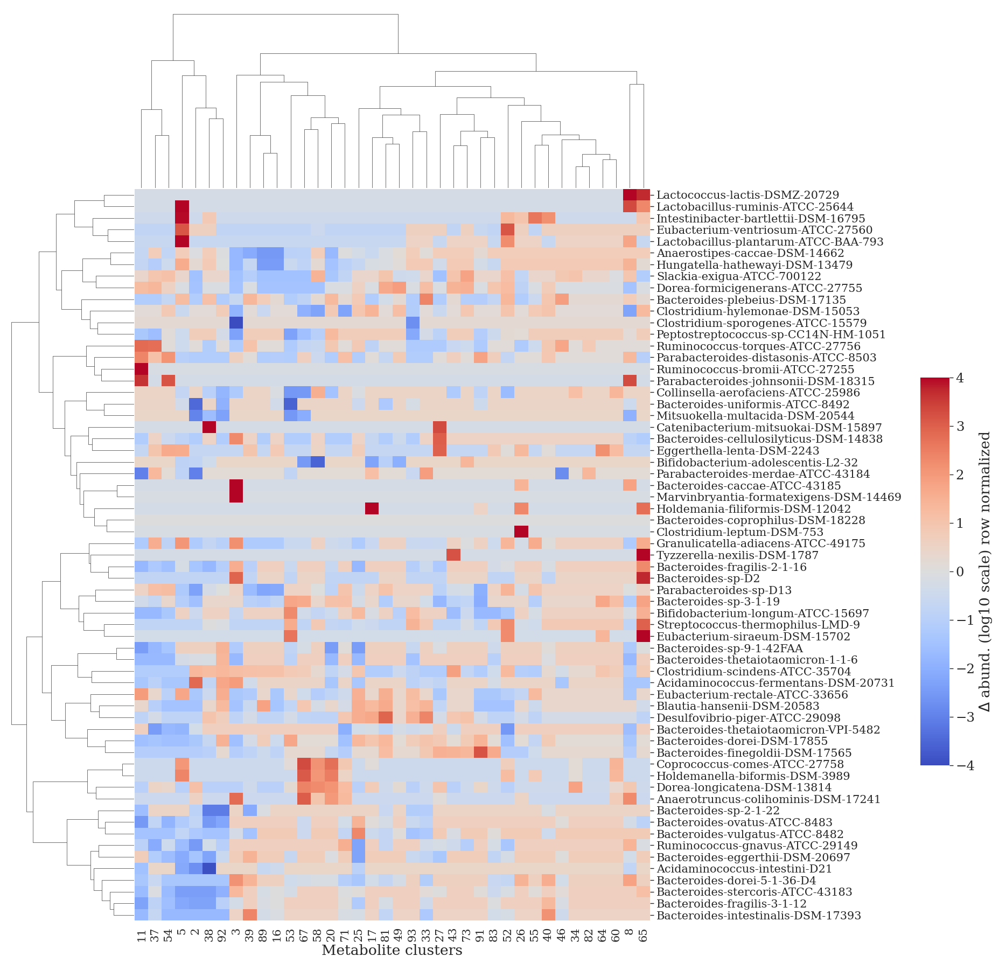

In [69]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
date_ = '20230912'
date_meeting = '20230912'
date_ = '20231015'
date_meeting = '20231015'
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
pass_ = 2
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
id_species_order = np.argsort(-abun_pred)
species_names_order = species_names[id_species_order]
sorted_tensor_order = (abun_pred[id_species_order])
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-12] = 1e-12
id_nnz = np.where(Ri_avg >= 1e-8)[0]
Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)
df_tmp = df_metab_pert.copy()
df_tmp = df_tmp.iloc[:, id_nnz]
df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[:, id_metabs_order]
# df_tmp[df_tmp > 0] = 1
# df_tmp[df_tmp < 0] = -1
# f, axs = plt.subplots(1, 3, figsize=(18, 18), \
#                       sharey=False, gridspec_kw=dict(width_ratios=[3,1.5,5]))
thresh_ = 4
# df_tmp[df_tmp >= thresh_] = thresh_
# df_tmp[df_tmp <= -thresh_] = -thresh_
min_value = 0
max_value = 1
df = df_tmp.copy()
df = df.transpose()
df_normalized = (df - df.mean()) / df.std()
df_normalized = df_normalized.transpose()
df_normalized = df_normalized.fillna(0)
df_normalized[df_normalized >= thresh_] = thresh_
df_normalized[df_normalized <= -thresh_] = -thresh_
plt_ = sns.clustermap(df_normalized, \
                      cmap="coolwarm", figsize=(18, 18), \
                      metric="euclidean", xticklabels=True, yticklabels=True, \
                      row_cluster=True, col_cluster=True, \
                      cbar_kws={'shrink': 0.1, 'label': r'$\Delta$ abund. (log10 scale) row normalized'}, \
                      cbar_pos=(0.96, .2, .03, .4), method='ward', z_score=None)
# plt_.ax_col_dendrogram.set_visible(False)
# plt_.ax_row_dendrogram.set_visible(False)
plt_.ax_heatmap.set_xlabel('Metabolite clusters')
# plt_.fig.subplots_adjust(right=0.7)
# plt_.ax_cbar.set_position((0.1, .2, .03, .4))
plt.setp(plt_.ax_heatmap.get_xticklabels(), rotation=90, fontsize=15)
plt.setp(plt_.ax_heatmap.get_yticklabels(), rotation=0, fontsize=15)
# sns.move_legend(plt_.ax_heatmap, "center right")

# Create a subplot for tensor_order on the left
# divider = make_axes_locatable(plt_.ax_heatmap)
# ax2 = divider.append_axes('left', size='25%', pad=0.2)
# ax2.set_ylim(0, 62)

# # Plot tensor_order on the left
# y_ticks = np.arange(len(sorted_tensor_order))
# y_tick_pos = [i + 0.5 for i in y_ticks]
# # ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
# ax2.barh(y_tick_pos, sorted_tensor_order, color='red')
# ax2.set_xlabel(fr"$N_{{\alpha}}$ at $k=3$")
# # ax2.legend(loc='none')
# # ax2.set_ylabel('abundance at passage 3', fontsize=35)

# xticks_ = [-8, -6, -4, -2, 0]
# xlabs_ = []
# for x_ in xticks_:
#     xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")

# ax2.invert_yaxis()
# id_mid = np.where((sorted_tensor_order <= 1 / num_species))[0][0]
# ax2.axhline(y=y_tick_pos[id_mid], c="green", linewidth=3)
# ax2.set_xscale('log', base=10)
# ax2.set_xticks(np.power(10, np.array(xticks_, dtype='float')))
# ax2.set_xticklabels(xlabs_, fontsize=12, rotation=0)
# ax2.invert_xaxis()
# ax2.set_yticklabels([])
# # Hide y-axis labels for the clustermap
# # plt_.ax_heatmap.set_yticklabels([])

# ax3 = divider.append_axes('top', size='10%', pad=0.2)
# ax3.set_xlim(0, len(id_nnz) - 1)

# # Plot tensor_order on the left
# x_ticks = np.arange(len(id_metabs_order))
# x_tick_pos = [i + 0.5 for i in x_ticks]
# # ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
# ax3.bar(x_tick_pos, Ri_avg[id_metabs_order], color='red')
# ax3.set_ylabel(fr"$R_i$", fontsize=20, rotation=0, labelpad=15)
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

# yticks_ = [-8, -6, -4, -2, 0]
# ylabs_ = []
# for y_ in yticks_:
#     ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")

# # ax2.invert_yaxis()
# ax3.set_yscale('log', base=10)
# ax3.set_yticks(np.power(10, np.array(yticks_, dtype='float')))
# ax3.set_yticklabels(ylabs_, fontsize=12, rotation=0)
# ax3.set_xticklabels([])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'pert_metabs_abun_heatmap_cluster_rows_cols_' + \
                                            f'greaterthanOneOrderMag.pdf'))
file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'pert_metabs_abun_heatmap_cluster_rows_cols_' + \
                                            f'all_ward_rowNorm.svg'))

# plt_.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close()

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'pert_metabs_abun_values.txt'))
# df_tmp.to_csv(file_save, sep='\t')
# df_tmp.to_markdown(file_save, index=True, \
#                    tablefmt='pipe', colalign=['center']*len(df_tmp.columns))

# plot metab and strain degrees

In [70]:
id_pos = np.where(np.array(df_tmp) > 0)[0]
print(len(id_pos))
id_neg = np.where(np.array(df_tmp) < 0)[0]
print(len(id_neg))
x = np.array(df_tmp.copy())
x[x <= 0] = 0
print(np.min(np.array(x[x != 0])))

284
692
1.012373289331471


In [100]:
x

,93,8,38,3,5,89,20,11,16,25,...,71,43,49,92,40,73,34,64,82,60
Clostridium-sporogenes-ATCC-15579,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
Acidaminococcus-intestini-D21,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
Bacteroides-uniformis-ATCC-8492,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
Mitsuokella-multacida-DSM-20544,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
Bacteroides-thetaiotaomicron-VPI-5482,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Holdemania-filiformis-DSM-12042,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000
Eubacterium-siraeum-DSM-15702,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,1.300818,0.0,0.000000
Eggerthella-lenta-DSM-2243,0.0,0.0,0.000000,0.0,4.19332,0.0,0.0,0.0,2.769146,2.546362,...,0.0,0.000000,0.0,0.0,1.466378,0.0,0.0,5.292733,0.0,3.534454
Catenibacterium-mitsuokai-DSM-15897,0.0,0.0,2.387346,0.0,0.00000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000


# strains responding to changes = 62
corr upregulated = PearsonRResult(statistic=0.27646090186288075, pvalue=0.029619564621915728)
corr upregulated = PearsonRResult(statistic=-0.16603067528087934, pvalue=0.2257175683362829)
corr downregulated = PearsonRResult(statistic=-0.3840492897714246, pvalue=0.008414667653854716)


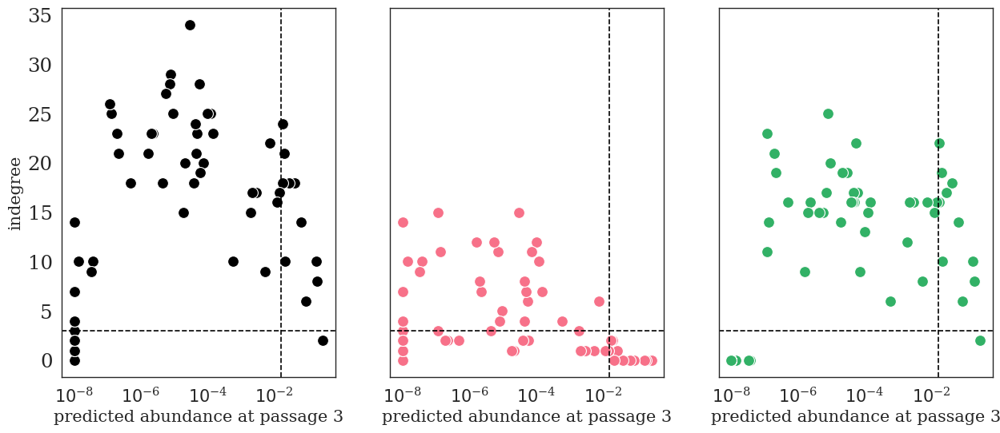

In [326]:
# Figure for paper: plot strains in degree, unweighted

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

id_species_order = np.argsort(-abun_pred)
species_names_order = species_names[id_species_order]
abun_pred_sorted = abun_pred[id_species_order].copy()
abun_pred_log = np.log(abun_pred_sorted.copy())

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey="row", sharex=None)
# in-degree
num_strain_tmp = df_tmp.shape[0]
num_metabs_tmp = df_tmp.shape[1]

id_species_order = np.argsort(-abun_pred)
species_names_order = species_names[id_species_order]
sorted_tensor_order = (abun_pred[id_species_order])
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-12] = 1e-12
id_nnz = np.where(Ri_avg >= 1e-8)[0]
Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)

df_tmp = df_metab_pert.copy()
df_tmp = df_tmp.iloc[:, id_nnz]
df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[:, id_metabs_order]

# total change 
num_strain_tmp, num_metabs_tmp = df_tmp.shape
count_nnz = np.zeros((num_strain_tmp, num_metabs_tmp))
adj_G = np.array(df_tmp.copy())
id_ = np.where((adj_G) != 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_ = np.sum(count_nnz, axis=1)

# up-regulation
count_nnz = np.zeros((num_strain_tmp, num_metabs_tmp))
adj_G = np.array(df_tmp.copy())
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_x = np.sum(count_nnz, axis=1)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_y = np.sum(count_nnz, axis=1)

# plot total change indegree
id_ = np.where(num_changes_ != 0)[0]
print(f'# strains responding to changes = {len(id_)}')

id_nnz_ = np.where((num_changes_ > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred_sorted[id_nnz_]), \
                                num_changes_[id_nnz_])
print(f'corr upregulated = {corr_tmp}')
id_nnz_ = np.arange(len(species_names))
# id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_])), \
                       y=num_changes_[id_nnz_], ax=axes[0], s=100, \
                       color='black')
axes[0].set_ylabel('indegree', fontsize=15)
axes[0].set_xlabel('predicted abundance at passage 3', fontsize=15)
axes[0].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
axes[0].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_[id_nnz_])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
axes[0].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

# plot up-regulated

id_nnz_x = np.where((num_changes_x > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred_sorted[id_nnz_x]), \
                                num_changes_x[id_nnz_x])
print(f'corr upregulated = {corr_tmp}')
id_nnz_x = np.arange(len(species_names))
# id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_x])), \
                       y=num_changes_x[id_nnz_x], ax=axes[1], s=100, \
                       color=cols_[0])
axes[1].set_ylabel('indegree', fontsize=15)
axes[1].set_xlabel('predicted abundance at passage 3', fontsize=15)
axes[1].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
axes[1].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_x[id_nnz_x])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
axes[1].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

    
# downregulated
id_nnz_y = np.where((num_changes_y > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred_sorted[id_nnz_y]), \
                                num_changes_y[id_nnz_y])
print(f'corr downregulated = {corr_tmp}')
id_nnz_y = np.arange(len(species_names))
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_y])), \
                       y=num_changes_y[id_nnz_y], ax=axes[2], s=100, \
                       color=cols_[3])
axes[2].set_ylabel('indegree', fontsize=15)
axes[2].set_xlabel('predicted abundance at passage 3', fontsize=15)
axes[2].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
axes[2].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_y[id_nnz_y])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 5
# axes[1].axhline(y=num_changes_y[id_nnz_y[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')

# labels = species_names[id_nnz_y[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_y[id_sort[range(size_)]]])
# y = (num_changes_y[id_nnz_y[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 2:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 4), ha='left', \
#                          fontsize=10)


axes[2].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[2].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'metabs_perturb_keystone_species.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# strains responding to changes = 62
corr upregulated = PearsonRResult(statistic=0.27646090186288075, pvalue=0.029619564621915728)
corr upregulated = PearsonRResult(statistic=-0.16603067528087934, pvalue=0.2257175683362829)
corr downregulated = PearsonRResult(statistic=-0.3840492897714246, pvalue=0.008414667653854716)


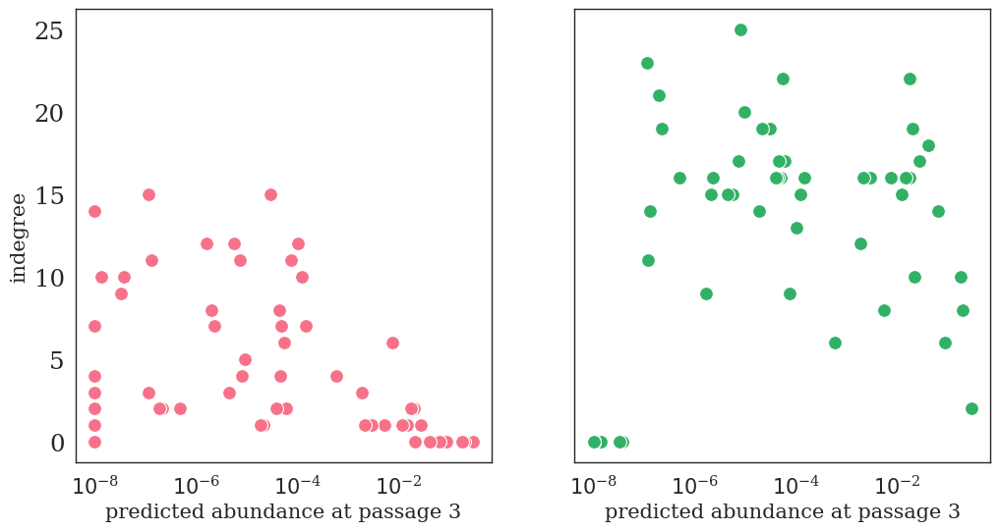

In [74]:
# Figure for paper: plot strains in degree, unweighted

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

id_species_order = np.argsort(-abun_pred)
species_names_order = species_names[id_species_order]
abun_pred_sorted = abun_pred[id_species_order].copy()
abun_pred_log = np.log(abun_pred_sorted.copy())

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey="row", sharex=None)
# in-degree
num_strain_tmp = df_tmp.shape[0]
num_metabs_tmp = df_tmp.shape[1]

id_species_order = np.argsort(-abun_pred)
species_names_order = species_names[id_species_order]
sorted_tensor_order = (abun_pred[id_species_order])
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-12] = 1e-12
id_nnz = np.where(Ri_avg >= 1e-8)[0]
Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)

df_tmp = df_metab_pert.copy()
df_tmp = df_tmp.iloc[:, id_nnz]
df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[:, id_metabs_order]

# total change 
num_strain_tmp, num_metabs_tmp = df_tmp.shape
count_nnz = np.zeros((num_strain_tmp, num_metabs_tmp))
adj_G = np.array(df_tmp.copy())
id_ = np.where((adj_G) != 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_ = np.sum(count_nnz, axis=1)

# up-regulation
count_nnz = np.zeros((num_strain_tmp, num_metabs_tmp))
adj_G = np.array(df_tmp.copy())
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_x = np.sum(count_nnz, axis=1)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_y = np.sum(count_nnz, axis=1)

# plot total change indegree
id_ = np.where(num_changes_ != 0)[0]
print(f'# strains responding to changes = {len(id_)}')

id_nnz_ = np.where((num_changes_ > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred_sorted[id_nnz_]), \
                                num_changes_[id_nnz_])
print(f'corr upregulated = {corr_tmp}')
id_nnz_ = np.arange(len(species_names))
# id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
# plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_])), \
#                        y=num_changes_[id_nnz_], ax=axes[0], s=100, \
#                        color='black')
# axes[0].set_ylabel('indegree', fontsize=15)
# axes[0].set_xlabel('predicted abundance at passage 3', fontsize=15)
# axes[0].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
# axes[0].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_[id_nnz_])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
# axes[0].set_xscale('log', base=10)
# xticks_ = np.arange(-8, 0, step=2)
# xlabs_ = []
# xticks_pow = []
# for x_ in xticks_:
#     xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
#     xticks_pow.append(np.power(10.0, x_))
# axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

# plot up-regulated

id_nnz_x = np.where((num_changes_x > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred_sorted[id_nnz_x]), \
                                num_changes_x[id_nnz_x])
print(f'corr upregulated = {corr_tmp}')
id_nnz_x = np.arange(len(species_names))
# id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_x])), \
                       y=num_changes_x[id_nnz_x], ax=axes[0], s=100, \
                       color=cols_[0])
axes[0].set_ylabel('indegree', fontsize=15)
axes[0].set_xlabel('predicted abundance at passage 3', fontsize=15)
# axes[0].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
# axes[0].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_x[id_nnz_x])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
axes[0].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

    
# downregulated
id_nnz_y = np.where((num_changes_y > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(abun_pred_sorted[id_nnz_y]), \
                                num_changes_y[id_nnz_y])
print(f'corr downregulated = {corr_tmp}')
id_nnz_y = np.arange(len(species_names))
plt_ = sns.scatterplot(x=(np.exp(abun_pred_log[id_nnz_y])), \
                       y=num_changes_y[id_nnz_y], ax=axes[1], s=100, \
                       color=cols_[3])
axes[1].set_ylabel('indegree', fontsize=15)
axes[1].set_xlabel('predicted abundance at passage 3', fontsize=15)
# axes[1].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
# axes[1].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_y[id_nnz_y])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 5
# axes[1].axhline(y=num_changes_y[id_nnz_y[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')

# labels = species_names[id_nnz_y[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_y[id_sort[range(size_)]]])
# y = (num_changes_y[id_nnz_y[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 2:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 4), ha='left', \
#                          fontsize=10)


axes[1].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'metabs_perturb_keystone_species_new.svg'))

plt.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

In [71]:
len(num_changes_)

NameError: name 'num_changes_' is not defined

# strains responding to changes = 38
corr upregulated = PearsonRResult(statistic=0.7686380637611404, pvalue=1.74665023576389e-08)
corr upregulated = PearsonRResult(statistic=0.23946598252144619, pvalue=0.14761131963199237)
corr downregulated = PearsonRResult(statistic=0.6646811500666147, pvalue=1.331287542630811e-05)


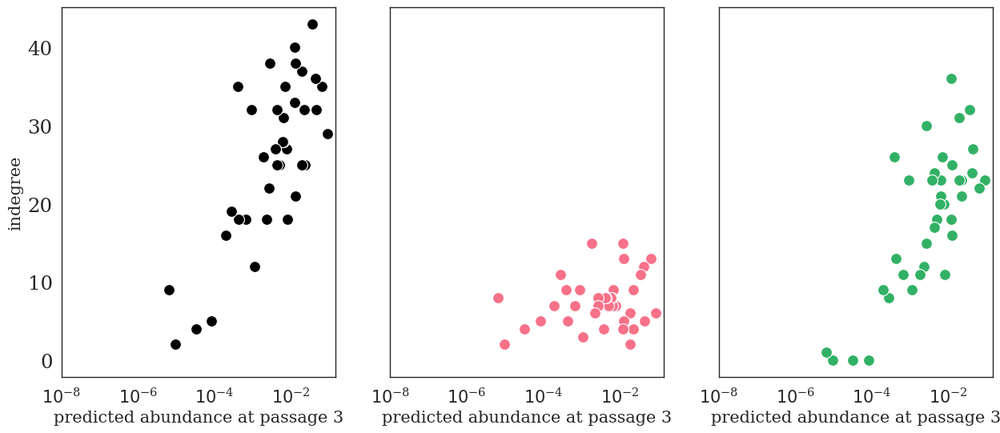

In [277]:
# Figure for paper: plot strains in degree, unweighted

date_ = '20231005'
date_meeting = '20231005'

date_ = '20231015'
date_meeting = '20231015'

sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
cols_ = sns.color_palette("husl", 8)
# plt.figure(figsize=(10, 10), dpi=300)

count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-12] = 1e-12
id_nnz = np.where(Ri_avg >= 1e-8)[0]
Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)
Ri_avg_sorted = Ri_avg[id_metabs_order].copy()

id_species_order = np.argsort(-abun_pred)
species_names_order = species_names[id_species_order]
abun_pred_sorted = abun_pred[id_species_order].copy()
abun_pred_log = np.log(abun_pred_sorted.copy())

num_iter = 100
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey="row", sharex=None)
# in-degree
num_strain_tmp = df_tmp.shape[0]
num_metabs_tmp = df_tmp.shape[1]

df_tmp = df_metab_pert.copy()
df_tmp = df_tmp.iloc[:, id_nnz]
df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[:, id_metabs_order]

# total change 
num_strain_tmp, num_metabs_tmp = df_tmp.shape
count_nnz = np.zeros((num_strain_tmp, num_metabs_tmp))
adj_G = np.array(df_tmp.copy())
id_ = np.where((adj_G) != 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_ = np.sum(count_nnz, axis=0)

# up-regulation
count_nnz = np.zeros((num_strain_tmp, num_metabs_tmp))
adj_G = np.array(df_tmp.copy())
id_ = np.where((adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_x = np.sum(count_nnz, axis=0)

# down regulation
count_nnz = np.zeros((num_species, num_species))
id_ = np.where(-(adj_G) > 0)
adj_bin = np.zeros_like(adj_G)
adj_bin[id_] = 1
count_nnz[id_] = np.abs(adj_bin)[id_]
num_changes_y = np.sum(count_nnz, axis=0)

# plot total change indegree
id_ = np.where(num_changes_ != 0)[0]
print(f'# strains responding to changes = {len(id_)}')

id_nnz_ = np.where((num_changes_ > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(Ri_avg_sorted[id_nnz_]), \
                                num_changes_[id_nnz_])
print(f'corr upregulated = {corr_tmp}')
id_nnz_ = np.arange(num_metabs_tmp)
# id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=((Ri_avg_sorted[id_nnz_])), \
                       y=num_changes_[id_nnz_], ax=axes[0], s=100, \
                       color='black')
axes[0].set_ylabel('outdegree', fontsize=15)
axes[0].set_xlabel('predicted abundance at passage 3', fontsize=15)
# axes[0].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
# axes[0].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_[id_nnz_])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
axes[0].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[0].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

# plot up-regulated

id_nnz_x = np.where((num_changes_x > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(Ri_avg_sorted[id_nnz_x]), \
                                num_changes_x[id_nnz_x])
print(f'corr upregulated = {corr_tmp}')
id_nnz_x = np.arange(num_metabs_tmp)
# id_nnz_ = np.where((num_changes_x > 0) | (num_changes_y > 0))[0]
plt_ = sns.scatterplot(x=((Ri_avg_sorted[id_nnz_x])), \
                       y=num_changes_x[id_nnz_x], ax=axes[1], s=100, \
                       color=cols_[0])
axes[1].set_ylabel('outdegree', fontsize=15)
axes[1].set_xlabel('predicted abundance at passage 3', fontsize=15)
# axes[1].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
# axes[1].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_x[id_nnz_x])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 6
# axes[0].axhline(y=num_changes_x[id_nnz_x[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')
# labels = species_names[id_nnz_x[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_x[id_sort[range(size_)]]])
# y = (num_changes_x[id_nnz_x[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 0:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[0].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 2), ha='left', \
#                          fontsize=10)
    
axes[1].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[1].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)

    
# downregulated
id_nnz_y = np.where((num_changes_y > 0))[0]
corr_tmp = scipy.stats.pearsonr(np.log10(Ri_avg_sorted[id_nnz_y]), \
                                num_changes_y[id_nnz_y])
print(f'corr downregulated = {corr_tmp}')
id_nnz_y = np.arange(num_metabs_tmp)
plt_ = sns.scatterplot(x=((Ri_avg_sorted[id_nnz_y])), \
                       y=num_changes_y[id_nnz_y], ax=axes[2], s=100, \
                       color=cols_[3])
axes[2].set_ylabel('indegree', fontsize=15)
axes[2].set_xlabel('predicted abundance at passage 3', fontsize=15)
# axes[2].axvline(x=1 / num_strain_tmp, c='black', linestyle='dashed')
# axes[2].axhline(y=3, c='black', linestyle='dashed')

# id_sort = np.argsort(-num_changes_y[id_nnz_y])
# # print(num_changes_y[id_nnz_[id_sort]])
# size_ = 5
# axes[1].axhline(y=num_changes_y[id_nnz_y[id_sort[size_ - 1]]] - 0.2, \
#                 c='black', linestyle='dashed')

# labels = species_names[id_nnz_y[id_sort[range(size_)]]]
# x = np.exp(abun_pred_log[id_nnz_y[id_sort[range(size_)]]])
# y = (num_changes_y[id_nnz_y[id_sort[range(size_)]]])
# for i, label in enumerate(labels):
#     if i != 2:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, -4), ha='left', \
#                          fontsize=10)
#     else:
#         axes[1].annotate(label, (x[i], y[i]), \
#                          textcoords="offset points", xytext=(4, 4), ha='left', \
#                          fontsize=10)


axes[2].set_xscale('log', base=10)
xticks_ = np.arange(-8, 0, step=2)
xlabs_ = []
xticks_pow = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
    xticks_pow.append(np.power(10.0, x_))
axes[2].set_xticks(xticks_pow, labels=xlabs_, fontsize=15)


save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'metabs_perturb_keystone_species.svg'))

# plt.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

In [258]:
id_nnz

array([ 1,  2,  4,  7, 10, 15, 16, 19, 24, 25, 26, 32, 33, 36, 37, 38, 39,
       42, 45, 48, 51, 52, 53, 54, 57, 59, 63, 64, 66, 70, 72, 80, 81, 82,
       88, 90, 91, 92])

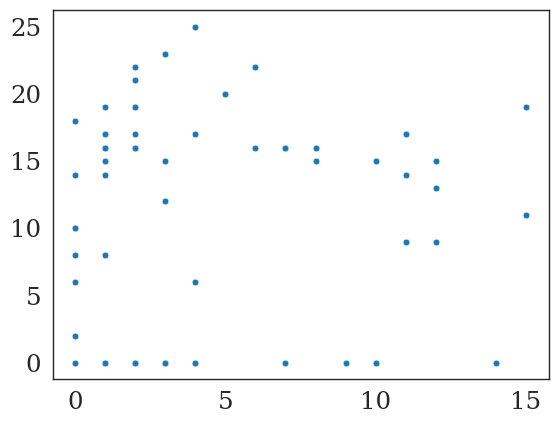

In [104]:
plt_ = sns.scatterplot(x=num_changes_x, y=num_changes_y)

In [280]:
id_ = np.where((num_changes_x <= 3) & (abun_pred_sorted <= 1e-7))[0]
print(id_)
print(abun_pred_sorted[id_])
print(len(id_))
id_strains_insensitive = id_species_order[id_]
print(abun_pred[id_strains_insensitive])
print(species_names[id_strains_insensitive])
# id_strains_insensitive

[49 50 51 52 53 54 55 57 61 62]
[1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08]
10
[1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08]
['Bacteroides-caccae-ATCC-43185' 'Ruminococcus-bromii-ATCC-27255'
 'Bacteroides-coprophilus-DSM-18228' 'Parabacteroides-johnsonii-DSM-18315'
 'Lactococcus-lactis-DSMZ-20729' 'Marvinbryantia-formatexigens-DSM-14469'
 'Lactobacillus-ruminis-ATCC-25644' 'Clostridium-leptum-DSM-753'
 'Catenibacterium-mitsuokai-DSM-15897' 'Tyzzerella-nexilis-DSM-1787']


In [384]:
print(species_names[id_tmp])

['Bacteroides-caccae-ATCC-43185' 'Bacteroides-coprophilus-DSM-18228'
 'Clostridium-leptum-DSM-753' 'Eubacterium-siraeum-DSM-15702'
 'Holdemania-filiformis-DSM-12042' 'Intestinibacter-bartlettii-DSM-16795'
 'Lactobacillus-ruminis-ATCC-25644' 'Lactococcus-lactis-DSMZ-20729'
 'Marvinbryantia-formatexigens-DSM-14469' 'Ruminococcus-bromii-ATCC-27255'
 'Tyzzerella-nexilis-DSM-1787']


In [295]:
id_ = np.where((num_changes_x <= 3) & (abun_pred_sorted <= 1e-7))[0]
print(id_)
print(abun_pred_sorted[id_])
print(len(id_))
id_strains_insensitive = id_species_order[id_]
print(abun_pred[id_strains_insensitive])
print(species_names[id_strains_insensitive])
# id_strains_insensitive

[49 50 51 52 53 54 55 57 61 62]
[1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08]
10
[1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08 1.e-08]
['Bacteroides-caccae-ATCC-43185' 'Ruminococcus-bromii-ATCC-27255'
 'Bacteroides-coprophilus-DSM-18228' 'Parabacteroides-johnsonii-DSM-18315'
 'Lactococcus-lactis-DSMZ-20729' 'Marvinbryantia-formatexigens-DSM-14469'
 'Lactobacillus-ruminis-ATCC-25644' 'Clostridium-leptum-DSM-753'
 'Catenibacterium-mitsuokai-DSM-15897' 'Tyzzerella-nexilis-DSM-1787']


(array([ 1.,  2.,  3.,  4.,  7.,  9., 10., 14.]),
 array([3, 3, 3, 2, 1, 1, 2, 1]))

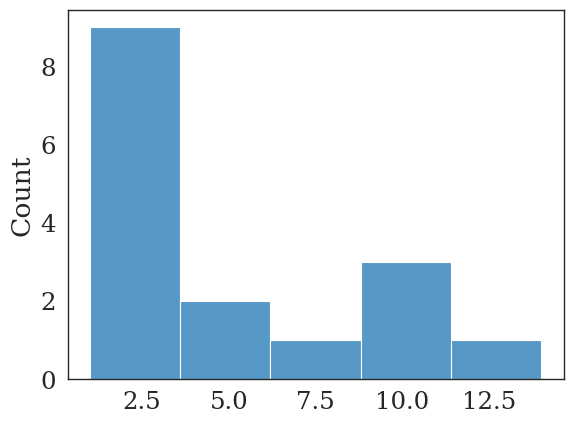

In [117]:
id_ = np.where((num_changes_y == 0) & (num_changes_x > 0))[0]
plt_ = sns.histplot(num_changes_x[id_])
np.unique(num_changes_x[id_], return_counts=True)

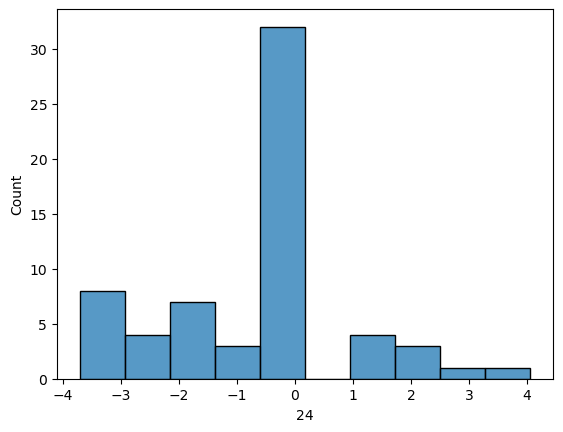

23


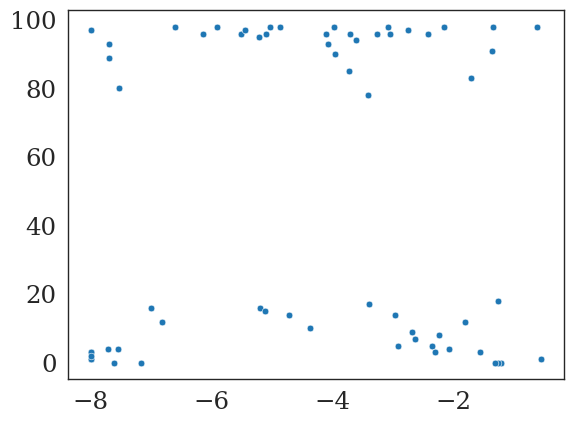

In [90]:
df_metab_pert_bin = np.zeros(df_metab_pert.iloc[:, :].shape)
df_metab_pert_bin[np.abs(np.array(df_metab_pert.iloc[:, :])) > 0] = 1
nnz_metabs_species_pos = df_metab_pert_bin.sum(axis=1)
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
plt_ = sns.scatterplot(x=abun_avg_pass_3, y=nnz_metabs_species_pos)

id_strains_insensitive = np.where(nnz_metabs_species_pos <= 10)[0]
print(len(id_strains_insensitive))

# get competition between up- and down-regulated strains from metabolite perturbation

In [384]:
def get_competition(Ri_avg, df_speciesMetab_cluster, id_1, id_2):
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    vec_src = df_speciesMetab_cluster.iloc[id_1, :].values
    vec_dest = df_speciesMetab_cluster.iloc[id_2, :].values
    nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
    nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
#     competition_rand[b_] = nnz_common / nnz_dest
#         competition_rand[b_] = tmp
    return nnz_common / nnz_dest

def get_crossfeeding(Ri_avg, df_speciesMetab_cluster, \
                     df_speciesMetab_prod_cluster, id_1, id_2):
    num_species = df_speciesMetab_cluster.shape[0]
    id_species = np.arange(num_species)
    vec_src = df_speciesMetab_prod_cluster.iloc[int(id_1), :].values
    vec_dest = df_speciesMetab_cluster.iloc[int(id_2), :].values
    nnz_dest = len(np.where(Ri_avg * vec_dest != 0)[0])
    nnz_common = len(np.where((Ri_avg * vec_dest * vec_src) != 0)[0])
#         crossfeeding_rand[b_] = tmp
    return nnz_common / nnz_dest 

def random_competition_index_metab_pert(Ri_avg, df_speciesMetab_cluster, id_pos_orig, id_neg_orig, \
                                        up_down, nboot=10000):
    competition_rand = np.zeros((nboot))
    num_species = df_speciesMetab_cluster.shape[0]
    num_pos = len(id_pos_orig)
    num_neg = len(id_neg_orig)
    num_tot = num_pos + num_neg
    id_species = np.arange(num_species)
    compete_rand_boot = np.zeros(nboot)
    for b_ in range(nboot):
        id_sample = np.random.choice(np.arange(num_species), num_tot, \
                                     replace=False)
        id_pos = id_sample[:num_pos]
        id_neg = id_sample[num_pos:]
        competition_rand = np.zeros((len(id_pos), len(id_neg)))
        for count_i, i_ in enumerate(id_pos):
            for count_j, j_ in enumerate(id_neg):
                competition_rand[count_i, count_j] = \
                    get_competition(Ri_avg, df_speciesMetab_cluster, i_, j_)
        competition_rand_bin = competition_rand.copy()
        competition_rand_bin[competition_rand_bin < 0.5] = 0
        competition_rand_bin[competition_rand_bin != 0]= 1
        compete_rand_boot[b_] = np.median(np.sum(competition_rand, axis=0))
    return compete_rand_boot


def random_competition_index_metab_pert_new(Ri_avg, \
                                            df_speciesMetab_cluster, id_pos_orig, id_neg_orig, \
                                            up_down, nboot=10000):
    competition_rand = np.zeros((nboot))
    num_species = df_speciesMetab_cluster.shape[0]
    num_pos = len(id_pos_orig)
    num_neg = len(id_neg_orig)
    num_tot = num_pos + num_neg
    id_species = np.arange(num_species)
    compete_rand_boot = np.zeros(nboot)
    for b_ in range(nboot):
        if num_pos > num_neg:
            id_neg = id_neg_orig.copy()
            id_pos = np.random.choice(id_pos_orig, num_neg, \
                                      replace=False)
        else:
            id_pos = id_pos_orig.copy()
            id_neg = np.random.choice(id_neg_orig, num_pos, \
                                      replace=False)
        competition_rand = np.zeros((len(id_pos), len(id_neg)))
        for count_i, i_ in enumerate(id_pos):
            for count_j, j_ in enumerate(id_neg):
                if count_i != count_j:
                    competition_rand[count_i, count_j] = \
                        get_competition(Ri_avg, df_speciesMetab_cluster, i_, j_)
        competition_rand_bin = competition_rand.copy()
        competition_rand_bin[competition_rand_bin < 0.5] = 0
        competition_rand_bin[competition_rand_bin != 0]= 1
        compete_rand_boot[b_] = np.median(np.sum(competition_rand, axis=0))
    return compete_rand_boot

In [350]:
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()

Ri_avg[Ri_avg <= 1e-12] = 1e-12
Ri_full = Ri_avg.copy()
id_nnz = np.where(Ri_avg >= 1e-8)[0]
Ri_avg = Ri_avg[id_nnz]

In [386]:
competition_strains = []
competition_strains_rand = []
m_id = 0
compete_true = np.zeros((len(id_metabs_order)))
compete_true_p = np.zeros((len(id_metabs_order)))
for m_id in np.arange(len(id_metabs_order)):
    print(f'metab id = {m_id}')
    m_ = id_metabs_order[m_id]
    print(Ri_avg[m_])
    df_consm = df_speciesMetab_cluster.copy()
    df_consm.index = species_names
    df_consm = df_consm.loc[species_names_order, :]
    id_pos = np.where((df_tmp.iloc[:, m_id] > 0) & \
                      (df_consm.iloc[:, id_nnz[m_]] != 0))[0]
    # id_pos = np.where((df_tmp.iloc[:, m_id] > 0))[0]
    print(len(id_pos))
    id_neg = np.where((df_tmp.iloc[:, m_id] < 0) & \
                      (df_consm.iloc[:, id_nnz[m_]] != 0))[0]
    print(len(id_neg))

    competition_tmp = np.zeros((len(id_pos), len(id_neg)))
    if (len(id_pos) > 0) & (len(id_neg) > 0):
        for count_i, i_ in enumerate(id_pos):
            for count_j, j_ in enumerate(id_neg):
                competition_tmp[count_i, count_j] = get_competition(Ri_full, df_consm, i_, j_)
        competition_tmp_bin = competition_tmp.copy()
        competition_tmp_bin[competition_tmp_bin < 0.5] = 0
        competition_tmp_bin[competition_tmp_bin != 0] = 1
        compete_true[m_id] = np.median(competition_tmp.sum(axis=0))
        compete_rand = \
            random_competition_index_metab_pert_new(Ri_full, df_consm, id_pos, id_pos, \
                                                None, nboot=2000)
        id_tmp = np.where(compete_rand >= compete_true[m_id])[0]
        compete_true_p[m_id] = len(id_tmp) / len(compete_rand)

        print(f'competition = {compete_true[m_id]}, p={compete_true_p[m_id]}')

metab id = 0
0.08969368495517634
5
12
competition = 3.2605042016806722, p=0.0
metab id = 1
0.06435269086028829
13
22
competition = 6.833708708708708, p=0.7785
metab id = 2
0.04461551740266062
2
0
metab id = 3
0.042454918137327775
12
24
competition = 5.79360465116279, p=1.0
metab id = 4
0.035788019452575044
11
32


KeyboardInterrupt: 

In [389]:
compete_rand.mean()

7.124166128472011

In [370]:
np.median(competition_tmp.mean(axis=0))

0.6521008403361346

In [373]:
compete_rand = \
    random_competition_index_metab_pert(Ri_full, df_consm, id_pos, id_neg, \
                                        None, nboot=10000)

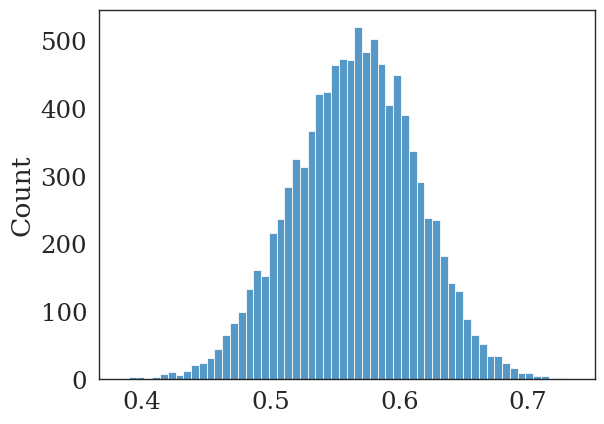

In [374]:
plt_ = sns.histplot(compete_rand)

In [361]:
compete_rand

0.8170189098998888

In [333]:
print(df_speciesMetab_cluster.columns.values[id_nnz[m_]])
print(Ri_full[id_nnz[m_]])

93
0.08969368495517634


In [316]:
df_tmp.iloc[:, m_id]

Clostridium-sporogenes-ATCC-15579       -2.18282
Acidaminococcus-intestini-D21            0.00000
Bacteroides-uniformis-ATCC-8492          0.00000
Mitsuokella-multacida-DSM-20544          0.00000
Bacteroides-thetaiotaomicron-VPI-5482    0.00000
                                          ...   
Holdemania-filiformis-DSM-12042          0.00000
Eubacterium-siraeum-DSM-15702            0.00000
Eggerthella-lenta-DSM-2243               0.00000
Catenibacterium-mitsuokai-DSM-15897      0.00000
Tyzzerella-nexilis-DSM-1787              0.00000
Name: 3, Length: 63, dtype: float64

In [306]:
df_speciesMetab_cluster.iloc[:, id_nnz[m_]]

Acidaminococcus fermentans DSMZ 20731          0.318171
Acidaminococcus intestini D21 BEI HM-81        0.986853
Anaerostipes caccae DSMZ 14662                 0.068039
Anaerotruncus colihominis DSMZ 17241           0.009961
Bacteroides caccae ATCC 43185                  0.171755
                                                 ...   
Ruminococcus gnavus ATCC 29149                 0.070937
Ruminococcus torques ATCC 27756                0.000000
Slackia exigua ATCC 700122                     0.000000
Streptococcus thermophilus LMD-9 ATCC 19258    0.144661
Tyzzerella nexilis DSM 1787                    0.000000
Name: 93, Length: 63, dtype: float64

In [311]:
df_speciesMetab_cluster.columns.values[id_nnz[m_]]
df_metabs_clusters.iloc[92, :]

cluster_labels                         92
cluster_counts                          1
cluster_metab_IDs                   [218]
cluser_metab_names    [PYROGLUTAMIC ACID]
Name: 92, dtype: object

In [304]:
Ri_avg[m_]

0.08969368495517634

In [286]:
a = np.random.normal(size=10)
print(a[:4])
print(a[4:])

[-1.82804154 -0.50288044 -0.02623592  1.27750151]
[ 0.43126792 -0.68811696  0.49011539  4.02655671 -0.01725317 -1.80845967]


# perturb metabolites for different increase factor for metabolites

In [91]:
def pertub_each_metab_alone(Ri_avg, id_, df_speciesMetab_cluster, \
                            df_speciesMetab_prod_cluster, B_alone_iter, \
                            df_speciesAbun_inoc, df_speciesAbun_mdl, \
                            df_speciesAbun_prev_mdl, df_speciesAbun_ratio_mdl, change_fac):
    def predict_abun_wrapper(df_speciesMetab_cluster, df_speciesMetab_prod_cluster, Ri_new, \
                             B_alone_iter, df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, \
                             df_speciesAbun_ratio_mdl):
        pass_ = 2
        num_species = df_speciesMetab_cluster.shape[0]
        p_vec_new_tmp = [0.1]
        count_p = 0
        num_metabs_clust = df_speciesMetab_cluster.shape[1]
        df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
        df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
        num_iter = 100
        num_metabs = df_speciesMetab_cluster.shape[1]
    #     solution = solution_list[0].copy()
        Ri_fit = {0: Ri_new}
    #     abun_alone = get_B_alone(Ri_avg, df_speciesMetab_cluster.copy())
        # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
        sens_obj_tmp, RMSE_obj_tmp = \
            blindly_pred_abun_growth([p_vec_new_tmp[count_p]], df_speciesMetab_tmp, \
                                     df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                     df_speciesAbun_prev_mdl, \
                                     df_speciesAbun_ratio_mdl, \
                                     Ri_fit, "dummy", "dummy", \
                                     "dummy", num_passages=6, num_iter=100, \
                                     thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                     save_data_obj=False, \
                                     return_sensitivity_ana=True, \
                                     get_prod=True, B_alone=B_alone_iter[num_iter - 2], \
                                     df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                     prod_use_prev=False, num_passages_run=3)

        pred_dist_all = sens_obj_tmp[pass_]['df_speciesAbun_next_pred'].copy()
        pred_dist_all[pred_dist_all <= 1e-8] = 1e-8
        abun_tmp = np.zeros((num_species))
        for species_ in range(num_species):
            id_ = np.array([0, 1, 2]) + species_ * 3
            abun_tmp[species_] = np.exp(np.mean(np.log(pred_dist_all[id_])))
        return abun_tmp
    Ri_new = Ri_avg.copy()
    Ri_new[id_] = change_fac * Ri_avg[id_]
    abundance_change_pos = \
        predict_abun_wrapper(df_speciesMetab_cluster, df_speciesMetab_prod_cluster, Ri_new, \
                             B_alone_iter, df_speciesAbun_inoc, df_speciesAbun_mdl, \
                             df_speciesAbun_prev_mdl, \
                             df_speciesAbun_ratio_mdl)
    return {'abundance' : abundance_change_pos}

In [147]:
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-8] = 1e-8
id_nnz = np.where(Ri_avg >= 1e-8)[0]
num_metabs = df_speciesMetab_cluster.shape[1]
abundance_change_pos = np.zeros((num_metabs, num_species))
abundance_change_neg = np.zeros((num_metabs, num_species))
change_fac_vec = [1, 10, 100, 1000, 1e4, 1e5, 1e6, 1e7]
# change_fac_vec = [10]
num_metabs = df_speciesMetab_cluster.shape[1]
abundance_change_pos_all = np.zeros((len(change_fac_vec), num_metabs))

for count_c, change_fac in enumerate(change_fac_vec):
    print(f'change loop = {count_c}')
    out = Parallel(n_jobs=10, verbose=100, pre_dispatch='1.5*n_jobs')(
        delayed(pertub_each_metab_alone)(Ri_avg, sample_, df_speciesMetab_cluster, \
                                df_speciesMetab_prod_cluster, B_alone_iter, \
                                df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                df_speciesAbun_prev_mdl, df_speciesAbun_ratio_mdl, change_fac) \
        for sample_ in range(num_metabs))
    for count_a, d in enumerate(out):
        abun_tmp = d['abundance'].copy()
        abundance_change_pos_all[count_c, count_a] = \
            np.sqrt(np.mean(np.power(np.log10(abun_tmp.flatten()) - \
                                    np.log10(1 / num_species), 2)))

change loop = 0
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   5 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   6 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done   7 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   8 tasks      | elapsed:    4.5s
[Parallel(n_jobs=10)]: Done   9 tasks      | elapsed:    4.6s
[Parallel(n_jobs=10)]: Done  10 tasks      | elapsed:    4.6s
[Parallel(n_jobs=10)]: Done  11 tasks      | elapsed:    4.6s
[Parallel(n_jobs=10)]: Done  12 tasks      | elapsed:    4.7s
[Parallel(n_jobs=10)]: Done  13 tasks      | elapsed:    4.9s
[Parallel(n_jobs=10)]: Done  14 tasks      | elapsed:    5.1s
[Parallel(n_jobs=10)]: Done  15 tasks  

[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done  35 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  36 tasks      | elapsed:    5.6s
[Parallel(n_jobs=10)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  38 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  39 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  41 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  42 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  43 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  44 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  45 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  46 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  47 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  48 tasks      | elapsed:    7.1s
[Paralle

[Parallel(n_jobs=10)]: Done  64 tasks      | elapsed:    9.1s
[Parallel(n_jobs=10)]: Done  65 tasks      | elapsed:    9.2s
[Parallel(n_jobs=10)]: Done  66 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  67 tasks      | elapsed:    9.5s
[Parallel(n_jobs=10)]: Done  68 tasks      | elapsed:    9.6s
[Parallel(n_jobs=10)]: Done  69 tasks      | elapsed:   10.0s
[Parallel(n_jobs=10)]: Done  70 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  71 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  72 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  73 tasks      | elapsed:   10.1s
[Parallel(n_jobs=10)]: Done  74 tasks      | elapsed:   10.2s
[Parallel(n_jobs=10)]: Done  75 tasks      | elapsed:   10.6s
[Parallel(n_jobs=10)]: Done  76 tasks      | elapsed:   10.6s
[Parallel(n_jobs=10)]: Done  77 tasks      | elapsed:   11.0s
[Parallel(n_jobs=10)]: Done  78 tasks      | elapsed:   11.2s
[Parallel(n_jobs=10)]: Done  79 tasks      | elapsed:   11.2s
[Paralle

[Parallel(n_jobs=10)]: Done  91 out of  98 | elapsed:   12.7s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  92 out of  98 | elapsed:   12.7s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  93 out of  98 | elapsed:   12.7s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  94 out of  98 | elapsed:   12.7s remaining:    0.5s
[Parallel(n_jobs=10)]: Done  95 out of  98 | elapsed:   13.1s remaining:    0.4s
[Parallel(n_jobs=10)]: Done  96 out of  98 | elapsed:   13.2s remaining:    0.3s
[Parallel(n_jobs=10)]: Done  98 out of  98 | elapsed:   13.3s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  98 out of  98 | elapsed:   13.3s finished
change loop = 4
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   1 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done   2 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done   3 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done   4 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]

[Parallel(n_jobs=10)]: Done  19 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done  20 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done  22 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done  23 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done  24 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done  25 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done  26 tasks      | elapsed:    2.9s
[Parallel(n_jobs=10)]: Done  27 tasks      | elapsed:    3.6s
[Parallel(n_jobs=10)]: Done  28 tasks      | elapsed:    3.7s
[Parallel(n_jobs=10)]: Done  29 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  32 tasks      | elapsed:    3.8s
[Parallel(n_jobs=10)]: Done  33 tasks      | elapsed:    3.9s
[Parallel(n_jobs=10)]: Done  34 tasks      | elapsed:    4.3s
[Paralle

[Parallel(n_jobs=10)]: Done  50 tasks      | elapsed:    5.8s
[Parallel(n_jobs=10)]: Done  51 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  52 tasks      | elapsed:    5.9s
[Parallel(n_jobs=10)]: Done  53 tasks      | elapsed:    6.0s
[Parallel(n_jobs=10)]: Done  54 tasks      | elapsed:    6.1s
[Parallel(n_jobs=10)]: Done  55 tasks      | elapsed:    6.2s
[Parallel(n_jobs=10)]: Done  56 tasks      | elapsed:    6.3s
[Parallel(n_jobs=10)]: Done  57 tasks      | elapsed:    6.4s
[Parallel(n_jobs=10)]: Done  58 tasks      | elapsed:    6.7s
[Parallel(n_jobs=10)]: Done  59 tasks      | elapsed:    6.8s
[Parallel(n_jobs=10)]: Done  60 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  61 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  62 tasks      | elapsed:    7.0s
[Parallel(n_jobs=10)]: Done  63 tasks      | elapsed:    7.1s
[Parallel(n_jobs=10)]: Done  64 tasks      | elapsed:    7.2s
[Parallel(n_jobs=10)]: Done  65 tasks      | elapsed:    7.3s
[Paralle

[Parallel(n_jobs=10)]: Done  81 tasks      | elapsed:    8.9s
[Parallel(n_jobs=10)]: Done  82 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  83 tasks      | elapsed:    9.0s
[Parallel(n_jobs=10)]: Done  84 tasks      | elapsed:    9.4s
[Parallel(n_jobs=10)]: Done  85 out of  98 | elapsed:    9.4s remaining:    1.4s
[Parallel(n_jobs=10)]: Done  86 out of  98 | elapsed:    9.5s remaining:    1.3s
[Parallel(n_jobs=10)]: Done  87 out of  98 | elapsed:    9.5s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  88 out of  98 | elapsed:    9.6s remaining:    1.1s
[Parallel(n_jobs=10)]: Done  89 out of  98 | elapsed:    9.7s remaining:    1.0s
[Parallel(n_jobs=10)]: Done  90 out of  98 | elapsed:    9.9s remaining:    0.9s
[Parallel(n_jobs=10)]: Done  91 out of  98 | elapsed:    9.9s remaining:    0.8s
[Parallel(n_jobs=10)]: Done  92 out of  98 | elapsed:   10.2s remaining:    0.7s
[Parallel(n_jobs=10)]: Done  93 out of  98 | elapsed:   10.2s remaining:    0.5s
[Parallel(n_jobs=10)]: 

In [148]:
df_tmp = pd.DataFrame()
for count_a, d in enumerate(out):
    abun_tmp = d['abundance'].copy()
    abun_tmp[abun_tmp <= 1e-8] = 1e-8
    df_tmp[f'{count_a + 1}'] = np.log10(abun_tmp.flatten()) - abun_avg_pass_3
df_metab_pert = df_tmp.copy()
df_metab_pert.index = species_names

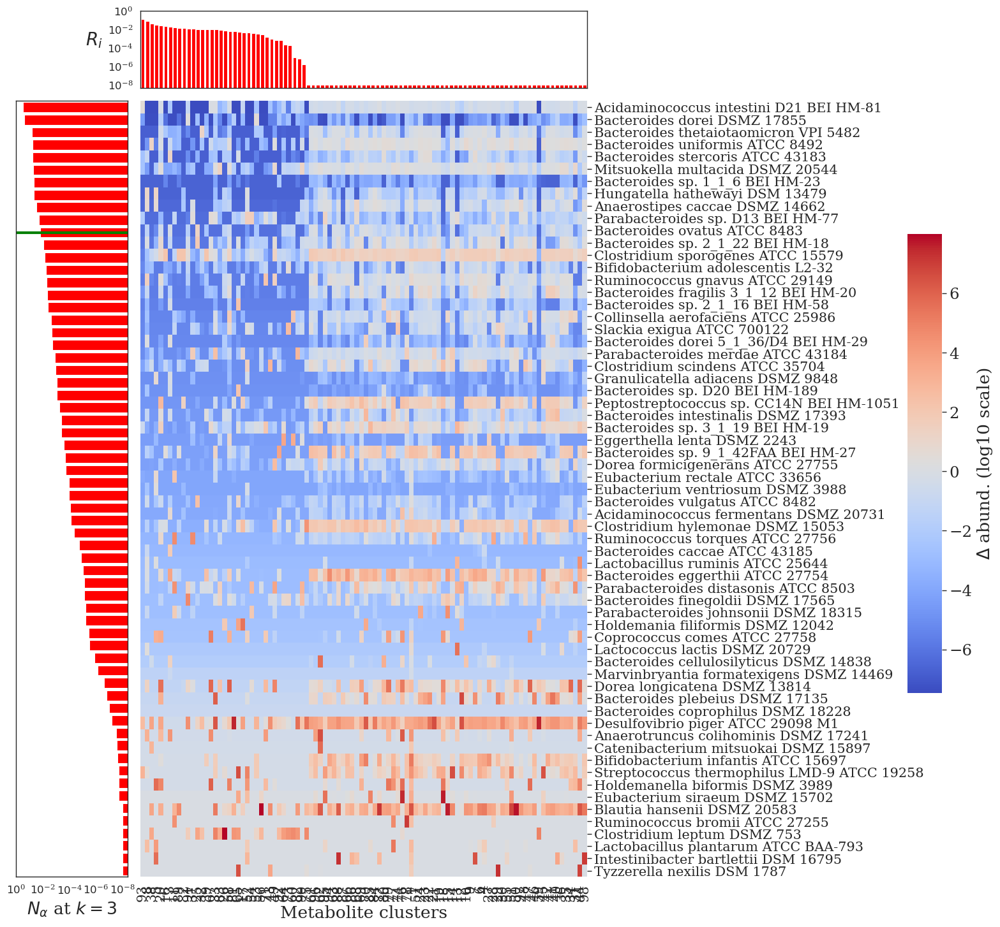

In [149]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
date_ = '20230912'
date_meeting = '20230912'
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
pass_ = 2
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
id_species_order = np.argsort(-abun_avg_pass_3)
species_names_order = species_names[id_species_order]
sorted_tensor_order = 10**(abun_avg_pass_3[id_species_order])
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-8] = 1e-8
# Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)
df_tmp = df_metab_pert.copy()
df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[:, id_metabs_order]
# f, axs = plt.subplots(1, 3, figsize=(18, 18), \
#                       sharey=False, gridspec_kw=dict(width_ratios=[3,1.5,5]))
plt_ = sns.clustermap(df_tmp, \
                      cmap="coolwarm", figsize=(18, 18), \
                      metric="euclidean", xticklabels=True, yticklabels=True, \
                      row_cluster=False, col_cluster=False, \
                      cbar_kws={'shrink': 0.1, 'label': r'$\Delta$ abund. (log10 scale)'}, \
                      cbar_pos=(0.92, .2, .03, .4))
plt_.ax_col_dendrogram.set_visible(False)
plt_.ax_row_dendrogram.set_visible(False)
plt_.ax_heatmap.set_xlabel('Metabolite clusters')
# plt_.fig.subplots_adjust(right=0.7)
# plt_.ax_cbar.set_position((0.1, .2, .03, .4))
plt.setp(plt_.ax_heatmap.get_xticklabels(), rotation=90, fontsize=15)
plt.setp(plt_.ax_heatmap.get_yticklabels(), rotation=0, fontsize=15)
# sns.move_legend(plt_.ax_heatmap, "center right")

# Create a subplot for tensor_order on the left
divider = make_axes_locatable(plt_.ax_heatmap)
ax2 = divider.append_axes('left', size='25%', pad=0.2)
ax2.set_ylim(0, 62)

# Plot tensor_order on the left
y_ticks = np.arange(len(sorted_tensor_order))
y_tick_pos = [i + 0.5 for i in y_ticks]
# ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
ax2.barh(y_tick_pos, sorted_tensor_order, color='red')
ax2.set_xlabel(fr"$N_{{\alpha}}$ at $k=3$")
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

xticks_ = [-8, -6, -4, -2, 0]
xlabs_ = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")

ax2.invert_yaxis()
id_mid = np.where((sorted_tensor_order <= 1 / num_species))[0][0]
ax2.axhline(y=y_tick_pos[id_mid], c="green", linewidth=3)
ax2.set_xscale('log', base=10)
ax2.set_xticks(np.power(10, np.array(xticks_, dtype='float')))
ax2.set_xticklabels(xlabs_, fontsize=12, rotation=0)
ax2.invert_xaxis()
ax2.set_yticklabels([])
# Hide y-axis labels for the clustermap
# plt_.ax_heatmap.set_yticklabels([])

ax3 = divider.append_axes('top', size='10%', pad=0.2)
ax3.set_xlim(0, len(id_nnz) - 1)

# Plot tensor_order on the left
x_ticks = np.arange(len(id_metabs_order))
x_tick_pos = [i + 0.5 for i in x_ticks]
# ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
ax3.bar(x_tick_pos, Ri_avg[id_metabs_order], color='red')
ax3.set_ylabel(fr"$R_i$", fontsize=20, rotation=0, labelpad=15)
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

yticks_ = [-8, -6, -4, -2, 0]
ylabs_ = []
for y_ in yticks_:
    ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")

# ax2.invert_yaxis()
ax3.set_yscale('log', base=10)
ax3.set_yticks(np.power(10, np.array(yticks_, dtype='float')))
ax3.set_yticklabels(ylabs_, fontsize=12, rotation=0)
ax3.set_xticklabels([])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'pert_metabs_abun_heatmap_new_2.pdf'))

# plt_.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# # file_save = os.path.abspath(os.path.join(save_dir, 
# #                                             f'predicted_vs_observed_abundance.pdf'))

# # fig.figure.savefig(file_save, \
# #                     dpi=300, transparent=False, facecolor="white")
# plt.close()

In [150]:
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
error_base = np.sqrt(np.mean(np.power(np.log10(10**abun_avg_pass_3.flatten()) - \
                                    np.log10(1 / num_species), 2)))
error_base

3.500205776504289

In [151]:
(abundance_change_pos_all - error_base).shape

(8, 98)

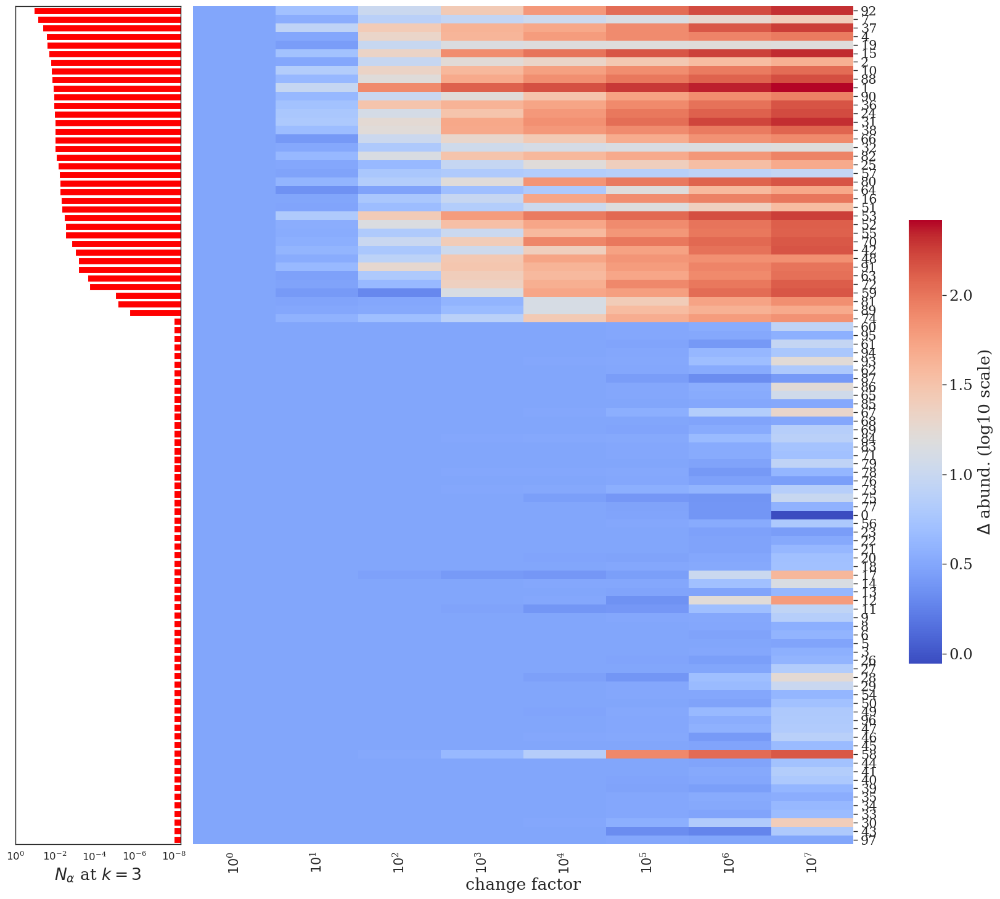

In [152]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
date_ = '20230912'
date_meeting = '20230912'
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg[Ri_avg <= 1e-8] = 1e-8
# Ri_avg = Ri_avg[id_nnz]
id_metabs_order = np.argsort(-Ri_avg)
df_tmp = pd.DataFrame()
vals_ = (abundance_change_pos_all - error_base).T
for m_ in range(len(change_fac_vec)):
    df_tmp[fr"${10}^{{\mathregular{{{m_}}}}}$"] = vals_[:, m_].flatten()
# df_tmp = df_metab_pert.copy()
# df_tmp = df_tmp.loc[species_names_order, :]
df_tmp = df_tmp.iloc[id_metabs_order, :]
# f, axs = plt.subplots(1, 3, figsize=(18, 18), \
#                       sharey=False, gridspec_kw=dict(width_ratios=[3,1.5,5]))
plt_ = sns.clustermap(df_tmp, \
                      cmap="coolwarm", figsize=(18, 18), \
                      metric="euclidean", xticklabels=True, yticklabels=True, \
                      row_cluster=False, col_cluster=False, \
                      cbar_kws={'shrink': 0.1, 'label': r'$\Delta$ abund. (log10 scale)'}, \
                      cbar_pos=(1.01, .2, .03, .4))
plt_.ax_col_dendrogram.set_visible(False)
plt_.ax_row_dendrogram.set_visible(False)
plt_.ax_heatmap.set_xlabel('change factor')
# plt_.fig.subplots_adjust(right=0.7)
# plt_.ax_cbar.set_position((0.1, .2, .03, .4))
plt.setp(plt_.ax_heatmap.get_xticklabels(), rotation=90, fontsize=15)
plt.setp(plt_.ax_heatmap.get_yticklabels(), rotation=0, fontsize=15)
# sns.move_legend(plt_.ax_heatmap, "center right")

# Create a subplot for tensor_order on the left
divider = make_axes_locatable(plt_.ax_heatmap)
ax2 = divider.append_axes('left', size='25%', pad=0.2)
ax2.set_ylim(0, num_metabs - 1)

# Plot tensor_order on the left
y_ticks = np.arange(num_metabs)
y_tick_pos = [i + 0.5 for i in y_ticks]
# ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
ax2.barh(y_tick_pos, Ri_avg[id_metabs_order], color='red')
ax2.set_xlabel(fr"$N_{{\alpha}}$ at $k=3$")
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

xticks_ = [-8, -6, -4, -2, 0]
xlabs_ = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")

ax2.invert_yaxis()
# id_mid = np.where((sorted_tensor_order <= 1 / num_species))[0][0]
# ax2.axhline(y=y_tick_pos[id_mid], c="green", linewidth=3)
ax2.set_xscale('log', base=10)
ax2.set_xticks(np.power(10, np.array(xticks_, dtype='float')))
ax2.set_xticklabels(xlabs_, fontsize=12, rotation=0)
ax2.invert_xaxis()
ax2.set_yticklabels([])
# Hide y-axis labels for the clustermap
# plt_.ax_heatmap.set_yticklabels([])

# ax3 = divider.append_axes('top', size='10%', pad=0.2)
# ax3.set_xlim(0, len(id_nnz) - 1)

# # Plot tensor_order on the left
# x_ticks = np.arange(len(id_metabs_order))
# x_tick_pos = [i + 0.5 for i in x_ticks]
# # ax2.semilogx(sorted_tensor_order, y_tick_pos, 'ro-')
# ax3.bar(x_tick_pos, Ri_avg[id_metabs_order], color='red')
# ax3.set_ylabel(fr"$R_i$", fontsize=20, rotation=0, labelpad=15)
# ax2.legend(loc='none')
# ax2.set_ylabel('abundance at passage 3', fontsize=35)

# yticks_ = [-8, -6, -4, -2, 0]
# ylabs_ = []
# for y_ in yticks_:
#     ylabs_.append(fr"${10}^{{\mathregular{{{y_}}}}}$")

# # ax2.invert_yaxis()
# ax3.set_yscale('log', base=10)
# ax3.set_yticks(np.power(10, np.array(yticks_, dtype='float')))
# ax3.set_yticklabels(ylabs_, fontsize=12, rotation=0)
# ax3.set_xticklabels([])

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'pert_metabs_abun_heatmap_new_2.pdf'))

# plt_.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")

# # file_save = os.path.abspath(os.path.join(save_dir, 
# #                                             f'predicted_vs_observed_abundance.pdf'))

# # fig.figure.savefig(file_save, \
# #                     dpi=300, transparent=False, facecolor="white")
# plt.close()

In [132]:
df_tmp.shape

(6, 6)

# after perturbing metabolites, next perform Ri modification for equal strain abundances

In [133]:
def neighborhood_fn_tmp(solution_org, solution, id_metabs, iter_, \
                    Ri_max=1, iter_max=100, change_fac=0.1):
    sol_org = solution_org[id_metabs]
    sol_ = solution[id_metabs]

    if sol_ > sol_org:
        id_inc_dec = np.random.choice([0, 1], 1, replace=False)
        if id_inc_dec == 0:
#                 solution[id_metabs] = np.exp(np.log(sol_org) + \
#                                              (1 - (iter_ + 1) / iter_max) * (np.log(sol_) - \
#                                                                       np.log(sol_org)) / 2)
            solution[id_metabs] = np.exp(np.log(sol_org) + \
                                         change_fac * (np.log(sol_) - np.log(sol_org)))

        else:
            if sol_ != 0:
#                     solution[id_metabs] = np.exp(np.log(sol_) / change_fac)
                solution[id_metabs] = np.exp(np.log(sol_) + \
                    ((np.log(Ri_max) - np.log(sol_))) * change_fac)
#                     solution[id_metabs] = change_fac * sol_
            else:
                solution[id_metabs] = 1e-8
    else:
        if sol_ != 0:
#                 solution[id_metabs] = np.exp(np.log(sol_) / change_fac)
            solution[id_metabs] = np.exp(np.log(sol_) + \
                ((np.log(Ri_max) - np.log(sol_))) * change_fac)
#                 solution[id_metabs] = np.exp(np.log(sol_) + \
#                     ((np.log(Ri_max) - np.log(sol_)) / 2) * (1 - (iter_ + 1) / iter_max))
#                 solution[id_metabs] = change_fac * sol_
        else:
            solution[id_metabs] = 1e-8
    return solution

def objective_fn_new(df_speciesMetab_cluster, df_speciesMetab_prod_cluster, \
                     Ri_avg, solution, id_metabs, p_vec_new_tmp, df_speciesAbun_inoc, \
                     df_speciesAbun_mdl, df_speciesAbun_prev_mdl, \
                     df_speciesAbun_ratio_mdl, B_alone_iter, species_names, \
                     num_iter=10, count_p=0, pass_=2, num_passages=6, \
                     id_species_sensitive=None, change_fac=0.1, iter_=0, Ri_max=1, \
                     iter_max=100):
    import warnings
    warnings.filterwarnings('ignore')
    def neighborhood_fn(solution_org, solution, id_metabs, iter_, \
                        id_inc_dec, Ri_max=1, iter_max=100, change_fac=0.1):
        sol_org = solution_org[id_metabs]
        sol_ = solution[id_metabs]
        

        if sol_ > sol_org:
            if id_inc_dec == 0:
#                 solution[id_metabs] = np.clip(np.exp(np.log(sol_) * change_fac), \
#                                               a_min=sol_org, a_max=sol_)
#                 solution[id_metabs] = np.exp(np.log(sol_org) + \
#                                              (1 - (iter_ + 1) / iter_max) * (np.log(sol_) - \
#                                                                       np.log(sol_org)) / 2)
                solution[id_metabs] = np.exp(np.log(sol_org) + \
                                             (0.6) * \
                                             (np.log(sol_) - np.log(sol_org)))
                
            else:
                if sol_ != 0:
#                     solution[id_metabs] = np.exp(np.log(sol_) / change_fac)
                    solution[id_metabs] = sol_ * change_fac
#                     solution[id_metabs] = np.exp(np.log(sol_) + \
#                         ((np.log(Ri_max) - np.log(sol_))) * change_fac)
#                     solution[id_metabs] = change_fac * sol_
                else:
                    solution[id_metabs] = 1e-8
        else:
            if sol_ != 0:
#                 solution[id_metabs] = np.exp(np.log(sol_) / change_fac)
                solution[id_metabs] = sol_ * change_fac
#                 solution[id_metabs] = np.exp(np.log(sol_) + \
#                     ((np.log(Ri_max) - np.log(sol_))) * change_fac)
#                 solution[id_metabs] = np.exp(np.log(sol_) + \
#                     ((np.log(Ri_max) - np.log(sol_)) / 2) * (1 - (iter_ + 1) / iter_max))
#                 solution[id_metabs] = change_fac * sol_
            else:
                solution[id_metabs] = 1e-8
        return solution
    
    # evalute Ri with production and iterative Balone
    change_fac_vec = 10**np.array(np.arange(1, 2), dtype='float')
    num_metabs_clust = df_speciesMetab_cluster.shape[1]
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
    # count_p = 7
    count_p = 0

    RMSE_mat_full = np.zeros((num_passages, 2))
    id_inc_dec = np.random.choice([0, 1], 1, replace=False)
#     print(id_inc_dec)
    error_mat = np.zeros((len(change_fac_vec)))
    Ri_new_dict = {}
    pred_dist_dict = {}
    for count_c, c_ in enumerate(change_fac_vec):
        Ri_new = neighborhood_fn(Ri_avg, solution, id_metabs, iter_, \
                                 id_inc_dec, Ri_max, iter_max, change_fac=c_)
        Ri_new_dict[count_c] = Ri_new
        Ri_fit = {0: Ri_new}
        abun_alone = get_B_alone_func(Ri_avg, df_speciesMetab_cluster.copy())
        # RMSE_sens_complete_full = np.zeros((num_passages - 1, 2))
        sens_obj_all_prod, RMSE_obj_all_prod = \
            blindly_pred_abun_growth([p_vec_new_tmp[count_p]], df_speciesMetab_tmp, \
                                     df_speciesAbun_inoc, df_speciesAbun_mdl, \
                                     df_speciesAbun_prev_mdl, \
                                     df_speciesAbun_ratio_mdl, \
                                     Ri_fit, "dummy", "dummy", \
                                     "dummy", num_passages=6, num_iter=10, \
                                     thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                     save_data_obj=False, \
                                     return_sensitivity_ana=True, \
                                     get_prod=True, B_alone=B_alone_iter[num_iter - 2], \
                                     df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                     prod_use_prev=False, num_passages_run=3, \
                                     use_dilution=True, \
                                     dilution_factor=15000, \
                                     id_species_update=id_species_sensitive, \
                                     use_avg_for_prod=False)
        pred_dist_all = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred'].copy()
        pred_dist_all[pred_dist_all <= 1e-8] = 1e-8
        species_names_all = sens_obj_all_prod[pass_]['species_names']
        pred_dist = np.zeros((num_species))
        for species_ in range(num_species):
            id_ = np.array([0, 1, 2]) + species_ * 3
            pred_dist[species_] = np.exp(np.mean(np.log(pred_dist_all[id_])))
    #     uniform_dist = (1 / num_species) * np.ones((num_species))
        pred_dist_dict[count_c] = pred_dist
        if id_species_sensitive is not None:
            uniform_dist = (1 / len(id_species_sensitive)) * \
                np.ones((len(id_species_sensitive)))
            error_ = np.sqrt(np.mean(np.power(np.log10(uniform_dist) - \
                                              np.log10(pred_dist[id_species_sensitive]), 2)))
        else:
            uniform_dist = (1 / num_species) * \
                np.ones((num_species))
            error_ = np.sqrt(np.mean(np.power(np.log10(uniform_dist) - \
                                              np.log10(pred_dist[:]), 2)))
        error_mat[count_c] = error_
#     error_ = jensenshannon(uniform_dist, pred_dist)
    id_ = np.where(error_mat == np.min(error_mat))[0][0]
    
    return {"error" : error_mat[id_], "Ri" : Ri_new_dict[id_], "pred_dist" : pred_dist_dict}

In [128]:
10**np.array(np.arange(1, 2), dtype='float')

array([10.])

14


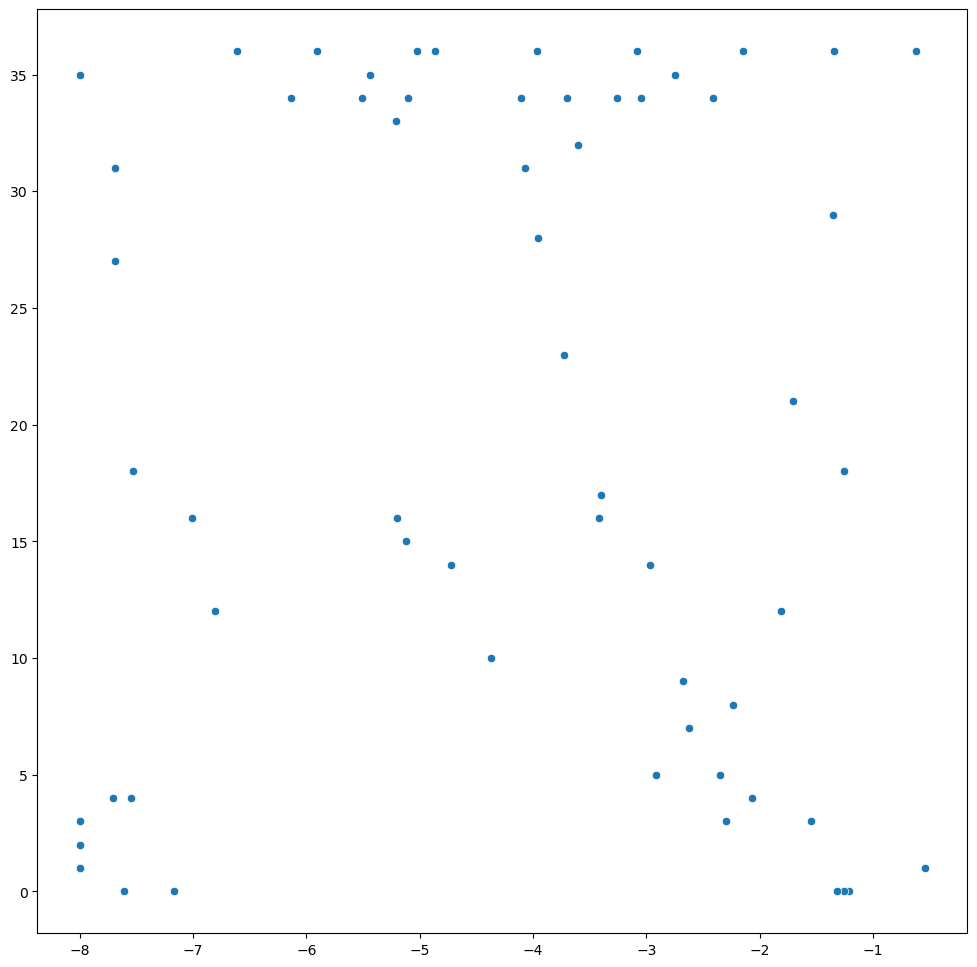

In [110]:
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
id_nnz = np.where(Ri_avg >= 1e-6)[0]
df_metab_pert_bin = np.zeros(df_metab_pert.iloc[:, id_nnz].shape)
df_metab_pert_bin[np.abs(np.array(df_metab_pert.iloc[:, id_nnz])) >= 1] = 1
nnz_metabs_species_pos = df_metab_pert_bin.sum(axis=1)
pass_keep = remove_passages(pass_rm_list=[0, 1, 3, 4, 5])
abun_avg_pass_3 = np.array(df_speciesAbun_mdl.iloc[:, pass_keep])
abun_avg_pass_3 = np.mean(np.log10(abun_avg_pass_3), axis=1)
plt_ = sns.scatterplot(x=abun_avg_pass_3, y=nnz_metabs_species_pos)

id_strains_insensitive = np.where(nnz_metabs_species_pos <= 3)[0]
print(len(id_strains_insensitive))

PearsonRResult(statistic=-0.1436604059015888, pvalue=0.4032162981660716)


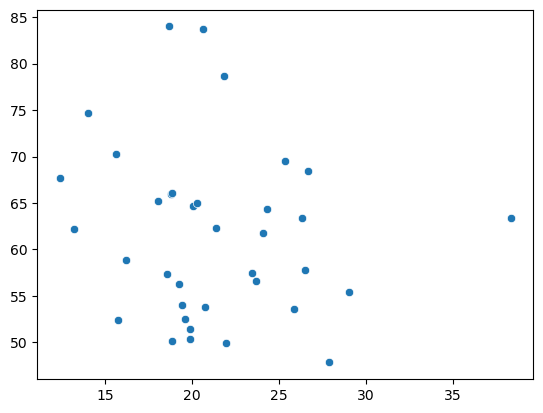

In [45]:
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
id_nnz = np.where(Ri_avg >= 1e-6)[0]
df_metab_pert_bin_pos = np.zeros(df_metab_pert.iloc[:, id_nnz].shape)
df_metab_pert_bin_neg = np.zeros(df_metab_pert.iloc[:, id_nnz].shape)
id_ = np.where(np.array(df_metab_pert.iloc[:, id_nnz]) >= 1)
df_metab_pert_bin_pos[id_] = np.array(df_metab_pert.iloc[:, id_nnz])[id_]
# df_metab_pert_bin_pos[id_] = 1
nnz_metabs_species_pos = df_metab_pert_bin_pos.sum(axis=0)

id_ = np.where(np.array(df_metab_pert.iloc[:, id_nnz]) <= -1)
df_metab_pert_bin_neg[id_] = -np.array(df_metab_pert.iloc[:, id_nnz])[id_]
# df_metab_pert_bin_neg[id_] = 1
nnz_metabs_species_neg = df_metab_pert_bin_neg.sum(axis=0)
plt_ = sns.scatterplot(x=nnz_metabs_species_pos, y=nnz_metabs_species_neg)
print(scipy.stats.pearsonr(nnz_metabs_species_pos, nnz_metabs_species_neg))

In [43]:
x = np.array(df_metab_pert)
np.min(np.abs(x[x != 0]))
nnz_metabs_species_neg.shape

(36,)

In [277]:
nnz_metabs_species_pos

array([35.,  1.,  1.,  3., 36., 35.,  0., 35., 36., 35.,  8.,  3.,  6.,
        4.,  7., 36., 35.,  1., 27., 34., 36.,  6.,  0.,  0., 34.,  2.,
       34., 35.,  0.,  5.,  1.,  7., 36.,  0., 35., 28., 31.,  6., 33.,
       34.,  0., 36., 34.,  2., 36., 32.,  1.,  3., 36., 36., 36.,  0.,
        7., 34.,  4., 32., 35.,  1.,  1.,  8.,  3., 31.,  0.])

In [129]:
id_strains_insensitive

array([ 4, 57,  6, 53, 49, 50, 48, 30, 28, 62])

In [135]:
date_ = "20230912"
date_meeting = "20230912"
date_ = "20231015"
date_meeting = "20231015"
p_vec_new_tmp = [0.1]
nrepeat = 500
change_fac_vec = np.arange(11) / 10
error_traj_list = []
np.random.seed(93837)

id_strains_sensitive = set(list(np.arange(num_species))) - \
    set(list(id_strains_insensitive))
id_strains_sensitive = np.array(list(id_strains_sensitive))

nsols = 10
solution_list = []
id_tmp = id_strains_insensitive.copy()
# id_tmp = 0
df_speciesAbun_inoc_tmp = df_speciesAbun_inoc.copy()
df_speciesAbun_inoc_tmp.iloc[id_tmp, :] = 1e-8
df_speciesAbun_tmp = df_speciesAbun_mdl.copy()
df_speciesAbun_tmp.iloc[id_tmp, :] = 1e-8
df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy()
df_speciesAbun_prev_tmp.iloc[id_tmp, :] = 1e-8
df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy()
df_speciesAbun_ratio_tmp.iloc[id_tmp, :] = 1
# id_metabs_keep = metabs_to_remove_knockdown_species(df_speciesMetab_cluster, \
#                                             [id_tmp])
# for count_, id_ in enumerate(id_strains_insensitive):
#     id_tmp = metabs_to_remove_knockdown_species(df_speciesMetab_cluster, \
#                                                 [id_], \
#                                                 id_strains_sensitive)
#     if count_ == 0:
#         id_metabs_keep = list(id_tmp.copy())
#     else:
#         id_metabs_keep = list(set(list(id_metabs_keep)).intersection(set(list(id_tmp.copy()))))
count_p = 0
id_metabs_keep = np.arange(df_speciesMetab_cluster.shape[1])
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg = Ri_avg[id_metabs_keep]
Ri_avg[Ri_avg <= 1e-12] = 1e-12
Ri_avg_init = Ri_avg.copy()
Ri_fit = {0: Ri_avg}

num_metabs_clust = df_speciesMetab_cluster.shape[1] - 1
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_tmp = df_speciesMetab_tmp.iloc[:, id_metabs_keep]
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_tmp.iloc[:, id_metabs_keep]

for n_ in range(nsols):
    count_p = 0
#     Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
    Ri_avg = Ri_avg_init.copy()
    num_metabs = df_speciesMetab_tmp.shape[1]
    solution = Ri_avg.copy()
    solution[solution <= 1e-12] = 1e-12
    error_traj = np.zeros((nrepeat))
    for rep_ in range(nrepeat):
        out = Parallel(n_jobs=12, verbose=0, pre_dispatch='1.5*n_jobs')(
            delayed(objective_fn_new)(df_speciesMetab_tmp, df_speciesMetab_prod_tmp, \
                                      Ri_avg, solution.copy(), sample_, p_vec_new_tmp, \
                                      df_speciesAbun_inoc_tmp, \
                                      df_speciesAbun_tmp, df_speciesAbun_prev_tmp, \
                                      df_speciesAbun_ratio_tmp, \
                                      B_alone_iter, species_names, \
                                      num_iter=10, count_p=0, pass_=2, \
                                      num_passages=6, \
                                      id_species_sensitive=id_strains_sensitive, \
                                      change_fac=0.1, iter_=rep_, Ri_max=1, \
                                      iter_max=nrepeat) \
            for sample_ in range(num_metabs))
        error_metabs = np.zeros((num_metabs))
#         count_ = 0
#         for sample_, c_ in product(range(num_metabs), range(len(change_fac_vec))):
#             d = out[count_]
#             error_metabs[sample_, c_] = d['error'].copy()
#             count_ += 1
        for count_a, d in enumerate(out):
            error_metabs[count_a] = d['error'].copy()
        error_metabs[np.isnan(error_metabs)] = 10000
        id_metab = np.where(error_metabs == np.min(error_metabs))[0][0]
#         id_metab = id_min[0][0]
#         id_change = id_min[1][0]
        error_traj[rep_] = np.min(error_metabs)
        print(f'repeat = {n_}, loop = {rep_}, error = {np.min(error_metabs)}')
#         count_ = 0
#         for sample_, c_ in product(range(num_metabs), range(len(change_fac_vec))):
#             if sample_ == id_metab:
#                 solution = d['Ri'].copy()
#             count_ += 1
        for count_a, d in enumerate(out):
            if count_a == id_metab:
                solution = d['Ri'].copy()
    solution_list.append(solution)
    error_traj_list.append(error_traj)

    save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                'predictions', 'leaveOneOut', \
                                f'{date_meeting}_for_paper_' + \
                                f'_Ri_fit_dynamic_with_production' + \
                                f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                f'_pass_1to2'))
    if not os.path.exists(save_dir):
       # Create a new directory because it does not exist
       os.makedirs(save_dir)
    file_save = os.path.abspath(os.path.join(save_dir, 
                                             f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                             f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                             f'_iterate_Balone_adjusted_fitted_Ri_for_uniform_dist.pickle'))

    Ri_adjust_obj = {"solution_list" : solution_list, \
                     "error_traj_list" : error_traj_list}
    with open(file_save, "wb") as file_:
         pickle.dump(Ri_adjust_obj, file_) 

repeat = 0, loop = 0, error = 2.3937924907021353
repeat = 0, loop = 1, error = 2.337046477086966
repeat = 0, loop = 2, error = 2.292937891899969
repeat = 0, loop = 3, error = 2.2015641978957023
repeat = 0, loop = 4, error = 2.1654510698004783
repeat = 0, loop = 5, error = 2.1332127607122
repeat = 0, loop = 6, error = 2.09487427332524
repeat = 0, loop = 7, error = 2.0690159490584987
repeat = 0, loop = 8, error = 2.0573842902671062
repeat = 0, loop = 9, error = 2.0526578624715275
repeat = 0, loop = 10, error = 2.0443274210565976
repeat = 0, loop = 11, error = 2.044115823789245
repeat = 0, loop = 12, error = 2.031697456318892
repeat = 0, loop = 13, error = 2.014411957845781
repeat = 0, loop = 14, error = 2.0043630428148265
repeat = 0, loop = 15, error = 1.9885334300616273
repeat = 0, loop = 16, error = 1.9787331590389101
repeat = 0, loop = 17, error = 1.9781856114607415
repeat = 0, loop = 18, error = 1.9738612320106388
repeat = 0, loop = 19, error = 1.9738581706167464
repeat = 0, loop = 2

repeat = 0, loop = 164, error = 1.5256165853606831
repeat = 0, loop = 165, error = 1.5256165841765497
repeat = 0, loop = 166, error = 1.5256155179051512
repeat = 0, loop = 167, error = 1.525615412069437
repeat = 0, loop = 168, error = 1.5256152786887132
repeat = 0, loop = 169, error = 1.525614220335368
repeat = 0, loop = 170, error = 1.525603559197543
repeat = 0, loop = 171, error = 1.5254971117790486
repeat = 0, loop = 172, error = 1.5244489073810263
repeat = 0, loop = 173, error = 1.5244382744676401
repeat = 0, loop = 174, error = 1.51546556528866
repeat = 0, loop = 175, error = 1.5107413058935613
repeat = 0, loop = 176, error = 1.5101419992209337
repeat = 0, loop = 177, error = 1.5100000291673226
repeat = 0, loop = 178, error = 1.5085848541880018
repeat = 0, loop = 179, error = 1.508584749378163
repeat = 0, loop = 180, error = 1.5085846975080868
repeat = 0, loop = 181, error = 1.4948780184171127
repeat = 0, loop = 182, error = 1.3958376661871856
repeat = 0, loop = 183, error = 1.395

repeat = 0, loop = 326, error = 1.2448626406307373
repeat = 0, loop = 327, error = 1.2448610349549845
repeat = 0, loop = 328, error = 1.2448610133491784
repeat = 0, loop = 329, error = 1.2448610112878173
repeat = 0, loop = 330, error = 1.244844958230672
repeat = 0, loop = 331, error = 1.2446847960257406
repeat = 0, loop = 332, error = 1.244684795950054
repeat = 0, loop = 333, error = 1.2446847947213435
repeat = 0, loop = 334, error = 1.2431195004587845
repeat = 0, loop = 335, error = 1.2306533779728932
repeat = 0, loop = 336, error = 1.2305089785012677
repeat = 0, loop = 337, error = 1.2305089777832907
repeat = 0, loop = 338, error = 1.2305089769188513
repeat = 0, loop = 339, error = 1.230508976805931
repeat = 0, loop = 340, error = 1.2305089681615458
repeat = 0, loop = 341, error = 1.2305089677657255
repeat = 0, loop = 342, error = 1.2305089675282364
repeat = 0, loop = 343, error = 1.2305088810853655
repeat = 0, loop = 344, error = 1.230508016755005
repeat = 0, loop = 345, error = 1.2

repeat = 0, loop = 488, error = 1.2148079094218218
repeat = 0, loop = 489, error = 1.2148079094218214
repeat = 0, loop = 490, error = 1.214807909421821
repeat = 0, loop = 491, error = 1.2148079094218207
repeat = 0, loop = 492, error = 1.2148079094218207
repeat = 0, loop = 493, error = 1.2148079094218207
repeat = 0, loop = 494, error = 1.2148079094227433
repeat = 0, loop = 495, error = 1.2148079094238757
repeat = 0, loop = 496, error = 1.2148079094232578
repeat = 0, loop = 497, error = 1.2148079094232576
repeat = 0, loop = 498, error = 1.2148079094232578
repeat = 0, loop = 499, error = 1.2148079094230844
repeat = 1, loop = 0, error = 2.3937924907021353
repeat = 1, loop = 1, error = 2.337046477086966
repeat = 1, loop = 2, error = 2.292937891899969
repeat = 1, loop = 3, error = 2.249368914971578
repeat = 1, loop = 4, error = 2.1745252210009873
repeat = 1, loop = 5, error = 2.1332127607122
repeat = 1, loop = 6, error = 2.09487427332524
repeat = 1, loop = 7, error = 2.0690159490584987
repea

repeat = 1, loop = 152, error = 1.537961041880288
repeat = 1, loop = 153, error = 1.537757122484875
repeat = 1, loop = 154, error = 1.5377571027994053
repeat = 1, loop = 155, error = 1.5358438493263622
repeat = 1, loop = 156, error = 1.5358438479590677
repeat = 1, loop = 157, error = 1.5358438478533107
repeat = 1, loop = 158, error = 1.535843846787107
repeat = 1, loop = 159, error = 1.5358438361250686
repeat = 1, loop = 160, error = 1.525857005981025
repeat = 1, loop = 161, error = 1.5256487631250373
repeat = 1, loop = 162, error = 1.5256487629573472
repeat = 1, loop = 163, error = 1.5256486566469043
repeat = 1, loop = 164, error = 1.5256475935588885
repeat = 1, loop = 165, error = 1.5256475147670845
repeat = 1, loop = 166, error = 1.5256475137083447
repeat = 1, loop = 167, error = 1.5256368844605368
repeat = 1, loop = 168, error = 1.5256368470352972
repeat = 1, loop = 169, error = 1.5255307185158664
repeat = 1, loop = 170, error = 1.52448570700465
repeat = 1, loop = 171, error = 1.524

repeat = 1, loop = 314, error = 1.305976149254686
repeat = 1, loop = 315, error = 1.3052689605345285
repeat = 1, loop = 316, error = 1.3052249901248856
repeat = 1, loop = 317, error = 1.3052249243879086
repeat = 1, loop = 318, error = 1.305224318783826
repeat = 1, loop = 319, error = 1.305224318780126
repeat = 1, loop = 320, error = 1.30520406139358
repeat = 1, loop = 321, error = 1.3052032037188135
repeat = 1, loop = 322, error = 1.305203203682757
repeat = 1, loop = 323, error = 1.3051931481516879
repeat = 1, loop = 324, error = 1.3051878250553182
repeat = 1, loop = 325, error = 1.3051878246975714
repeat = 1, loop = 326, error = 1.305187823931971
repeat = 1, loop = 327, error = 1.3051878203545144
repeat = 1, loop = 328, error = 1.3051848754975297
repeat = 1, loop = 329, error = 1.3051831967943126
repeat = 1, loop = 330, error = 1.3051831611211926
repeat = 1, loop = 331, error = 1.3051831611187987
repeat = 1, loop = 332, error = 1.305182804457042
repeat = 1, loop = 333, error = 1.30517

repeat = 1, loop = 476, error = 1.2719470761406502
repeat = 1, loop = 477, error = 1.2719470761405764
repeat = 1, loop = 478, error = 1.271947076140477
repeat = 1, loop = 479, error = 1.2719470761404075
repeat = 1, loop = 480, error = 1.2719470761403178
repeat = 1, loop = 481, error = 1.271947076140266
repeat = 1, loop = 482, error = 1.2719470761401757
repeat = 1, loop = 483, error = 1.2719470761401226
repeat = 1, loop = 484, error = 1.271947076140074
repeat = 1, loop = 485, error = 1.2719470761400185
repeat = 1, loop = 486, error = 1.2719470761399643
repeat = 1, loop = 487, error = 1.2719470761399208
repeat = 1, loop = 488, error = 1.2719470761398877
repeat = 1, loop = 489, error = 1.2719470761398552
repeat = 1, loop = 490, error = 1.2719470761398253
repeat = 1, loop = 491, error = 1.271947076139805
repeat = 1, loop = 492, error = 1.2719470761397633
repeat = 1, loop = 493, error = 1.2719470761397358
repeat = 1, loop = 494, error = 1.2719470761397165
repeat = 1, loop = 495, error = 1.2

repeat = 2, loop = 140, error = 1.631004199763198
repeat = 2, loop = 141, error = 1.6310041859442832
repeat = 2, loop = 142, error = 1.6309989338950484
repeat = 2, loop = 143, error = 1.630946433100846
repeat = 2, loop = 144, error = 1.6309464057609662
repeat = 2, loop = 145, error = 1.6304233633006002
repeat = 2, loop = 146, error = 1.6253852619434326
repeat = 2, loop = 147, error = 1.625385250040003
repeat = 2, loop = 148, error = 1.5907721901473972
repeat = 2, loop = 149, error = 1.580581307272494
repeat = 2, loop = 150, error = 1.5800944469392508
repeat = 2, loop = 151, error = 1.5800835718282267
repeat = 2, loop = 152, error = 1.5742282266401377
repeat = 2, loop = 153, error = 1.5742282222746355
repeat = 2, loop = 154, error = 1.574223641854778
repeat = 2, loop = 155, error = 1.5741782958355337
repeat = 2, loop = 156, error = 1.5741444719181577
repeat = 2, loop = 157, error = 1.5737376684647308
repeat = 2, loop = 158, error = 1.572644305576718
repeat = 2, loop = 159, error = 1.572

repeat = 2, loop = 302, error = 1.3509498015525365
repeat = 2, loop = 303, error = 1.3509239781181879
repeat = 2, loop = 304, error = 1.3509239231142243
repeat = 2, loop = 305, error = 1.3506727896540263
repeat = 2, loop = 306, error = 1.3488240541831007
repeat = 2, loop = 307, error = 1.3488231386683154
repeat = 2, loop = 308, error = 1.3488143176815377
repeat = 2, loop = 309, error = 1.348814186875816
repeat = 2, loop = 310, error = 1.3488141084886311
repeat = 2, loop = 311, error = 1.3487579034967991
repeat = 2, loop = 312, error = 1.3487578554593462
repeat = 2, loop = 313, error = 1.3487578554374835
repeat = 2, loop = 314, error = 1.3487578552188546
repeat = 2, loop = 315, error = 1.3487578264090845
repeat = 2, loop = 316, error = 1.3487578091277932
repeat = 2, loop = 317, error = 1.3487578069415085
repeat = 2, loop = 318, error = 1.3487577850786692
repeat = 2, loop = 319, error = 1.3487575664510292
repeat = 2, loop = 320, error = 1.3487575664328595
repeat = 2, loop = 321, error = 

repeat = 2, loop = 464, error = 1.241398647701987
repeat = 2, loop = 465, error = 1.24139864770196
repeat = 2, loop = 466, error = 1.2413986477019534
repeat = 2, loop = 467, error = 1.2413986477019374
repeat = 2, loop = 468, error = 1.241398647701927
repeat = 2, loop = 469, error = 1.241398647701917
repeat = 2, loop = 470, error = 1.2413986477019066
repeat = 2, loop = 471, error = 1.2413986477019001
repeat = 2, loop = 472, error = 1.2413986477018941
repeat = 2, loop = 473, error = 1.2413986477018892
repeat = 2, loop = 474, error = 1.2413986477018868
repeat = 2, loop = 475, error = 1.2413986477018857
repeat = 2, loop = 476, error = 1.241398647701882
repeat = 2, loop = 477, error = 1.2413986477018788
repeat = 2, loop = 478, error = 1.241398647701877
repeat = 2, loop = 479, error = 1.2413986477018732
repeat = 2, loop = 480, error = 1.2413986477018708
repeat = 2, loop = 481, error = 1.2413986477018688
repeat = 2, loop = 482, error = 1.2413986477018675
repeat = 2, loop = 483, error = 1.2413

repeat = 3, loop = 128, error = 1.537745181604174
repeat = 3, loop = 129, error = 1.5377451815060081
repeat = 3, loop = 130, error = 1.5377451805243514
repeat = 3, loop = 131, error = 1.5358320026999595
repeat = 3, loop = 132, error = 1.5258457236888898
repeat = 3, loop = 133, error = 1.5256370133785753
repeat = 3, loop = 134, error = 1.5256370046495968
repeat = 3, loop = 135, error = 1.5255308763343804
repeat = 3, loop = 136, error = 1.5255307704108334
repeat = 3, loop = 137, error = 1.5244857604798623
repeat = 3, loop = 138, error = 1.52448469676229
repeat = 3, loop = 139, error = 1.5244740599464746
repeat = 3, loop = 140, error = 1.5244740598768547
repeat = 3, loop = 141, error = 1.5244739437502566
repeat = 3, loop = 142, error = 1.524473856810606
repeat = 3, loop = 143, error = 1.5244738048757924
repeat = 3, loop = 144, error = 1.5244737787299156
repeat = 3, loop = 145, error = 1.524367446573439
repeat = 3, loop = 146, error = 1.5233077165830595
repeat = 3, loop = 147, error = 1.51

repeat = 3, loop = 290, error = 1.2989033910421721
repeat = 3, loop = 291, error = 1.296825209170187
repeat = 3, loop = 292, error = 1.2918085082002158
repeat = 3, loop = 293, error = 1.2882038518550203
repeat = 3, loop = 294, error = 1.281335180709683
repeat = 3, loop = 295, error = 1.2812194392692207
repeat = 3, loop = 296, error = 1.2779327136877177
repeat = 3, loop = 297, error = 1.2779306786018385
repeat = 3, loop = 298, error = 1.2779105417040575
repeat = 3, loop = 299, error = 1.2779105413495457
repeat = 3, loop = 300, error = 1.2779105144632306
repeat = 3, loop = 301, error = 1.2777299795645058
repeat = 3, loop = 302, error = 1.2775443441836265
repeat = 3, loop = 303, error = 1.2775443441784513
repeat = 3, loop = 304, error = 1.2775443439620318
repeat = 3, loop = 305, error = 1.2775443438321799
repeat = 3, loop = 306, error = 1.2775443436329124
repeat = 3, loop = 307, error = 1.2775443435550016
repeat = 3, loop = 308, error = 1.277544343503251
repeat = 3, loop = 309, error = 1.

repeat = 3, loop = 452, error = 1.2770394668966538
repeat = 3, loop = 453, error = 1.2770394668966532
repeat = 3, loop = 454, error = 1.277039466896653
repeat = 3, loop = 455, error = 1.2770394668966527
repeat = 3, loop = 456, error = 1.277039466896653
repeat = 3, loop = 457, error = 1.2770394668966527
repeat = 3, loop = 458, error = 1.2770394668966527
repeat = 3, loop = 459, error = 1.2770394668966527
repeat = 3, loop = 460, error = 1.2770394668966525
repeat = 3, loop = 461, error = 1.2770394668966523
repeat = 3, loop = 462, error = 1.2770394668966523
repeat = 3, loop = 463, error = 1.2770394668966523
repeat = 3, loop = 464, error = 1.2770394668966523
repeat = 3, loop = 465, error = 1.277039466896652
repeat = 3, loop = 466, error = 1.277039466896652
repeat = 3, loop = 467, error = 1.277039466896652
repeat = 3, loop = 468, error = 1.277039466896652
repeat = 3, loop = 469, error = 1.277039466896652
repeat = 3, loop = 470, error = 1.277039466896652
repeat = 3, loop = 471, error = 1.27703

repeat = 4, loop = 116, error = 1.5735692908935108
repeat = 4, loop = 117, error = 1.5732797624188966
repeat = 4, loop = 118, error = 1.5710046989931084
repeat = 4, loop = 119, error = 1.5708848909547346
repeat = 4, loop = 120, error = 1.5708161605551225
repeat = 4, loop = 121, error = 1.5708161577991384
repeat = 4, loop = 122, error = 1.5707760237258972
repeat = 4, loop = 123, error = 1.570744446205949
repeat = 4, loop = 124, error = 1.5707208101147678
repeat = 4, loop = 125, error = 1.570442240610352
repeat = 4, loop = 126, error = 1.5701520784122691
repeat = 4, loop = 127, error = 1.5701305568473416
repeat = 4, loop = 128, error = 1.570116181732137
repeat = 4, loop = 129, error = 1.5701076076842682
repeat = 4, loop = 130, error = 1.5701024815547264
repeat = 4, loop = 131, error = 1.5700994124499528
repeat = 4, loop = 132, error = 1.5700994122186804
repeat = 4, loop = 133, error = 1.5700994099059578
repeat = 4, loop = 134, error = 1.5700994096916023
repeat = 4, loop = 135, error = 1.

repeat = 4, loop = 278, error = 1.11298056480561
repeat = 4, loop = 279, error = 1.112954321622744
repeat = 4, loop = 280, error = 1.1129543205499417
repeat = 4, loop = 281, error = 1.1129543204935073
repeat = 4, loop = 282, error = 1.11295430976549
repeat = 4, loop = 283, error = 1.1129358165937675
repeat = 4, loop = 284, error = 1.1129357093430723
repeat = 4, loop = 285, error = 1.1129276809329647
repeat = 4, loop = 286, error = 1.1129266086003324
repeat = 4, loop = 287, error = 1.1129266085523413
repeat = 4, loop = 288, error = 1.1129158900361935
repeat = 4, loop = 289, error = 1.1129119191119985
repeat = 4, loop = 290, error = 1.1129097962015275
repeat = 4, loop = 291, error = 1.1129086074825096
repeat = 4, loop = 292, error = 1.1128019135464386
repeat = 4, loop = 293, error = 1.1128019135002456
repeat = 4, loop = 294, error = 1.1117817389985
repeat = 4, loop = 295, error = 1.105302029388317
repeat = 4, loop = 296, error = 1.1052500228602415
repeat = 4, loop = 297, error = 1.104490

repeat = 4, loop = 440, error = 1.010744563334297
repeat = 4, loop = 441, error = 1.0107445633287766
repeat = 4, loop = 442, error = 1.0107445628237846
repeat = 4, loop = 443, error = 1.010742641872899
repeat = 4, loop = 444, error = 1.0107236616813076
repeat = 4, loop = 445, error = 1.010555983922215
repeat = 4, loop = 446, error = 1.0105559834558149
repeat = 4, loop = 447, error = 1.0104863207700219
repeat = 4, loop = 448, error = 1.0104863200472822
repeat = 4, loop = 449, error = 1.0104581520761888
repeat = 4, loop = 450, error = 1.010457190049817
repeat = 4, loop = 451, error = 1.0104571900412724
repeat = 4, loop = 452, error = 1.0104478963027728
repeat = 4, loop = 453, error = 1.0104478957911633
repeat = 4, loop = 454, error = 1.0104478954842133
repeat = 4, loop = 455, error = 1.0104478953852574
repeat = 4, loop = 456, error = 1.0103866774970078
repeat = 4, loop = 457, error = 1.0103866751801729
repeat = 4, loop = 458, error = 1.0103866750079165
repeat = 4, loop = 459, error = 1.0

repeat = 5, loop = 104, error = 1.6226882331125159
repeat = 5, loop = 105, error = 1.616902450881537
repeat = 5, loop = 106, error = 1.616899852488926
repeat = 5, loop = 107, error = 1.6168997751777057
repeat = 5, loop = 108, error = 1.616899002110328
repeat = 5, loop = 109, error = 1.6168912759179401
repeat = 5, loop = 110, error = 1.6168144610836612
repeat = 5, loop = 111, error = 1.616089996848241
repeat = 5, loop = 112, error = 1.616089921450723
repeat = 5, loop = 113, error = 1.6160891674819646
repeat = 5, loop = 114, error = 1.612384763093669
repeat = 5, loop = 115, error = 1.61237725794848
repeat = 5, loop = 116, error = 1.612375821812364
repeat = 5, loop = 117, error = 1.612300833293928
repeat = 5, loop = 118, error = 1.6123008330049438
repeat = 5, loop = 119, error = 1.6115571411062928
repeat = 5, loop = 120, error = 1.6047037890958225
repeat = 5, loop = 121, error = 1.6047037889231521
repeat = 5, loop = 122, error = 1.6047037861521027
repeat = 5, loop = 123, error = 1.5723194

repeat = 5, loop = 266, error = 1.3587342497932233
repeat = 5, loop = 267, error = 1.3587340281860232
repeat = 5, loop = 268, error = 1.358731812387148
repeat = 5, loop = 269, error = 1.3587096817045388
repeat = 5, loop = 270, error = 1.3587085632629066
repeat = 5, loop = 271, error = 1.3584899805844282
repeat = 5, loop = 272, error = 1.3565713230139242
repeat = 5, loop = 273, error = 1.356560105031312
repeat = 5, loop = 274, error = 1.3565601050105418
repeat = 5, loop = 275, error = 1.3565600828409423
repeat = 5, loop = 276, error = 1.3565598611456302
repeat = 5, loop = 277, error = 1.3564488681787708
repeat = 5, loop = 278, error = 1.3554519144525596
repeat = 5, loop = 279, error = 1.3554496828158624
repeat = 5, loop = 280, error = 1.3527652631325597
repeat = 5, loop = 281, error = 1.3527422713571549
repeat = 5, loop = 282, error = 1.3527422710345405
repeat = 5, loop = 283, error = 1.3527422708411
repeat = 5, loop = 284, error = 1.3525130569455326
repeat = 5, loop = 285, error = 1.35

repeat = 5, loop = 428, error = 1.119352226180245
repeat = 5, loop = 429, error = 1.1193522261694266
repeat = 5, loop = 430, error = 1.1193522260612438
repeat = 5, loop = 431, error = 1.1193522249794159
repeat = 5, loop = 432, error = 1.1193522249507737
repeat = 5, loop = 433, error = 1.1193522249520387
repeat = 5, loop = 434, error = 1.119352214133805
repeat = 5, loop = 435, error = 1.1193522141166197
repeat = 5, loop = 436, error = 1.1193522141092842
repeat = 5, loop = 437, error = 1.1193521059318068
repeat = 5, loop = 438, error = 1.1193521059214957
repeat = 5, loop = 439, error = 1.1193510246325533
repeat = 5, loop = 440, error = 1.1193510246316265
repeat = 5, loop = 441, error = 1.1193510246254381
repeat = 5, loop = 442, error = 1.119340260281035
repeat = 5, loop = 443, error = 1.1192374331854247
repeat = 5, loop = 444, error = 1.1192374331816057
repeat = 5, loop = 445, error = 1.1192374331777752
repeat = 5, loop = 446, error = 1.1192374331754835
repeat = 5, loop = 447, error = 1.

repeat = 6, loop = 92, error = 1.6972268031147741
repeat = 6, loop = 93, error = 1.696884025240853
repeat = 6, loop = 94, error = 1.6968840178191704
repeat = 6, loop = 95, error = 1.696884017544969
repeat = 6, loop = 96, error = 1.696884017296227
repeat = 6, loop = 97, error = 1.696883943079472
repeat = 6, loop = 98, error = 1.6968832009194612
repeat = 6, loop = 99, error = 1.6968753424785767
repeat = 6, loop = 100, error = 1.6968679218895864
repeat = 6, loop = 101, error = 1.6968679148584762
repeat = 6, loop = 102, error = 1.6968678445473977
repeat = 6, loop = 103, error = 1.6967937139710947
repeat = 6, loop = 104, error = 1.6967930108835698
repeat = 6, loop = 105, error = 1.6960591798362081
repeat = 6, loop = 106, error = 1.6894157048093619
repeat = 6, loop = 107, error = 1.6624520897675574
repeat = 6, loop = 108, error = 1.6620618643411496
repeat = 6, loop = 109, error = 1.6620550413830377
repeat = 6, loop = 110, error = 1.6620511980499615
repeat = 6, loop = 111, error = 1.662051194

repeat = 6, loop = 254, error = 1.0826833805004954
repeat = 6, loop = 255, error = 1.082671260208068
repeat = 6, loop = 256, error = 1.0825522566776353
repeat = 6, loop = 257, error = 1.0825522566570096
repeat = 6, loop = 258, error = 1.0825522566390582
repeat = 6, loop = 259, error = 1.081564424683074
repeat = 6, loop = 260, error = 1.08156442447734
repeat = 6, loop = 261, error = 1.0815594675154219
repeat = 6, loop = 262, error = 1.0815102651629351
repeat = 6, loop = 263, error = 1.0810538135671066
repeat = 6, loop = 264, error = 1.0810538115048385
repeat = 6, loop = 265, error = 1.0791437942395377
repeat = 6, loop = 266, error = 1.0775751599593415
repeat = 6, loop = 267, error = 1.0767108966435857
repeat = 6, loop = 268, error = 1.0765984342642194
repeat = 6, loop = 269, error = 1.0754606251756438
repeat = 6, loop = 270, error = 1.0754292417529447
repeat = 6, loop = 271, error = 1.072299502026558
repeat = 6, loop = 272, error = 1.072132918502935
repeat = 6, loop = 273, error = 1.072

repeat = 6, loop = 416, error = 0.9602816234189919
repeat = 6, loop = 417, error = 0.9602039962354295
repeat = 6, loop = 418, error = 0.9594901259581726
repeat = 6, loop = 419, error = 0.9594901259503077
repeat = 6, loop = 420, error = 0.9585056244129195
repeat = 6, loop = 421, error = 0.9547442525985629
repeat = 6, loop = 422, error = 0.9547442525915418
repeat = 6, loop = 423, error = 0.9547442525213329
repeat = 6, loop = 424, error = 0.9547442518192438
repeat = 6, loop = 425, error = 0.9547442518095047
repeat = 6, loop = 426, error = 0.9547442517981679
repeat = 6, loop = 427, error = 0.9547442447772799
repeat = 6, loop = 428, error = 0.9547441745686289
repeat = 6, loop = 429, error = 0.9547434725049022
repeat = 6, loop = 430, error = 0.9547434724506901
repeat = 6, loop = 431, error = 0.9547434724181628
repeat = 6, loop = 432, error = 0.9547364540588479
repeat = 6, loop = 433, error = 0.9546664979279085
repeat = 6, loop = 434, error = 0.9546664979211179
repeat = 6, loop = 435, error =

repeat = 7, loop = 79, error = 1.700258710507758
repeat = 7, loop = 80, error = 1.7000987428555774
repeat = 7, loop = 81, error = 1.6977409404443928
repeat = 7, loop = 82, error = 1.6966065522493592
repeat = 7, loop = 83, error = 1.6966057724745234
repeat = 7, loop = 84, error = 1.6963777587877849
repeat = 7, loop = 85, error = 1.6963777585141055
repeat = 7, loop = 86, error = 1.696369979524915
repeat = 7, loop = 87, error = 1.6963699722537278
repeat = 7, loop = 88, error = 1.6962922594724958
repeat = 7, loop = 89, error = 1.6962921867627831
repeat = 7, loop = 90, error = 1.6955227105326363
repeat = 7, loop = 91, error = 1.6955227078100987
repeat = 7, loop = 92, error = 1.6885378879036468
repeat = 7, loop = 93, error = 1.6585064960695985
repeat = 7, loop = 94, error = 1.658505802883273
repeat = 7, loop = 95, error = 1.6584988712358952
repeat = 7, loop = 96, error = 1.6584295763451193
repeat = 7, loop = 97, error = 1.658403015338876
repeat = 7, loop = 98, error = 1.658402995852097
repea

repeat = 7, loop = 241, error = 1.291131912502862
repeat = 7, loop = 242, error = 1.2911318919443642
repeat = 7, loop = 243, error = 1.2897557205930337
repeat = 7, loop = 244, error = 1.269738962014065
repeat = 7, loop = 245, error = 1.267428433104659
repeat = 7, loop = 246, error = 1.267428244132734
repeat = 7, loop = 247, error = 1.265578072364743
repeat = 7, loop = 248, error = 1.2624936032037288
repeat = 7, loop = 249, error = 1.2624782076294339
repeat = 7, loop = 250, error = 1.262168629705781
repeat = 7, loop = 251, error = 1.2621102682203222
repeat = 7, loop = 252, error = 1.2620030525569266
repeat = 7, loop = 253, error = 1.2619210363620954
repeat = 7, loop = 254, error = 1.2619189500805061
repeat = 7, loop = 255, error = 1.2618981080064249
repeat = 7, loop = 256, error = 1.2618896321178068
repeat = 7, loop = 257, error = 1.261889632088797
repeat = 7, loop = 258, error = 1.2618841492485466
repeat = 7, loop = 259, error = 1.2618310157928814
repeat = 7, loop = 260, error = 1.2614

repeat = 7, loop = 403, error = 1.2175006762594525
repeat = 7, loop = 404, error = 1.2175006762594465
repeat = 7, loop = 405, error = 1.2175006762593796
repeat = 7, loop = 406, error = 1.2175006762593763
repeat = 7, loop = 407, error = 1.2175006762593727
repeat = 7, loop = 408, error = 1.2175006762593363
repeat = 7, loop = 409, error = 1.2175006762593341
repeat = 7, loop = 410, error = 1.2175006762592573
repeat = 7, loop = 411, error = 1.217500676259254
repeat = 7, loop = 412, error = 1.2175006762592209
repeat = 7, loop = 413, error = 1.2175006762592187
repeat = 7, loop = 414, error = 1.2175006762592167
repeat = 7, loop = 415, error = 1.2175006762591958
repeat = 7, loop = 416, error = 1.217500676259184
repeat = 7, loop = 417, error = 1.217500676259177
repeat = 7, loop = 418, error = 1.2175006762591605
repeat = 7, loop = 419, error = 1.2175006762591591
repeat = 7, loop = 420, error = 1.2175006762591507
repeat = 7, loop = 421, error = 1.2175006762591465
repeat = 7, loop = 422, error = 1.

repeat = 8, loop = 66, error = 1.7181780661357082
repeat = 8, loop = 67, error = 1.7181744562418253
repeat = 8, loop = 68, error = 1.7175171160436165
repeat = 8, loop = 69, error = 1.717480529354743
repeat = 8, loop = 70, error = 1.6874191905909446
repeat = 8, loop = 71, error = 1.6870452856043798
repeat = 8, loop = 72, error = 1.6870452849121544
repeat = 8, loop = 73, error = 1.6867826713111262
repeat = 8, loop = 74, error = 1.6867826708059992
repeat = 8, loop = 75, error = 1.686782665754729
repeat = 8, loop = 76, error = 1.6867826152420398
repeat = 8, loop = 77, error = 1.6828243819989668
repeat = 8, loop = 78, error = 1.6789012760712767
repeat = 8, loop = 79, error = 1.658202157245065
repeat = 8, loop = 80, error = 1.6582021103830349
repeat = 8, loop = 81, error = 1.658201385128193
repeat = 8, loop = 82, error = 1.6581941328181744
repeat = 8, loop = 83, error = 1.6581936643227113
repeat = 8, loop = 84, error = 1.6581211650575258
repeat = 8, loop = 85, error = 1.6573985503968909
repe

repeat = 8, loop = 229, error = 1.3349139658234566
repeat = 8, loop = 230, error = 1.3349134450043039
repeat = 8, loop = 231, error = 1.334908237402771
repeat = 8, loop = 232, error = 1.3349082371381924
repeat = 8, loop = 233, error = 1.3349081555548
repeat = 8, loop = 234, error = 1.3349081154264295
repeat = 8, loop = 235, error = 1.3349081127806424
repeat = 8, loop = 236, error = 1.334856095697592
repeat = 8, loop = 237, error = 1.3343417699827447
repeat = 8, loop = 238, error = 1.3343417436606269
repeat = 8, loop = 239, error = 1.3297372511893564
repeat = 8, loop = 240, error = 1.3132351859445979
repeat = 8, loop = 241, error = 1.3058691279241776
repeat = 8, loop = 242, error = 1.3021049779475993
repeat = 8, loop = 243, error = 1.2776600499475725
repeat = 8, loop = 244, error = 1.2666624005130698
repeat = 8, loop = 245, error = 1.261127871527837
repeat = 8, loop = 246, error = 1.2598027012021293
repeat = 8, loop = 247, error = 1.258675788381749
repeat = 8, loop = 248, error = 1.2586

repeat = 8, loop = 391, error = 1.204007082548905
repeat = 8, loop = 392, error = 1.2027184918765486
repeat = 8, loop = 393, error = 1.2026960124521642
repeat = 8, loop = 394, error = 1.202475106542551
repeat = 8, loop = 395, error = 1.2006316162890434
repeat = 8, loop = 396, error = 1.2006316162886492
repeat = 8, loop = 397, error = 1.2006316162644952
repeat = 8, loop = 398, error = 1.2006316160229566
repeat = 8, loop = 399, error = 1.2006316136077344
repeat = 8, loop = 400, error = 1.2006315894718422
repeat = 8, loop = 401, error = 1.2006313497455299
repeat = 8, loop = 402, error = 1.2006313497445662
repeat = 8, loop = 403, error = 1.2006291154392619
repeat = 8, loop = 404, error = 1.2006227704565677
repeat = 8, loop = 405, error = 1.2006227704566395
repeat = 8, loop = 406, error = 1.2006227704555448
repeat = 8, loop = 407, error = 1.2006227704554968
repeat = 8, loop = 408, error = 1.2006227704546109
repeat = 8, loop = 409, error = 1.2006227704543433
repeat = 8, loop = 410, error = 1

repeat = 9, loop = 54, error = 1.7478821957792428
repeat = 9, loop = 55, error = 1.7478437322732063
repeat = 9, loop = 56, error = 1.7474711213431648
repeat = 9, loop = 57, error = 1.7440807403357992
repeat = 9, loop = 58, error = 1.7437296886987756
repeat = 9, loop = 59, error = 1.743729681794713
repeat = 9, loop = 60, error = 1.7406227360485278
repeat = 9, loop = 61, error = 1.7307892924601325
repeat = 9, loop = 62, error = 1.7307537059574372
repeat = 9, loop = 63, error = 1.730714049457476
repeat = 9, loop = 64, error = 1.7307140401202428
repeat = 9, loop = 65, error = 1.7307139467891404
repeat = 9, loop = 66, error = 1.73071266901319
repeat = 9, loop = 67, error = 1.7297444570301166
repeat = 9, loop = 68, error = 1.7293166056030578
repeat = 9, loop = 69, error = 1.7293165985391257
repeat = 9, loop = 70, error = 1.7293165278998748
repeat = 9, loop = 71, error = 1.7290727657621958
repeat = 9, loop = 72, error = 1.7290599532351412
repeat = 9, loop = 73, error = 1.7289321399648732
repe

repeat = 9, loop = 217, error = 1.359074130033122
repeat = 9, loop = 218, error = 1.358882316769939
repeat = 9, loop = 219, error = 1.3572015630097067
repeat = 9, loop = 220, error = 1.3568700993720024
repeat = 9, loop = 221, error = 1.3568700602322412
repeat = 9, loop = 222, error = 1.3568700492728432
repeat = 9, loop = 223, error = 1.3539975560130328
repeat = 9, loop = 224, error = 1.3293985667658155
repeat = 9, loop = 225, error = 1.2957719155119702
repeat = 9, loop = 226, error = 1.2898349166628187
repeat = 9, loop = 227, error = 1.2727215850329556
repeat = 9, loop = 228, error = 1.2727215751154604
repeat = 9, loop = 229, error = 1.27064529819834
repeat = 9, loop = 230, error = 1.270202398072366
repeat = 9, loop = 231, error = 1.2702023979414385
repeat = 9, loop = 232, error = 1.2702023167530567
repeat = 9, loop = 233, error = 1.2702023117849526
repeat = 9, loop = 234, error = 1.2702023088312595
repeat = 9, loop = 235, error = 1.270202308799838
repeat = 9, loop = 236, error = 1.270

repeat = 9, loop = 379, error = 1.223912823973922
repeat = 9, loop = 380, error = 1.2239128239738972
repeat = 9, loop = 381, error = 1.2239128239738633
repeat = 9, loop = 382, error = 1.2239128239738446
repeat = 9, loop = 383, error = 1.2239128239738244
repeat = 9, loop = 384, error = 1.223912823973809
repeat = 9, loop = 385, error = 1.2239128239737802
repeat = 9, loop = 386, error = 1.2239128239737627
repeat = 9, loop = 387, error = 1.2239128239737507
repeat = 9, loop = 388, error = 1.2239128239737433
repeat = 9, loop = 389, error = 1.2239128239737327
repeat = 9, loop = 390, error = 1.2239128239737154
repeat = 9, loop = 391, error = 1.2239128239737047
repeat = 9, loop = 392, error = 1.2239128239736956
repeat = 9, loop = 393, error = 1.2239128239736894
repeat = 9, loop = 394, error = 1.223912823973683
repeat = 9, loop = 395, error = 1.2239128239736747
repeat = 9, loop = 396, error = 1.2239128239736667
repeat = 9, loop = 397, error = 1.2239128239736623
repeat = 9, loop = 398, error = 1.

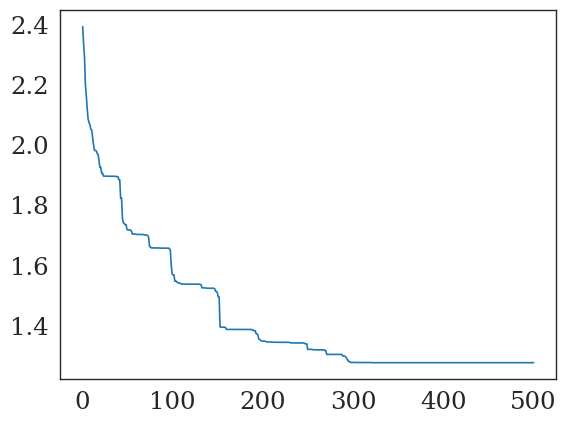

In [140]:
x = np.arange(1, nrepeat + 1)
y = error_traj_list[3].copy()
plt_ = sns.lineplot(x=x, y=y, sort=False)

In [139]:
date_ = "20231015"
date_meeting = "20231015"

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                            'predictions', 'leaveOneOut', \
                            f'{date_meeting}_for_paper_' + \
                            f'_Ri_fit_dynamic_with_production' + \
                            f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                            f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'_iterate_Balone_adjusted_fitted_Ri_for_uniform_dist.pickle'))


with open(file_save, "rb") as file_:
     Ri_adjust_obj = pickle.load(file_)
solution_list = Ri_adjust_obj['solution_list']
error_traj_list = Ri_adjust_obj['error_traj_list']

In [141]:
count_p = 0
p_vec_new_tmp = [0.1]
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
x = Ri_avg.copy()
zero_thresh_Ri = 1e-12
x[x <= zero_thresh_Ri] = zero_thresh_Ri
id_metabs_keep = []
nsols = len(solution_list)

for n_ in range(nsols):
    y = solution_list[n_].copy()
    y[y <= zero_thresh_Ri] = zero_thresh_Ri
    id_ = np.where(np.log10(y) - np.log10(x) != 0)[0]
    if n_ == 0:
        id_metabs_keep += list(id_.copy())
    else:
        id_metabs_keep = list(set(id_metabs_keep).union(set(list(id_.copy()))))

In [391]:
len(id_metabs_keep)
len(np.where(Ri_noMicrocosm_dynamicAll_fit_joint[0][id_metabs_keep] >= 1e-8)[0])

20

In [393]:
56 - 20 - 13

23

In [390]:
len(np.where(Ri_noMicrocosm_dynamicAll_fit_joint[0] >= 1e-8)[0])

38

In [156]:
count_p = 0
p_vec_new_tmp = [0.1]
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
x = Ri_avg.copy()
zero_thresh_Ri = 1e-12
x[x <= zero_thresh_Ri] = zero_thresh_Ri
df_tmp = pd.DataFrame()
df_tmp_abs = pd.DataFrame()
df_tmp_full = pd.DataFrame()
for n_ in range(nsols):
    y = solution_list[n_].copy()
    y[y <= zero_thresh_Ri] = zero_thresh_Ri
    df_tmp[f'repeat_{n_ + 1}'] = np.log10(y[id_metabs_keep].copy()) - \
        np.log10(x[id_metabs_keep].copy())
    df_tmp_abs[f'repeat_{n_ + 1}'] = np.log10(y[id_metabs_keep].copy())
    df_tmp_full[f'repeat_{n_ + 1}'] = np.log10(y[:].copy())
df_tmp.index = df_metabs_clusters['cluser_metab_names'].values[id_metabs_keep]
df_tmp.index = np.array(id_metabs_keep) + 1
df_tmp_abs.index = df_metabs_clusters['cluser_metab_names'].values[id_metabs_keep]
df_tmp_abs.index = np.array(id_metabs_keep) + 1
# df_tmp_full.index = df_metabs_clusters['cluser_metab_names'].values[id_metabs_keep]
df_tmp_full.index = np.arange(df_tmp_full.shape[0]) + 1

In [144]:
df_tmp_abs
# id_metabs_keep

,repeat_1,repeat_2,repeat_3,repeat_4,repeat_5,repeat_6,repeat_7,repeat_8,repeat_9,repeat_10
1,-2.000000,-2.000000,-2.000000,-2.000000,-1.000000,-2.000000,-1.000000,-2.000000,-2.000000,-2.000000
4,-12.000000,-11.982499,-4.600000,-12.000000,-2.000000,-11.995298,-2.000000,-12.000000,-12.000000,-12.000000
6,-2.000000,-2.000000,-2.000000,-2.000000,-12.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000
9,-12.000000,-12.000000,-12.000000,-12.000000,-12.000000,-12.000000,-12.000000,-11.999998,-12.000000,-12.000000
12,-4.000000,-4.000000,-4.000000,-4.000000,-3.000000,-3.000000,-3.000000,-4.000000,-4.000000,-4.000000
13,-12.000000,-12.000000,-4.776051,-12.000000,-2.626752,-3.963200,-3.000000,-12.000000,-11.999998,-12.000000
14,-11.639153,-12.000000,-11.988616,-12.000000,-12.000000,-12.000000,-12.000000,-11.936489,-11.998570,-11.999898
15,-12.000000,-12.000000,-12.000000,-12.000000,-11.922240,-12.000000,-12.000000,-12.000000,-11.999998,-12.000000
17,-1.762554,-1.762554,-1.762554,-1.762554,-1.762554,-2.002554,-1.762554,-1.762554,-1.762554,-1.762554
18,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.000000,-4.200000,-4.000000,-4.000000,-4.000000


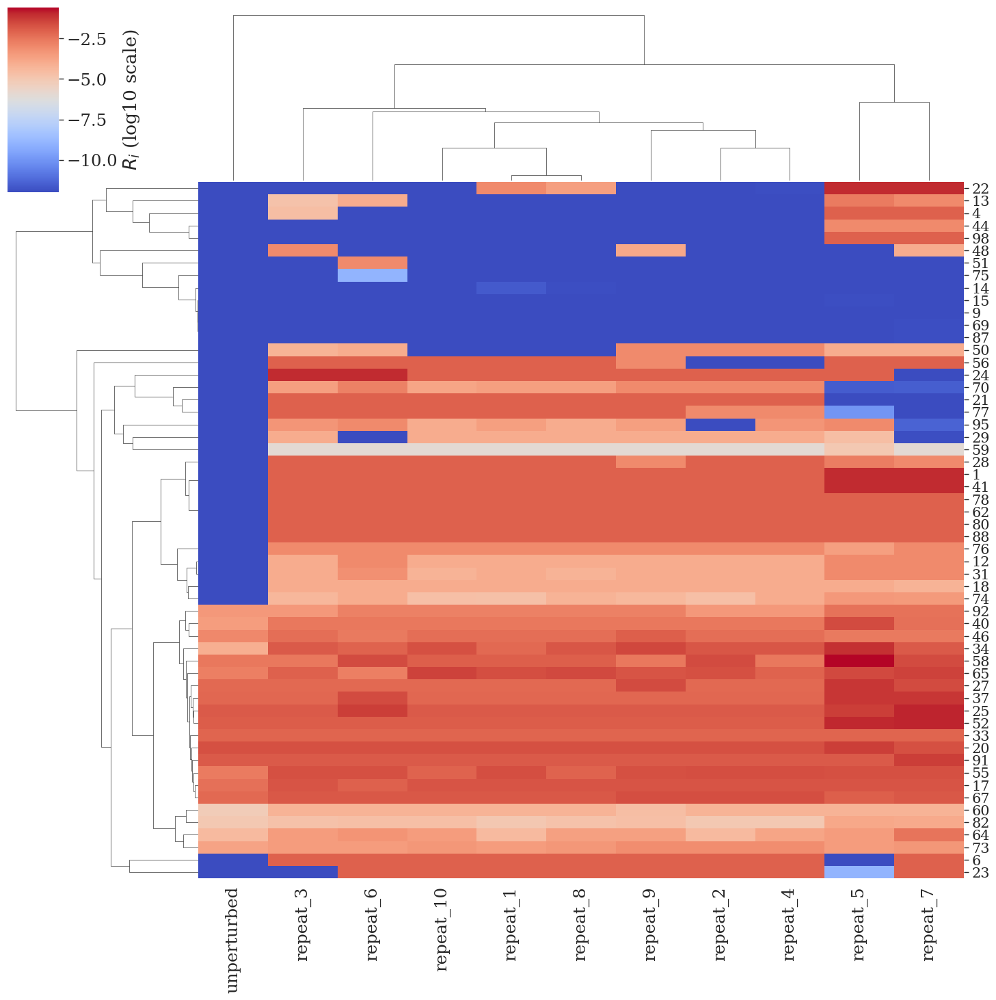

In [188]:
date_ = '20230912'
date_meeting = '20230912'
date_ = "20231015"
date_meeting = "20231015"
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
red_ = '#e41a1c'
blue_ = '#4daf4a'
df_copy = df_tmp_abs.copy()
count_p = 0
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
x = Ri_avg.copy()
zero_thresh_Ri = 1e-12
x[x <= zero_thresh_Ri] = zero_thresh_Ri
df_copy['unperturbed'] = np.log10(x[id_metabs_keep])
plt_ = sns.clustermap(df_copy, \
                      cmap="coolwarm", figsize=(15, 15), \
                      metric=distance_metric, xticklabels=True, yticklabels=True, \
                      cbar_kws={'shrink': 0.1, 'label': r'$R_i$ (log10 scale)'})
plt.setp(plt_.ax_heatmap.get_yticklabels(), rotation=0, fontsize=15)
# plt_.legend(title=r'$R_i$ (log scale)', fontsize=12)
# colorbar_title = plt_.cax.set_title(r'$R_i$ (log scale)', pad=20)
# colorbar_title.set_ha('left')

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'change_Ri_for_equal_' + \
                                         f'abundances_metab_heatmap_new.svg'))
# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'change_Ri_for_equal_' + \
#                                          f'abundances_metab_heatmap.png'))

plt.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close()

In [182]:
date_ = "20231015"
date_meeting = "20231015"
count_p = 0
p_vec_new_tmp = [0.1]
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
x = Ri_avg.copy()
zero_thresh_Ri = 1e-12
x[x <= zero_thresh_Ri] = zero_thresh_Ri

avg_changed_ = np.median(np.array(df_tmp_abs), axis=1)
x[id_metabs_keep] = 10**avg_changed_.copy()
Ri_pert = x.copy()
# x = 10.0**np.mean(np.array(df_tmp_full.copy()), axis=1)
Ri_fit = {0: x.copy()}


id_strains_sensitive = set(list(np.arange(num_species))) - \
    set(list(id_strains_insensitive))
id_strains_sensitive = np.array(list(id_strains_sensitive))
id_tmp = id_strains_insensitive.copy()

df_speciesAbun_inoc_tmp = df_speciesAbun_inoc.copy()
df_speciesAbun_inoc_tmp.iloc[id_tmp, :] = 1e-8
df_speciesAbun_inoc_tmp = normalize_columns(df_speciesAbun_inoc_tmp.copy())
df_speciesAbun_inoc_tmp.iloc[id_tmp, :] = 1e-8

df_speciesAbun_tmp = df_speciesAbun_mdl.copy()
df_speciesAbun_tmp.iloc[id_tmp, :] = 1e-8
df_speciesAbun_tmp = normalize_columns(df_speciesAbun_tmp.copy())
df_speciesAbun_tmp.iloc[id_tmp, :] = 1e-8

df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy()
df_speciesAbun_prev_tmp.iloc[id_tmp, :] = 1e-8
df_speciesAbun_prev_tmp = normalize_columns(df_speciesAbun_prev_tmp.copy())
df_speciesAbun_prev_tmp.iloc[id_tmp, :] = 1e-8

df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy()
df_speciesAbun_ratio_tmp.iloc[id_tmp, :] = 1

num_metabs_clust = df_speciesMetab_cluster.shape[1] - 1
df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
num_iter_1 = 100
sens_obj_uni_avg, RMSE_obj_all_prod = \
    blindly_pred_abun_growth(p_vec_new_tmp, df_speciesMetab_tmp, \
                             df_speciesAbun_inoc_tmp, df_speciesAbun_tmp, \
                             df_speciesAbun_prev_tmp, \
                             df_speciesAbun_ratio_tmp, \
                             Ri_fit, "dummy", "dummy", \
                             "dummy", num_passages=6, num_iter=100, \
                             thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                             save_data_obj=False, \
                             return_sensitivity_ana=True, \
                             get_prod=True, B_alone=B_alone_iter[num_iter_1 - 2], \
                             df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                             prod_use_prev=False, num_passages_run=3, \
                             use_dilution=True, \
                             dilution_factor=15000, \
                             id_species_update=id_strains_sensitive, \
                             use_avg_for_prod=False)
pass_ = 2
pred_dist_all = sens_obj_uni_avg[pass_]['df_speciesAbun_next_pred'].copy()
pred_dist_all[pred_dist_all <= 1e-8] = 1e-8
species_names_all = sens_obj_uni_avg[pass_]['species_names']
id_species_rep = np.arange(num_species) * 3
pred_dist = pred_dist_all[id_species_rep]
# pred_dist = np.zeros((num_species))
# for species_ in range(num_species):
#     id_ = np.array([0, 1, 2]) + species_ * 3
#     pred_dist[species_] = np.exp(np.mean(np.log(pred_dist_all[id_])))

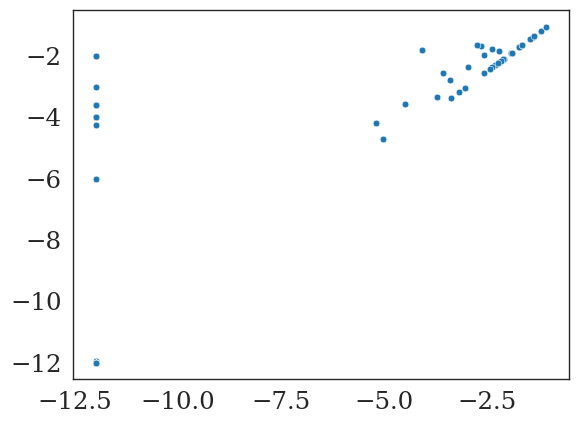

In [184]:
x = Ri_avg.copy()
x[x <= zero_thresh_Ri] = zero_thresh_Ri
y = Ri_pert.copy()
y[y <= zero_thresh_Ri] = zero_thresh_Ri
plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y))

In [160]:
pred_dist[id_strains_sensitive]
# len(x)

array([5.22046093e-04, 7.73948838e-02, 1.64890482e-02, 1.49004496e-02,
       4.55634919e-03, 1.15553548e-02, 3.28031160e-04, 1.00331423e-02,
       1.40481242e-03, 3.43742958e-03, 4.08218570e-04, 9.42132905e-03,
       2.94668393e-03, 9.45846876e-06, 3.04388503e-04, 9.46400495e-04,
       8.57314282e-02, 4.66190239e-02, 9.63881056e-07, 6.33537377e-02,
       4.91520370e-02, 1.17996824e-01, 2.06016522e-05, 5.02437593e-03,
       8.74575600e-04, 1.03183670e-03, 2.68366254e-02, 2.63512433e-02,
       2.16763897e-01, 1.56411743e-02, 4.58325003e-03, 1.72410836e-02,
       3.72970953e-04, 2.30156164e-02, 2.55892476e-04, 1.09031726e-03,
       1.70918969e-03, 2.35123314e-06, 4.67356293e-04, 5.69968205e-04,
       2.58167530e-05, 2.67482115e-02, 1.88196700e-02, 1.74934125e-06,
       5.73840482e-02, 2.65246318e-04, 2.47283356e-03, 1.11377094e-03,
       2.67138538e-02, 1.65414817e-03, 6.69179225e-06, 1.19900973e-03,
       4.23058254e-03])

TtestResult(statistic=-5.763885875267941, pvalue=4.53200946636683e-07, df=52)


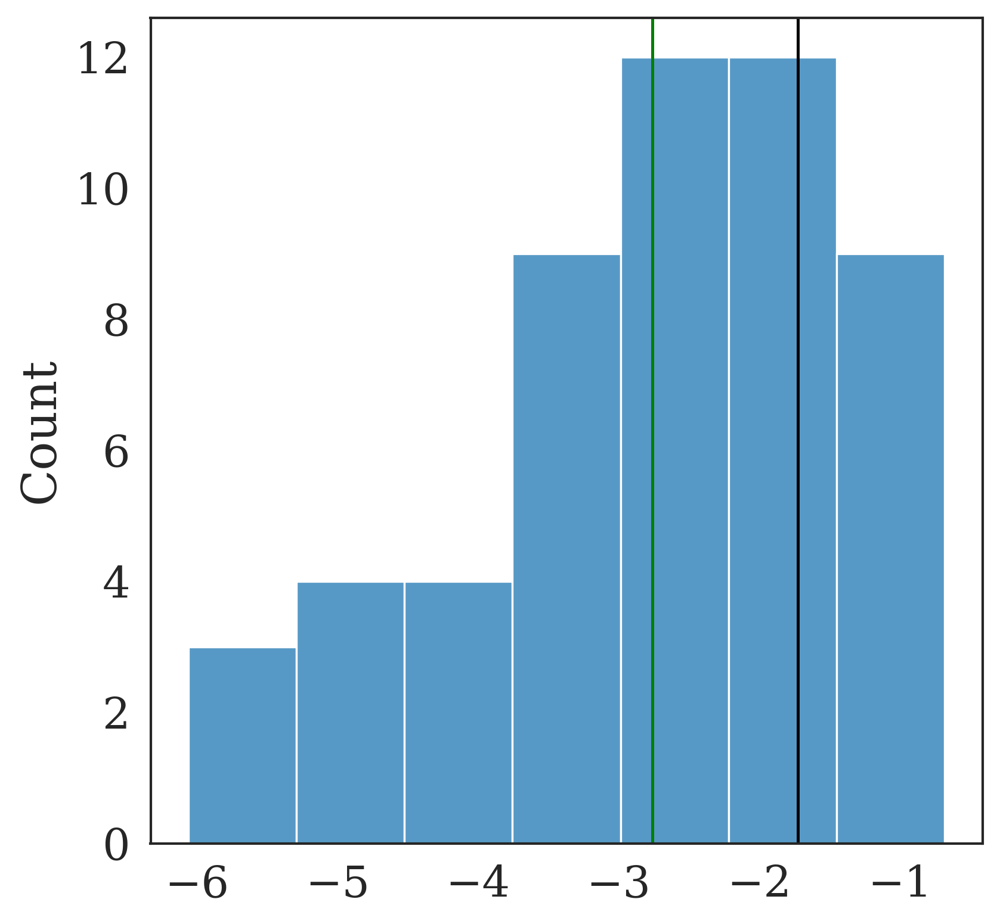

In [199]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
plt.figure(figsize=(6, 6), dpi=300)
x = (pred_dist[id_strains_sensitive])
x /= np.sum(x)
x = np.log10(x)
print(scipy.stats.ttest_1samp(x, np.log10(1 / len(id_strains_sensitive))))
plt_ = sns.histplot(x, bins=7)
plt_.axvline(x=np.log10(1 / len(id_strains_sensitive)), c="black")
plt_.axvline(x=np.mean(x), c="green")

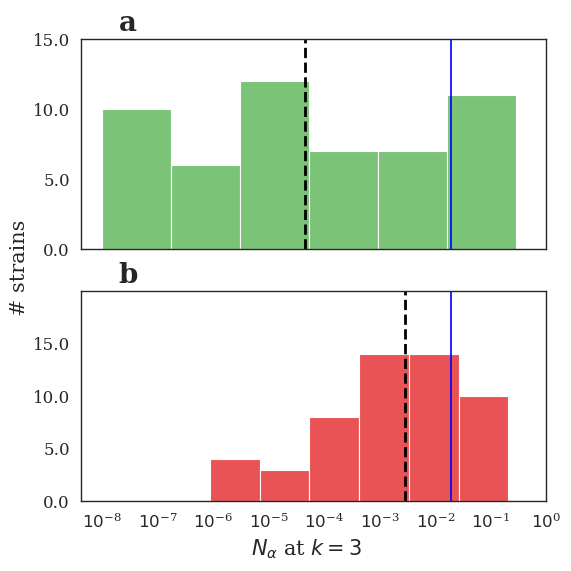

In [201]:
date_ = '20230912'
date_meeting = '20230912'
date_ = "20231015"
date_meeting = "20231015"
red_ = '#e41a1c'
blue_ = '#4daf4a'
num_iter = 100
id_select = 0 + np.arange(num_species) * 3
pass_ = 2
x_pred = sens_obj_uni_avg[pass_]['df_speciesAbun_next_pred'][id_select].copy()
x_obs = sens_obj_all_prod[pass_]['df_speciesAbun_next_pred'][id_select].copy()
x_pred[x_pred <= 1e-8] = 1e-8
x_obs[x_obs <= 1e-8] = 1e-8

x_pred = x_pred[id_strains_sensitive]
x_pred /= np.sum(x_pred)
x_obs = x_obs[id_strains_sensitive]
x_obs /= np.sum(x_obs)
# fig, axes = plt.subplots(2, int(num_passages / 2), \
#                              figsize=(40, 35), sharey="row", sharex="col")
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
plt.rc('font', family='serif')
fig, axes = plt.subplots(2, 1, figsize=(6, 6), sharey="row", sharex="col")
fig.supylabel('# strains', fontsize=15, x=0.006)
fig.supxlabel(fr"$N_{{\alpha}}$ at $k=3$", fontsize=15)
nbins_ = 6
plt_ = sns.histplot(x=np.log10(x_obs), ax=axes[0], bins=nbins_, color=blue_)
# axes[0].set_yscale('log', base=10)
# axes[0].invert_xaxis() 
xticks_ = np.arange(-8, 1, step=1)
xlabs_ = []
for x_ in xticks_:
    xlabs_.append(fr"${10}^{{\mathregular{{{x_}}}}}$")
# axes[0].set_xticks(xticks_, labels=xlabs_, fontsize=15)
axes[0].set_yticks(axes[0].get_yticks(), labels=axes[0].get_yticks(), fontsize=12)
# axes[0].axvline(np.log10(1 / num_species), c="blue")
axes[0].axvline(np.log10(1 / len(x_obs)), c="blue")
axes[0].set_xlabel(None)
axes[0].set_ylabel(None)
axes[0].axvline(np.median(np.log10(x_obs)), color='k', ls='--', lw=2)
axes[0].set_title('a', fontsize=20, x=0.1, weight='bold')

nbins_ = 6
plt_ = sns.histplot(x=np.log10(x_pred), ax=axes[1], bins=nbins_, color=red_)
# axes[1].invert_xaxis()
axes[1].set(ylim=(0, 20))
axes[1].set_xticks(xticks_, labels=xlabs_, fontsize=12)
axes[1].set_yticks(axes[0].get_yticks(), labels=axes[0].get_yticks(), fontsize=12)
axes[1].axvline(np.log10(1 / len(x_pred)), c="blue")
axes[1].set_xlabel(None)
axes[1].set_ylabel(None)

id_strains_sensitive = list(set(list(np.arange(num_species))) - \
                            set(list(id_strains_insensitive)))
axes[1].axvline(np.median(np.log10(x_pred[:])), color='k', ls='--', lw=2)
axes[1].set_title('b', fontsize=20, x=0.1, weight='bold')
# plt_.set_yscale('log', base=10, ax=axes[1])
# for pass_ in range(3):
#     ax_row_ = int(pass_ / 3)
#     ax_col_ = int(pass_ % 3)
#     print(f'row = {ax_row_}, col = {ax_col_}')

#     b_ = range(3)
#     x = sens_obj_all[pass_]['df_speciesAbun_next_obs']
# #     x = 10**(np.mean(np.log10(x), axis=1)).flatten()
#     x = x.flatten()
#     y = sens_obj_all[pass_]['df_speciesAbun_next_pred']
#     thresh_zero = 1e-8
#     y[y == 0] = thresh_zero
#     id_ = np.where((x > 0) & (y > 0))[0]
#     id_ord = np.where((x > 0) & (y > 0))[0]
#     x = np.log10(x[id_])
#     y = np.log10(y[id_])
#     y[y <= -8] = -8

#     plt_ = sns.scatterplot(x=x, \
#                             y=y, s=100, ax=axes[pass_])

#     plt_ = sns.kdeplot(x=x, y=y, fill=True, alpha=0.6, cmap="Reds", \
#                     ax=axes[pass_])
#     plt_.plot([-8, 0], [-8, 0], c="red", linewidth=3)

#     corr_val_pe = scipy.stats.pearsonr(10**x, 10**y)
#     corr_val_pe_log = scipy.stats.pearsonr(x, y)
#     corr_val_sp = scipy.stats.spearmanr(x, y)
#     # abs_mean_error = np.median(np.abs(y - x))
#     abs_mean_error = np.sqrt(np.mean(np.power(y - x, 2)))
#     std_error = np.sqrt(np.std(np.power(y - x, 2)))

#     id_notzero_zero = np.where((x > -8) & (y <= -8))[0]

#     frac_zero = len(id_notzero_zero) / len(x)

#     model = sm.OLS(10**y, 10**x).fit()
#     slope = model.params[0]
#     slope_pval = model.pvalues[0]

#     model_log = sm.OLS(y, x).fit()
#     slope_log = model_log.params[0]
#     slope_log_pval = model_log.pvalues[0]

#     # plt_.plot([-8, 0], [np.log10(slope * (1e-8)), np.log10(slope * 1)], c="green")
#     plt_.plot([-8, 0], [(slope_log * (-8)), (slope_log * 0)], c="green", \
#                 linewidth=3)

#     # title_ = f'pearson cc (linear) = {np.round(corr_val_pe[0], 3)}, pval = ' + \
#     #                 '{:.3e}'.format(corr_val_pe[1]) + \
#     #         f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
#     #                 '{:.3e}'.format(corr_val_pe_log[1]) + \
#     #         f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
#     #                 '{:.3e}'.format(corr_val_sp[1]) + \
#     #         f'\n slope = {np.round(slope, 3)} pvalue = ' + \
#     #                 '{:.3e}'.format(slope_pval) + \
#     #         f', slope_log = {np.round(slope_log, 3)} pvalue = ' + \
#     #                 '{:.3e}'.format(slope_log_pval) + \
#     #         f'\n abs_median_error = {np.round(abs_mean_error, 3)}' + \
#     #         f'\n fit with p = {p_tmp}'
#     title_ = f'predicted vs observed abundance at passage {pass_ + 2}' + \
#             f'\n pearson cc (log) = {np.round(corr_val_pe_log[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_pe_log[1]) + \
#             f'\n spearman cc = {np.round(corr_val_sp[0], 3)}, pval = ' + \
#                     '{:.3e}'.format(corr_val_sp[1]) + \
#             f'\n slope_log = {np.round(slope_log, 3)} pvalue = ' + \
#                     '{:.3e}'.format(slope_log_pval) + \
#             f'\n RMSE = {np.round(abs_mean_error, 3)}'

#     axes[pass_].set_title(title_, size=30)
#     if ax_row_ == 1:
#         plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)
#     if ax_col_ == 0:
#         plt_.set_yticklabels(plt_.get_yticklabels(), fontsize=40)
#     plt_.set_xticklabels(plt_.get_xticklabels(), fontsize=40)

# save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
#                                         'predictions', 'leaveOneOut', \
#                                         f'{date_meeting}_for_meeting'))
# if not os.path.exists(save_dir):
#    # Create a new directory because it does not exist
#    os.makedirs(save_dir)

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance_' + \
#                                             f'Ri_fit_passage1to2_predict_without_inoc.png'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close(fig.figure)

save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                                        'predictions', 'leaveOneOut', \
                                        f'{date_meeting}_for_paper_' + \
                                        f'_Ri_fit_dynamic_with_production' + \
                                        f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                                        f'_pass_1to2', 'figures_paper'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)

file_save = os.path.abspath(os.path.join(save_dir, 
                                            f'predicted_equal_abundance_vs_' + \
                                         f'predicted_observed_abundance_new.svg'))

plt.savefig(file_save, \
                    dpi=300, transparent=False, facecolor="white")

# file_save = os.path.abspath(os.path.join(save_dir, 
#                                             f'predicted_vs_observed_abundance.pdf'))

# fig.figure.savefig(file_save, \
#                     dpi=300, transparent=False, facecolor="white")
# plt.close()

# get standard deviation for RMSE abundance from all repeats of getting Ri for uniform abundance

In [195]:
date_ = "20231015"
date_meeting = "20231015"
count_p = 0
p_vec_new_tmp = [0.1]
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
RMSE_uniform_vec = np.zeros(df_tmp_abs.shape[1])

for r_ in range(df_tmp_abs.shape[1]):
    x = Ri_avg.copy()
    zero_thresh_Ri = 1e-12
    x[x <= zero_thresh_Ri] = zero_thresh_Ri

    avg_changed_ = np.median(np.array(df_tmp_abs), axis=1)
    avg_changed_ = df_tmp_abs.iloc[:, r_].values
    x[id_metabs_keep] = 10**avg_changed_.copy()
    Ri_pert = x.copy()
    # x = 10.0**np.mean(np.array(df_tmp_full.copy()), axis=1)
    Ri_fit = {0: x.copy()}


    id_strains_sensitive = set(list(np.arange(num_species))) - \
        set(list(id_strains_insensitive))
    id_strains_sensitive = np.array(list(id_strains_sensitive))
    id_tmp = id_strains_insensitive.copy()

    df_speciesAbun_inoc_tmp = df_speciesAbun_inoc.copy()
    df_speciesAbun_inoc_tmp.iloc[id_tmp, :] = 1e-8
    df_speciesAbun_inoc_tmp = normalize_columns(df_speciesAbun_inoc_tmp.copy())
    df_speciesAbun_inoc_tmp.iloc[id_tmp, :] = 1e-8

    df_speciesAbun_tmp = df_speciesAbun_mdl.copy()
    df_speciesAbun_tmp.iloc[id_tmp, :] = 1e-8
    df_speciesAbun_tmp = normalize_columns(df_speciesAbun_tmp.copy())
    df_speciesAbun_tmp.iloc[id_tmp, :] = 1e-8

    df_speciesAbun_prev_tmp = df_speciesAbun_prev_mdl.copy()
    df_speciesAbun_prev_tmp.iloc[id_tmp, :] = 1e-8
    df_speciesAbun_prev_tmp = normalize_columns(df_speciesAbun_prev_tmp.copy())
    df_speciesAbun_prev_tmp.iloc[id_tmp, :] = 1e-8

    df_speciesAbun_ratio_tmp = df_speciesAbun_ratio_mdl.copy()
    df_speciesAbun_ratio_tmp.iloc[id_tmp, :] = 1

    num_metabs_clust = df_speciesMetab_cluster.shape[1] - 1
    df_speciesMetab_tmp = df_speciesMetab_cluster.copy()
    df_speciesMetab_prod_tmp = df_speciesMetab_prod_cluster.copy()
    num_iter_1 = 100
    sens_obj_uni_avg_tmp, RMSE_obj_all_prod = \
        blindly_pred_abun_growth(p_vec_new_tmp, df_speciesMetab_tmp, \
                                 df_speciesAbun_inoc_tmp, df_speciesAbun_tmp, \
                                 df_speciesAbun_prev_tmp, \
                                 df_speciesAbun_ratio_tmp, \
                                 Ri_fit, "dummy", "dummy", \
                                 "dummy", num_passages=6, num_iter=100, \
                                 thresh_zero=1e-8, Ri_ss=False, plot_=False, \
                                 save_data_obj=False, \
                                 return_sensitivity_ana=True, \
                                 get_prod=True, B_alone=B_alone_iter[num_iter_1 - 2], \
                                 df_speciesMetab_prod=df_speciesMetab_prod_tmp, \
                                 prod_use_prev=False, num_passages_run=3, \
                                 use_dilution=True, \
                                 dilution_factor=15000, \
                                 id_species_update=id_strains_sensitive, \
                                 use_avg_for_prod=False)
    pass_ = 2
    pred_dist_all = sens_obj_uni_avg_tmp[pass_]['df_speciesAbun_next_pred'].copy()
    pred_dist_all[pred_dist_all <= 1e-8] = 1e-8
    species_names_all = sens_obj_uni_avg[pass_]['species_names']
    id_species_rep = np.arange(num_species) * 3
    pred_dist_tmp = pred_dist_all[id_species_rep]
    
    uniform_dist = (1 / len(id_strains_sensitive)) * \
        np.ones((len(id_strains_sensitive)))
    RMSE_uniform_vec[r_] = np.sqrt(np.mean(np.power(np.log10(uniform_dist) - \
                                      np.log10(pred_dist_tmp[id_strains_sensitive]), 2)))
    

In [198]:
uniform_dist = (1 / len(id_strains_sensitive)) * \
    np.ones((len(id_strains_sensitive)))
RMSE_uniform_avg = np.sqrt(np.mean(np.power(np.log10(uniform_dist) - \
                                  np.log10(pred_dist[id_strains_sensitive]), 2)))
print(f'mean = {RMSE_uniform_avg}')
print(f'sd = {np.sqrt(np.var(RMSE_uniform_vec))}')

mean = 1.6628772375411331
sd = 0.12358567942864145


In [207]:
uniform_dist
1 / 53

0.018867924528301886

In [204]:
print(pred_dist[id_strains_sensitive])
print(x_pred)

[1.62407147e-04 7.58346481e-02 1.09160557e-02 2.12434071e-03
 1.88163070e-03 5.58715376e-03 1.92283727e-05 9.93169878e-03
 1.15888641e-03 3.72647163e-03 7.80498962e-04 1.82169100e-03
 3.62501539e-03 6.03795347e-05 1.69877519e-03 1.24242626e-03
 1.02927312e-01 5.95756985e-02 1.58100202e-05 7.95086716e-02
 4.10927283e-02 1.03396530e-01 5.64625631e-06 6.25936860e-03
 3.90157476e-04 5.76128759e-02 2.02092332e-02 1.62901707e-02
 2.07661250e-01 1.18545345e-02 7.66261787e-04 1.28001003e-02
 4.43360471e-04 1.26810666e-02 1.13810545e-05 1.94274092e-04
 3.15753767e-03 8.70951941e-07 2.68588725e-04 5.35364397e-04
 4.70688385e-06 1.47713189e-02 2.10887448e-02 3.23207283e-06
 5.43595208e-02 7.33653325e-05 1.29423793e-02 7.32850226e-04
 3.11885310e-02 3.14245449e-04 1.41044560e-04 3.26490552e-03
 2.88505443e-03]
[1.62407147e-04 7.58346481e-02 1.09160557e-02 2.12434071e-03
 1.88163070e-03 5.58715376e-03 1.92283727e-05 9.93169878e-03
 1.15888641e-03 3.72647163e-03 7.80498962e-04 1.82169100e-03
 3.6250

/tmp/ipykernel_7091/617210504.py:3: RuntimeWarning: divide by zero encountered in log10
  plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y))


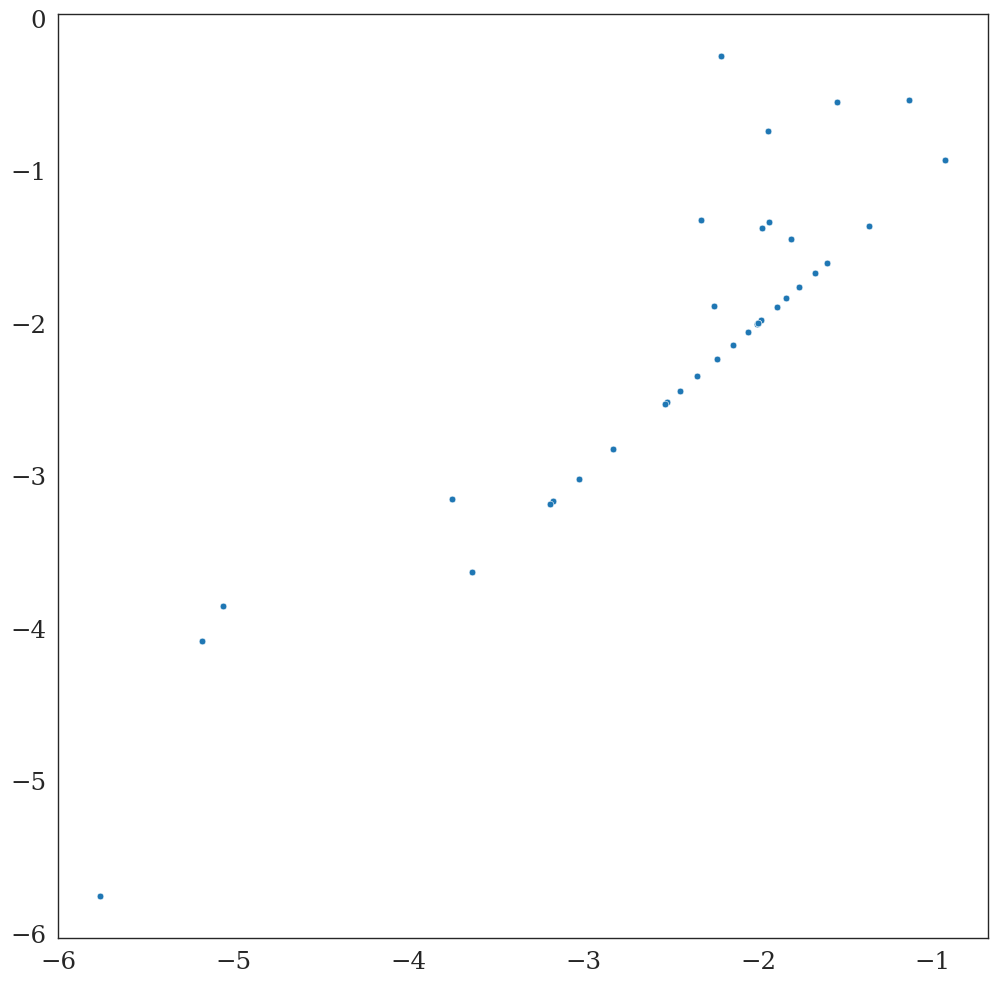

In [129]:
x = Ri_avg.copy()
y = solution_list[2]
plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y))

In [ ]:
save_dir = os.path.abspath(os.path.join(os.getcwd(), '..', 'figures', \
                            'predictions', 'leaveOneOut', \
                            f'{date_meeting}_for_paper_' + \
                            f'_Ri_fit_dynamic_with_production' + \
                            f'_cluster_metabolites_new_{nclusts}hierachClust_{microcosm_type}' + \
                            f'_pass_1to2'))
if not os.path.exists(save_dir):
   # Create a new directory because it does not exist
   os.makedirs(save_dir)
file_save = os.path.abspath(os.path.join(save_dir, 
                                         f'{date_}_for_paper_Ri_fit_dynamic_with_production' + \
                                         f'_cluster_metabolites_new_hierachClust_{microcosm_type}' + \
                                         f'_iterate_Balone_adjusted_fitted_Ri_for_uniform_dist.pickle'))

Ri_adjust_obj = {"solution_list" : solution_list, \
                 "error_traj_list" : error_traj_list}
with open(file_save, "wb") as file_:
     pickle.dump(Ri_adjust_obj, file_) 

0


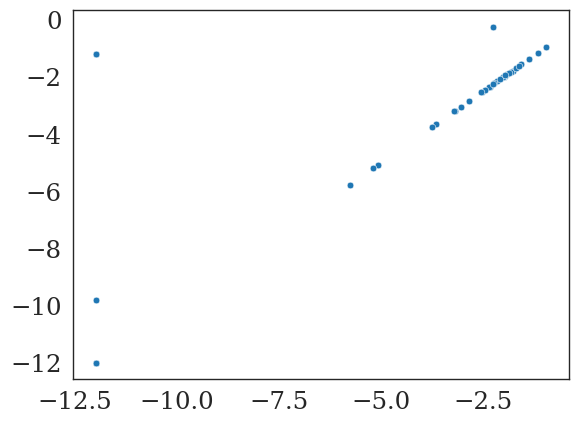

In [128]:
# y = out[0]['Ri']
x = Ri_avg.copy()
id_t = np.where(y - x > 0)[0][0]
print(id_t)
plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y))
# plt_.plot([-8, 0], [-8, 0], c="black")

In [127]:
tmp = objective_fn_new(df_speciesMetab_tmp, df_speciesMetab_prod_tmp, \
                                      Ri_avg, y.copy(), 0, p_vec_new_tmp, \
                                      df_speciesAbun_inoc_tmp, \
                                      df_speciesAbun_tmp, df_speciesAbun_prev_tmp, \
                                      df_speciesAbun_ratio_tmp, \
                                      B_alone_iter, species_names, \
                                      num_iter=10, count_p=0, pass_=2, \
                                      num_passages=6, \
                                      id_species_sensitive=id_strains_sensitive, \
                                      change_fac=0.1, iter_=rep_, Ri_max=1, \
                                      iter_max=nrepeat)
print(tmp['error'])

[1]
2.9952109598013417


[0]


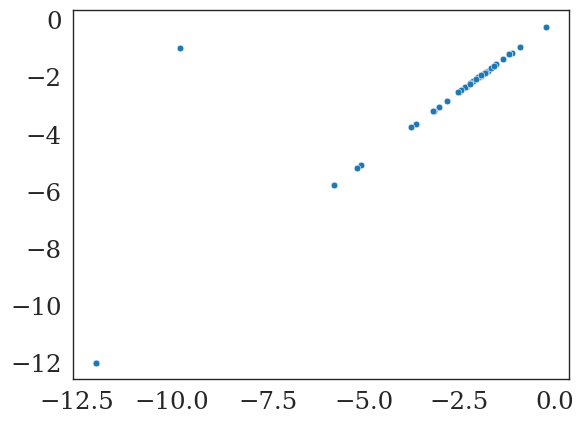

In [131]:
y1 = tmp['Ri'].copy()
x = y.copy()
id_t = np.where(y1 - x > 0)[0]
print(id_t)
plt_ = sns.scatterplot(x=np.log10(x), y=np.log10(y1))
# plt_.plot([-8, 0], [-8, 0], c="black")

In [117]:
y

array([1.61290326e-10, 1.27770185e-02, 1.72754733e-02, 1.00000000e-12,
       2.81615286e-02, 1.00000000e-12, 1.00000000e-12, 7.32414311e-02,
       1.00000000e-12, 1.00000000e-12, 1.54075879e-02, 1.00000000e-12,
       1.00000000e-12, 1.00000000e-12, 1.00000000e-12, 2.12187942e-02,
       4.75186855e-03, 1.00000000e-12, 1.00000000e-12, 2.48872934e-02,
       1.00000000e-12, 1.00000000e-12, 1.00000000e-12, 6.30957344e-02,
       1.06103129e-02, 7.15750402e-03, 1.00000000e-12, 1.00000000e-12,
       1.00000000e-12, 1.00000000e-12, 1.00000000e-12, 1.04100359e-02,
       9.88413138e-03, 1.00000000e-12, 1.00000000e-12, 1.00000000e-12,
       1.14807039e-02, 4.29597612e-02, 9.99412998e-03, 1.00000000e-12,
       1.00000000e-12, 1.00000000e-12, 9.43053617e-04, 1.00000000e-12,
       1.00000000e-12, 1.00000000e-12, 1.00000000e-12, 1.00000000e-12,
       6.74510701e-04, 1.00000000e-12, 1.00000000e-12, 4.48259602e-03,
       3.02708778e-03, 3.56464835e-03, 1.00000000e-12, 2.94641577e-03,
      

In [65]:
Ri_avg = Ri_noMicrocosm_dynamicAll_fit_joint[count_p].copy()
Ri_avg = Ri_avg[id_metabs_keep]
Ri_avg[Ri_avg <= 1e-8] = 1e-8
neighborhood_fn_tmp(Ri_avg, Ri_avg, 0, 1, \
                             1, 100, change_fac=0)

array([1.00000000e-08, 1.27770185e-02, 1.72754733e-02, 1.00000000e-08,
       2.81615286e-02, 1.00000000e-08, 1.00000000e-08, 7.32414311e-02,
       1.00000000e-08, 1.00000000e-08, 1.54075879e-02, 1.00000000e-08,
       1.00000000e-08, 1.00000000e-08, 1.00000000e-08, 2.12187942e-02,
       4.75186855e-03, 1.00000000e-08, 1.00000000e-08, 2.48872934e-02,
       1.00000000e-08, 1.00000000e-08, 1.00000000e-08, 1.00000000e-08,
       1.06103129e-02, 7.15750402e-03, 1.00000000e-08, 1.00000000e-08,
       1.00000000e-08, 1.00000000e-08, 1.00000000e-08, 1.04100359e-02,
       9.88413138e-03, 1.00000000e-08, 1.00000000e-08, 1.00000000e-08,
       1.14807039e-02, 4.29597612e-02, 9.99412998e-03, 1.00000000e-08,
       1.00000000e-08, 1.00000000e-08, 9.43053617e-04, 1.00000000e-08,
       1.00000000e-08, 1.00000000e-08, 1.00000000e-08, 1.00000000e-08,
       6.74510701e-04, 1.00000000e-08, 1.00000000e-08, 4.48259602e-03,
       3.02708778e-03, 3.56464835e-03, 1.00000000e-08, 2.94641577e-03,
      

In [62]:
Ri_avg

array([1.00000000e-08, 1.27770185e-02, 1.72754733e-02, 0.00000000e+00,
       2.81615286e-02, 0.00000000e+00, 0.00000000e+00, 7.32414311e-02,
       0.00000000e+00, 0.00000000e+00, 1.54075879e-02, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.12187942e-02,
       4.75186855e-03, 0.00000000e+00, 0.00000000e+00, 2.48872934e-02,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.06103129e-02, 7.15750402e-03, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.04100359e-02,
       9.88413138e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.14807039e-02, 4.29597612e-02, 9.99412998e-03, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 9.43053617e-04, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       6.74510701e-04, 0.00000000e+00, 0.00000000e+00, 4.48259602e-03,
       3.02708778e-03, 3.56464835e-03, 0.00000000e+00, 2.94641577e-03,
      

In [240]:
df_speciesMetab_prod_tmp

,0,1,2,3,4,5,6,7,8,9,...,88,89,90,91,92,93,94,95,96,97
Acidaminococcus fermentans DSMZ 20731,0.000000,0.156467,0.089234,0.000000,0.236531,0.273684,0.062309,0.028035,0.006083,0.238612,...,0.007579,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.038049,0.000000,0.098331
Acidaminococcus intestini D21 BEI HM-81,0.000000,0.077091,0.084898,0.000000,0.371168,0.119262,0.225280,0.518527,0.000000,0.081298,...,0.000000,2.451787,0.000000,0.0,0.000000,1.361104,0.0,0.025886,0.000000,0.132971
Anaerostipes caccae DSMZ 14662,0.000000,0.071597,0.320046,0.168923,0.000000,0.069001,0.275554,0.000000,0.038003,0.120091,...,0.000000,0.000000,0.000000,0.0,0.000000,0.119172,0.0,0.000000,0.000000,0.000000
Anaerotruncus colihominis DSMZ 17241,0.000000,0.409759,0.094265,0.033544,0.688091,0.000000,0.077099,0.056157,0.057130,0.059150,...,0.000000,0.000000,0.000000,0.0,0.000000,0.006181,0.0,0.000000,0.000000,0.000000
Bacteroides caccae ATCC 43185,2.229987,0.372708,0.022634,0.000000,0.169320,0.000000,0.178772,0.000000,0.000000,1.158365,...,0.288121,0.000000,0.000000,0.0,0.000000,0.081673,0.0,0.201926,0.098531,0.540440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ruminococcus gnavus ATCC 29149,0.110975,0.437817,0.106353,0.000000,0.138254,0.000000,0.066479,0.000000,0.000000,0.121258,...,0.000000,0.511157,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.397271,0.020863
Ruminococcus torques ATCC 27756,0.022663,0.061264,0.186354,0.000000,0.067671,0.211869,0.414005,0.099188,0.011524,0.025422,...,0.000000,0.000000,0.000000,0.0,0.011112,0.023965,0.0,0.000000,0.061713,0.049054
Slackia exigua ATCC 700122,0.000000,0.584056,0.017651,0.000000,0.133996,0.000000,0.083470,0.189299,0.123079,0.329415,...,0.114451,0.196512,0.280285,0.0,0.274244,0.032151,0.0,0.065959,0.086114,0.201766
Streptococcus thermophilus LMD-9 ATCC 19258,0.000000,0.388454,0.196085,0.000000,0.138886,0.000000,0.066524,0.154323,0.023172,0.172917,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000


In [242]:
solution = Ri_avg.copy()
solution[solution <= 1e-8] = 1e-8
tmp = objective_fn_new(df_speciesMetab_tmp, df_speciesMetab_prod_tmp, \
                                      Ri_avg, solution, 0, p_vec_new_tmp, \
                                      df_speciesAbun_inoc_tmp, \
                                      df_speciesAbun_tmp, df_speciesAbun_prev_tmp, \
                                      df_speciesAbun_ratio_tmp, \
                                      B_alone_iter, species_names, \
                                      num_iter=10, count_p=0, pass_=2, \
                                      num_passages=6, \
                                      id_species_sensitive=id_strains_sensitive, \
                                      change_fac=10, iter_=rep_, Ri_max=1, \
                                      iter_max=nrepeat)

In [245]:
tmp['pred_dist'][id_strains_insensitive]

array([1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08,
       1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08, 1.e-08,
       1.e-08, 1.e-08, 1.e-08])